# 1. Data Background and Problem Formulation

In this project, a dataset is given with 900+ data each corresponding to individual indicators of users' experience surveys revolving around proposed system designs -- and how would potential users react or perceive this notion. 

The goal is to provide a deep learning model with an acceptable rate of AUC (0.7 to 0.9) on test dataset in order to be able to predict certain words clearly.

To gain a better sense of the data, we first import the necessities to run the overall code.

---


In [174]:
# Configure output settings to prettify print display

from IPython.display import HTML, display

def set_css():
  display(HTML('''
  <style>
    pre {
        white-space: pre-wrap;
    }
  </style>
  '''))
get_ipython().events.register('pre_run_cell', set_css)

In [175]:
# Ignore warnings to prettify print

import warnings
warnings.filterwarnings("ignore")

In [176]:
!pip install scikit-multilearn
import pandas as pd
import tensorflow as tf
import numpy as np
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
import imblearn

You should consider upgrading via the 'c:\users\chari\appdata\local\programs\python\python39\python.exe -m pip install --upgrade pip' command.


In [177]:
import tensorflow as tf
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  0


##1.1. Importing the data
We can then import the data via `pandas` package to see the overall nature of the data, the outputs, and the datatypes.

In [178]:
df = pd.read_excel('Sample.xlsx', sheet_name='PROMISE-Extended_Ivan33')
df.drop(columns=['ID', 'ProjectID', 'Class'], axis=1, inplace=True)
df.sample(n=10, random_state=1)

,Requirements,obstructive<==>supportive,complicated<==>easy,inefficient<==>efficient,confusing<==>clear,boring<==>exciting,not interesting<==>interesting,conventional<==>inventive,usual<==>leading edge
718,Secure data transfer over the Internet could b...,7,5,6,6,3,4,3,3
637,The system shall validate the amount is availa...,7,6,7,7,2,3,1,1
759,Sensitive data will be encrypted before being ...,7,6,7,7,4,4,2,3
366,PME Subsystem shall allow building product men...,5,4,6,5,3,4,4,4
543,The system shall be responsive. At the DePaul ...,6,6,7,7,5,6,3,4
41,The product shall synchronize with the office ...,5,5,5,5,5,4,4,5
120,Program Administrators and Nursing Staff Membe...,6,5,6,5,5,4,3,2
725,It must be able to download the most recent me...,6,7,6,7,3,4,3,3
795,Customer must logout of the site after purchas...,3,2,3,2,1,2,4,6
672,Changes made to the Manage My ID website can b...,4,3,4,3,3,4,4,5


In [179]:
data=df.copy()
df.columns

Index(['Requirements', 'obstructive<==>supportive', 'complicated<==>easy',
       'inefficient<==>efficient', ' confusing<==>clear', 'boring<==>exciting',
       'not interesting<==>interesting', 'conventional<==>inventive',
       'usual<==>leading edge'],
      dtype='object')

In [180]:
data['mix']=data['obstructive<==>supportive']+data['complicated<==>easy']+data['inefficient<==>efficient']+data[' confusing<==>clear']+data['boring<==>exciting']+data['not interesting<==>interesting']+data['conventional<==>inventive']+data['usual<==>leading edge']

In [181]:
data.head()

,Requirements,obstructive<==>supportive,complicated<==>easy,inefficient<==>efficient,confusing<==>clear,boring<==>exciting,not interesting<==>interesting,conventional<==>inventive,usual<==>leading edge,mix
0,The system shall refresh the display every 60 ...,3,4,3,3,4,3,6,6,32
1,The application shall match the color of the s...,7,2,5,5,3,3,6,6,37
2,If projected the data must be readable. On a...,7,4,7,7,5,5,5,4,44
3,The product shall be available during normal b...,7,2,7,5,5,5,5,6,42
4,If projected the data must be understandable....,7,2,7,7,5,7,3,3,41


## 1.2. Column Definitions
### 1.2.1. Features

Features are only represented in the first column, which is the `Requirements` column. This column represents the question and/or the funcionalities of the system itself.

### 1.2.2. Labels

Labels, on the other hand, comprised of 8 columns in total. They are:
* **obstructive<==>supportive**, measuring supportiveness.
* **complicated<==>easy**, measuring ease-of-use.
* **inefficient<==>efficient**, measuring efficiency.
* **confusing<==>clear**, measuring brevity and clarity.
* **boring<==>exciting**, measuring excitement.
* **not interesting<==>interesting**, measuring appeal.
* **conventional<==>inventive**, measuring innovation.
* **usual<==>leading edge**, measuring technology usage.

The scales on the labels vary from 1 to 7, in which values closer to 1 corresponds to a more negative connotation, while values closer to 7 is likely to be more positive.

For example, for column `boring<==>exciting`, if a user gives it a 3, whilst this may seem neutral at first glance, we can infer that the user does not regard this system design as easy-to-use -- otherwise they would give it a score of 5 or 6.

For this task, we'll run multiclass multilabel regression since we obtained a good AUC with multiclass regression on one column before with simple regression. **The trick here is to not use a single column.**

With this, we might want to approach the problem within the scope of [Multi-output Regression](https://machinelearningmastery.com/deep-learning-models-for-multi-output-regression/)

First, we separate the labels from the data.

In [182]:
features = df.iloc[:, 0].values # First column in the entire set
labels = df.iloc[:, np.r_[1:9]].values
print("Features is now of type:", type(features), "with shape", features.shape)
print("Labels is now of type:", type(labels), "with shape", labels.shape)

Features is now of type: <class 'numpy.ndarray'> with shape (969,)
Labels is now of type: <class 'numpy.ndarray'> with shape (969, 8)


We know from previous work that the dataset is very much imbalanced, so we would want to try oversampling across all columns and make them our new label. But first, we would want to convert features as word vectors first.

## 1.3. Quick EDA

We can visualize the most used words via `wordcloud` used in our dataset.

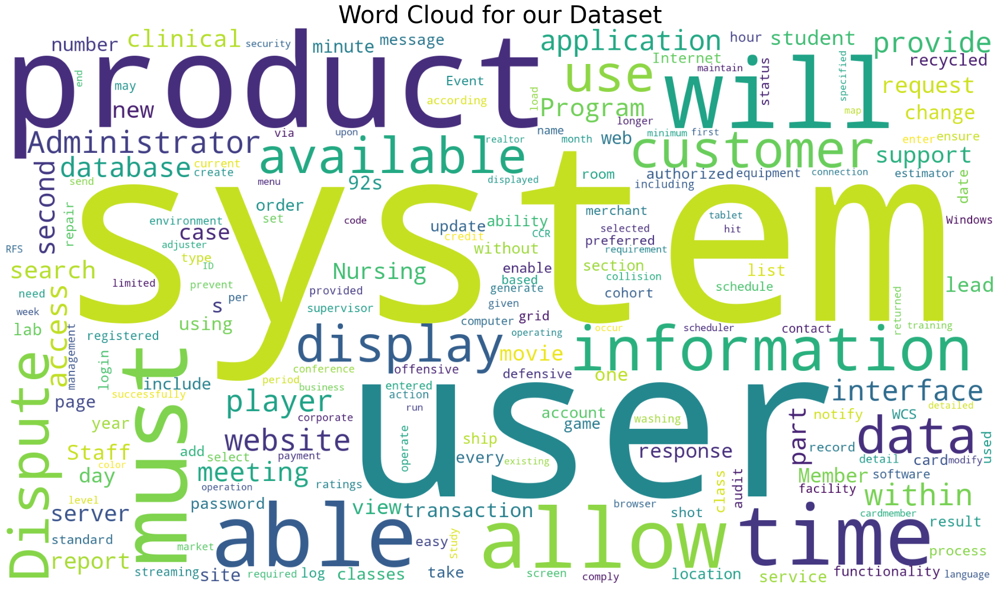

In [183]:
from matplotlib import pyplot as plt
from wordcloud import WordCloud,STOPWORDS
plt.figure(figsize=(30,20))
text =df['Requirements'].values
cloud = WordCloud(
                          stopwords=STOPWORDS,
                          background_color='white',
                          collocations=False,
                          width=1920,
                          height=1080
                         ).generate(" ".join(text))
plt.axis('off')
plt.title("Word Cloud for our Dataset",fontsize=40)
plt.imshow(cloud)

In [184]:
from collections import Counter
for i in range(8):
  print("Column:", df.columns[1:][i])
  print(Counter(labels[:,i]))

Column: obstructive<==>supportive
Counter({7: 418, 6: 281, 5: 152, 4: 63, 3: 37, 2: 16, 1: 2})
Column: complicated<==>easy
Counter({6: 278, 5: 254, 7: 210, 4: 144, 3: 57, 2: 24, 1: 2})
Column: inefficient<==>efficient
Counter({7: 406, 6: 306, 5: 128, 4: 71, 3: 36, 2: 18, 1: 4})
Column:  confusing<==>clear
Counter({7: 443, 6: 245, 5: 148, 4: 68, 3: 38, 2: 23, 1: 4})
Column: boring<==>exciting
Counter({3: 256, 4: 249, 5: 185, 2: 142, 6: 89, 7: 26, 1: 22})
Column: not interesting<==>interesting
Counter({4: 265, 3: 245, 5: 222, 2: 103, 6: 92, 7: 23, 1: 19})
Column: conventional<==>inventive
Counter({3: 273, 2: 267, 4: 164, 5: 102, 1: 101, 6: 55, 7: 7})
Column: usual<==>leading edge
Counter({3: 259, 2: 253, 4: 177, 5: 112, 1: 101, 6: 61, 7: 6})


# 2. Pre-processing
---

## 2.1. Tokenization

Tokenization means splitting each word and vectorizing a text corpus, by turning each text into either a sequence of integers (each integer being the index of a token in a dictionary). This process cleans up our text, lowercase, and remove punctuations. This step is basically the same from our previous work involving LSTMs.

This way, we can see which words appear the most in our training set.

In [185]:
tokenizer = Tokenizer(num_words = 2000, oov_token="<OOV>")
tokenizer.fit_on_texts(features)
word_index = tokenizer.word_index
dict(list(word_index.items())[:10])

{'<OOV>': 1,
 'the': 2,
 'shall': 3,
 'to': 4,
 'system': 5,
 'of': 6,
 'be': 7,
 'a': 8,
 'and': 9,
 'product': 10}

After tokenization, the next step is to turn those tokens into lists of sequence.

In [186]:

sequences = tokenizer.texts_to_sequences(features)
print(sequences[0]) # This corresponds to the first sentence in the training data.

[2, 5, 3, 674, 2, 32, 96, 675, 49]


## 2.2. Padding

When we train neural networks for NLP, we need sequences to be in the same size, that's why we use padding. Padding means that we convert all instances of the training data towards the same size. To do this, we need to specify a fixed length to transform all the instances on.

For the project, we can set the sequence by looking quickly at the average proportion of the training words.

In [187]:
import math
word_counts = []
for i in (features):
  word_counts.append(len(i.split(" ")))
print("Average word counts:" , sum(word_counts)/len(word_counts))

# Round max length of padding to the nearest tenth
max_length = math.ceil((sum(word_counts)/len(word_counts))/10) * 10
print("Padded onto length: ", max_length)

# Delete unused variable
del word_counts 

Average word counts: 18.223942208462333
Padded onto length:  20




We can then proceed to do the actual padding. This is done for all instances of the training example.

In [214]:
padded = pad_sequences(sequences, maxlen=max_length, padding='post', truncating='post')

for i in range(5):
  print("Sequence of length", len(sequences[i]), "was padded onto", len(padded[i]))

Sequence of length 9 was padded onto 20
Sequence of length 16 was padded onto 20
Sequence of length 29 was padded onto 20
Sequence of length 36 was padded onto 20
Sequence of length 35 was padded onto 20


In [215]:
padded

array([[  2,   5,   3, ...,   0,   0,   0],
       [  2,  45,   3, ...,   0,   0,   0],
       [ 69, 879,   2, ...,  17,   4, 451],
       ...,
       [  2,   1,  36, ...,  91, 309,  12],
       [  2,   5,   3, ...,   9, 102,   4],
       [  2,  36,  15, ..., 304,  15,   7]])

## 2.3. SMOTE Oversampling

Generally, oversampling makes fake data so that the minority labels are not squashed by the majority.

Constraint of using SMOTE within this dataset is that it's very fragile to classes with only one example. Since SMOTE works via k-nearest neighbors, at least two members of a class would be mandatory for it to work.

Synthetic samples generated with respect to the most amount of classes in all columns so that input shape (features and labels) are consistent against each other.

## REVISION: ROS Oversampling

ROS generates random data as opposed to the better, more superior SMOTE which generates "more credible" data. We can't use SMOTE on all sheets because of the `n_neighbors` and distance constraint.

We find the least common multiple of all class members amount, and oversample from there to get the matrix dimensions uniform.

In [216]:
import copy
from collections import defaultdict, Counter
from imblearn.over_sampling import SMOTE, RandomOverSampler
max_amount = np.lcm.reduce([1,2,3,4,5,6,7]) * 40
labels_processed = np.zeros((max_amount, 8))

for i in range(8):
  unique_classes = np.unique(df[df.columns[1:][i]])
  amount = [int(
      (max_amount/len(unique_classes)))
      ] * len(unique_classes)
  x = {k:v for (k,v) in zip(unique_classes, amount)}
  smt = RandomOverSampler(sampling_strategy=x)
  X, y = smt.fit_resample(padded, labels[:,i])
  labels_processed[:,i] = y
  print("Column", i, "done.")
  # We don't save nor use the X variable between each iteration, 
  # instead only using the last one.


print("Shape of input features is:", X.shape)
print("Shape of labels is:",labels_processed.shape)

Column 0 done.
Column 1 done.
Column 2 done.
Column 3 done.
Column 4 done.
Column 5 done.
Column 6 done.
Column 7 done.
Shape of input features is: (16800, 20)
Shape of labels is: (16800, 8)


In [217]:
# Sanity check time!
for i in range(8):
  print("For column", df.columns[1:][i])
  print(Counter(labels_processed[:,i]),"\n------")


print("First ten entries of the processed labels:\n", labels_processed[:10,:])
print("First ten entries of the processed features:\n", X[:10,:])

# Last and final assertion to catch matrix errors
try:
  assert(X.shape[0] == labels_processed.shape[0])
  print("Assertion completed!")
except AssertionError:
  print("Error!\nShape of X is", X.shape, "while labels is", labels_processed.shape)
  raise AssertionError

For column obstructive<==>supportive
Counter({3.0: 2400, 7.0: 2400, 5.0: 2400, 6.0: 2400, 2.0: 2400, 4.0: 2400, 1.0: 2400}) 
------
For column complicated<==>easy
Counter({4.0: 2400, 2.0: 2400, 3.0: 2400, 6.0: 2400, 1.0: 2400, 5.0: 2400, 7.0: 2400}) 
------
For column inefficient<==>efficient
Counter({3.0: 2400, 5.0: 2400, 7.0: 2400, 6.0: 2400, 2.0: 2400, 4.0: 2400, 1.0: 2400}) 
------
For column  confusing<==>clear
Counter({3.0: 2400, 5.0: 2400, 7.0: 2400, 6.0: 2400, 1.0: 2400, 4.0: 2400, 2.0: 2400}) 
------
For column boring<==>exciting
Counter({4.0: 2400, 3.0: 2400, 5.0: 2400, 2.0: 2400, 6.0: 2400, 7.0: 2400, 1.0: 2400}) 
------
For column not interesting<==>interesting
Counter({3.0: 2400, 5.0: 2400, 7.0: 2400, 4.0: 2400, 6.0: 2400, 2.0: 2400, 1.0: 2400}) 
------
For column conventional<==>inventive
Counter({6.0: 2400, 5.0: 2400, 3.0: 2400, 2.0: 2400, 4.0: 2400, 1.0: 2400, 7.0: 2400}) 
------
For column usual<==>leading edge
Counter({6.0: 2400, 4.0: 2400, 3.0: 2400, 2.0: 2400, 5.0: 

## 2.4. Train-test Splitting

Finally we get to this part. We can use sklearn's `train_test_split` to do the usual splitting for test set (validation set is specified within building the model in the next section).

Also, specifying `random_state` ensures reproducibility.

In [221]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, labels_processed, test_size=0.2, random_state=42)

# Sanity check again and again
print("Training examples:", X_train.shape)
print("Training labels:", y_train.shape)
print("Test examples:", X_test.shape)
print("Test labels:", y_test.shape)

Training examples: (13440, 20)
Training labels: (13440, 8)
Test examples: (3360, 20)
Test labels: (3360, 8)


In [193]:
from itertools import zip_longest # zip_longest python 3

def dadd(d1,d2):
    temp=[i+j for i,j in zip_longest(d1,d2,fillvalue=0)]
    return temp

In [194]:
data = {'metric':['Accuracy', 'Precision', 'Recall', 'F1 Score','RMSE','AUC score']}
metric_df=pd.DataFrame(data)

In [195]:
metric_df.set_index(['metric'])


""
metric
Accuracy
Precision
Recall
F1 Score
RMSE
AUC score


In [196]:
metric_df

,metric
0,Accuracy
1,Precision
2,Recall
3,F1 Score
4,RMSE
5,AUC score


# 3. Modelling

## 3.1. Building the Model

Since we're training on augmented data, we're going to approach this as conventional regression compared to the LSTM approach we're doing it before.

LSTM model in this manner would result in a pretty bad metric score (around 0.5 to 0.7 F1-score) whereas our fully-connected dense layers resulted in a pretty satisfying F1, which is around 0.8 to 1 for each column.

In [197]:
# Wrapper functions for result interpretation
from matplotlib import pyplot as plt
def plot_graphs(history, string):
  plt.plot(history.history[string])
  plt.plot(history.history['val_'+string])
  plt.xlabel("Epochs")
  plt.ylabel(string)
  plt.legend([string, 'val_'+string])
  plt.show()

def transform_results(estimates):
  res = []
  for x in estimates:
    if x > 7:
      x = 7
      res.append(x)
    else:
      res.append(x)
  return res

In [198]:
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import classification_report
initializer = tf.keras.initializers.RandomNormal(seed=1) # Reproducibility

model = Sequential(name="classifier_NN")
model.add(tf.keras.Input(shape=(X_train.shape[1],))) # Automatically detect features as input nodes
model.add(layers.Dense(256, activation='relu', kernel_initializer=initializer))
#model.add(layers.Dropout(0.1))
model.add(layers.Dense(256, activation='relu', kernel_initializer=initializer))
#model.add(layers.Dropout(0.1))
model.add(layers.Dense(256, activation='relu', kernel_initializer=initializer))
model.add(layers.Dropout(0.1))
model.add(layers.Dense(256, activation='relu', kernel_initializer=initializer))
model.add(layers.Dropout(0.1))
model.add(layers.Dense(128, activation='relu', kernel_initializer=initializer))
model.add(layers.Dropout(0.1))
model.add(layers.Dense(128, activation='relu', kernel_initializer=initializer))
model.add(layers.Dropout(0.1))
model.add(layers.Dense(128, activation='relu', kernel_initializer=initializer))
model.add(layers.Dropout(0.15))
model.add(layers.Dense(8)) # output layer
opt = tf.keras.optimizers.Adam(learning_rate = 0.0005)
model.compile(loss=tf.keras.losses.MeanSquaredError(), metrics=['mae'], optimizer = opt)
model.summary()

Model: "classifier_NN"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 256)               5376      
_________________________________________________________________
dense_1 (Dense)              (None, 256)               65792     
_________________________________________________________________
dense_2 (Dense)              (None, 256)               65792     
_________________________________________________________________
dropout (Dropout)            (None, 256)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 256)               65792     
_________________________________________________________________
dropout_1 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_4 (Dense)              (None, 128)             

Epoch 1/150
588/588 - 2s - loss: 4.3088 - mae: 1.6189 - val_loss: 2.5222 - val_mae: 1.2407
Epoch 2/150
588/588 - 1s - loss: 2.1643 - mae: 1.1691 - val_loss: 1.4966 - val_mae: 0.9546
Epoch 3/150
588/588 - 1s - loss: 1.5526 - mae: 0.9589 - val_loss: 1.2823 - val_mae: 0.8814
Epoch 4/150
588/588 - 1s - loss: 1.3620 - mae: 0.8787 - val_loss: 1.1585 - val_mae: 0.8097
Epoch 5/150
588/588 - 1s - loss: 1.2161 - mae: 0.8130 - val_loss: 0.9170 - val_mae: 0.6753
Epoch 6/150
588/588 - 1s - loss: 1.1209 - mae: 0.7679 - val_loss: 0.9481 - val_mae: 0.7121
Epoch 7/150
588/588 - 1s - loss: 1.0646 - mae: 0.7409 - val_loss: 0.7758 - val_mae: 0.6273
Epoch 8/150
588/588 - 1s - loss: 0.9772 - mae: 0.6925 - val_loss: 0.7230 - val_mae: 0.5749
Epoch 9/150
588/588 - 1s - loss: 0.9284 - mae: 0.6660 - val_loss: 0.7902 - val_mae: 0.5934
Epoch 10/150
588/588 - 1s - loss: 0.9403 - mae: 0.6735 - val_loss: 0.8481 - val_mae: 0.6493
Epoch 11/150
588/588 - 1s - loss: 0.8922 - mae: 0.6468 - val_loss: 0.7343 - val_mae: 0.57

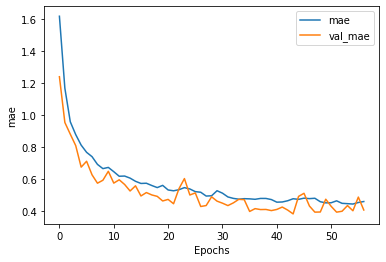

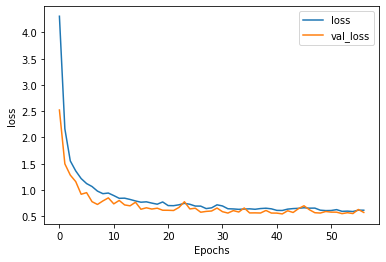

In [199]:
es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=15)
history = model.fit(X_train, y_train, epochs=150, batch_size = 16, validation_split=0.3, 
                    callbacks = [es], # Call checkpoint variable if neccessary
                    verbose=2)

plot_graphs(history, "mae")
plot_graphs(history, "loss")

## 3.2. Result Interpretation and Evaluation

Here we evaluate on `y_test`, which we made sure earlier comes from a similar distribution within the training set itself. 

Resulted on a pretty confident `mae` and `mse`, which I would say a good result considering the number of classes we have.

In [200]:
scores = model.evaluate(
    X_test, y_test, batch_size=1, verbose=1, sample_weight=None, steps=None,
    callbacks=None, max_queue_size=10, workers=4, use_multiprocessing=False,
    return_dict=False
)
print("------------------ EVALUATION FINISHED! ------------------".center(115))
for i in range(len(scores)):
    print("%s: %.2f%%" % (model.metrics_names[i], scores[i]*100))

3360/3360 [==============================] - 3s 828us/step - loss: 0.5707 - mae: 0.4053 1s - loss: 0
                             ------------------ EVALUATION FINISHED! ------------------                            
loss: 57.07%
mae: 40.53%


# 3.3. Prepare the Plotting Set

Due to the multi-dimensional nature of our results and test set, we need to reshape the predictions by using `numpy`'s `flatten()` attribute, which flattens the array column-wise if we specify the argument `order='F'` to flatten in Fortran-style order.

Keep in mind this will indeed aggregate the metrics like on the `classification_report()` below.

In [201]:
y_pred = model.predict(X_test)
y_pred_flattened = y_pred.flatten(order='F')
y_test_flattened = y_test.flatten(order='F')
y_classified = [round(float(x)) for x in y_pred_flattened]

print("First ten examples of the test set:")
print("Truth labels:", y_test_flattened[:10])
print("Predicted labels:",y_classified[:10])
print("Overall performance on all columns:\n", classification_report(y_test_flattened, y_classified))

First ten examples of the test set:
Truth labels: [2. 1. 2. 1. 4. 3. 4. 3. 3. 7.]
Predicted labels: [2, 1, 2, 1, 5, 4, 4, 3, 4, 3]
Overall performance on all columns:
               precision    recall  f1-score   support

         1.0       0.94      0.92      0.93      3691
         2.0       0.80      0.66      0.72      3921
         3.0       0.64      0.70      0.67      3952
         4.0       0.67      0.76      0.71      4161
         5.0       0.73      0.78      0.75      3786
         6.0       0.86      0.77      0.81      3748
         7.0       0.92      0.91      0.92      3621

    accuracy                           0.78     26880
   macro avg       0.79      0.79      0.79     26880
weighted avg       0.79      0.78      0.78     26880



In [202]:
# Wrapper function(s) from earlier notebook
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import roc_curve, auc,roc_auc_score
import seaborn as sns
import matplotlib.pyplot as plt

avgroc=dict()

def plot_multiclass_roc_avg(fpr,tpr,n_classes,figsize=(17, 6)):
  roc_auc = dict()
  target_names = [1,2,3,4,5,6,7]
  for i in range(n_classes):
      roc_auc[i] = auc(fpr[i], tpr[i])
  fig, ax = plt.subplots(figsize=figsize)
  ax.plot([0, 1], [0, 1], 'k--')
  ax.set_xlim([0.0, 1.0])
  ax.set_ylim([0.0, 1.05])
  ax.set_xlabel('False Positive Rate')
  ax.set_ylabel('True Positive Rate')
  ax.set_title('Receiver operating characteristic')
    
  for i in range(len(target_names)):
    ax.plot(fpr[i], tpr[i], label='ROC curve (area = %0.2f) for %s' % (roc_auc[i], target_names[i]))
  
  ax.legend(loc="best")
  ax.grid(alpha=.4)
  sns.despine()
  plt.show()


def plot_multiclass_roc(clf, X_test, y_test, n_classes, figsize=(17, 6)):
  """
  Modified function behavior, now predicts column-wise
  """
  y_score = clf.predict_proba(X_test)
  target_names = np.unique(y_test)
  # structures
  fpr = dict()
  tpr = dict()
  roc_auc = dict()

  # calculate dummies once
  y_test_dummies = pd.get_dummies(y_test, drop_first=False).values
  print(y_test_dummies.shape, y_score.shape)
  for i in range(n_classes):
      fpr[i], tpr[i], _ = roc_curve(y_test_dummies[:, i], y_score[:, i])
      roc_auc[i] = auc(fpr[i], tpr[i])

      
# roc for each class
  fig, ax = plt.subplots(figsize=figsize)
  ax.plot([0, 1], [0, 1], 'k--')
  ax.set_xlim([0.0, 1.0])
  ax.set_ylim([0.0, 1.05])
  ax.set_xlabel('False Positive Rate')
  ax.set_ylabel('True Positive Rate')
  ax.set_title('Receiver operating characteristic')
    
  for i in range(len(target_names)):
    ax.plot(fpr[i], tpr[i], label='ROC curve (area = %0.2f) for %s' % (roc_auc[i], target_names[i]))
  
  ax.legend(loc="best")
  ax.grid(alpha=.4)
  sns.despine()
  plt.show()

  return fpr,tpr

def plot_multiclass_roc_LSTM(X_test, y_test, n_classes, figsize=(17, 6), model=model):
  """
  Custom-made function to plot ROC curve.
  Sorry I can't run because I don't have the excel file used for this particular notebook.
  """
  y_score = to_categorical(y_test)
  target_names = ["obstructive vs supportive",
                  "complicated vs easy",
                  "inefficient vs efficient",
                  " confusing vs clear",
                  "boring vs exciting",
                  "not interesting vs interesting",
                  "conventional vs inventive",
                  "usual vs leading edge"]
  # structures
  fpr = dict()
  tpr = dict()
  roc_auc = dict()
 
  # One-liner transformation of our existing result 
  y_test_dummies = np.pad(pd.get_dummies(y_classified, drop_first=False).values, 
                          ((0,0), 
                           (min(labels.flatten()),0)))
  print(y_test_dummies.shape, y_score.shape) # Quick debug purposes after one-hot encoding
                                             # to ensure matrix dimension is right
  for i in range(1, n_classes):
      fpr[i], tpr[i], _ = roc_curve(y_test_dummies[:, i], y_score[:, i])
      roc_auc[i] = auc(fpr[i], tpr[i])
  
# roc for each class
  fig, ax = plt.subplots(figsize=figsize)
  ax.plot([0, 1], [0, 1], 'k--')
  ax.set_xlim([0.0, 1.0])
  ax.set_ylim([0.0, 1.05])
  ax.set_xlabel('False Positive Rate')
  ax.set_ylabel('True Positive Rate')
  ax.set_title('Column-wise Receiver Operating Characteristic Plot')
    
  for i in range(1, len(target_names)):
    ax.plot(fpr[i], tpr[i], label='ROC curve (area = %0.2f) for %s' % (roc_auc[i], target_names[i]))
  
  ax.legend(loc="best")
  ax.grid(alpha=.4)
  sns.despine()
  plt.show()


# plot_multiclass_roc_LSTM(X_test, y_classified, 8, figsize=(17, 6))

ROC AUC score: 0.8729427996308304


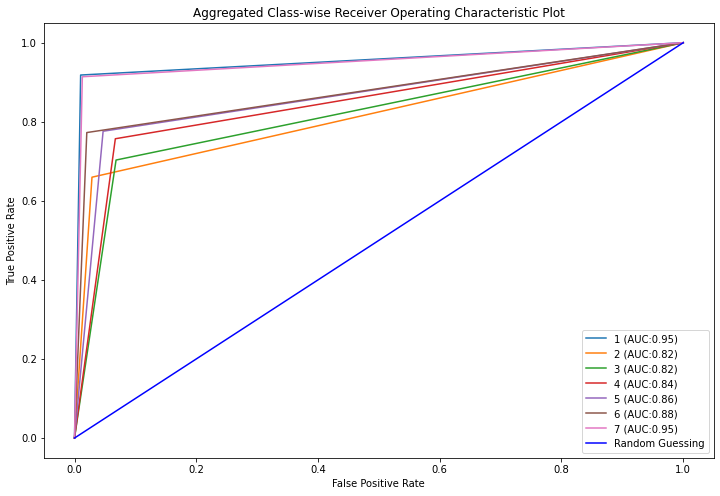

In [203]:
from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import roc_curve, auc, roc_auc_score


def score_auc(y_test, y_pred, average="weighted"):
    lb = LabelBinarizer()
    lb.fit(y_test)
    y_test = lb.transform(y_test)
    y_pred = lb.transform(y_pred)
    return roc_auc_score(y_test, y_pred, average=average)

fig, c_ax = plt.subplots(1,1, figsize = (12, 8))
def multiclass_roc_auc_score(y_test, y_pred, average="weighted"):
    lb = LabelBinarizer()
    lb.fit(y_test)
    y_test = lb.transform(y_test)
    y_pred = lb.transform(y_pred)

    for (idx, c_label) in enumerate(set(labels.flatten())):
        fpr, tpr, thresholds = roc_curve(y_test[:,idx].astype(int), y_pred[:,idx])
        c_ax.plot(fpr, tpr, label = '%s (AUC:%0.2f)'  % (c_label, auc(fpr, tpr)))
    c_ax.plot(fpr, fpr, 'b-', label = 'Random Guessing')
    return roc_auc_score(y_test, y_pred, average=average)

print('ROC AUC score:', multiclass_roc_auc_score(y_test_flattened, y_classified))
c_ax.legend()
c_ax.set_xlabel('False Positive Rate')
c_ax.set_ylabel('True Positive Rate')
c_ax.set_title('Aggregated Class-wise Receiver Operating Characteristic Plot')
plt.savefig("auc.png")
plt.show()

In [204]:
from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import plot_confusion_matrix, accuracy_score
from sklearn.metrics import mean_squared_error
acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]

We can also print classification report from each column.

In [205]:
from sklearn.metrics import classification_report, f1_score
y_pred = model.predict(X_test)
for i in range(8):
    print("Column", df.columns[1:][i])
    estimates = [round(float(x)) for x in y_pred[:,i]]
    estimates = transform_results(estimates)
    print(np.unique(estimates))
    acc.append(accuracy_score(y_test[:,i], estimates))
    pre.append(precision_score(y_test[:,i], estimates,average='weighted'))
    recal.append(recall_score(y_test[:,i], estimates,average='weighted'))
    f1.append(f1_score(y_test[:,i], estimates,average='weighted'))
    rms.append(np.sqrt(mean_squared_error(y_test[:,i], estimates)))
    aucscore.append(score_auc(y_test[:,i], estimates))
    print(classification_report(y_test[:,i], estimates), "\n------")

Column obstructive<==>supportive
[1 2 3 4 5 6 7]
              precision    recall  f1-score   support

         1.0       0.94      0.89      0.91       462
         2.0       0.74      0.55      0.63       482
         3.0       0.56      0.65      0.60       510
         4.0       0.58      0.68      0.62       517
         5.0       0.59      0.62      0.60       467
         6.0       0.73      0.62      0.67       470
         7.0       0.82      0.81      0.82       452

    accuracy                           0.69      3360
   macro avg       0.71      0.69      0.69      3360
weighted avg       0.70      0.69      0.69      3360
 
------
Column complicated<==>easy
[1 2 3 4 5 6 7]
              precision    recall  f1-score   support

         1.0       0.94      0.91      0.92       463
         2.0       0.78      0.63      0.70       485
         3.0       0.60      0.67      0.63       501
         4.0       0.61      0.68      0.64       515
         5.0       0.64      0.7

In [207]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE -score :{}".format(np.mean(rms)))
print("average AUC -score :{}".format(np.mean(aucscore)))
metric_df['Neural network classifier'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.7830357142857143
average Precision :0.7901305109362833
average Recall :0.7830357142857143
average F1 -score :0.7842609034772485
average RMSE -score :0.727858080033591
average AUC -score :0.8729351450940158


## 3.4. Exporting the Model

We can export the model to `HDF5` format designed to store large amounts of information. More info:
* [Wikipedia](https://en.wikipedia.org/wiki/Hierarchical_Data_Format)
* [TensorFlow Documentation](https://www.tensorflow.org/tutorials/keras/save_and_load#hdf5_format)

In [35]:
model.save('UX_Regression.h5')

In [36]:

ffpo=dict()
ttpo=dict()
temp=[]


## 3.5. XGB Method
For comparison, we try implementing XGB.

For column: obstructive<==>supportive
[00:02:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96       462
         2.0       0.82      0.88      0.85       482
         3.0       0.73      0.70      0.72       510
         4.0       0.68      0.66      0.67       517
         5.0       0.66      0.66      0.66       467
         6.0       0.73      0.72      0.72       470
         7.0       0.82      0.81      0.82       452

    accuracy                           0.77      3360
   macro avg       0.77      0.77      0.77      3360
weighted avg       0.77      0.77      0.77      3360

Confusion Matrix: 
 [[442  20   0   0   0   0   0]
 [ 

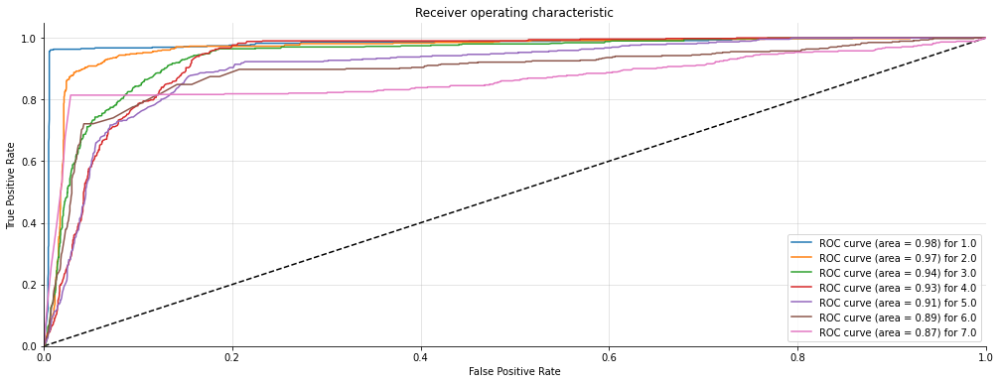

For column: complicated<==>easy
[00:02:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
              precision    recall  f1-score   support

         1.0       0.96      0.95      0.96       463
         2.0       0.81      0.88      0.84       485
         3.0       0.73      0.71      0.72       501
         4.0       0.70      0.66      0.68       515
         5.0       0.71      0.75      0.73       460
         6.0       0.83      0.79      0.81       484
         7.0       0.90      0.90      0.90       452

    accuracy                           0.80      3360
   macro avg       0.81      0.81      0.81      3360
weighted avg       0.80      0.80      0.80      3360

Confusion Matrix: 
 [[442  20   0   0   0   1   0]
 [  1 426

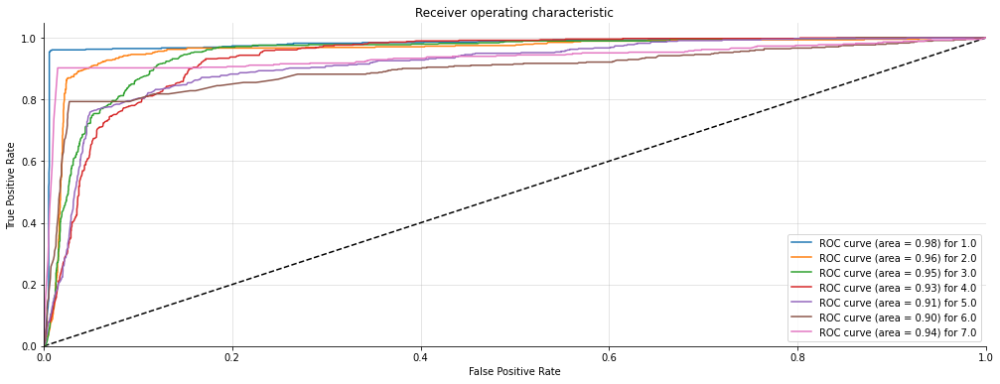

For column: inefficient<==>efficient
[00:02:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96       462
         2.0       0.81      0.88      0.85       482
         3.0       0.73      0.70      0.72       506
         4.0       0.68      0.64      0.66       526
         5.0       0.65      0.68      0.66       458
         6.0       0.73      0.71      0.72       475
         7.0       0.83      0.83      0.83       451

    accuracy                           0.77      3360
   macro avg       0.77      0.77      0.77      3360
weighted avg       0.77      0.77      0.77      3360

Confusion Matrix: 
 [[442  19   0   0   0   1   0]
 [  

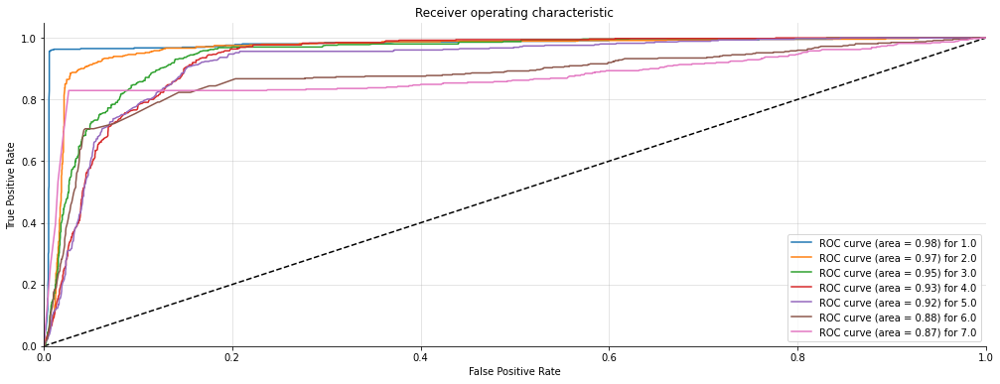

For column:  confusing<==>clear
[00:02:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96       461
         2.0       0.81      0.87      0.84       488
         3.0       0.72      0.69      0.71       506
         4.0       0.67      0.65      0.66       516
         5.0       0.66      0.68      0.67       456
         6.0       0.73      0.72      0.73       471
         7.0       0.80      0.79      0.79       462

    accuracy                           0.77      3360
   macro avg       0.77      0.77      0.77      3360
weighted avg       0.76      0.77      0.76      3360

Confusion Matrix: 
 [[442  19   0   0   0   0   0]
 [  1 426

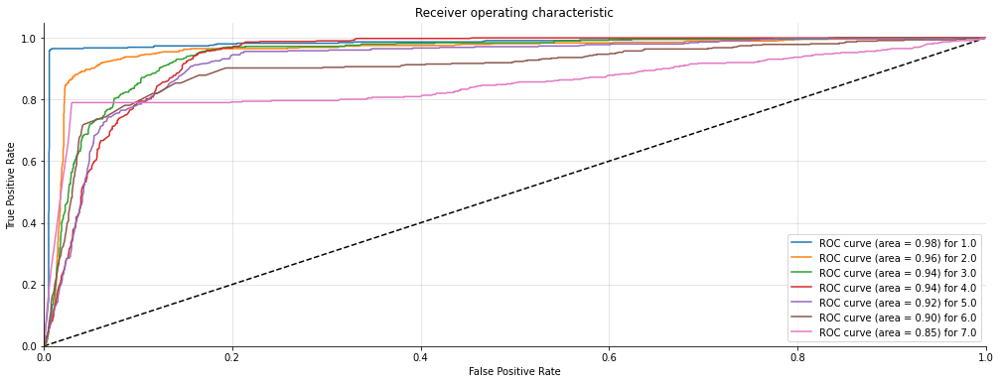

For column: boring<==>exciting
[00:02:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
              precision    recall  f1-score   support

         1.0       0.96      0.95      0.96       463
         2.0       0.87      0.88      0.88       491
         3.0       0.83      0.82      0.82       487
         4.0       0.86      0.87      0.87       518
         5.0       0.91      0.92      0.92       487
         6.0       0.96      0.96      0.96       462
         7.0       0.99      0.99      0.99       452

    accuracy                           0.91      3360
   macro avg       0.91      0.91      0.91      3360
weighted avg       0.91      0.91      0.91      3360

Confusion Matrix: 
 [[442  18   1   0   1   1   0]
 [  5 431 

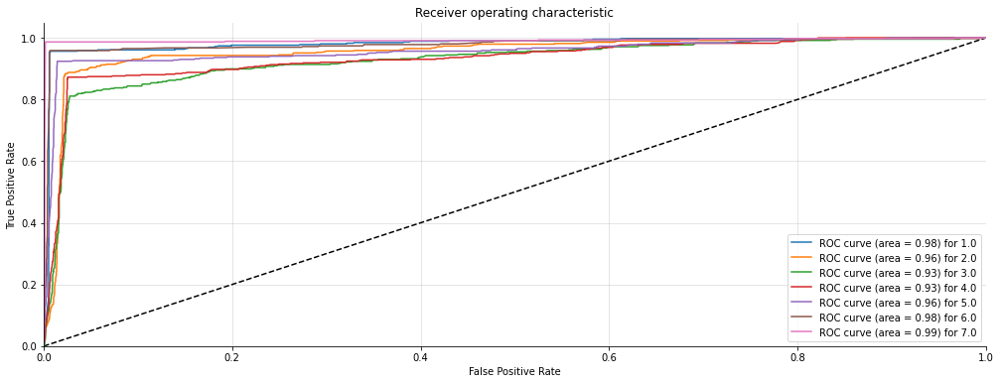

For column: not interesting<==>interesting
[00:02:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96       461
         2.0       0.86      0.86      0.86       495
         3.0       0.80      0.79      0.80       490
         4.0       0.83      0.83      0.83       519
         5.0       0.89      0.91      0.90       481
         6.0       0.96      0.96      0.96       465
         7.0       0.99      0.99      0.99       449

    accuracy                           0.90      3360
   macro avg       0.90      0.90      0.90      3360
weighted avg       0.90      0.90      0.90      3360

Confusion Matrix: 
 [[442  18   1   0   0   0   0

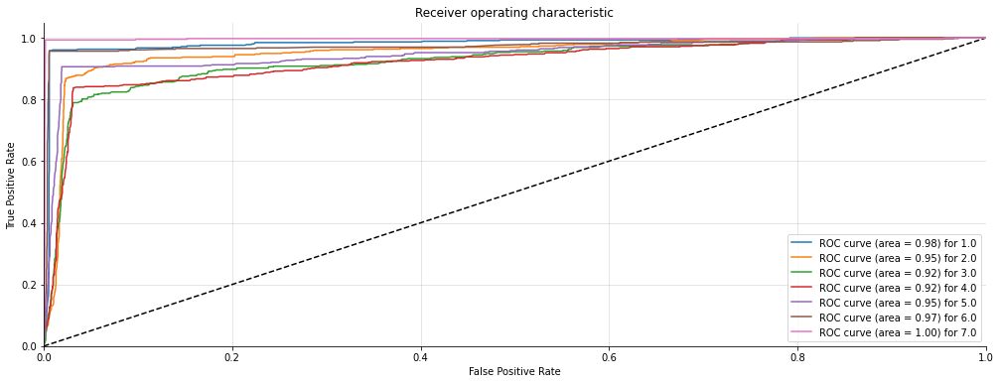

For column: conventional<==>inventive
[00:02:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
              precision    recall  f1-score   support

         1.0       0.99      0.99      0.99       460
         2.0       0.96      0.95      0.96       502
         3.0       0.94      0.95      0.94       474
         4.0       0.96      0.95      0.95       527
         5.0       0.97      0.98      0.97       486
         6.0       0.98      0.99      0.99       459
         7.0       1.00      1.00      1.00       452

    accuracy                           0.97      3360
   macro avg       0.97      0.97      0.97      3360
weighted avg       0.97      0.97      0.97      3360

Confusion Matrix: 
 [[454   6   0   0   0   0   0]
 [ 

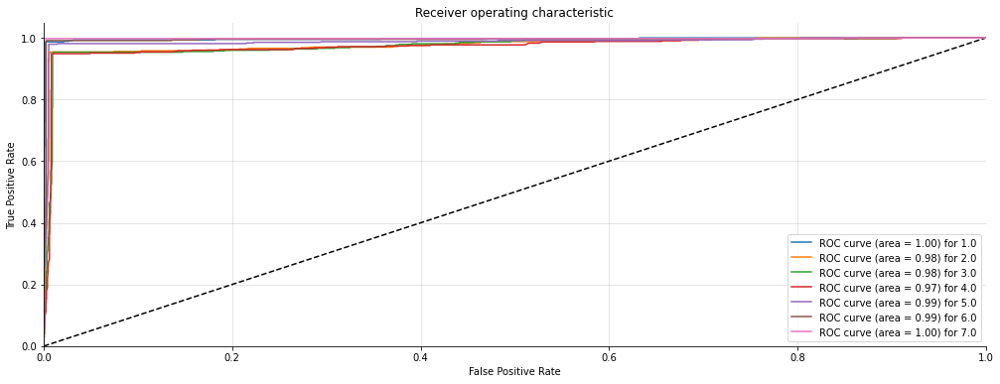

For column: usual<==>leading edge
[00:02:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
              precision    recall  f1-score   support

         1.0       1.00      1.00      1.00       459
         2.0       1.00      1.00      1.00       496
         3.0       1.00      1.00      1.00       478
         4.0       1.00      1.00      1.00       523
         5.0       1.00      1.00      1.00       491
         6.0       1.00      1.00      1.00       462
         7.0       1.00      1.00      1.00       451

    accuracy                           1.00      3360
   macro avg       1.00      1.00      1.00      3360
weighted avg       1.00      1.00      1.00      3360

Confusion Matrix: 
 [[459   0   0   0   0   0   0]
 [  0 4

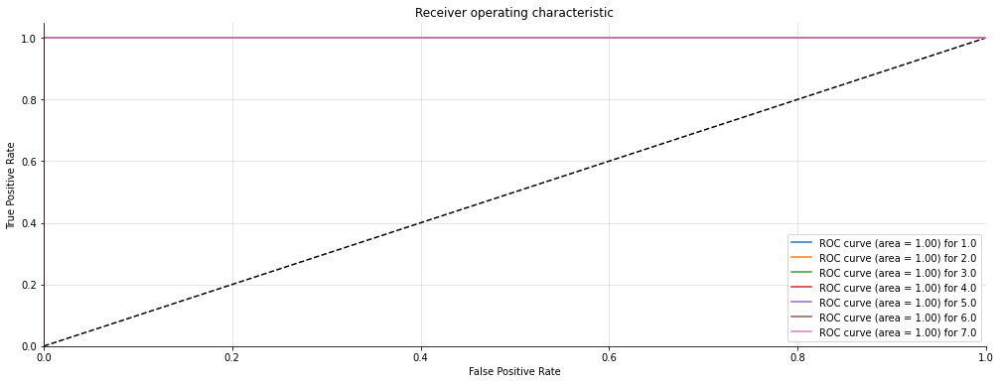

In [107]:
from xgboost import XGBClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import plot_confusion_matrix, accuracy_score
from sklearn.metrics import mean_squared_error
from operator import add




acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]
fpo=dict()
tpo=dict()
ffpo=[]
ttpo=[]
def XGBmodel(X_train, X_test, y_train, y_test, n_classes,ffpo,ttpo, figsize=(8, 6)):
    xgb_classifier = XGBClassifier()
    xgb_classifier.fit(X_train, y_train)

    # predictions over test set
    predictions = [round(float(x)) for x in xgb_classifier.predict(X_test)]
    print((classification_report(y_test, predictions)))


    # calculating Accuracy Score, Precision Score, Recall Score and F1 Score
    print('Confusion Matrix: \n' ,confusion_matrix(y_test, predictions))
    acc.append(accuracy_score(y_test, predictions))
    print(f'Accuracy Score : {accuracy_score(y_test, predictions)}')
    pre.append(precision_score(y_test,predictions,average='weighted'))
    print('Precision Score : ' + str(precision_score(y_test,predictions,average='weighted')))
    recal.append(recall_score(y_test,predictions,average='weighted'))
    print('Recall Score : ' + str(recall_score(y_test,predictions,average='weighted')))
    f1.append(f1_score(y_test,predictions,average='weighted'))
    print('F1 Score : ' + str(f1_score(y_test,predictions,average='weighted')))
    rms.append(np.sqrt(mean_squared_error(y_test,predictions)))
    aucscore.append(score_auc(y_test,predictions))
    fpo,tpo=plot_multiclass_roc(xgb_classifier, X_test, y_test, n_classes)
    ffpo.append(fpo)
    ttpo.append(tpo)
    
for i in range(8):
  print('For column:', df.columns[1:][i])
  n_classes = len(np.unique(df[df.columns[1:][i]]))
  XGBmodel(X_train, X_test, y_train[:,i], y_test[:,i], n_classes,ffpo,ttpo, figsize=(8, 6))


In [ ]:
def fsum(o):
  a= []

  for x in df.columns[1:]:
      k = df[x].unique()
      k = sorted(k)
  
      if o in k:
        i = df.columns.get_loc(x)
        j = k.index(o)      
        a.append(ffpo[i-1][j])
  if len(a)>2:
    for x in range(len(a)) :
      k = dadd(a[x],a[x+1])
      k = dadd(k,a[x+2])
      if x+2 == len(a)-1:
        break
    k = list(np.array(k)/len(a))
  elif len(a) == 2:
    k = dadd(a[0],a[1])
    k = list(np.array(k)/len(a))
  else:
    k = a
  return k

In [ ]:
fsum0=list(np.array(dadd(dadd(dadd(ffpo[0][0],ffpo[1][0]),dadd(ffpo[2][0],ffpo[3][0])),dadd(dadd(ffpo[4][0],ffpo[5][0]),dadd(ffpo[6][0],ffpo[7][0]))))/8)
fsum1=list(np.array(dadd(dadd(dadd(ffpo[0][1],ffpo[1][1]),dadd(ffpo[2][1],ffpo[3][1])),dadd(dadd(ffpo[4][1],ffpo[5][1]),dadd(ffpo[6][1],ffpo[7][1]))))/8)
fsum2=list(np.array(dadd(dadd(dadd(ffpo[0][2],ffpo[1][2]),dadd(ffpo[2][2],ffpo[3][2])),dadd(dadd(ffpo[4][2],ffpo[5][2]),dadd(ffpo[6][2],ffpo[7][2]))))/8)
fsum3=list(np.array(dadd(dadd(dadd(ffpo[0][3],ffpo[1][3]),dadd(ffpo[2][3],ffpo[3][3])),dadd(dadd(ffpo[4][3],ffpo[5][3]),dadd(ffpo[6][3],ffpo[7][3]))))/8)
fsum4=list(np.array(dadd(dadd(dadd(ffpo[0][4],ffpo[1][4]),dadd(ffpo[2][4],ffpo[3][4])),dadd(dadd(ffpo[4][4],ffpo[5][4]),dadd(ffpo[6][4],ffpo[7][4]))))/8)
fsum5=list(np.array(dadd(dadd(dadd(ffpo[0][4],ffpo[1][5]),dadd(ffpo[2][5],ffpo[3][5])),dadd(dadd(ffpo[4][5],ffpo[5][5]),dadd(ffpo[6][5],ffpo[7][5]))))/8)
fsum6=list(np.array(dadd(dadd(dadd(ffpo[0][6],ffpo[1][6]),dadd(ffpo[2][6],ffpo[3][6])),dadd(dadd(ffpo[4][6],ffpo[5][6]),dadd(ffpo[6][6],ffpo[7][6]))))/8)

fpr=dict()

fsum0.sort()
fpr[0]=fsum0
fsum1.sort()
fpr[1]=fsum1
fsum2.sort()
fpr[2]=fsum2
fsum3.sort()
fpr[3]=fsum3
fsum4.sort()
fpr[4]=fsum4
fsum5.sort()
fpr[5]=fsum5
fsum6.sort()
fpr[6]=fsum6


tsum0=list(np.array(dadd(dadd(dadd(ttpo[0][0],ttpo[1][0]),dadd(ttpo[2][0],ttpo[3][0])),dadd(dadd(ttpo[4][0],ttpo[5][0]),dadd(ttpo[6][0],ttpo[7][0]))))/8)
tsum1=list(np.array(dadd(dadd(dadd(ttpo[0][1],ttpo[1][1]),dadd(ttpo[2][1],ttpo[3][1])),dadd(dadd(ttpo[4][1],ttpo[5][1]),dadd(ttpo[6][1],ttpo[7][1]))))/8)
tsum2=list(np.array(dadd(dadd(dadd(ttpo[0][2],ttpo[1][2]),dadd(ttpo[2][2],ttpo[3][2])),dadd(dadd(ttpo[4][2],ttpo[5][2]),dadd(ttpo[6][2],ttpo[7][2]))))/8)
tsum3=list(np.array(dadd(dadd(dadd(ttpo[0][3],ttpo[1][3]),dadd(ttpo[2][3],ttpo[3][3])),dadd(dadd(ttpo[4][3],ttpo[5][3]),dadd(ttpo[6][3],ttpo[7][3]))))/8)
tsum4=list(np.array(dadd(dadd(dadd(ttpo[0][4],ttpo[1][4]),dadd(ttpo[2][4],ttpo[3][4])),dadd(dadd(ttpo[4][4],ttpo[5][4]),dadd(ttpo[6][4],ttpo[7][4]))))/8)
tsum5=list(np.array(dadd(dadd(dadd(ttpo[0][4],ttpo[1][5]),dadd(ttpo[2][5],ttpo[3][5])),dadd(dadd(ttpo[4][5],ttpo[5][5]),dadd(ttpo[6][5],ttpo[7][5]))))/8)
tsum6=list(np.array(dadd(dadd(dadd(ttpo[0][6],ttpo[1][6]),dadd(ttpo[2][6],ttpo[3][6])),dadd(dadd(ttpo[4][6],ttpo[5][6]),dadd(ttpo[6][6],ttpo[7][6]))))/8)

tpr=dict()

tsum0.sort()
tpr[0]=tsum0
tsum1.sort()
tpr[1]=tsum1
tsum2.sort()
tpr[2]=tsum2
tsum3.sort()
tpr[3]=tsum3
tsum4.sort()
tpr[4]=tsum4
tsum5.sort()
tpr[5]=tsum5
tsum6.sort()
tpr[6]=tsum6

plot_multiclass_roc_avg(fpr,tpr,7)

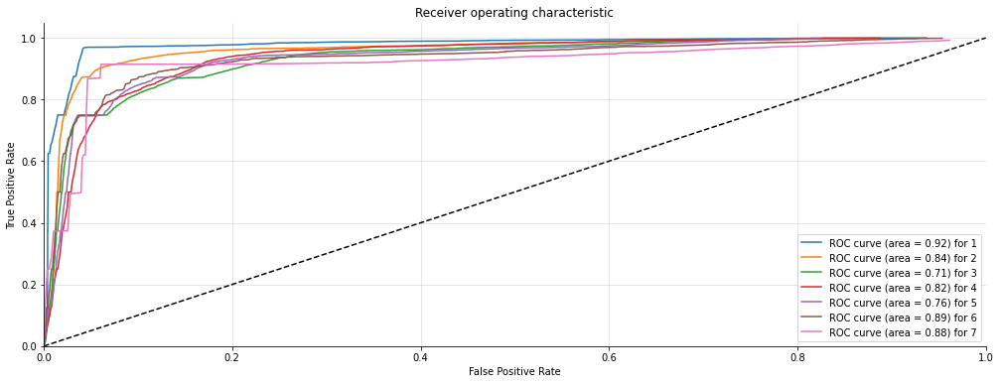

In [108]:
fsum0=list(np.array(dadd(dadd(dadd(ffpo[0][0],ffpo[1][0]),dadd(ffpo[2][0],ffpo[3][0])),dadd(dadd(ffpo[4][0],ffpo[5][0]),dadd(ffpo[6][0],ffpo[7][0]))))/8)
fsum1=list(np.array(dadd(dadd(dadd(ffpo[0][1],ffpo[1][1]),dadd(ffpo[2][1],ffpo[3][1])),dadd(dadd(ffpo[4][1],ffpo[5][1]),dadd(ffpo[6][1],ffpo[7][1]))))/8)
fsum2=list(np.array(dadd(dadd(dadd(ffpo[0][2],ffpo[1][2]),dadd(ffpo[2][2],ffpo[3][2])),dadd(dadd(ffpo[4][2],ffpo[5][2]),dadd(ffpo[6][2],ffpo[7][2]))))/8)
fsum3=list(np.array(dadd(dadd(dadd(ffpo[0][3],ffpo[1][3]),dadd(ffpo[2][3],ffpo[3][3])),dadd(dadd(ffpo[4][3],ffpo[5][3]),dadd(ffpo[6][3],ffpo[7][3]))))/8)
fsum4=list(np.array(dadd(dadd(dadd(ffpo[0][4],ffpo[1][4]),dadd(ffpo[2][4],ffpo[3][4])),dadd(dadd(ffpo[4][4],ffpo[5][4]),dadd(ffpo[6][4],ffpo[7][4]))))/8)
fsum5=list(np.array(dadd(dadd(dadd(ffpo[0][4],ffpo[1][5]),dadd(ffpo[2][5],ffpo[3][5])),dadd(dadd(ffpo[4][5],ffpo[5][5]),dadd(ffpo[6][5],ffpo[7][5]))))/8)
fsum6=list(np.array(dadd(dadd(dadd(ffpo[0][6],ffpo[1][6]),dadd(ffpo[2][6],ffpo[3][6])),dadd(dadd(ffpo[4][6],ffpo[5][6]),dadd(ffpo[6][6],ffpo[7][6]))))/8)

fpr=dict()

fsum0.sort()
fpr[0]=fsum0
fsum1.sort()
fpr[1]=fsum1
fsum2.sort()
fpr[2]=fsum2
fsum3.sort()
fpr[3]=fsum3
fsum4.sort()
fpr[4]=fsum4
fsum5.sort()
fpr[5]=fsum5
fsum6.sort()
fpr[6]=fsum6


tsum0=list(np.array(dadd(dadd(dadd(ttpo[0][0],ttpo[1][0]),dadd(ttpo[2][0],ttpo[3][0])),dadd(dadd(ttpo[4][0],ttpo[5][0]),dadd(ttpo[6][0],ttpo[7][0]))))/8)
tsum1=list(np.array(dadd(dadd(dadd(ttpo[0][1],ttpo[1][1]),dadd(ttpo[2][1],ttpo[3][1])),dadd(dadd(ttpo[4][1],ttpo[5][1]),dadd(ttpo[6][1],ttpo[7][1]))))/8)
tsum2=list(np.array(dadd(dadd(dadd(ttpo[0][2],ttpo[1][2]),dadd(ttpo[2][2],ttpo[3][2])),dadd(dadd(ttpo[4][2],ttpo[5][2]),dadd(ttpo[6][2],ttpo[7][2]))))/8)
tsum3=list(np.array(dadd(dadd(dadd(ttpo[0][3],ttpo[1][3]),dadd(ttpo[2][3],ttpo[3][3])),dadd(dadd(ttpo[4][3],ttpo[5][3]),dadd(ttpo[6][3],ttpo[7][3]))))/8)
tsum4=list(np.array(dadd(dadd(dadd(ttpo[0][4],ttpo[1][4]),dadd(ttpo[2][4],ttpo[3][4])),dadd(dadd(ttpo[4][4],ttpo[5][4]),dadd(ttpo[6][4],ttpo[7][4]))))/8)
tsum5=list(np.array(dadd(dadd(dadd(ttpo[0][4],ttpo[1][5]),dadd(ttpo[2][5],ttpo[3][5])),dadd(dadd(ttpo[4][5],ttpo[5][5]),dadd(ttpo[6][5],ttpo[7][5]))))/8)
tsum6=list(np.array(dadd(dadd(dadd(ttpo[0][6],ttpo[1][6]),dadd(ttpo[2][6],ttpo[3][6])),dadd(dadd(ttpo[4][6],ttpo[5][6]),dadd(ttpo[6][6],ttpo[7][6]))))/8)

tpr=dict()

tsum0.sort()
tpr[0]=tsum0
tsum1.sort()
tpr[1]=tsum1
tsum2.sort()
tpr[2]=tsum2
tsum3.sort()
tpr[3]=tsum3
tsum4.sort()
tpr[4]=tsum4
tsum5.sort()
tpr[5]=tsum5
tsum6.sort()
tpr[6]=tsum6

plot_multiclass_roc_avg(fpr,tpr,7)

In [109]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE -score :{}".format(np.mean(rms)))
print("average AUC -score :{}".format(np.mean(aucscore)))
metric_df['XGB'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.8604910714285714
average Precision :0.8600623890982773
average Recall :0.8604910714285714
average F1 -score :0.8601007716315245
average RMSE -score :0.6061803339846495
average AUC -score :0.9184263857730186


## 3.6. SVM Method

For column: obstructive<==>supportive
              precision    recall  f1-score   support

         1.0       0.49      0.91      0.63       462
         2.0       0.67      0.54      0.60       482
         3.0       0.62      0.44      0.52       510
         4.0       0.59      0.41      0.48       517
         5.0       0.52      0.51      0.52       467
         6.0       0.62      0.59      0.61       470
         7.0       0.78      0.81      0.80       452

    accuracy                           0.60      3360
   macro avg       0.61      0.60      0.59      3360
weighted avg       0.61      0.60      0.59      3360

Confusion Matrix: 
 [[420  12   1   0   0  18  11]
 [115 262  56   8  13  23   5]
 [ 96  47 226  87  32  21   1]
 [ 94  21  39 212 138  13   0]
 [ 75  16  18  29 240  89   0]
 [ 42  18  10   9  28 278  85]
 [ 20  16  16  13  12   7 368]]
Accuracy Score : 0.5970238095238095
Precision Score : 0.6117005866727782
Recall Score : 0.5970238095238095
F1 Score : 0.5898707

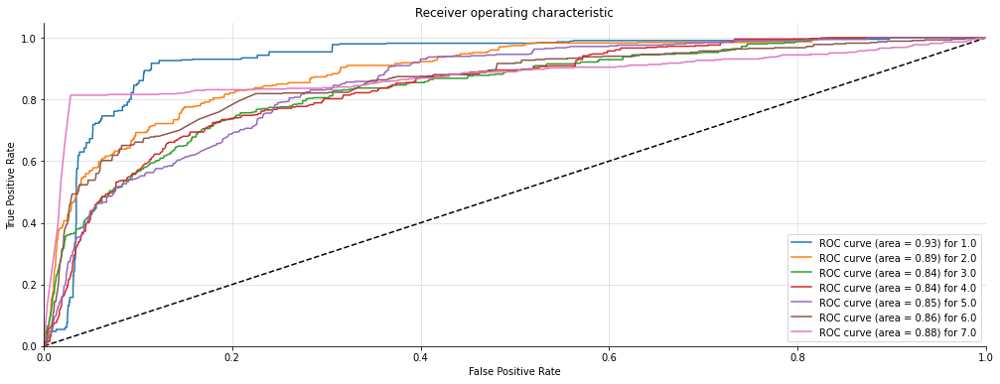

(3360, 7) (3360, 7)


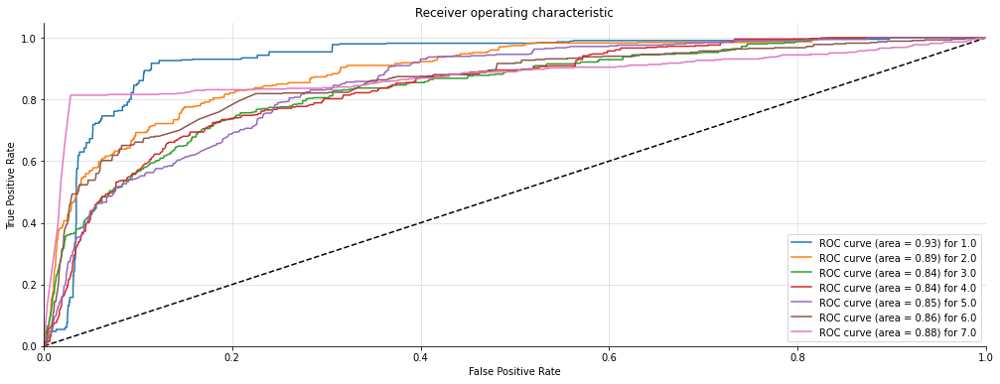

For column: complicated<==>easy
              precision    recall  f1-score   support

         1.0       0.48      0.90      0.63       463
         2.0       0.66      0.55      0.60       485
         3.0       0.64      0.43      0.52       501
         4.0       0.62      0.45      0.52       515
         5.0       0.61      0.50      0.55       460
         6.0       0.65      0.72      0.68       484
         7.0       0.88      0.90      0.89       452

    accuracy                           0.63      3360
   macro avg       0.65      0.64      0.63      3360
weighted avg       0.65      0.63      0.62      3360

Confusion Matrix: 
 [[419  12   1   1   0  19  11]
 [119 266  49   8   7  36   0]
 [ 97  49 217  85  29  23   1]
 [ 92  25  36 233 105  24   0]
 [ 78  19  21  27 231  84   0]
 [ 44  18  13  13   5 347  44]
 [ 16  12   3   6   3   4 408]]
Accuracy Score : 0.63125
Precision Score : 0.6480015370450664
Recall Score : 0.63125
F1 Score : 0.6240555440870741
(3360, 7) (3360, 7

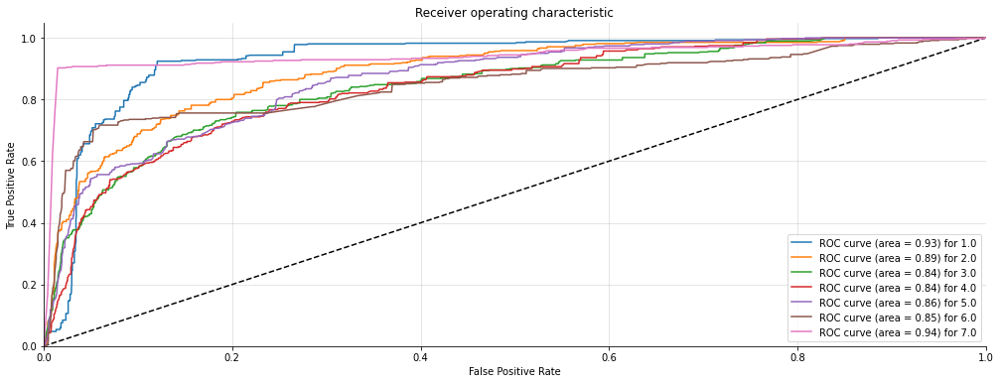

(3360, 7) (3360, 7)


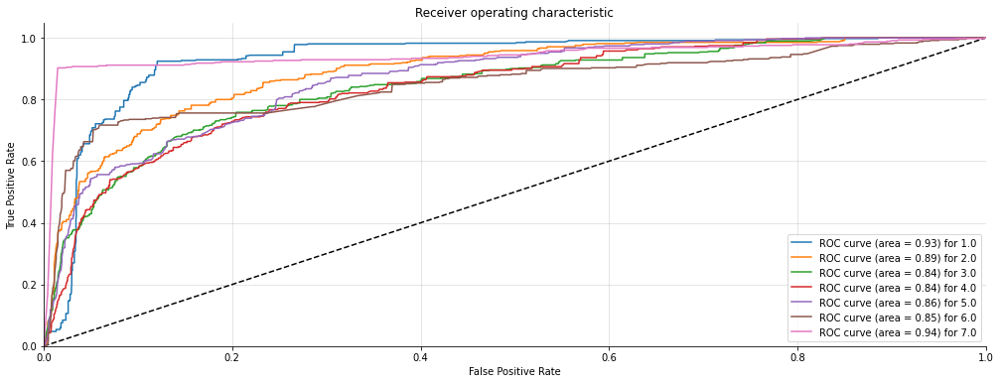

For column: inefficient<==>efficient
              precision    recall  f1-score   support

         1.0       0.49      0.92      0.64       462
         2.0       0.66      0.54      0.60       482
         3.0       0.59      0.44      0.51       506
         4.0       0.61      0.41      0.49       526
         5.0       0.51      0.52      0.51       458
         6.0       0.63      0.56      0.59       475
         7.0       0.80      0.83      0.81       451

    accuracy                           0.60      3360
   macro avg       0.61      0.60      0.59      3360
weighted avg       0.61      0.60      0.59      3360

Confusion Matrix: 
 [[426  11   6   0   0   8  11]
 [118 261  59   7  15  17   5]
 [ 90  47 225  85  33  25   1]
 [ 99  24  48 215 131   9   0]
 [ 72  16  17  25 236  92   0]
 [ 43  18  16  14  40 265  79]
 [ 22  16  12   9  12   6 374]]
Accuracy Score : 0.5958333333333333
Precision Score : 0.6103464546188077
Recall Score : 0.5958333333333333
F1 Score : 0.58826441

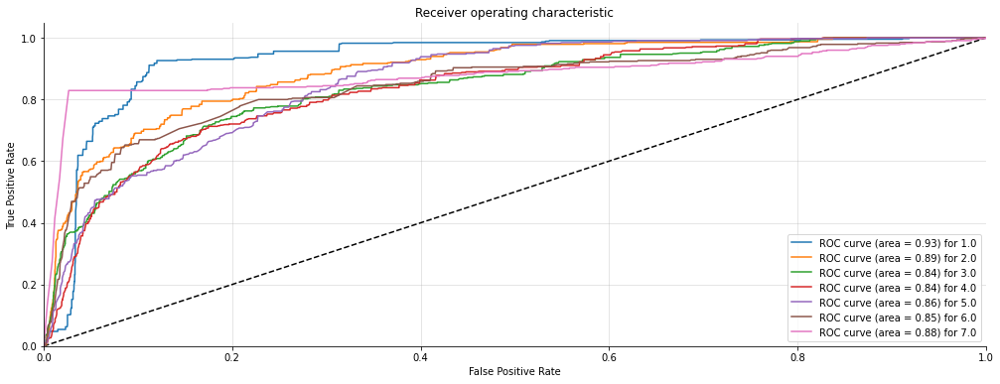

(3360, 7) (3360, 7)


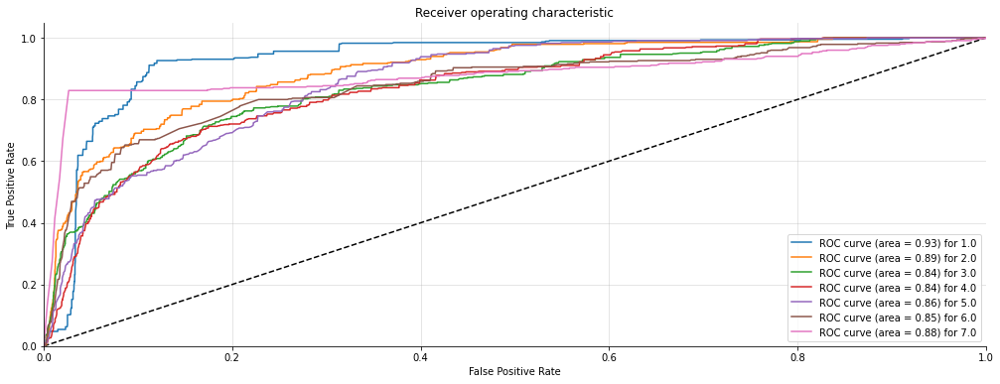

For column:  confusing<==>clear
              precision    recall  f1-score   support

         1.0       0.49      0.91      0.64       461
         2.0       0.66      0.54      0.60       488
         3.0       0.62      0.43      0.51       506
         4.0       0.60      0.42      0.49       516
         5.0       0.49      0.51      0.50       456
         6.0       0.61      0.58      0.59       471
         7.0       0.78      0.79      0.79       462

    accuracy                           0.59      3360
   macro avg       0.61      0.60      0.59      3360
weighted avg       0.61      0.59      0.59      3360

Confusion Matrix: 
 [[419  12   1   0   0  18  11]
 [111 265  54   6  18  29   5]
 [ 88  47 220  89  38  23   1]
 [ 96  23  34 216 137  10   0]
 [ 68  16  21  27 234  90   0]
 [ 42  18  11   8  35 271  86]
 [ 28  19  14  16  12   6 367]]
Accuracy Score : 0.5928571428571429
Precision Score : 0.6080050178500541
Recall Score : 0.5928571428571429
F1 Score : 0.5861195141120

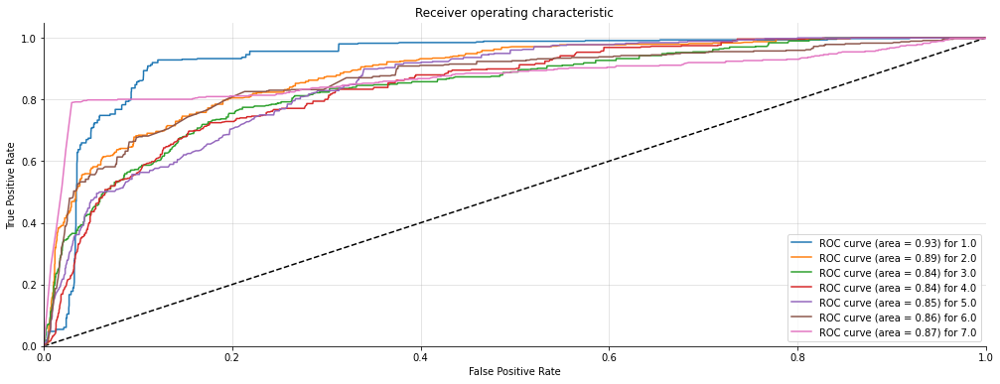

(3360, 7) (3360, 7)


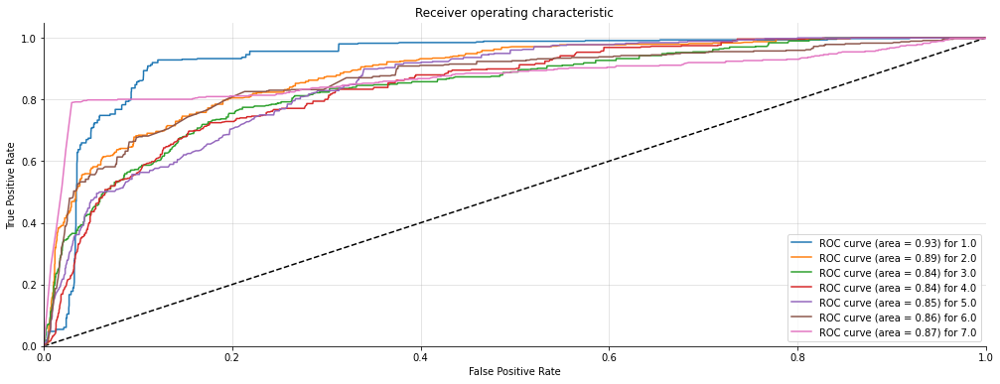

For column: boring<==>exciting
              precision    recall  f1-score   support

         1.0       0.49      0.89      0.63       463
         2.0       0.71      0.52      0.60       491
         3.0       0.71      0.50      0.59       487
         4.0       0.74      0.58      0.65       518
         5.0       0.79      0.64      0.71       487
         6.0       0.74      0.86      0.80       462
         7.0       0.95      0.99      0.97       452

    accuracy                           0.71      3360
   macro avg       0.73      0.71      0.71      3360
weighted avg       0.73      0.71      0.70      3360

Confusion Matrix: 
 [[411  11   6   0   0  24  11]
 [124 257  51  17   7  35   0]
 [102  34 244  63  23  19   2]
 [ 74  31  30 302  50  24   7]
 [ 91  20   9  21 311  35   0]
 [ 40  10   4   2   3 398   5]
 [  0   0   1   1   1   3 446]]
Accuracy Score : 0.7050595238095239
Precision Score : 0.7311261889270263
Recall Score : 0.7050595238095239
F1 Score : 0.70220772525607

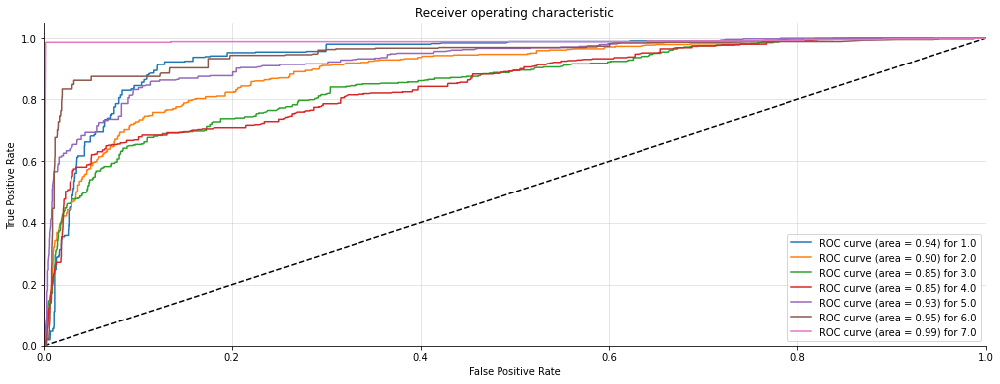

(3360, 7) (3360, 7)


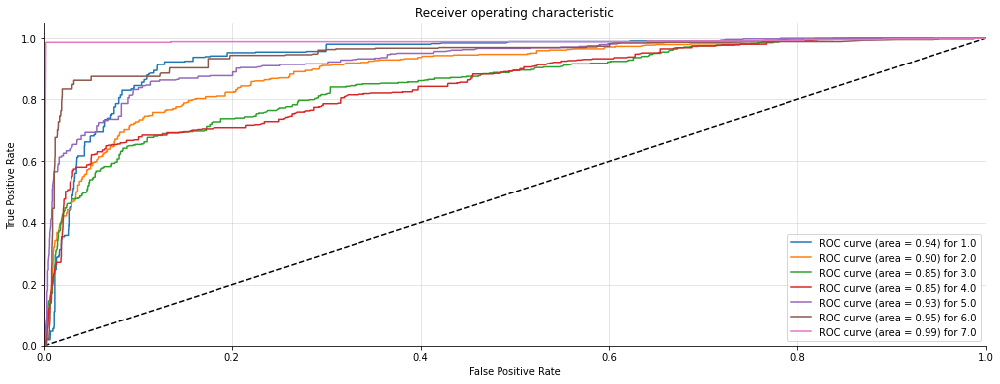

For column: not interesting<==>interesting
              precision    recall  f1-score   support

         1.0       0.49      0.90      0.63       461
         2.0       0.71      0.52      0.60       495
         3.0       0.67      0.49      0.57       490
         4.0       0.72      0.56      0.63       519
         5.0       0.78      0.62      0.69       481
         6.0       0.75      0.86      0.80       465
         7.0       0.96      0.99      0.98       449

    accuracy                           0.70      3360
   macro avg       0.72      0.71      0.70      3360
weighted avg       0.72      0.70      0.70      3360

Confusion Matrix: 
 [[414  11   6   0   0  19  11]
 [126 257  51  19   7  35   0]
 [101  42 242  60  23  21   1]
 [ 84  29  40 292  50  23   1]
 [ 83  13  17  34 299  35   0]
 [ 40   9   4   2   6 399   5]
 [  0   0   1   1   0   1 446]]
Accuracy Score : 0.6991071428571428
Precision Score : 0.7233960885130138
Recall Score : 0.6991071428571428
F1 Score : 0.69

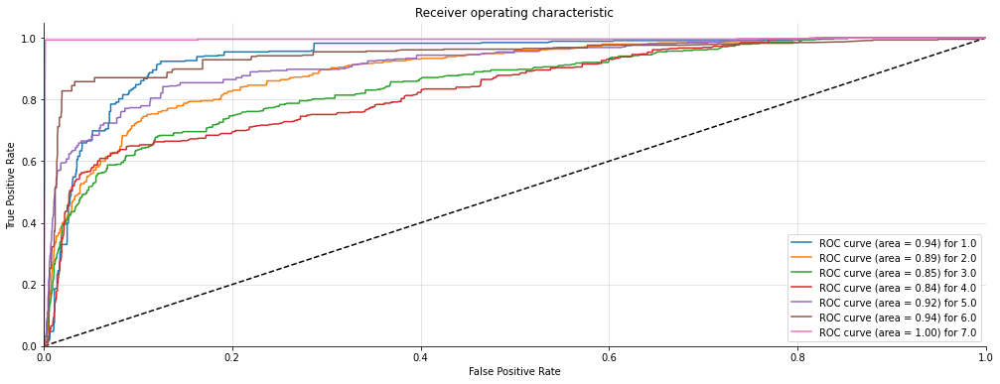

(3360, 7) (3360, 7)


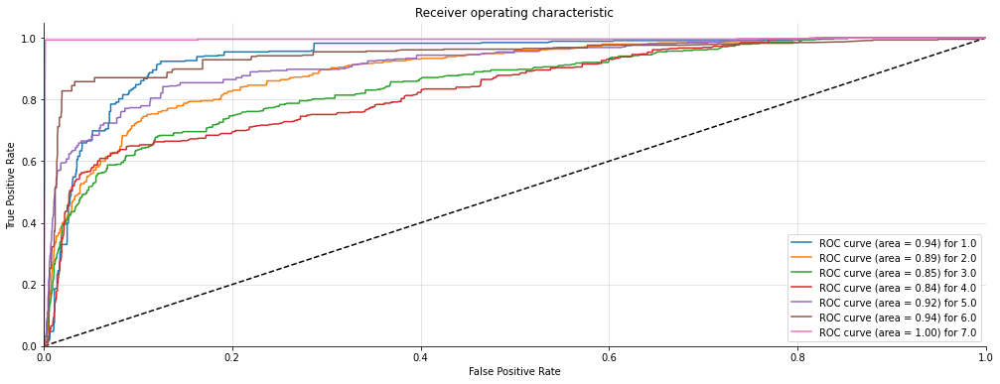

For column: conventional<==>inventive
              precision    recall  f1-score   support

         1.0       0.51      0.92      0.65       460
         2.0       0.77      0.54      0.64       502
         3.0       0.76      0.60      0.67       474
         4.0       0.80      0.60      0.69       527
         5.0       0.82      0.69      0.75       486
         6.0       0.77      0.88      0.82       459
         7.0       0.97      1.00      0.98       452

    accuracy                           0.74      3360
   macro avg       0.77      0.75      0.74      3360
weighted avg       0.77      0.74      0.74      3360

Confusion Matrix: 
 [[421   3   5   0   0  20  11]
 [127 273  37  30   6  28   1]
 [ 89  33 284  24  25  18   1]
 [ 82  29  30 318  40  28   0]
 [ 78  12  11  24 334  27   0]
 [ 35   6   9   0   3 406   0]
 [  0   0   0   0   0   1 451]]
Accuracy Score : 0.7401785714285715
Precision Score : 0.7705582361363527
Recall Score : 0.7401785714285715
F1 Score : 0.7395727

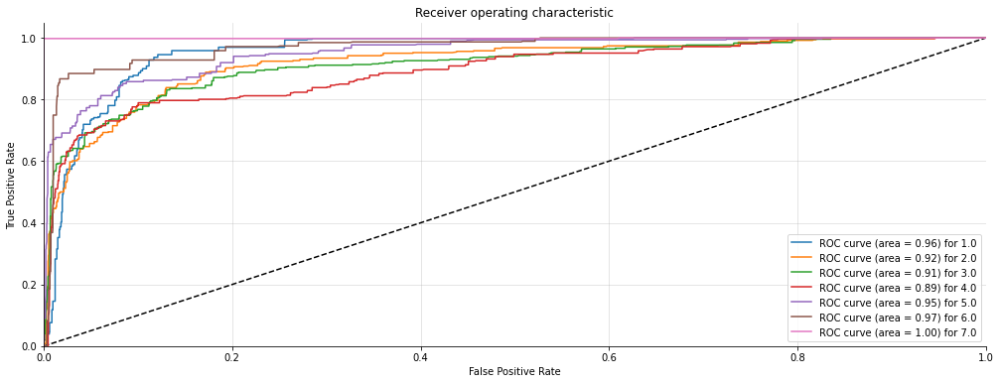

(3360, 7) (3360, 7)


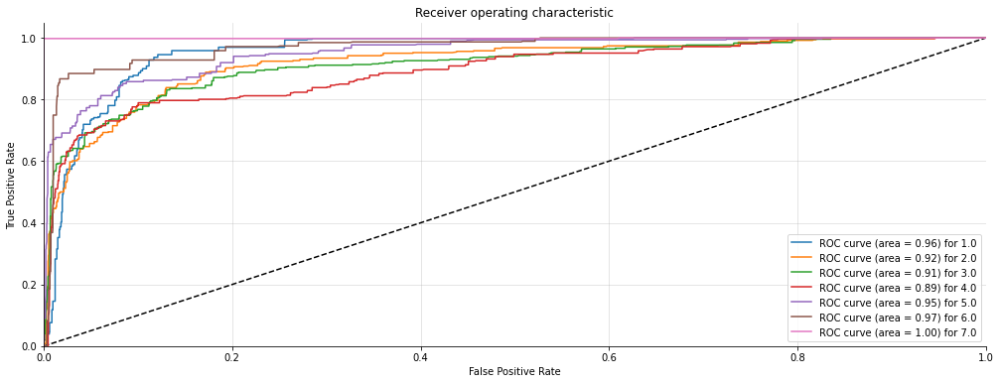

For column: usual<==>leading edge
              precision    recall  f1-score   support

         1.0       0.50      0.89      0.64       459
         2.0       0.81      0.61      0.69       496
         3.0       0.79      0.65      0.71       478
         4.0       0.87      0.65      0.74       523
         5.0       0.87      0.71      0.78       491
         6.0       0.78      0.89      0.84       462
         7.0       0.97      1.00      0.99       451

    accuracy                           0.76      3360
   macro avg       0.80      0.77      0.77      3360
weighted avg       0.80      0.76      0.77      3360

Confusion Matrix: 
 [[410   0  13   0   0  24  12]
 [125 301  23  19   3  25   0]
 [ 91  28 310  15  18  15   1]
 [ 75  28  27 338  33  22   0]
 [ 80   8  11  17 347  28   0]
 [ 34   6   9   0   0 413   0]
 [  0   0   0   0   0   0 451]]
Accuracy Score : 0.7648809523809523
Precision Score : 0.800627540748461
Recall Score : 0.7648809523809523
F1 Score : 0.767917656748

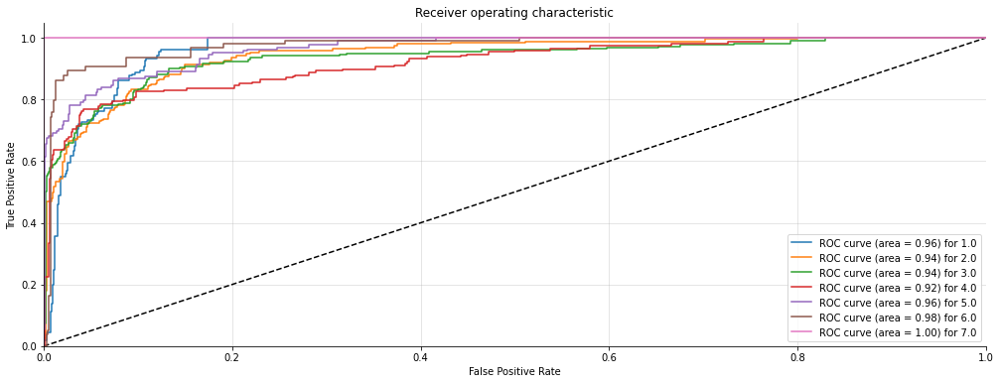

(3360, 7) (3360, 7)


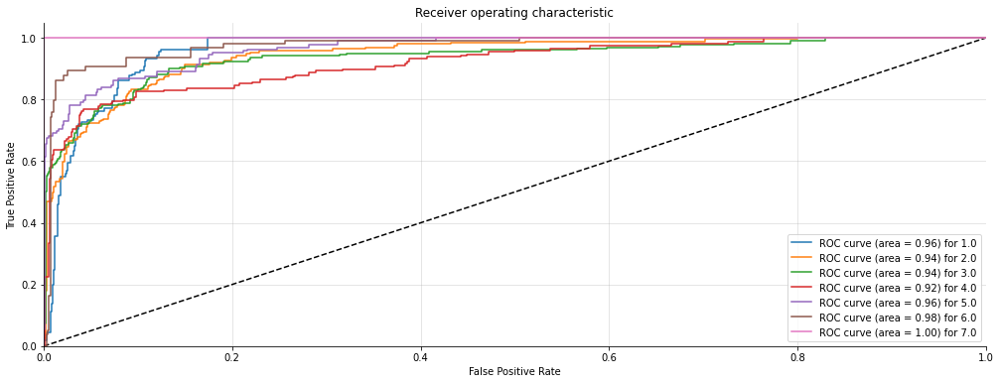

In [75]:
acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]
fpo=dict()
tpo=dict()
ffpo=[]
ttpo=[]
def SVMmodel(X_train, X_test, y_train, y_test, n_classes, figsize=(8, 6)):
    svc = SVC( probability=True)
    svc.fit(X_train, y_train)

    # predictions over test set
    predictions=[round(float(x)) for x in svc.predict(X_test)]
    print((classification_report(y_test, predictions)))

    # calculating Accuracy Score, Precision Score, Recall Score and F1 Score
    print('Confusion Matrix: \n' ,confusion_matrix(y_test, predictions))
    acc.append(accuracy_score(y_test, predictions))
    print(f'Accuracy Score : {accuracy_score(y_test, predictions)}')
    pre.append(precision_score(y_test,predictions,average='weighted'))
    print('Precision Score : ' + str(precision_score(y_test,predictions,average='weighted')))
    recal.append(recall_score(y_test,predictions,average='weighted'))
    print('Recall Score : ' + str(recall_score(y_test,predictions,average='weighted')))
    f1.append(f1_score(y_test,predictions,average='weighted'))
    print('F1 Score : ' + str(f1_score(y_test,predictions,average='weighted')))
    rms.append(np.sqrt(mean_squared_error(y_test,predictions)))
    aucscore.append(score_auc(y_test,predictions))
    plot_multiclass_roc(svc, X_test, y_test, n_classes)
    fpo,tpo=plot_multiclass_roc(svc, X_test, y_test, n_classes)
    ffpo.append(fpo)
    ttpo.append(tpo)

for i in range(8):
  print('For column:', df.columns[1:][i])
  n_classes = len(np.unique(df[df.columns[1:][i]]))
  SVMmodel(X_train, X_test, y_train[:,i], y_test[:,i], n_classes, figsize=(8, 6))

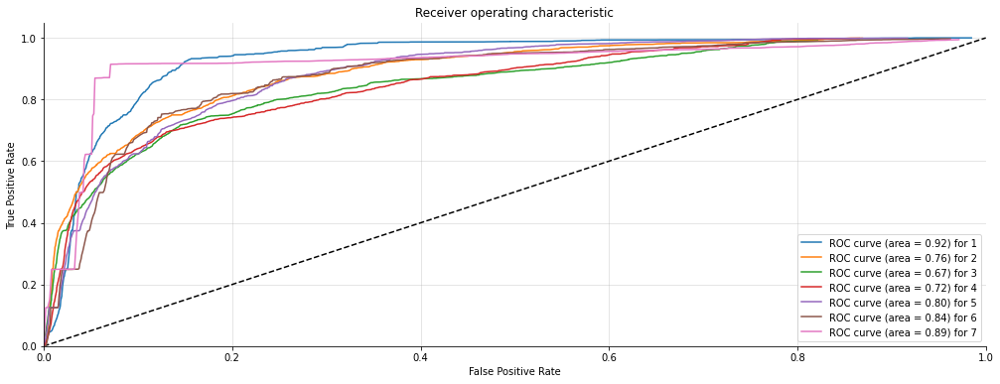

In [76]:
fsum0=list(np.array(dadd(dadd(dadd(ffpo[0][0],ffpo[1][0]),dadd(ffpo[2][0],ffpo[3][0])),dadd(dadd(ffpo[4][0],ffpo[5][0]),dadd(ffpo[6][0],ffpo[7][0]))))/8)
fsum1=list(np.array(dadd(dadd(dadd(ffpo[0][1],ffpo[1][1]),dadd(ffpo[2][1],ffpo[3][1])),dadd(dadd(ffpo[4][1],ffpo[5][1]),dadd(ffpo[6][1],ffpo[7][1]))))/8)
fsum2=list(np.array(dadd(dadd(dadd(ffpo[0][2],ffpo[1][2]),dadd(ffpo[2][2],ffpo[3][2])),dadd(dadd(ffpo[4][2],ffpo[5][2]),dadd(ffpo[6][2],ffpo[7][2]))))/8)
fsum3=list(np.array(dadd(dadd(dadd(ffpo[0][3],ffpo[1][3]),dadd(ffpo[2][3],ffpo[3][3])),dadd(dadd(ffpo[4][3],ffpo[5][3]),dadd(ffpo[6][3],ffpo[7][3]))))/8)
fsum4=list(np.array(dadd(dadd(dadd(ffpo[0][4],ffpo[1][4]),dadd(ffpo[2][4],ffpo[3][4])),dadd(dadd(ffpo[4][4],ffpo[5][4]),dadd(ffpo[6][4],ffpo[7][4]))))/8)
fsum5=list(np.array(dadd(dadd(dadd(ffpo[0][4],ffpo[1][5]),dadd(ffpo[2][5],ffpo[3][5])),dadd(dadd(ffpo[4][5],ffpo[5][5]),dadd(ffpo[6][5],ffpo[7][5]))))/8)
fsum6=list(np.array(dadd(dadd(dadd(ffpo[0][6],ffpo[1][6]),dadd(ffpo[2][6],ffpo[3][6])),dadd(dadd(ffpo[4][6],ffpo[5][6]),dadd(ffpo[6][6],ffpo[7][6]))))/8)

fpr=dict()

fsum0.sort()
fpr[0]=fsum0
fsum1.sort()
fpr[1]=fsum1
fsum2.sort()
fpr[2]=fsum2
fsum3.sort()
fpr[3]=fsum3
fsum4.sort()
fpr[4]=fsum4
fsum5.sort()
fpr[5]=fsum5
fsum6.sort()
fpr[6]=fsum6


tsum0=list(np.array(dadd(dadd(dadd(ttpo[0][0],ttpo[1][0]),dadd(ttpo[2][0],ttpo[3][0])),dadd(dadd(ttpo[4][0],ttpo[5][0]),dadd(ttpo[6][0],ttpo[7][0]))))/8)
tsum1=list(np.array(dadd(dadd(dadd(ttpo[0][1],ttpo[1][1]),dadd(ttpo[2][1],ttpo[3][1])),dadd(dadd(ttpo[4][1],ttpo[5][1]),dadd(ttpo[6][1],ttpo[7][1]))))/8)
tsum2=list(np.array(dadd(dadd(dadd(ttpo[0][2],ttpo[1][2]),dadd(ttpo[2][2],ttpo[3][2])),dadd(dadd(ttpo[4][2],ttpo[5][2]),dadd(ttpo[6][2],ttpo[7][2]))))/8)
tsum3=list(np.array(dadd(dadd(dadd(ttpo[0][3],ttpo[1][3]),dadd(ttpo[2][3],ttpo[3][3])),dadd(dadd(ttpo[4][3],ttpo[5][3]),dadd(ttpo[6][3],ttpo[7][3]))))/8)
tsum4=list(np.array(dadd(dadd(dadd(ttpo[0][4],ttpo[1][4]),dadd(ttpo[2][4],ttpo[3][4])),dadd(dadd(ttpo[4][4],ttpo[5][4]),dadd(ttpo[6][4],ttpo[7][4]))))/8)
tsum5=list(np.array(dadd(dadd(dadd(ttpo[0][4],ttpo[1][5]),dadd(ttpo[2][5],ttpo[3][5])),dadd(dadd(ttpo[4][5],ttpo[5][5]),dadd(ttpo[6][5],ttpo[7][5]))))/8)
tsum6=list(np.array(dadd(dadd(dadd(ttpo[0][6],ttpo[1][6]),dadd(ttpo[2][6],ttpo[3][6])),dadd(dadd(ttpo[4][6],ttpo[5][6]),dadd(ttpo[6][6],ttpo[7][6]))))/8)

tpr=dict()

tsum0.sort()
tpr[0]=tsum0
tsum1.sort()
tpr[1]=tsum1
tsum2.sort()
tpr[2]=tsum2
tsum3.sort()
tpr[3]=tsum3
tsum4.sort()
tpr[4]=tsum4
tsum5.sort()
tpr[5]=tsum5
tsum6.sort()
tpr[6]=tsum6

plot_multiclass_roc_avg(fpr,tpr,7)

In [77]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE -score :{}".format(np.mean(rms)))
print("average auc score {}".format(np.mean(aucscore)))
metric_df['SVM'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.6657738095238095
average Precision :0.687970206313945
average Recall :0.6657738095238095
average F1 -score :0.6616972435588373
average RMSE -score :1.4657342538835119
average auc score 0.8053461262850519


## 3.7. Custom-Built Ordinal Classifier

Credit: [Muhammad for Towards Data Science](https://towardsdatascience.com/simple-trick-to-train-an-ordinal-regression-with-any-classifier-6911183d2a3c)

Ordinal classifier basically does a similar thing to one-hot encoding -- but despite having one value each column, ordinal encoding maps unique binary values for each of our unique classes.

We implement a custom object called `OrdinalClassifier` built on top of any `sklearn` model that supports the `predict_proba()` function; ranging from Naive Bayes to decision trees.

Last implementation, we deduced the labels by one, from `[1,2,3,4,5,6,7]` to `[0,1,2,3,4,5,6]` due to the nature of zero-indexing of standard sklearn library. But this doesn't work if the labels aren't ranging fully from 1 to 7 -- could be 2 to 6 or 2 to 7 instead.

So the solution is to change the overall behavior of the `OrdinalClassifier` object to take maximum class (e.g. 7) and minimum class (e.g. 2 or 3) into consideration. From there, we simulate the `np.argmax()` function to be added the minimum class before being returned. We also add the minimum class as an index towards `self.clfs` dictionary when adding new value, so we don't need to deduce the labels by hand. In other words, labels stay as-is instead of being deduced by 1 :)

This also changes how the approach for ordinal encoding works -- instead of `k - 1` like the author's original implementation, we feed `k` numbers of encoding because our labels are already one-indexed.

Keep in mind that the `predict_proba()` function does not yet implement this change, because it's only a wrapper function before eventually calling `predict()` in which we care the most about the result. 

For column: obstructive<==>supportive
[23:49:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:49:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:49:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:49:33] WARNING: C:/Users/Adm

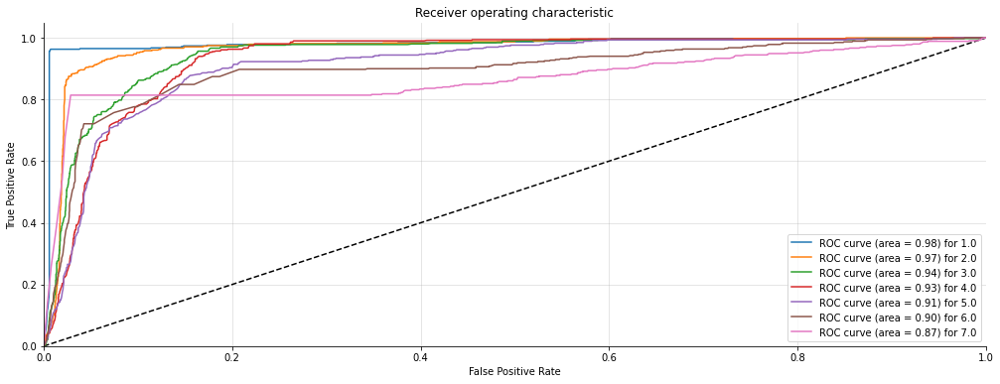

(3360, 7) (3360, 7)


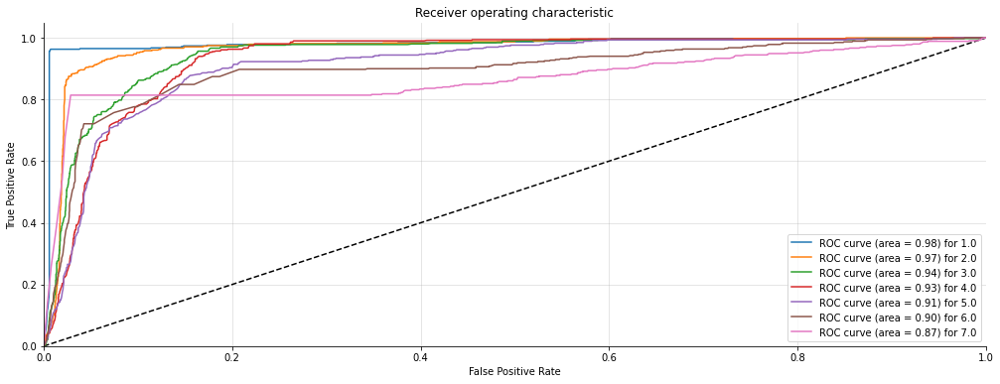

For column: complicated<==>easy
[23:49:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:49:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:49:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:49:37] WARNING: C:/Users/Administr

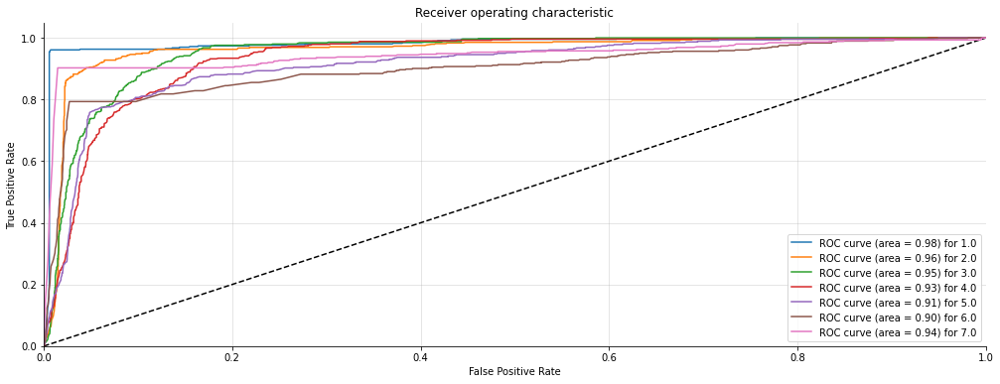

(3360, 7) (3360, 7)


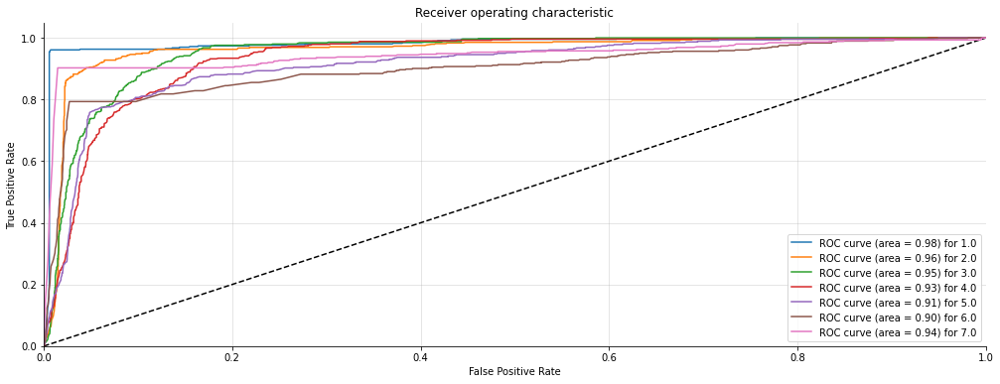

For column: inefficient<==>efficient
[23:49:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:49:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:49:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:49:42] WARNING: C:/Users/Admi

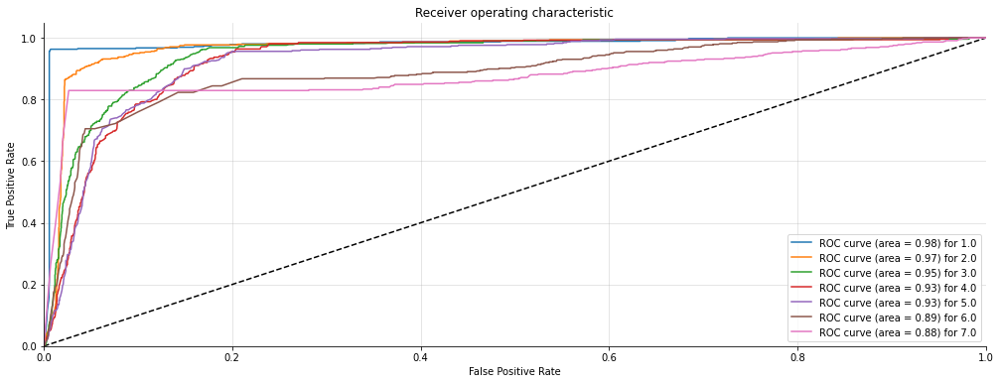

(3360, 7) (3360, 7)


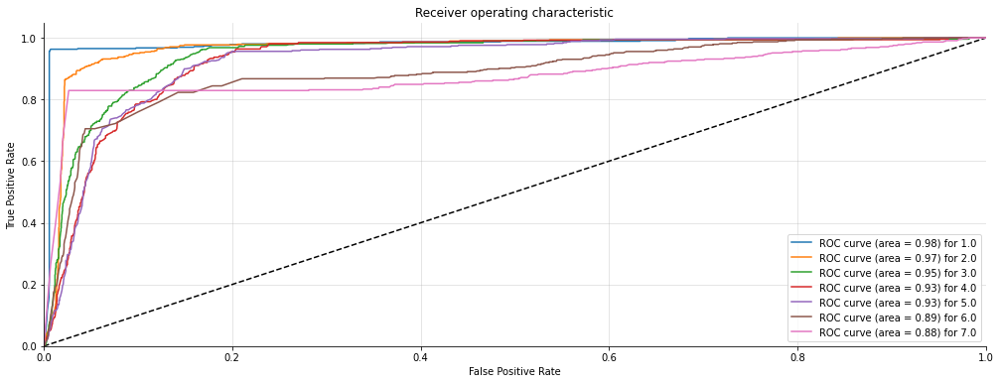

For column:  confusing<==>clear
[23:49:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:49:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:49:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:49:46] WARNING: C:/Users/Administr

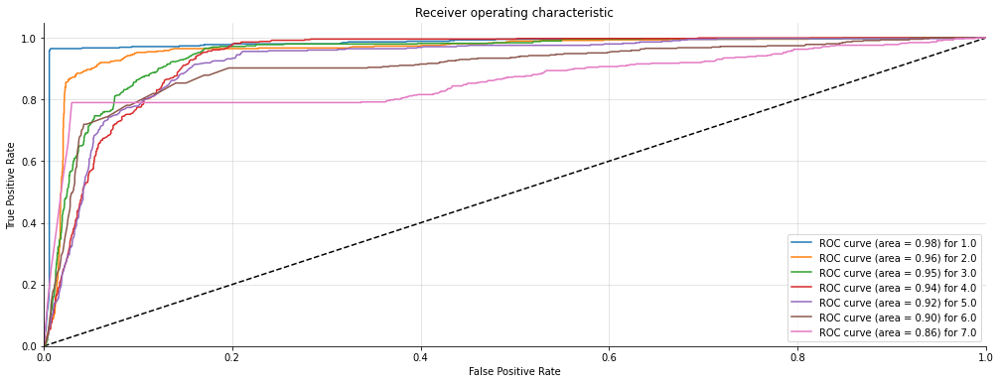

(3360, 7) (3360, 7)


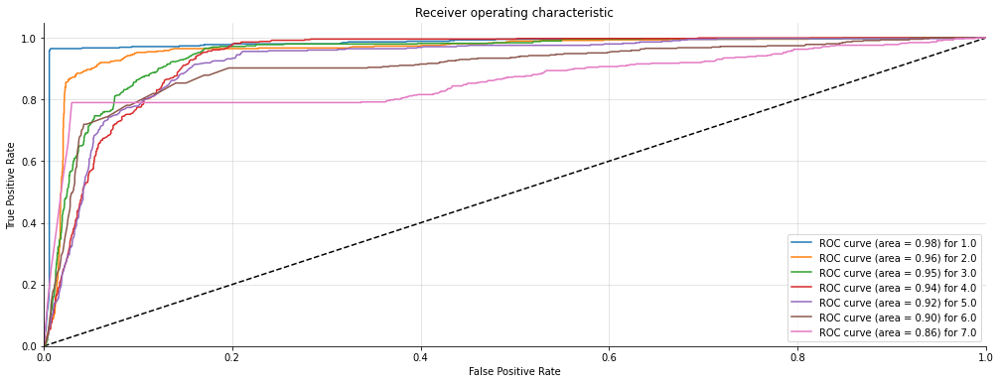

For column: boring<==>exciting
[23:49:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:49:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:49:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:49:50] WARNING: C:/Users/Administra

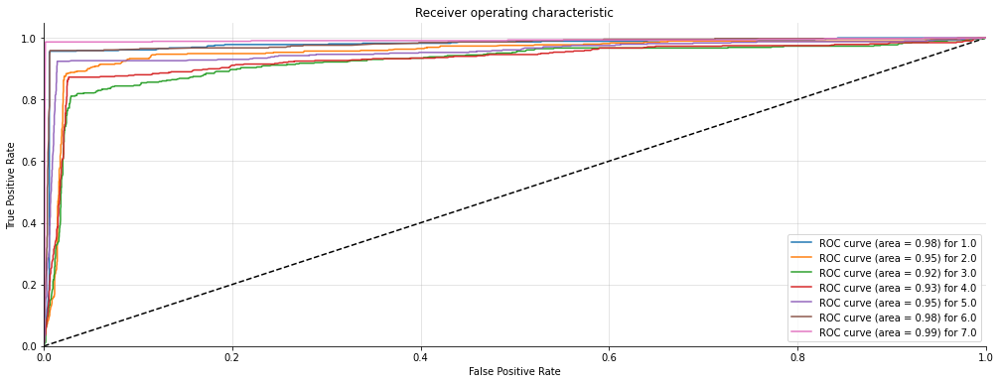

(3360, 7) (3360, 7)


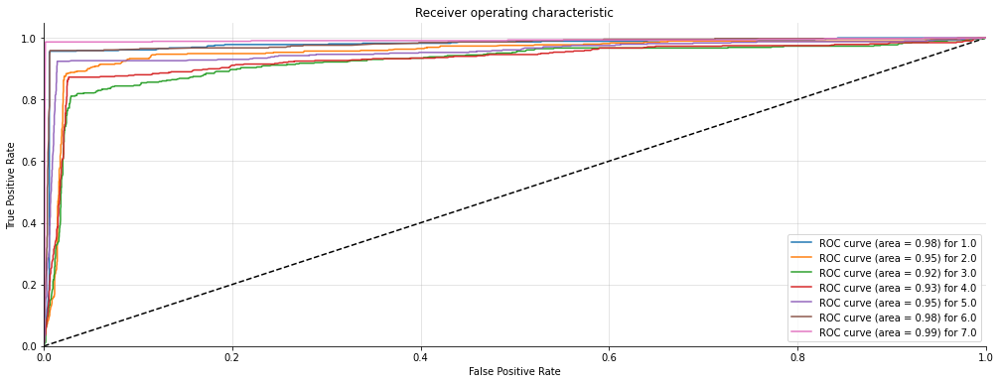

For column: not interesting<==>interesting
[23:49:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:49:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:49:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:49:54] WARNING: C:/User

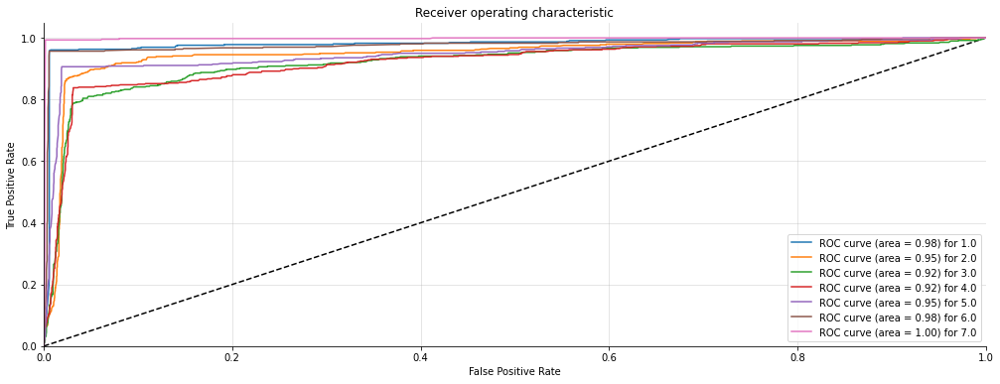

(3360, 7) (3360, 7)


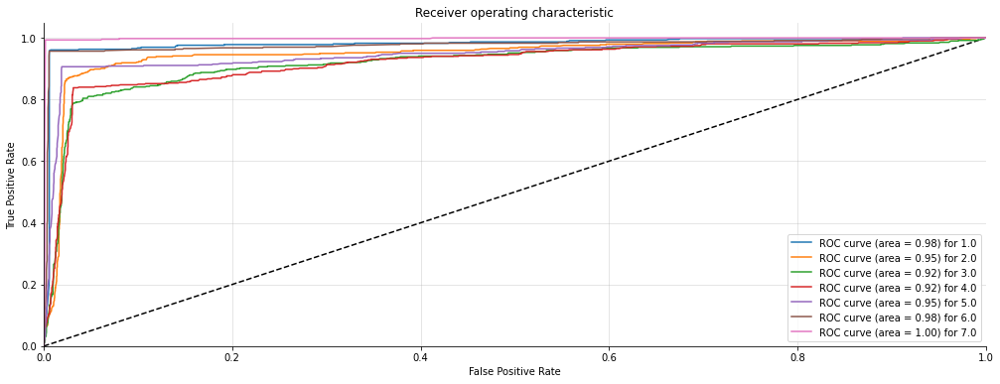

For column: conventional<==>inventive
[23:49:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:49:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:49:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:49:58] WARNING: C:/Users/Adm

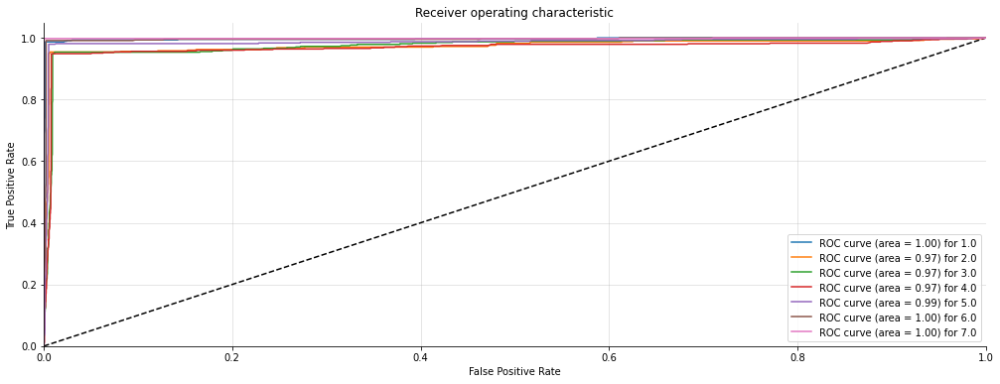

(3360, 7) (3360, 7)


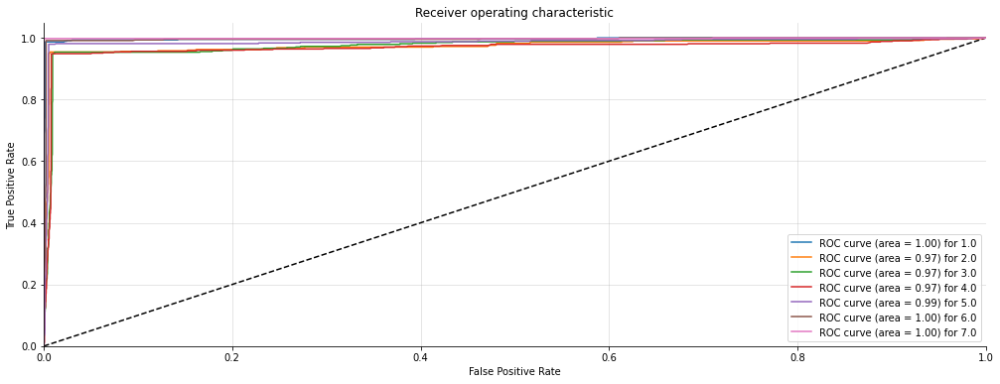

For column: usual<==>leading edge
[23:50:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:50:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:50:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:50:02] WARNING: C:/Users/Adminis

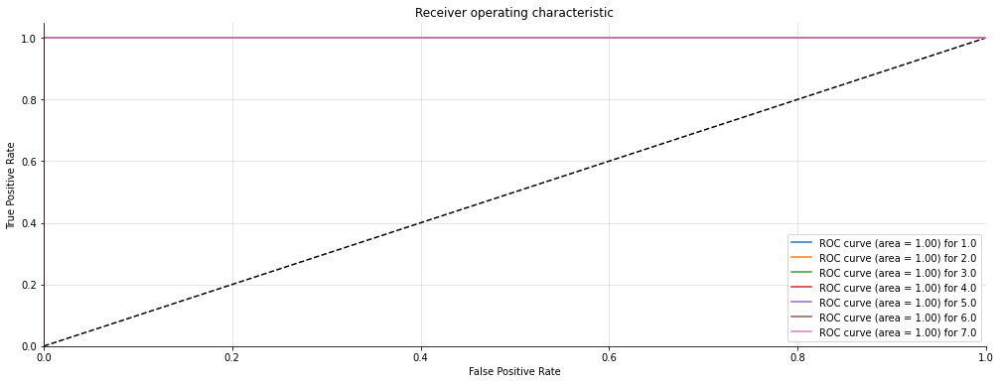

(3360, 7) (3360, 7)


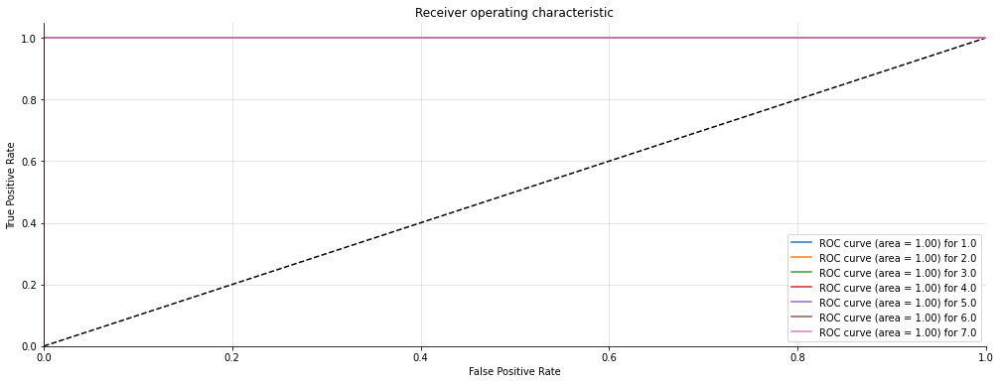

In [79]:
from sklearn.base import clone

acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]
fpo=dict()
tpo=dict()
ffpo=[]
ttpo=[]
class OrdinalClassifier():
    
    def __init__(self, clf):
        self.clf = clf
        self.clfs = {}
    
    def fit(self, X, y):
        self.unique_class = np.sort(np.unique(y))
        self.max_class = max(self.unique_class)
        self.min_class = min(self.unique_class)
        if self.unique_class.shape[0] > 2:
            # print(self.unique_class.shape[0]) # Uncomment to debug
            for i in range(self.unique_class.shape[0]):
                # for each k ordinal value we fit a binary classification problem
                binary_y = (y > self.unique_class[i]).astype(np.uint8)
                clf = clone(self.clf)
                
                
                clf.fit(X, binary_y)
                self.clfs[i + self.min_class] = clf
    
    def predict_proba(self, X):
        clfs_predict = {k:self.clfs[k].predict_proba(X) for k in self.clfs}
        # print(self.clfs) # Uncomment to debug
        predicted = []
        for i,y in enumerate(self.unique_class):
            if i == 0:
                # V1 = 1 - Pr(y > V1)
                predicted.append(1 - clfs_predict[y][:,1])
            elif y in clfs_predict:
                # Vi = Pr(y > Vi-1) - Pr(y > Vi)
                 predicted.append(clfs_predict[y-1][:,1] - clfs_predict[y][:,1])
            else:
                # Vk = Pr(y > Vk-1)
                predicted.append(clfs_predict[y-1][:,1])
        return np.vstack(predicted).T
    
    def predict(self, X):
        return np.argmax(self.predict_proba(X), axis=1) + self.min_class

def OrdinalModel(X_train, X_test, y_train, y_test, n_classes, figsize=(8, 6)):
    clf = OrdinalClassifier(XGBClassifier()) # Using XGB as the placeholder model 
    clf.fit(X_train, y_train)

    # predictions over test set
    predictions = clf.predict(X_test)
    print((classification_report(y_test, predictions)))

    # calculating Accuracy Score, Precision Score, Recall Score and F1 Score
    print('Confusion Matrix: \n' ,confusion_matrix(y_test, predictions))
    acc.append(accuracy_score(y_test, predictions))
    print(f'Accuracy Score : {accuracy_score(y_test, predictions)}')
    pre.append(precision_score(y_test,predictions,average='weighted'))
    print('Precision Score : ' + str(precision_score(y_test,predictions,average='weighted')))
    recal.append(recall_score(y_test,predictions,average='weighted'))
    print('Recall Score : ' + str(recall_score(y_test,predictions,average='weighted')))
    f1.append(f1_score(y_test,predictions,average='weighted'))
    rms.append(np.sqrt(mean_squared_error(y_test,predictions)))
    print('F1 Score : ' + str(f1_score(y_test,predictions,average='weighted')))
    aucscore.append(score_auc(y_test,predictions))
    fpo,tpo=plot_multiclass_roc(clf, X_test, y_test, n_classes)
    ffpo.append(fpo)
    ttpo.append(tpo)

    plot_multiclass_roc(clf, X_test, y_test, n_classes)

for i in range(8):
  print('For column:', df.columns[1:][i])
  n_classes = len(np.unique(df[df.columns[1:][i]]))
  OrdinalModel(X_train, X_test, y_train[:,i], y_test[:,i], n_classes, figsize=(8, 6))
  #break # Uncomment to debug

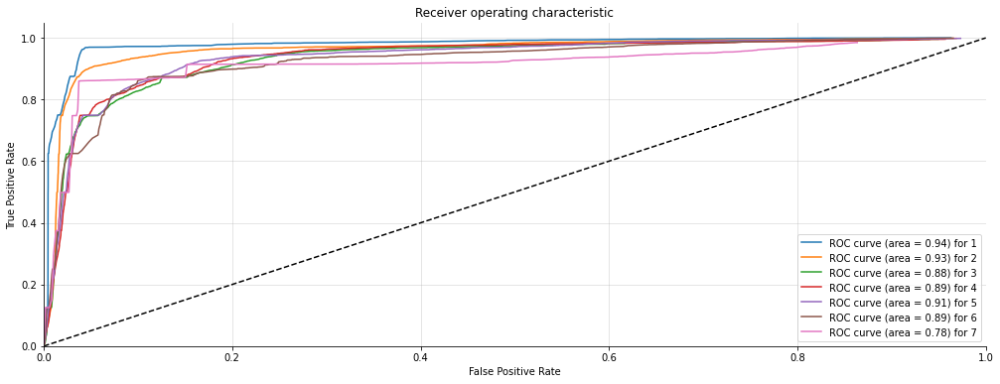

In [80]:
fsum0=list(np.array(dadd(dadd(dadd(ffpo[0][0],ffpo[1][0]),dadd(ffpo[2][0],ffpo[3][0])),dadd(dadd(ffpo[4][0],ffpo[5][0]),dadd(ffpo[6][0],ffpo[7][0]))))/8)
fsum1=list(np.array(dadd(dadd(dadd(ffpo[0][1],ffpo[1][1]),dadd(ffpo[2][1],ffpo[3][1])),dadd(dadd(ffpo[4][1],ffpo[5][1]),dadd(ffpo[6][1],ffpo[7][1]))))/8)
fsum2=list(np.array(dadd(dadd(dadd(ffpo[0][2],ffpo[1][2]),dadd(ffpo[2][2],ffpo[3][2])),dadd(dadd(ffpo[4][2],ffpo[5][2]),dadd(ffpo[6][2],ffpo[7][2]))))/8)
fsum3=list(np.array(dadd(dadd(dadd(ffpo[0][3],ffpo[1][3]),dadd(ffpo[2][3],ffpo[3][3])),dadd(dadd(ffpo[4][3],ffpo[5][3]),dadd(ffpo[6][3],ffpo[7][3]))))/8)
fsum4=list(np.array(dadd(dadd(dadd(ffpo[0][4],ffpo[1][4]),dadd(ffpo[2][4],ffpo[3][4])),dadd(dadd(ffpo[4][4],ffpo[5][4]),dadd(ffpo[6][4],ffpo[7][4]))))/8)
fsum5=list(np.array(dadd(dadd(dadd(ffpo[0][4],ffpo[1][5]),dadd(ffpo[2][5],ffpo[3][5])),dadd(dadd(ffpo[4][5],ffpo[5][5]),dadd(ffpo[6][5],ffpo[7][5]))))/8)
fsum6=list(np.array(dadd(dadd(dadd(ffpo[0][6],ffpo[1][6]),dadd(ffpo[2][6],ffpo[3][6])),dadd(dadd(ffpo[4][6],ffpo[5][6]),dadd(ffpo[6][6],ffpo[7][6]))))/8)

fpr=dict()

fsum0.sort()
fpr[0]=fsum0
fsum1.sort()
fpr[1]=fsum1
fsum2.sort()
fpr[2]=fsum2
fsum3.sort()
fpr[3]=fsum3
fsum4.sort()
fpr[4]=fsum4
fsum5.sort()
fpr[5]=fsum5
fsum6.sort()
fpr[6]=fsum6


tsum0=list(np.array(dadd(dadd(dadd(ttpo[0][0],ttpo[1][0]),dadd(ttpo[2][0],ttpo[3][0])),dadd(dadd(ttpo[4][0],ttpo[5][0]),dadd(ttpo[6][0],ttpo[7][0]))))/8)
tsum1=list(np.array(dadd(dadd(dadd(ttpo[0][1],ttpo[1][1]),dadd(ttpo[2][1],ttpo[3][1])),dadd(dadd(ttpo[4][1],ttpo[5][1]),dadd(ttpo[6][1],ttpo[7][1]))))/8)
tsum2=list(np.array(dadd(dadd(dadd(ttpo[0][2],ttpo[1][2]),dadd(ttpo[2][2],ttpo[3][2])),dadd(dadd(ttpo[4][2],ttpo[5][2]),dadd(ttpo[6][2],ttpo[7][2]))))/8)
tsum3=list(np.array(dadd(dadd(dadd(ttpo[0][3],ttpo[1][3]),dadd(ttpo[2][3],ttpo[3][3])),dadd(dadd(ttpo[4][3],ttpo[5][3]),dadd(ttpo[6][3],ttpo[7][3]))))/8)
tsum4=list(np.array(dadd(dadd(dadd(ttpo[0][4],ttpo[1][4]),dadd(ttpo[2][4],ttpo[3][4])),dadd(dadd(ttpo[4][4],ttpo[5][4]),dadd(ttpo[6][4],ttpo[7][4]))))/8)
tsum5=list(np.array(dadd(dadd(dadd(ttpo[0][4],ttpo[1][5]),dadd(ttpo[2][5],ttpo[3][5])),dadd(dadd(ttpo[4][5],ttpo[5][5]),dadd(ttpo[6][5],ttpo[7][5]))))/8)
tsum6=list(np.array(dadd(dadd(dadd(ttpo[0][6],ttpo[1][6]),dadd(ttpo[2][6],ttpo[3][6])),dadd(dadd(ttpo[4][6],ttpo[5][6]),dadd(ttpo[6][6],ttpo[7][6]))))/8)

tpr=dict()

tsum0.sort()
tpr[0]=tsum0
tsum1.sort()
tpr[1]=tsum1
tsum2.sort()
tpr[2]=tsum2
tsum3.sort()
tpr[3]=tsum3
tsum4.sort()
tpr[4]=tsum4
tsum5.sort()
tpr[5]=tsum5
tsum6.sort()
tpr[6]=tsum6

plot_multiclass_roc_avg(fpr,tpr,7)

In [81]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE -score :{}".format(np.mean(rms)))
print("average AUC score:{}".format(np.mean(aucscore)))
metric_df['OrdinalModel'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.8604166666666667
average Precision :0.8600326360564499
average Recall :0.8604166666666667
average F1 -score :0.8600294010328835
average RMSE -score :0.6058065695863875
average AUC score:0.9183817455975198


# 4. Other Deep Learning Model(s)

## 4.1. Bidirectional LSTM

In [46]:
## Callbacks
es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=7)

checkpoint = tf.keras.callbacks.ModelCheckpoint(
  "model_checkpoints", monitor="val_loss", verbose=1, save_best_only=True, mode="min")

## Optimizer
opt = tf.keras.optimizers.Adam(learning_rate=0.001)

LSTM_model = tf.keras.Sequential([
    tf.keras.layers.Embedding(2000, 64),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64)),
    # tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(32)),
    # use ReLU in place of tanh function since they are very good alternatives of each other.
    tf.keras.layers.Dense(64, activation='relu', 
                          
                          # Prevent overfitting
                          kernel_regularizer=tf.keras.regularizers.L2(l2=0.01), 

                          # Ensuring consistent outputs and not run into potential local optima
                          # Avoid initializing standard normal (mean = 0, std = 1) to reach faster convergence and less initial loss.
                          kernel_initializer=tf.keras.initializers.RandomNormal(seed=42)
                          
                          ),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(8, activation='linear')
])
LSTM_model.summary()

LSTM_model.compile(loss=tf.keras.losses.MeanSquaredError(), optimizer= opt, metrics=['mae'])

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        (None, None, 64)          128000    
_________________________________________________________________
bidirectional (Bidirectional (None, 128)               66048     
_________________________________________________________________
dense_8 (Dense)              (None, 64)                8256      
_________________________________________________________________
dropout_5 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_9 (Dense)              (None, 8)                 520       
Total params: 202,824
Trainable params: 202,824
Non-trainable params: 0
_________________________________________________________________


In [47]:
history = LSTM_model.fit(X_train, y_train, epochs=100, batch_size = 512, validation_split=0.2, 
                    callbacks = [es], # Call checkpoint variable if neccessary
                    verbose=1)

Epoch 1/100
21/21 [==============================] - 4s 92ms/step - loss: 18.2838 - mae: 3.7368 - val_loss: 8.9582 - val_mae: 2.4431
Epoch 2/100
21/21 [==============================] - 1s 70ms/step - loss: 6.5022 - mae: 2.0788 - val_loss: 4.3565 - val_mae: 1.7674
Epoch 3/100
21/21 [==============================] - 1s 70ms/step - loss: 5.3918 - mae: 1.9255 - val_loss: 4.0669 - val_mae: 1.7229
Epoch 4/100
21/21 [==============================] - 1s 69ms/step - loss: 5.0856 - mae: 1.8776 - val_loss: 3.9937 - val_mae: 1.7133
Epoch 5/100
21/21 [==============================] - 1s 68ms/step - loss: 4.9343 - mae: 1.8574 - val_loss: 3.8704 - val_mae: 1.6863
Epoch 6/100
21/21 [==============================] - 1s 71ms/step - loss: 4.6378 - mae: 1.8032 - val_loss: 3.6201 - val_mae: 1.6237
Epoch 7/100
21/21 [==============================] - 1s 68ms/step - loss: 4.0941 - mae: 1.6842 - val_loss: 2.7477 - val_mae: 1.4006
Epoch 8/100
21/21 [==============================] - 1s 70ms/step - loss: 2

### 4.1.1. Interpretation

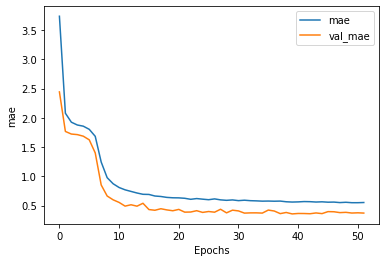

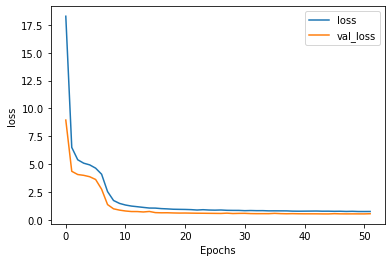

In [48]:
plot_graphs(history, "mae")
plot_graphs(history, "loss")

In [49]:
scores = LSTM_model.evaluate(
    X_test, y_test, batch_size=1, verbose=1, sample_weight=None, steps=None,
    callbacks=None, max_queue_size=10, workers=4, use_multiprocessing=False,
    return_dict=False
)
print("------------------ EVALUATION FINISHED! ------------------".center(115))
for i in range(len(scores)):
    print("%s: %.2f%%" % (model.metrics_names[i], scores[i]*100))

3360/3360 [==============================] - 5s 1ms/step - loss: 0.5689 - mae: 0.3864
                             ------------------ EVALUATION FINISHED! ------------------                            
loss: 56.89%
mae: 38.64%


In [50]:
from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import plot_confusion_matrix, accuracy_score
from sklearn.metrics import mean_squared_error
acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]

In [51]:
from sklearn.metrics import classification_report, f1_score
y_pred = LSTM_model.predict(X_test)
for i in range(8):
    print("Column", df.columns[1:][i])
    estimates = [round(float(x)) for x in y_pred[:,i]]
    estimates = transform_results(estimates)
    print(np.unique(estimates))
    acc.append(accuracy_score(y_test[:,i], estimates))
    pre.append(precision_score(y_test[:,i], estimates,average='weighted'))
    recal.append(recall_score(y_test[:,i], estimates,average='weighted'))
    f1.append(f1_score(y_test[:,i], estimates,average='weighted'))
    rms.append(np.sqrt(mean_squared_error(y_test[:,i], estimates)))
    aucscore.append(score_auc(y_test[:,i], estimates))
    print(classification_report(y_test[:,i], estimates), "\n------")

Column obstructive<==>supportive
[1 2 3 4 5 6 7]
              precision    recall  f1-score   support

         1.0       0.95      0.87      0.91       462
         2.0       0.71      0.55      0.62       482
         3.0       0.56      0.64      0.60       510
         4.0       0.63      0.69      0.66       517
         5.0       0.64      0.69      0.66       467
         6.0       0.73      0.72      0.73       470
         7.0       0.82      0.81      0.82       452

    accuracy                           0.71      3360
   macro avg       0.72      0.71      0.71      3360
weighted avg       0.72      0.71      0.71      3360
 
------
Column complicated<==>easy
[1 2 3 4 5 6 7]
              precision    recall  f1-score   support

         1.0       0.95      0.90      0.92       463
         2.0       0.75      0.57      0.64       485
         3.0       0.57      0.66      0.61       501
         4.0       0.65      0.70      0.67       515
         5.0       0.69      0.7

In [52]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE -score :{}".format(np.mean(rms)))
print("average AUC -score :{}".format(np.mean(aucscore)))
metric_df['Bidirectional LSTM'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.7978422619047618
average Precision :0.8043311199180649
average Recall :0.7978422619047618
average F1 -score :0.7981582224724733
average RMSE -score :0.6869045240231608
average AUC -score :0.8816555162488589


In [53]:
metric_df

,metric,Neural network classifier,XGB,SVM,OrdinalModel,Bidirectional LSTM
0,Accuracy,0.753051,0.863058,0.661979,0.862054,0.797842
1,Precision,0.767403,0.863102,0.690407,0.862013,0.804331
2,Recall,0.753051,0.863058,0.661979,0.862054,0.797842
3,F1 Score,0.755043,0.862912,0.658335,0.861883,0.798158
4,RMSE,0.781938,0.601694,1.450794,0.601928,0.686905
5,AUC score,0.855624,0.919934,0.803131,0.919341,0.881656


# Result

In [54]:
LSTM_y_pred = LSTM_model.predict(X_test)
LSTM_y_pred_flattened = LSTM_y_pred.flatten(order='F')
LSTM_y_classified = [round(float(x)) for x in LSTM_y_pred_flattened]

print("First ten examples of the test set:")
print("Truth labels:", y_test_flattened[:10])
print("Predicted labels:",LSTM_y_classified[:10])
print("Overall performance on all columns:\n", classification_report(y_test_flattened, LSTM_y_classified))

First ten examples of the test set:
Truth labels: [2. 1. 2. 1. 4. 3. 4. 3. 3. 7.]
Predicted labels: [2, 1, 3, 1, 5, 4, 4, 3, 4, 1]
Overall performance on all columns:
               precision    recall  f1-score   support

         1.0       0.95      0.91      0.93      3691
         2.0       0.78      0.59      0.67      3921
         3.0       0.61      0.71      0.66      3952
         4.0       0.74      0.79      0.77      4161
         5.0       0.78      0.83      0.81      3786
         6.0       0.87      0.85      0.86      3748
         7.0       0.92      0.91      0.92      3621

    accuracy                           0.80     26880
   macro avg       0.81      0.80      0.80     26880
weighted avg       0.80      0.80      0.80     26880



## 4.2. BERT [deprecated]

In [55]:
"""!pip install -q -U tensorflow-text
!pip install -q tf-models-official
import tensorflow_hub as hub
import tensorflow_text as text
from official.nlp import optimization  # to create AdamW optimizer

to_handle = 'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-2_H-128_A-2/1'
to_preprocess = 'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3'
bert_model = hub.KerasLayer(to_preprocess)

text_test = ['this is such an amazing movie!']
text_preprocessed = bert_model(text_test)

def build_classifier_model():
  text_input = tf.keras.layers.Input(shape=(), dtype=tf.string, name='text')
  preprocessing_layer = hub.KerasLayer(to_preprocess, name='preprocessing')
  encoder_inputs = preprocessing_layer(text_input)
  encoder = hub.KerasLayer(to_handle, trainable=True, name='BERT_encoder')
  outputs = encoder(encoder_inputs)
  net = outputs['pooled_output']
  net = tf.keras.layers.Dropout(0.1)(net)
  net = tf.keras.layers.Dense(1, activation=None, name='classifier')(net)
  return tf.keras.Model(text_input, net)

classifier_model = build_classifier_model()
classifier_model.compile(optimizer=optimizer,
                         loss=loss,
                         metrics=metrics)
print(f'Training model with {to_handle}')
history = classifier_model.fit(X_train, y_train)"""

"!pip install -q -U tensorflow-text\n!pip install -q tf-models-official\nimport tensorflow_hub as hub\nimport tensorflow_text as text\nfrom official.nlp import optimization  # to create AdamW optimizer\n\nto_handle = 'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-2_H-128_A-2/1'\nto_preprocess = 'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3'\nbert_model = hub.KerasLayer(to_preprocess)\n\ntext_test = ['this is such an amazing movie!']\ntext_preprocessed = bert_model(text_test)\n\ndef build_classifier_model():\n  text_input = tf.keras.layers.Input(shape=(), dtype=tf.string, name='text')\n  preprocessing_layer = hub.KerasLayer(to_preprocess, name='preprocessing')\n  encoder_inputs = preprocessing_layer(text_input)\n  encoder = hub.KerasLayer(to_handle, trainable=True, name='BERT_encoder')\n  outputs = encoder(encoder_inputs)\n  net = outputs['pooled_output']\n  net = tf.keras.layers.Dropout(0.1)(net)\n  net = tf.keras.layers.Dense(1, activation=None, name='classifi

# 4.3 RBFN

In [56]:

from keras import backend as K
from tensorflow.keras.layers import Layer, InputSpec
from keras.initializers import RandomUniform, Initializer, Constant
import numpy as np

In [57]:
class InitCentersRandom(Initializer):
    """ Initializer for initialization of centers of RBF network
        as random samples from the given data set.
    # Arguments
        X: matrix, dataset to choose the centers from (random rows
          are taken as centers)
    """

    def __init__(self, X):
        self.X = X

    def __call__(self, shape, dtype=None):
        assert shape[1] == self.X.shape[1]
        print("done")
        idx = np.random.randint(self.X.shape[0], size=shape[0])
        return self.X[idx, :]


class RBFLayer(Layer):
    """ Layer of Gaussian RBF units.
    # Example
    ```python
        model = Sequential()
        model.add(RBFLayer(10,
                           initializer=InitCentersRandom(X),
                           betas=1.0,
                           input_shape=(1,)))
        model.add(Dense(1))
    ```
    # Arguments
        output_dim: number of hidden units (i.e. number of outputs of the
                    layer)
        initializer: instance of initiliazer to initialize centers
        betas: float, initial value for betas
    """

    def __init__(self, output_dim, initializer=None, betas=1.0, **kwargs):
        self.output_dim = output_dim
        self.init_betas = betas
        if not initializer:
            self.initializer = RandomUniform(0.0, 1.0)
        else:
            self.initializer = initializer
        super(RBFLayer, self).__init__(**kwargs)

    def build(self, input_shape):

        self.centers = self.add_weight(name='centers',
                                       shape=(self.output_dim, input_shape[1]),
                                       initializer=self.initializer,
                                       trainable=True)
        self.betas = self.add_weight(name='betas',
                                     shape=(self.output_dim,),
                                     initializer=Constant(
                                         value=self.init_betas),
                                     # initializer='ones',
                                     trainable=True)

        super(RBFLayer, self).build(input_shape)

    def call(self, x):

        C = K.expand_dims(self.centers)
        H = K.transpose(C-K.transpose(x))
        return K.exp(-self.betas * K.sum(H**2, axis=1))

        # C = self.centers[np.newaxis, :, :]
        # X = x[:, np.newaxis, :]

        # diffnorm = K.sum((C-X)**2, axis=-1)
        # ret = K.exp( - self.betas * diffnorm)
        # return ret

    def compute_output_shape(self, input_shape):
        return (input_shape[0], self.output_dim)

    def get_config(self):
        # have to define get_config to be able to use model_from_json
        config = {
            'output_dim': self.output_dim
        }
        base_config = super(RBFLayer, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

from keras.initializers import Initializer
from sklearn.cluster import KMeans


class InitCentersKMeans(Initializer):
    """ Initializer for initialization of centers of RBF network
        by clustering the given data set.
    # Arguments
        X: matrix, dataset
    """

    def __init__(self, X, max_iter=100):
        self.X = X
        self.max_iter = max_iter

    def __call__(self, shape, dtype=None):
        assert shape[1] == self.X.shape[1]

        n_centers = shape[0]
        km = KMeans(n_clusters=n_centers, max_iter=self.max_iter, verbose=0)
        km.fit(self.X)
        return km.cluster_centers_


In [58]:
import numpy as np, pandas as pd
from keras.models import Sequential 
from keras.layers.core import Dense
from keras.layers import Activation
from tensorflow.keras.optimizers import RMSprop
import matplotlib.pyplot as plt

In [59]:
model = Sequential()
rbflayer = RBFLayer(100,
                        initializer=InitCentersKMeans(X_train),
                        betas=3.0,
                        input_shape=(X_train.shape[1],))
model.add(rbflayer)
model.add(Dense(8))
model.add(Activation('linear'))
model.compile(loss='mean_squared_error',
                  optimizer='adam', metrics=['accuracy'])
model.build(X_train.shape)
print(model.summary())
history1 = model.fit(X_train, y_train, epochs=100)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
module_wrapper (ModuleWrappe (13440, 100)              2100      
_________________________________________________________________
dense (Dense)                (13440, 8)                808       
_________________________________________________________________
activation (Activation)      (13440, 8)                0         
Total params: 2,908
Trainable params: 2,908
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/100
420/420 [==============================] - 21s 890us/step - loss: 19.0802 - accuracy: 0.1363
Epoch 2/100
420/420 [==============================] - 0s 888us/step - loss: 15.9356 - accuracy: 0.0132
Epoch 3/100
420/420 [==============================] - 0s 946us/step - loss: 13.5779 - accuracy: 0.1089
Epoch 4/100
420/420 [==============================] - 0s 915us/st

Epoch 66/100
420/420 [==============================] - 0s 881us/step - loss: 3.7392 - accuracy: 0.4806
Epoch 67/100
420/420 [==============================] - 0s 884us/step - loss: 3.7984 - accuracy: 0.2520
Epoch 68/100
420/420 [==============================] - 0s 906us/step - loss: 3.7688 - accuracy: 0.3961
Epoch 69/100
420/420 [==============================] - 0s 878us/step - loss: 3.7266 - accuracy: 0.5764
Epoch 70/100
420/420 [==============================] - 0s 881us/step - loss: 3.8245 - accuracy: 0.0639
Epoch 71/100
420/420 [==============================] - 0s 873us/step - loss: 3.7231 - accuracy: 0.2831
Epoch 72/100
420/420 [==============================] - 0s 883us/step - loss: 3.7648 - accuracy: 0.3925
Epoch 73/100
420/420 [==============================] - 0s 874us/step - loss: 3.7488 - accuracy: 0.1437
Epoch 74/100
420/420 [==============================] - 0s 876us/step - loss: 3.7584 - accuracy: 0.3101
Epoch 75/100
420/420 [==============================] - 0s 880us

In [60]:
scores = model.evaluate(
    X_test, y_test, batch_size=1, verbose=1, sample_weight=None, steps=None,
    callbacks=None, max_queue_size=10, workers=4, use_multiprocessing=False,
    return_dict=False
)
print("------------------ EVALUATION FINISHED! ------------------".center(115))
for i in range(len(scores)):
    print("%s: %.2f%%" % (model.metrics_names[i], scores[i]*100))

3360/3360 [==============================] - 2s 513us/step - loss: 3.6291 - accuracy: 0.0086
                             ------------------ EVALUATION FINISHED! ------------------                            
loss: 362.91%
accuracy: 0.86%


In [61]:
from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import plot_confusion_matrix, accuracy_score
from sklearn.metrics import mean_squared_error
acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]

In [62]:
from sklearn.metrics import classification_report, f1_score
y_pred = model.predict(X_test)
for i in range(8):
    print("Column", df.columns[1:][i])
    estimates = [round(float(x)) for x in y_pred[:,i]]
    estimates = transform_results(estimates)
    print(np.unique(estimates))
    acc.append(accuracy_score(y_test[:,i], estimates))
    pre.append(precision_score(y_test[:,i], estimates,average='weighted'))
    recal.append(recall_score(y_test[:,i], estimates,average='weighted'))
    f1.append(f1_score(y_test[:,i], estimates,average='weighted'))
    rms.append(np.sqrt(mean_squared_error(y_test[:,i], estimates)))
    aucscore.append(score_auc(y_test[:,i], estimates))
    print(classification_report(y_test[:,i], estimates), "\n------")

Column obstructive<==>supportive
[1 2 4 5 6 7]
              precision    recall  f1-score   support

         1.0       1.00      0.01      0.02       462
         2.0       1.00      0.01      0.02       482
         3.0       0.00      0.00      0.00       510
         4.0       0.16      0.99      0.27       517
         5.0       0.67      0.02      0.04       467
         6.0       0.69      0.05      0.10       470
         7.0       0.76      0.12      0.21       452

    accuracy                           0.18      3360
   macro avg       0.61      0.17      0.09      3360
weighted avg       0.60      0.18      0.10      3360
 
------
Column complicated<==>easy
[1 2 4 5 6 7]
              precision    recall  f1-score   support

         1.0       1.00      0.01      0.02       463
         2.0       1.00      0.01      0.02       485
         3.0       0.00      0.00      0.00       501
         4.0       0.16      0.99      0.27       515
         5.0       0.67      0.02   

In [63]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE -score :{}".format(np.mean(rms)))
print("average AUC -score :{}".format(np.mean(aucscore)))
metric_df['RBFN'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.18876488095238098
average Precision :0.6640736107730474
average Recall :0.18876488095238098
average F1 -score :0.10542724395877534
average RMSE -score :1.9081644070354273
average AUC -score :0.5201465917192054


In [64]:
LSTM_y_pred = model.predict(X_test)
LSTM_y_pred_flattened = LSTM_y_pred.flatten(order='F')
LSTM_y_classified = [round(float(x)) for x in LSTM_y_pred_flattened]

print("First ten examples of the test set:")
print("Truth labels:", y_test[:10])
print("Predicted labels:",LSTM_y_classified[:10])
print("Overall performance on all columns:\n", classification_report(y_test.flatten(order='F'), LSTM_y_classified))

First ten examples of the test set:
Truth labels: [[2. 2. 2. 2. 2. 2. 2. 2.]
 [1. 1. 1. 1. 1. 1. 1. 1.]
 [2. 2. 2. 2. 2. 2. 2. 2.]
 [1. 1. 1. 1. 1. 1. 1. 1.]
 [4. 4. 4. 4. 5. 5. 5. 5.]
 [3. 3. 3. 3. 3. 3. 4. 4.]
 [4. 4. 4. 4. 4. 4. 4. 4.]
 [3. 3. 3. 3. 3. 3. 3. 3.]
 [3. 3. 3. 3. 3. 3. 4. 4.]
 [7. 7. 7. 7. 2. 2. 1. 1.]]
Predicted labels: [4, 4, 4, 4, 4, 4, 4, 4, 4, 4]
Overall performance on all columns:
               precision    recall  f1-score   support

         1.0       1.00      0.01      0.02      3691
         2.0       1.00      0.01      0.02      3921
         3.0       0.00      0.00      0.00      3952
         4.0       0.16      0.99      0.28      4161
         5.0       0.82      0.03      0.05      3786
         6.0       0.86      0.07      0.12      3748
         7.0       0.90      0.14      0.25      3621

    accuracy                           0.19     26880
   macro avg       0.68      0.18      0.10     26880
weighted avg       0.66      0.19      0.11     268

In [65]:
from sklearn.metrics import classification_report

In [66]:
X_test.shape

(3360, 20)

In [67]:
y_train.shape

(13440, 8)

In [68]:
metric_df

,metric,Neural network classifier,XGB,SVM,OrdinalModel,Bidirectional LSTM,RBFN
0,Accuracy,0.753051,0.863058,0.661979,0.862054,0.797842,0.188765
1,Precision,0.767403,0.863102,0.690407,0.862013,0.804331,0.664074
2,Recall,0.753051,0.863058,0.661979,0.862054,0.797842,0.188765
3,F1 Score,0.755043,0.862912,0.658335,0.861883,0.798158,0.105427
4,RMSE,0.781938,0.601694,1.450794,0.601928,0.686905,1.908164
5,AUC score,0.855624,0.919934,0.803131,0.919341,0.881656,0.520147


# 4.4 Multiclass Logistic regression

For column: obstructive<==>supportive
              precision    recall  f1-score   support

         1.0       0.21      0.48      0.29       462
         2.0       0.25      0.17      0.20       482
         3.0       0.20      0.06      0.10       510
         4.0       0.26      0.14      0.18       517
         5.0       0.20      0.14      0.16       467
         6.0       0.19      0.16      0.17       470
         7.0       0.47      0.85      0.61       452

    accuracy                           0.28      3360
   macro avg       0.25      0.28      0.24      3360
weighted avg       0.25      0.28      0.24      3360

Confusion Matrix: 
 [[221  34  27  10  41  57  72]
 [167  80  16  37  44  60  78]
 [145  78  33  50  50  87  67]
 [167  45  42  72  66  64  61]
 [187  29  35  57  64  52  43]
 [140  42   3  52  52  76 105]
 [ 30  12   5   3   6  13 383]]
Accuracy Score : 0.27648809523809526
Precision Score : 0.25236757410598787
Recall Score : 0.27648809523809526
F1 Score : 0.2397

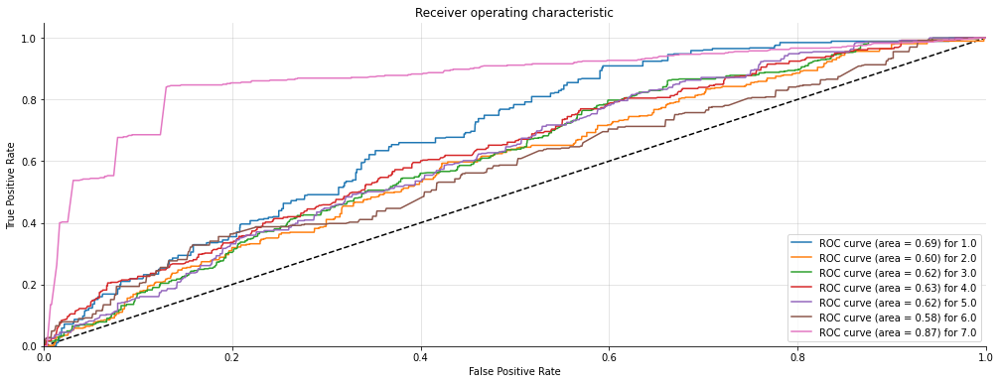

(3360, 7) (3360, 7)


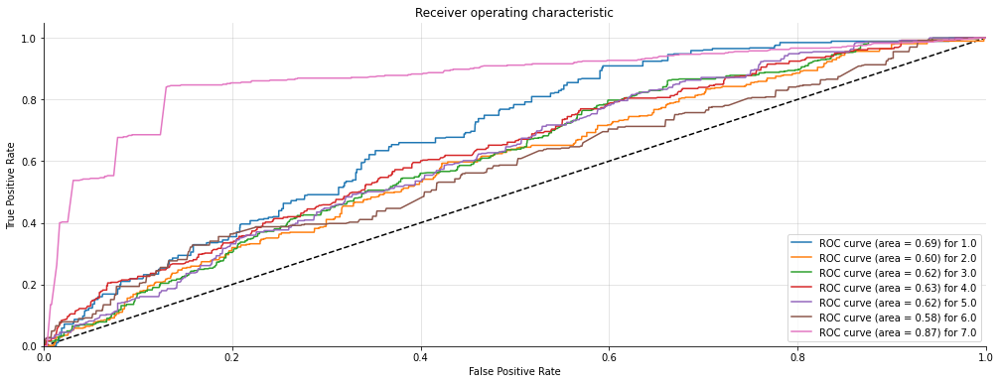

For column: complicated<==>easy
              precision    recall  f1-score   support

         1.0       0.24      0.22      0.23       463
         2.0       0.22      0.16      0.18       485
         3.0       0.18      0.09      0.12       501
         4.0       0.18      0.16      0.17       515
         5.0       0.20      0.18      0.19       460
         6.0       0.25      0.35      0.29       484
         7.0       0.54      0.92      0.68       452

    accuracy                           0.29      3360
   macro avg       0.26      0.30      0.27      3360
weighted avg       0.26      0.29      0.26      3360

Confusion Matrix: 
 [[104  55  34  41  64 102  63]
 [ 61  77  32  80  62 109  64]
 [ 56  64  45  81  78 122  55]
 [ 69  77  53  84  96  79  57]
 [ 69  44  55  79  84  94  35]
 [ 63  30  29  88  31 168  75]
 [  5   4   2  13   4   9 415]]
Accuracy Score : 0.29077380952380955
Precision Score : 0.2556461769134927
Recall Score : 0.29077380952380955
F1 Score : 0.26237336990

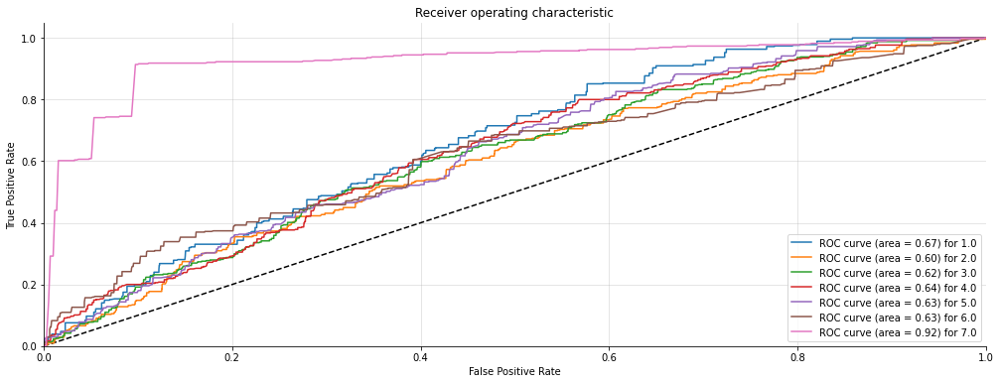

(3360, 7) (3360, 7)


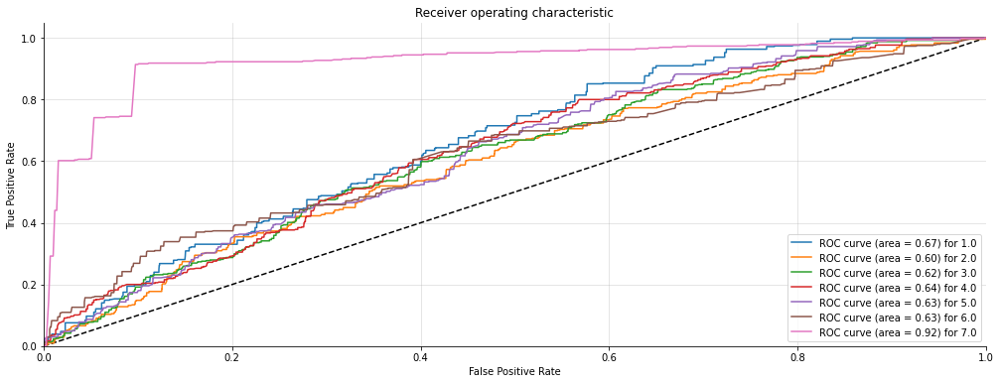

For column: inefficient<==>efficient
              precision    recall  f1-score   support

         1.0       0.22      0.50      0.31       462
         2.0       0.24      0.15      0.19       482
         3.0       0.21      0.07      0.10       506
         4.0       0.25      0.12      0.16       526
         5.0       0.19      0.14      0.16       458
         6.0       0.23      0.22      0.23       475
         7.0       0.48      0.85      0.62       451

    accuracy                           0.28      3360
   macro avg       0.26      0.29      0.25      3360
weighted avg       0.26      0.28      0.25      3360

Confusion Matrix: 
 [[232  32  26  11  41  58  62]
 [165  74  14  37  49  64  79]
 [138  71  33  50  49 101  64]
 [170  53  41  64  71  66  61]
 [179  34  37  48  63  56  41]
 [132  40   4  47  44 106 102]
 [ 30  10   4   3   9  10 385]]
Accuracy Score : 0.28482142857142856
Precision Score : 0.25802698853046085
Recall Score : 0.28482142857142856
F1 Score : 0.24636

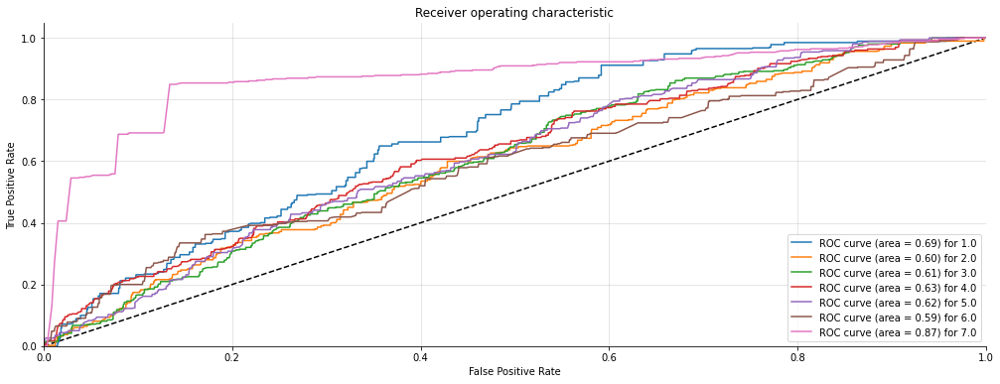

(3360, 7) (3360, 7)


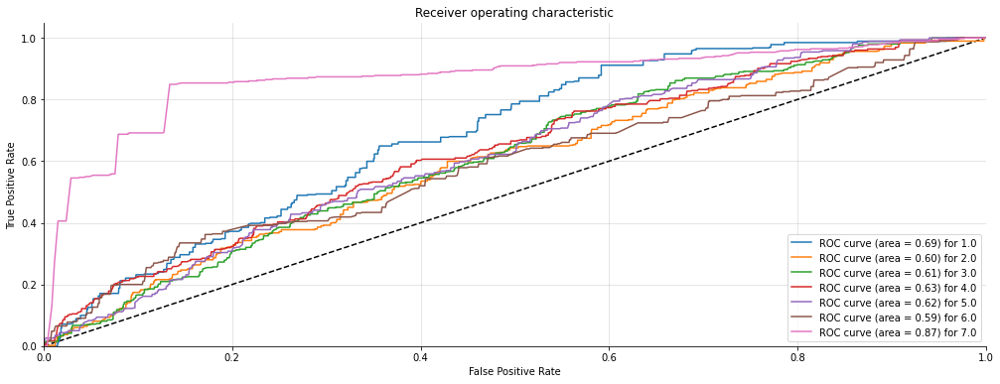

For column:  confusing<==>clear
              precision    recall  f1-score   support

         1.0       0.20      0.47      0.28       461
         2.0       0.25      0.16      0.20       488
         3.0       0.21      0.07      0.10       506
         4.0       0.23      0.12      0.16       516
         5.0       0.19      0.13      0.16       456
         6.0       0.22      0.21      0.21       471
         7.0       0.47      0.81      0.59       462

    accuracy                           0.27      3360
   macro avg       0.25      0.28      0.24      3360
weighted avg       0.25      0.27      0.24      3360

Confusion Matrix: 
 [[215  32  22  10  41  58  83]
 [171  80  14  35  51  61  76]
 [142  77  34  52  48  87  66]
 [170  53  44  61  69  62  57]
 [178  29  38  51  60  61  39]
 [138  43   3  43  37  97 110]
 [ 38  10   6  11   8  14 375]]
Accuracy Score : 0.27440476190476193
Precision Score : 0.25213261277668075
Recall Score : 0.27440476190476193
F1 Score : 0.2393463309

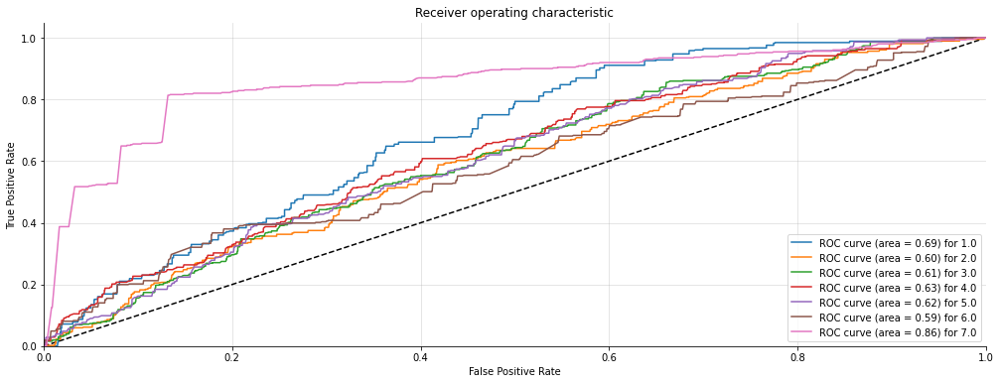

(3360, 7) (3360, 7)


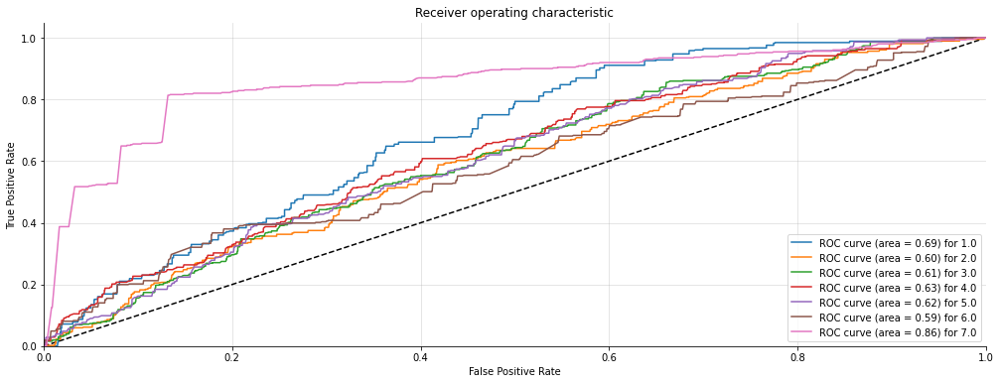

For column: boring<==>exciting
              precision    recall  f1-score   support

         1.0       0.21      0.16      0.18       463
         2.0       0.21      0.12      0.15       491
         3.0       0.21      0.14      0.17       487
         4.0       0.21      0.18      0.19       518
         5.0       0.29      0.32      0.30       487
         6.0       0.29      0.49      0.37       462
         7.0       0.69      0.99      0.81       452

    accuracy                           0.33      3360
   macro avg       0.30      0.34      0.31      3360
weighted avg       0.30      0.33      0.31      3360

Confusion Matrix: 
 [[ 74  63  42  37  76 119  52]
 [ 63  60  39  93  76 116  44]
 [ 50  50  67  78  95 119  28]
 [ 49  46  78  93 111 112  29]
 [ 50  37  76  70 155  76  23]
 [ 68  30  13  76  20 227  28]
 [  1   0   1   2   0   1 447]]
Accuracy Score : 0.33422619047619045
Precision Score : 0.2970982422479638
Recall Score : 0.33422619047619045
F1 Score : 0.305094465948

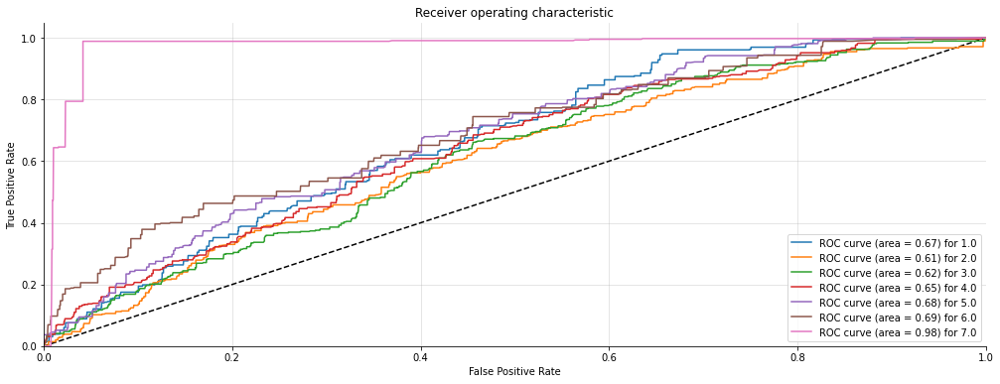

(3360, 7) (3360, 7)


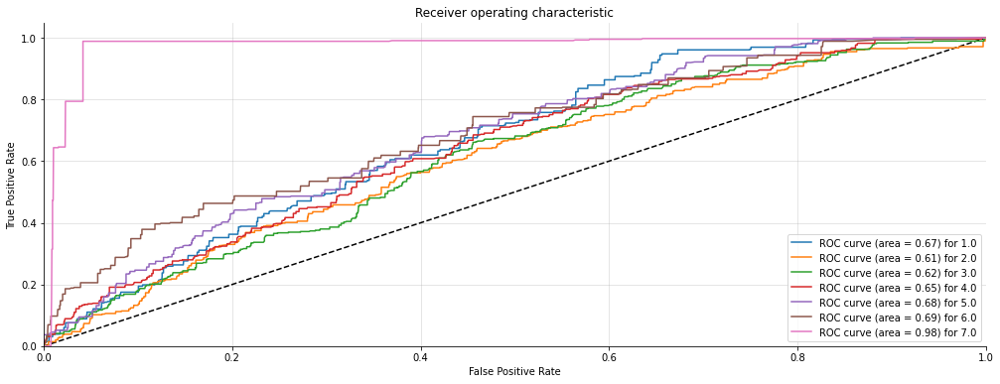

For column: not interesting<==>interesting
              precision    recall  f1-score   support

         1.0       0.23      0.18      0.20       461
         2.0       0.20      0.11      0.14       495
         3.0       0.21      0.13      0.16       490
         4.0       0.20      0.19      0.20       519
         5.0       0.29      0.31      0.30       481
         6.0       0.29      0.46      0.35       465
         7.0       0.69      1.00      0.81       449

    accuracy                           0.33      3360
   macro avg       0.30      0.34      0.31      3360
weighted avg       0.30      0.33      0.30      3360

Confusion Matrix: 
 [[ 83  52  36  50  70 119  51]
 [ 67  54  40  99  72 115  48]
 [ 50  54  66  78  90 122  30]
 [ 54  46  81 101 109  99  29]
 [ 42  43  67  77 148  80  24]
 [ 68  20  26  90  22 216  23]
 [  0   0   1   0   0   1 447]]
Accuracy Score : 0.3318452380952381
Precision Score : 0.2955665863846125
Recall Score : 0.3318452380952381
F1 Score : 0.30

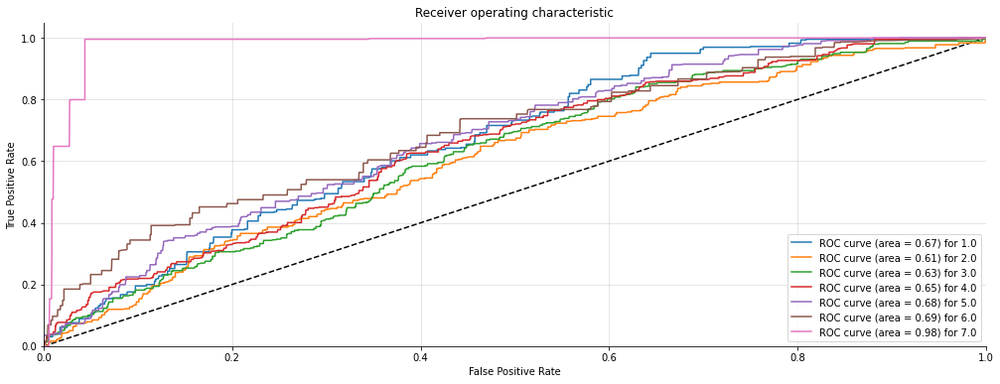

(3360, 7) (3360, 7)


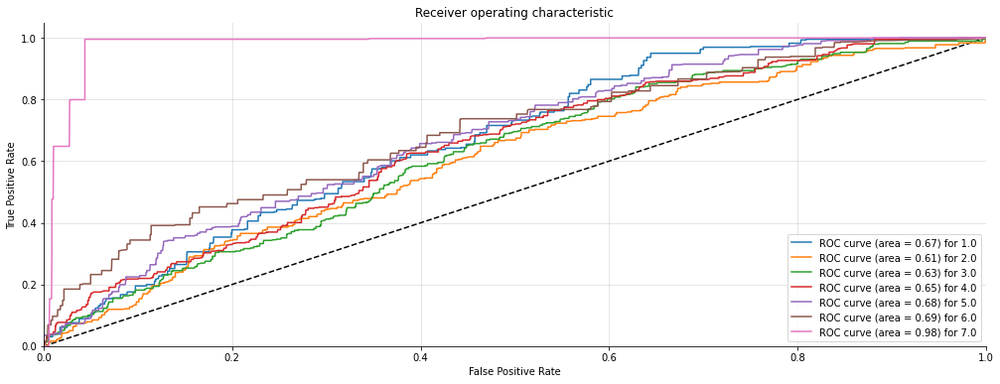

For column: conventional<==>inventive
              precision    recall  f1-score   support

         1.0       0.22      0.17      0.20       460
         2.0       0.21      0.12      0.15       502
         3.0       0.20      0.14      0.16       474
         4.0       0.21      0.19      0.20       527
         5.0       0.30      0.33      0.32       486
         6.0       0.29      0.47      0.36       459
         7.0       0.71      1.00      0.83       452

    accuracy                           0.34      3360
   macro avg       0.31      0.35      0.32      3360
weighted avg       0.30      0.34      0.31      3360

Confusion Matrix: 
 [[ 80  57  41  62  66 105  49]
 [ 66  60  42  96  80 118  40]
 [ 46  56  66  77  94 111  24]
 [ 56  51  73 102 100 116  29]
 [ 39  40  78  73 162  69  25]
 [ 70  23  29  72  33 217  15]
 [  0   0   0   1   0   0 451]]
Accuracy Score : 0.3386904761904762
Precision Score : 0.3032568134412629
Recall Score : 0.3386904761904762
F1 Score : 0.3117517

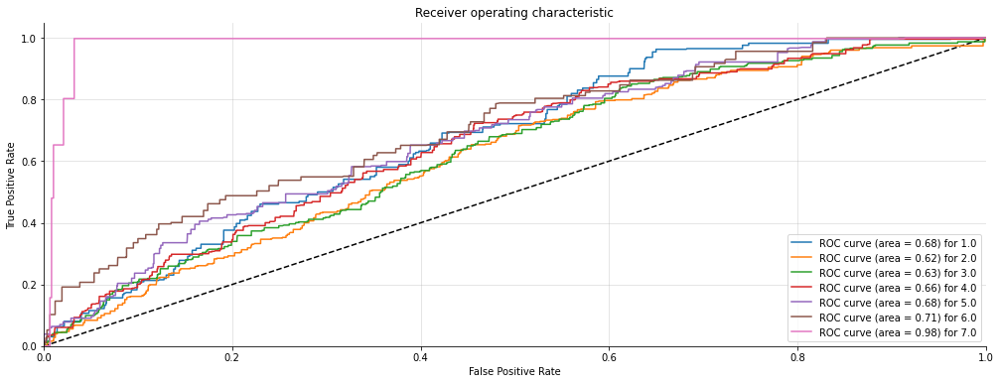

(3360, 7) (3360, 7)


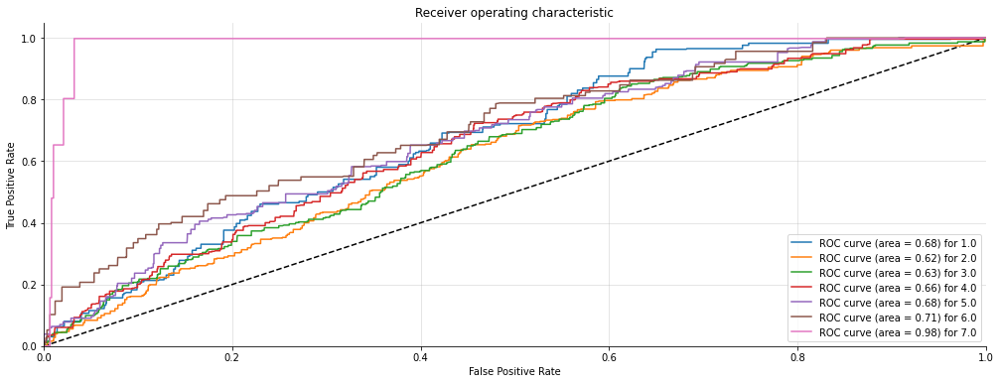

For column: usual<==>leading edge
              precision    recall  f1-score   support

         1.0       0.21      0.15      0.18       459
         2.0       0.21      0.13      0.16       496
         3.0       0.22      0.17      0.19       478
         4.0       0.23      0.21      0.22       523
         5.0       0.30      0.33      0.31       491
         6.0       0.30      0.47      0.37       462
         7.0       0.74      1.00      0.85       451

    accuracy                           0.34      3360
   macro avg       0.32      0.35      0.33      3360
weighted avg       0.31      0.34      0.32      3360

Confusion Matrix: 
 [[ 69  60  56  60  69  97  48]
 [ 61  64  47  98  76 112  38]
 [ 37  65  82  70  87 114  23]
 [ 42  54  73 110 110 113  21]
 [ 41  46  82  75 161  72  14]
 [ 71  22  28  73  34 218  16]
 [  0   0   0   0   0   0 451]]
Accuracy Score : 0.34375
Precision Score : 0.3108494083195904
Recall Score : 0.34375
F1 Score : 0.3193389752869872
(3360, 7) (3360,

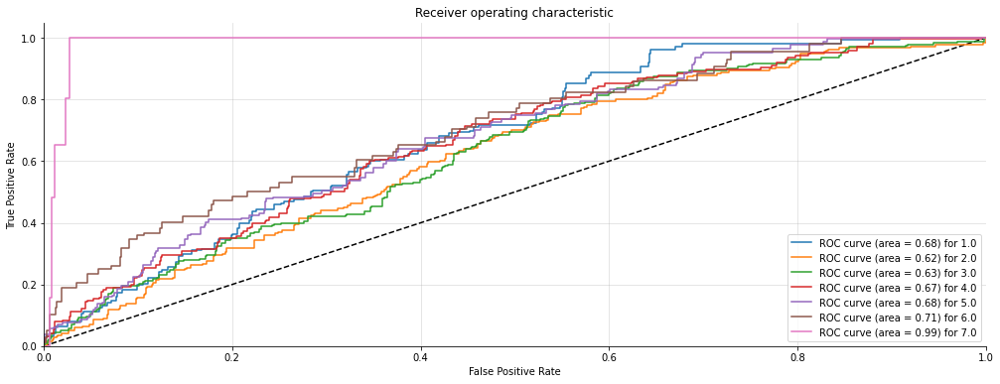

(3360, 7) (3360, 7)


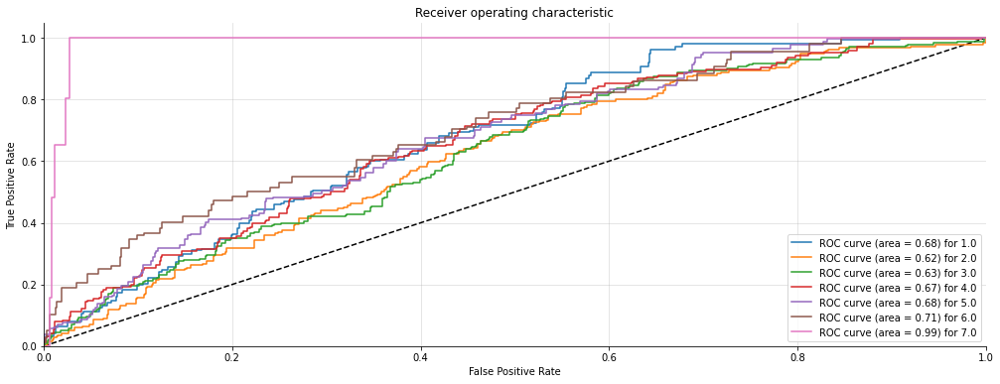

In [82]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC, LinearSVC
from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import plot_confusion_matrix, accuracy_score
acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]
fpo=dict()
tpo=dict()
ffpo=[]
ttpo=[]
def Logistic(X_train, X_test, y_train, y_test, n_classes, figsize=(8, 6)):
    model = LogisticRegression(multi_class='multinomial', solver='lbfgs')   
    model.fit(X_train, y_train)

    # predictions over test set
    predictions = [round(float(x)) for x in model.predict(X_test)]
    print((classification_report(y_test, predictions)))


    # calculating Accuracy Score, Precision Score, Recall Score and F1 Score
    print('Confusion Matrix: \n' ,confusion_matrix(y_test, predictions))
    acc.append(accuracy_score(y_test, predictions))
    print(f'Accuracy Score : {accuracy_score(y_test, predictions)}')
    pre.append(precision_score(y_test,predictions,average='weighted'))
    print('Precision Score : ' + str(precision_score(y_test,predictions,average='weighted')))
    recal.append(recall_score(y_test,predictions,average='weighted'))
    print('Recall Score : ' + str(recall_score(y_test,predictions,average='weighted')))
    f1.append(f1_score(y_test,predictions,average='weighted'))
    print('F1 Score : ' + str(f1_score(y_test,predictions,average='weighted')))
    rms.append(np.sqrt(mean_squared_error(y_test,predictions)))
    aucscore.append(score_auc(y_test,predictions))
    fpo,tpo=plot_multiclass_roc(model, X_test, y_test, n_classes)
    ffpo.append(fpo)
    ttpo.append(tpo)
    plot_multiclass_roc(model, X_test, y_test, n_classes)

for i in range(8):
  print('For column:', df.columns[1:][i])
  n_classes = len(np.unique(df[df.columns[1:][i]]))
  Logistic(X_train, X_test, y_train[:,i], y_test[:,i], n_classes, figsize=(8, 6))

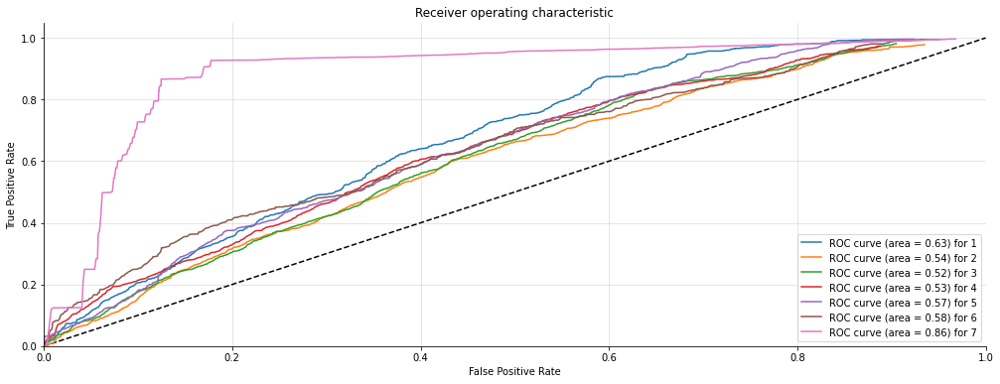

In [83]:
fsum0=list(np.array(dadd(dadd(dadd(ffpo[0][0],ffpo[1][0]),dadd(ffpo[2][0],ffpo[3][0])),dadd(dadd(ffpo[4][0],ffpo[5][0]),dadd(ffpo[6][0],ffpo[7][0]))))/8)
fsum1=list(np.array(dadd(dadd(dadd(ffpo[0][1],ffpo[1][1]),dadd(ffpo[2][1],ffpo[3][1])),dadd(dadd(ffpo[4][1],ffpo[5][1]),dadd(ffpo[6][1],ffpo[7][1]))))/8)
fsum2=list(np.array(dadd(dadd(dadd(ffpo[0][2],ffpo[1][2]),dadd(ffpo[2][2],ffpo[3][2])),dadd(dadd(ffpo[4][2],ffpo[5][2]),dadd(ffpo[6][2],ffpo[7][2]))))/8)
fsum3=list(np.array(dadd(dadd(dadd(ffpo[0][3],ffpo[1][3]),dadd(ffpo[2][3],ffpo[3][3])),dadd(dadd(ffpo[4][3],ffpo[5][3]),dadd(ffpo[6][3],ffpo[7][3]))))/8)
fsum4=list(np.array(dadd(dadd(dadd(ffpo[0][4],ffpo[1][4]),dadd(ffpo[2][4],ffpo[3][4])),dadd(dadd(ffpo[4][4],ffpo[5][4]),dadd(ffpo[6][4],ffpo[7][4]))))/8)
fsum5=list(np.array(dadd(dadd(dadd(ffpo[0][4],ffpo[1][5]),dadd(ffpo[2][5],ffpo[3][5])),dadd(dadd(ffpo[4][5],ffpo[5][5]),dadd(ffpo[6][5],ffpo[7][5]))))/8)
fsum6=list(np.array(dadd(dadd(dadd(ffpo[0][6],ffpo[1][6]),dadd(ffpo[2][6],ffpo[3][6])),dadd(dadd(ffpo[4][6],ffpo[5][6]),dadd(ffpo[6][6],ffpo[7][6]))))/8)

fpr=dict()

fsum0.sort()
fpr[0]=fsum0
fsum1.sort()
fpr[1]=fsum1
fsum2.sort()
fpr[2]=fsum2
fsum3.sort()
fpr[3]=fsum3
fsum4.sort()
fpr[4]=fsum4
fsum5.sort()
fpr[5]=fsum5
fsum6.sort()
fpr[6]=fsum6


tsum0=list(np.array(dadd(dadd(dadd(ttpo[0][0],ttpo[1][0]),dadd(ttpo[2][0],ttpo[3][0])),dadd(dadd(ttpo[4][0],ttpo[5][0]),dadd(ttpo[6][0],ttpo[7][0]))))/8)
tsum1=list(np.array(dadd(dadd(dadd(ttpo[0][1],ttpo[1][1]),dadd(ttpo[2][1],ttpo[3][1])),dadd(dadd(ttpo[4][1],ttpo[5][1]),dadd(ttpo[6][1],ttpo[7][1]))))/8)
tsum2=list(np.array(dadd(dadd(dadd(ttpo[0][2],ttpo[1][2]),dadd(ttpo[2][2],ttpo[3][2])),dadd(dadd(ttpo[4][2],ttpo[5][2]),dadd(ttpo[6][2],ttpo[7][2]))))/8)
tsum3=list(np.array(dadd(dadd(dadd(ttpo[0][3],ttpo[1][3]),dadd(ttpo[2][3],ttpo[3][3])),dadd(dadd(ttpo[4][3],ttpo[5][3]),dadd(ttpo[6][3],ttpo[7][3]))))/8)
tsum4=list(np.array(dadd(dadd(dadd(ttpo[0][4],ttpo[1][4]),dadd(ttpo[2][4],ttpo[3][4])),dadd(dadd(ttpo[4][4],ttpo[5][4]),dadd(ttpo[6][4],ttpo[7][4]))))/8)
tsum5=list(np.array(dadd(dadd(dadd(ttpo[0][4],ttpo[1][5]),dadd(ttpo[2][5],ttpo[3][5])),dadd(dadd(ttpo[4][5],ttpo[5][5]),dadd(ttpo[6][5],ttpo[7][5]))))/8)
tsum6=list(np.array(dadd(dadd(dadd(ttpo[0][6],ttpo[1][6]),dadd(ttpo[2][6],ttpo[3][6])),dadd(dadd(ttpo[4][6],ttpo[5][6]),dadd(ttpo[6][6],ttpo[7][6]))))/8)

tpr=dict()

tsum0.sort()
tpr[0]=tsum0
tsum1.sort()
tpr[1]=tsum1
tsum2.sort()
tpr[2]=tsum2
tsum3.sort()
tpr[3]=tsum3
tsum4.sort()
tpr[4]=tsum4
tsum5.sort()
tpr[5]=tsum5
tsum6.sort()
tpr[6]=tsum6

plot_multiclass_roc_avg(fpr,tpr,7)

In [84]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE :{}".format(np.mean(rms)))
print("average AUC score {}".format(np.mean(aucscore)))
metric_df['LogisticModel'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.309375
average Precision :0.2781180503400065
average Recall :0.309375
average F1 -score :0.2784276520622817
average RMSE :2.4754650604857185
average AUC score 0.5975303428780016


# 4.5 Neural network - classifier

In [72]:
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam

initializer = tf.keras.initializers.RandomNormal(seed=1) # Reproducibility

model = Sequential(name="classifier_NN")
model.add(tf.keras.Input(shape=(X_train.shape[1],))) # Automatically detect features as input nodes
model.add(layers.Dense(512, activation='relu', kernel_initializer=initializer))
model.add(layers.Dense(256, activation='relu', kernel_initializer=initializer))
model.add(layers.Dropout(0.1))
model.add(layers.Dense(256, activation='relu', kernel_initializer=initializer))
model.add(layers.Dropout(0.1))
model.add(layers.Dense(256, activation='relu', kernel_initializer=initializer))
model.add(layers.Dense(128, activation='relu', kernel_initializer=initializer))
model.add(layers.Dropout(0.1))
model.add(layers.Dense(128, activation='relu', kernel_initializer=initializer))
model.add(layers.Dense(64, activation='relu', kernel_initializer=initializer))
model.add(layers.Dropout(0.1))
model.add(layers.Dense(8)) # output layer
opt = tf.keras.optimizers.Adam(learning_rate = 0.0003)
model.compile(loss=tf.keras.losses.MeanSquaredError(), metrics=['mae'], optimizer = opt)
model.summary()

Model: "classifier_NN"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_10 (Dense)             (None, 512)               10752     
_________________________________________________________________
dense_11 (Dense)             (None, 256)               131328    
_________________________________________________________________
dropout_6 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_12 (Dense)             (None, 256)               65792     
_________________________________________________________________
dropout_7 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_13 (Dense)             (None, 256)               65792     
_________________________________________________________________
dense_14 (Dense)             (None, 128)             

Epoch 1/150
588/588 - 2s - loss: 4.8037 - mae: 1.7020 - val_loss: 3.2597 - val_mae: 1.4213
Epoch 2/150
588/588 - 1s - loss: 2.6855 - mae: 1.2627 - val_loss: 1.7997 - val_mae: 1.0120
Epoch 3/150
588/588 - 1s - loss: 1.8801 - mae: 1.0519 - val_loss: 1.3831 - val_mae: 0.9020
Epoch 4/150
588/588 - 1s - loss: 1.5330 - mae: 0.9458 - val_loss: 1.2273 - val_mae: 0.8081
Epoch 5/150
588/588 - 1s - loss: 1.3674 - mae: 0.8874 - val_loss: 1.0664 - val_mae: 0.7776
Epoch 6/150
588/588 - 1s - loss: 1.2288 - mae: 0.8276 - val_loss: 1.2306 - val_mae: 0.8412
Epoch 7/150
588/588 - 1s - loss: 1.1341 - mae: 0.7854 - val_loss: 0.9644 - val_mae: 0.7384
Epoch 8/150
588/588 - 1s - loss: 1.0985 - mae: 0.7645 - val_loss: 1.0276 - val_mae: 0.7882
Epoch 9/150
588/588 - 1s - loss: 1.0325 - mae: 0.7339 - val_loss: 1.1449 - val_mae: 0.8164
Epoch 10/150
588/588 - 1s - loss: 0.9854 - mae: 0.7045 - val_loss: 0.9333 - val_mae: 0.6934
Epoch 11/150
588/588 - 1s - loss: 0.9508 - mae: 0.6869 - val_loss: 0.8548 - val_mae: 0.67

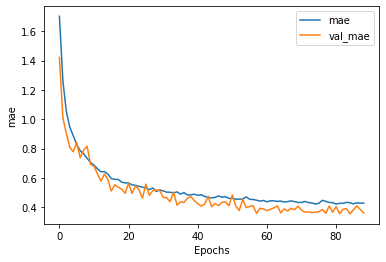

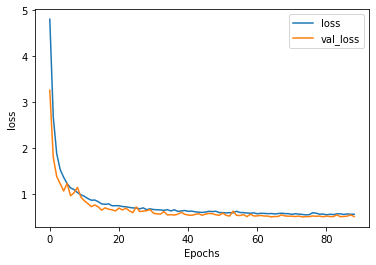

In [73]:
es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=15)
history = model.fit(X_train, y_train, epochs=150, batch_size = 16, validation_split=0.3, 
                    callbacks = [es], # Call checkpoint variable if neccessary
                    verbose=2)

plot_graphs(history, "mae")
plot_graphs(history, "loss")

In [74]:
scores = model.evaluate(
    X_test, y_test, batch_size=1, verbose=1, sample_weight=None, steps=None,
    callbacks=None, max_queue_size=10, workers=4, use_multiprocessing=False,
    return_dict=False
)
print("------------------ EVALUATION FINISHED! ------------------".center(115))
for i in range(len(scores)):
    print("%s: %.2f%%" % (model.metrics_names[i], scores[i]*100))

3360/3360 [==============================] - 3s 797us/step - loss: 0.5434 - mae: 0.3732
                             ------------------ EVALUATION FINISHED! ------------------                            
loss: 54.34%
mae: 37.32%


In [75]:
from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import plot_confusion_matrix, accuracy_score
from sklearn.metrics import mean_squared_error
acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]

In [76]:
from sklearn.metrics import classification_report, f1_score
y_pred = model.predict(X_test)
for i in range(8):
    print("Column", df.columns[1:][i])
    estimates = [round(float(x)) for x in y_pred[:,i]]
    estimates = transform_results(estimates)
    print(np.unique(estimates))
    acc.append(accuracy_score(y_test[:,i], estimates))
    pre.append(precision_score(y_test[:,i], estimates,average='weighted'))
    recal.append(recall_score(y_test[:,i], estimates,average='weighted'))
    f1.append(f1_score(y_test[:,i], estimates,average='weighted'))
    rms.append(np.sqrt(mean_squared_error(y_test[:,i], estimates)))
    aucscore.append(score_auc(y_test[:,i], estimates))
    print(classification_report(y_test[:,i], estimates), "\n------")

Column obstructive<==>supportive
[1 2 3 4 5 6 7]
              precision    recall  f1-score   support

         1.0       0.95      0.87      0.91       462
         2.0       0.68      0.43      0.53       482
         3.0       0.52      0.72      0.60       510
         4.0       0.64      0.67      0.65       517
         5.0       0.62      0.66      0.64       467
         6.0       0.72      0.67      0.70       470
         7.0       0.82      0.81      0.82       452

    accuracy                           0.69      3360
   macro avg       0.71      0.69      0.69      3360
weighted avg       0.70      0.69      0.69      3360
 
------
Column complicated<==>easy
[1 2 3 4 5 6 7]
              precision    recall  f1-score   support

         1.0       0.96      0.88      0.92       463
         2.0       0.72      0.53      0.61       485
         3.0       0.56      0.73      0.63       501
         4.0       0.66      0.68      0.67       515
         5.0       0.68      0.7

In [77]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE -score :{}".format(np.mean(rms)))
print("average AUC -score :{}".format(np.mean(aucscore)))
metric_df['Neural Network classifier 2'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.8002976190476191
average Precision :0.8081518331350235
average Recall :0.8002976190476191
average F1 -score :0.800608900131469
average RMSE -score :0.6910628449200209
average AUC -score :0.8830736093591272


# 4.6 LSTM 

In [78]:
## Callbacks
es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=7)

checkpoint = tf.keras.callbacks.ModelCheckpoint(
  "model_checkpoints", monitor="val_loss", verbose=1, save_best_only=True, mode="min")

## Optimizer
opt = tf.keras.optimizers.Adam(learning_rate=0.001)

LSTM_model = tf.keras.Sequential([
    tf.keras.layers.Embedding(4000, 128),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(128)),
    #tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(32)),
    # use ReLU in place of tanh function since they are very good alternatives of each other.
    tf.keras.layers.Dense(64, activation='relu', 
                          
                          # Prevent overfitting
                          kernel_regularizer=tf.keras.regularizers.L2(l2=0.01), 

                          # Ensuring consistent outputs and not run into potential local optima
                          # Avoid initializing standard normal (mean = 0, std = 1) to reach faster convergence and less initial loss.
                          kernel_initializer=tf.keras.initializers.RandomNormal(seed=42)
                          
                          ),
     
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(8, activation='linear')
])
LSTM_model.summary()

LSTM_model.compile(loss=tf.keras.losses.MeanSquaredError(), optimizer= opt, metrics=['mae'])

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_1 (Embedding)      (None, None, 128)         512000    
_________________________________________________________________
bidirectional_1 (Bidirection (None, 256)               263168    
_________________________________________________________________
dense_18 (Dense)             (None, 64)                16448     
_________________________________________________________________
dropout_10 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_19 (Dense)             (None, 8)                 520       
Total params: 792,136
Trainable params: 792,136
Non-trainable params: 0
_________________________________________________________________


In [79]:
history = LSTM_model.fit(X_train, y_train, epochs=100, batch_size = 512, validation_split=0.2, 
                    callbacks = [es], # Call checkpoint variable if neccessary
                    verbose=1)

Epoch 1/100
21/21 [==============================] - 7s 241ms/step - loss: 14.5513 - mae: 3.1819 - val_loss: 4.5479 - val_mae: 1.7627
Epoch 2/100
21/21 [==============================] - 5s 229ms/step - loss: 5.4067 - mae: 1.9033 - val_loss: 4.1496 - val_mae: 1.7057
Epoch 3/100
21/21 [==============================] - 5s 217ms/step - loss: 4.9482 - mae: 1.8416 - val_loss: 4.0305 - val_mae: 1.6874
Epoch 4/100
21/21 [==============================] - 5s 220ms/step - loss: 4.5512 - mae: 1.7686 - val_loss: 3.4934 - val_mae: 1.5446
Epoch 5/100
21/21 [==============================] - 5s 218ms/step - loss: 3.2313 - mae: 1.3773 - val_loss: 1.8318 - val_mae: 0.9729
Epoch 6/100
21/21 [==============================] - 5s 216ms/step - loss: 1.8363 - mae: 0.9785 - val_loss: 1.1360 - val_mae: 0.7084
Epoch 7/100
21/21 [==============================] - 5s 216ms/step - loss: 1.4321 - mae: 0.8225 - val_loss: 0.9102 - val_mae: 0.5429
Epoch 8/100
21/21 [==============================] - 4s 215ms/step -

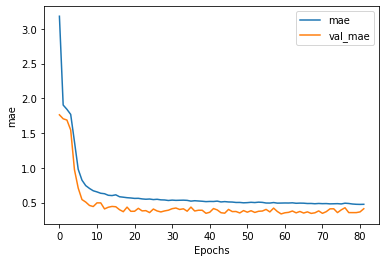

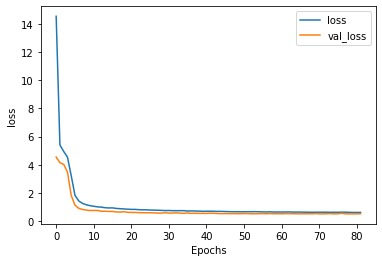

In [80]:
plot_graphs(history, "mae")
plot_graphs(history, "loss")

In [81]:
scores = LSTM_model.evaluate(
    X_test, y_test, batch_size=1, verbose=1, sample_weight=None, steps=None,
    callbacks=None, max_queue_size=10, workers=4, use_multiprocessing=False,
    return_dict=False
)
print("------------------ EVALUATION FINISHED! ------------------".center(115))
for i in range(len(scores)):
    print("%s: %.2f%%" % (model.metrics_names[i], scores[i]*100))

3360/3360 [==============================] - 6s 2ms/step - loss: 0.5381 - mae: 0.4194
                             ------------------ EVALUATION FINISHED! ------------------                            
loss: 53.81%
mae: 41.94%


In [82]:
from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import plot_confusion_matrix, accuracy_score
from sklearn.metrics import mean_squared_error
acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]

In [83]:
from sklearn.metrics import classification_report, f1_score
y_pred = LSTM_model.predict(X_test)
for i in range(8):
    print("Column", df.columns[1:][i])
    estimates = [round(float(x)) for x in y_pred[:,i]]
    estimates = transform_results(estimates)
    print(np.unique(estimates))
    acc.append(accuracy_score(y_test[:,i], estimates))
    pre.append(precision_score(y_test[:,i], estimates,average='weighted'))
    recal.append(recall_score(y_test[:,i], estimates,average='weighted'))
    f1.append(f1_score(y_test[:,i], estimates,average='weighted'))
    rms.append(np.sqrt(mean_squared_error(y_test[:,i], estimates)))
    aucscore.append(score_auc(y_test[:,i], estimates))
    print(classification_report(y_test[:,i], estimates), "\n------")

Column obstructive<==>supportive
[1 2 3 4 5 6 7]
              precision    recall  f1-score   support

         1.0       0.94      0.58      0.71       462
         2.0       0.50      0.51      0.51       482
         3.0       0.55      0.70      0.62       510
         4.0       0.65      0.72      0.68       517
         5.0       0.62      0.65      0.63       467
         6.0       0.74      0.67      0.70       470
         7.0       0.82      0.81      0.82       452

    accuracy                           0.66      3360
   macro avg       0.69      0.66      0.67      3360
weighted avg       0.68      0.66      0.66      3360
 
------
Column complicated<==>easy
[1 2 3 4 5 6 7]
              precision    recall  f1-score   support

         1.0       0.95      0.72      0.82       463
         2.0       0.62      0.59      0.61       485
         3.0       0.59      0.71      0.64       501
         4.0       0.67      0.74      0.70       515
         5.0       0.70      0.7

In [84]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE -score :{}".format(np.mean(rms)))
print("average AUC -score :{}".format(np.mean(aucscore)))
metric_df['Bidirectional LSTM 2'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.7912574404761905
average Precision :0.8019577634960888
average Recall :0.7912574404761905
average F1 -score :0.7928969648672743
average RMSE -score :0.681793868277493
average AUC -score :0.8778168374843642


# 4.7 Ensemble

In [85]:
from sklearn.model_selection import cross_val_score
from sklearn.datasets import make_blobs
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier


# 4.7.1 Decison tree classifier

For column: obstructive<==>supportive
              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96       462
         2.0       0.80      0.89      0.84       482
         3.0       0.73      0.69      0.71       510
         4.0       0.67      0.66      0.66       517
         5.0       0.66      0.66      0.66       467
         6.0       0.73      0.72      0.73       470
         7.0       0.82      0.81      0.82       452

    accuracy                           0.77      3360
   macro avg       0.77      0.77      0.77      3360
weighted avg       0.77      0.77      0.77      3360

Confusion Matrix: 
 [[442  20   0   0   0   0   0]
 [  1 428  51   0   1   1   0]
 [  0  33 353 119   2   3   0]
 [  0   1  35 339 141   1   0]
 [  4   4  15  25 307 112   0]
 [  3  19  12   8   6 339  83]
 [ 10  28  18  12  10   6 368]]
Accuracy Score : 0.7666666666666667
Precision Score : 0.7654919450685581
Recall Score : 0.7666666666666667
F1 Score : 0.7656717

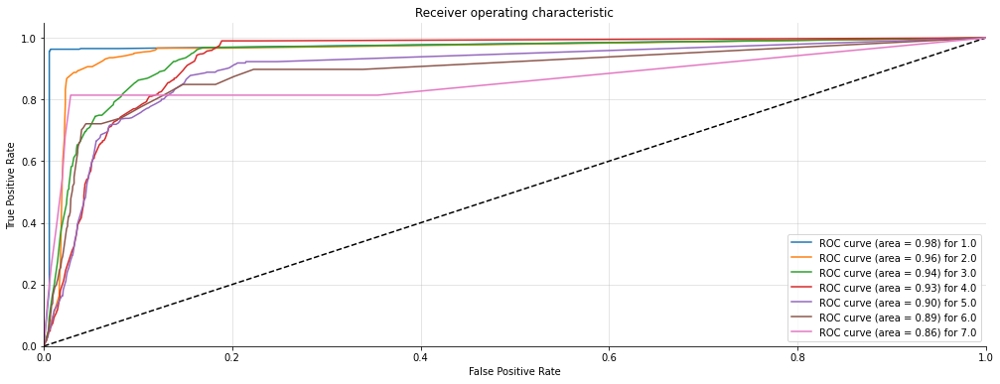

For column: complicated<==>easy
              precision    recall  f1-score   support

         1.0       0.96      0.95      0.96       463
         2.0       0.80      0.88      0.84       485
         3.0       0.73      0.71      0.72       501
         4.0       0.70      0.67      0.68       515
         5.0       0.71      0.75      0.73       460
         6.0       0.83      0.79      0.81       484
         7.0       0.90      0.90      0.90       452

    accuracy                           0.80      3360
   macro avg       0.81      0.81      0.81      3360
weighted avg       0.80      0.80      0.80      3360

Confusion Matrix: 
 [[442  20   0   0   0   1   0]
 [  1 429  51   0   1   3   0]
 [  0  32 354 113   2   0   0]
 [  0   2  45 343 123   2   0]
 [  3  13  17  14 343  70   0]
 [  5  19  14  13   6 384  43]
 [  9  18   6   4   5   2 408]]
Accuracy Score : 0.8044642857142857
Precision Score : 0.804179909788098
Recall Score : 0.8044642857142857
F1 Score : 0.80383748036040

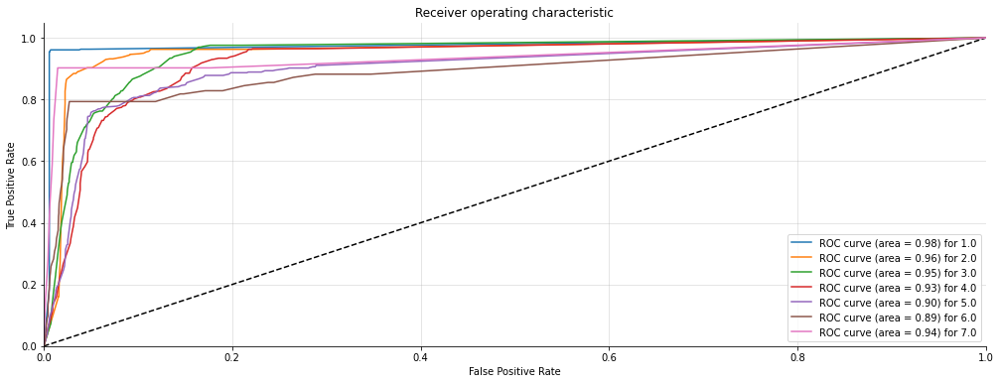

For column: inefficient<==>efficient
              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96       462
         2.0       0.80      0.89      0.85       482
         3.0       0.73      0.70      0.71       506
         4.0       0.69      0.65      0.67       526
         5.0       0.66      0.68      0.67       458
         6.0       0.73      0.71      0.72       475
         7.0       0.83      0.83      0.83       451

    accuracy                           0.77      3360
   macro avg       0.77      0.77      0.77      3360
weighted avg       0.77      0.77      0.77      3360

Confusion Matrix: 
 [[442  19   0   0   0   1   0]
 [  1 429  51   0   1   0   0]
 [  0  32 352 118   1   3   0]
 [  0   2  39 344 141   0   0]
 [  2   4   8  17 310 117   0]
 [  6  17  22  12   6 335  77]
 [  9  30  12  11   9   6 374]]
Accuracy Score : 0.7696428571428572
Precision Score : 0.7684885860370676
Recall Score : 0.7696428571428572
F1 Score : 0.76861802

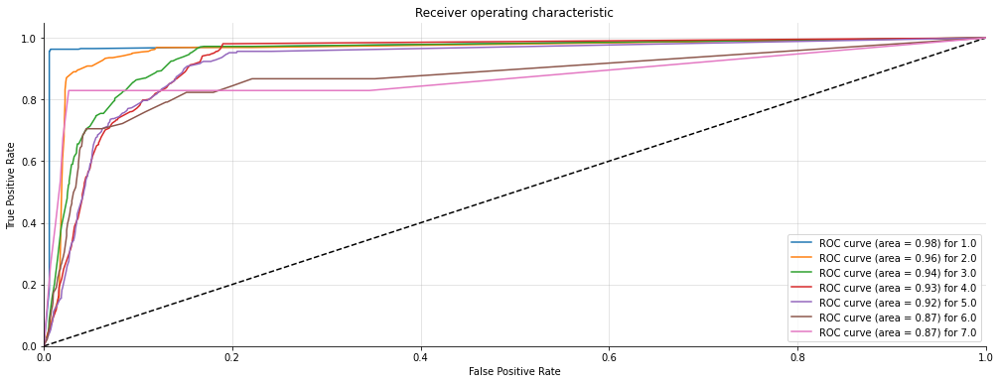

For column:  confusing<==>clear
              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96       461
         2.0       0.80      0.88      0.84       488
         3.0       0.73      0.69      0.71       506
         4.0       0.67      0.66      0.66       516
         5.0       0.67      0.68      0.67       456
         6.0       0.73      0.72      0.73       471
         7.0       0.81      0.79      0.80       462

    accuracy                           0.77      3360
   macro avg       0.77      0.77      0.77      3360
weighted avg       0.77      0.77      0.77      3360

Confusion Matrix: 
 [[442  19   0   0   0   0   0]
 [  1 429  52   1   2   3   0]
 [  0  33 351 121   0   1   0]
 [  0   0  34 338 142   2   0]
 [  2   2  10  17 312 113   0]
 [  2  16  16   9   3 339  86]
 [ 13  34  21  15  10   4 365]]
Accuracy Score : 0.7666666666666667
Precision Score : 0.7659743484519961
Recall Score : 0.7666666666666667
F1 Score : 0.7659643013203

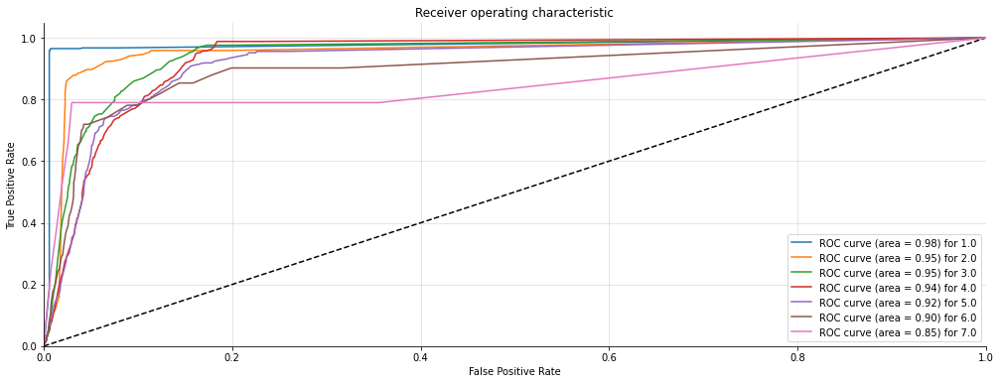

For column: boring<==>exciting
              precision    recall  f1-score   support

         1.0       0.96      0.95      0.96       463
         2.0       0.87      0.88      0.88       491
         3.0       0.83      0.82      0.82       487
         4.0       0.86      0.87      0.87       518
         5.0       0.92      0.92      0.92       487
         6.0       0.96      0.96      0.96       462
         7.0       0.99      0.99      0.99       452

    accuracy                           0.91      3360
   macro avg       0.91      0.91      0.91      3360
weighted avg       0.91      0.91      0.91      3360

Confusion Matrix: 
 [[442  18   1   0   1   1   0]
 [  5 434  46   2   1   3   0]
 [  7  23 397  58   2   0   0]
 [  3  16  17 449  32   1   0]
 [  1   5  11   9 450  11   0]
 [  1   3   4   2   4 443   5]
 [  0   0   2   0   1   3 446]]
Accuracy Score : 0.9110119047619047
Precision Score : 0.9110014387161348
Recall Score : 0.9110119047619047
F1 Score : 0.91098255464839

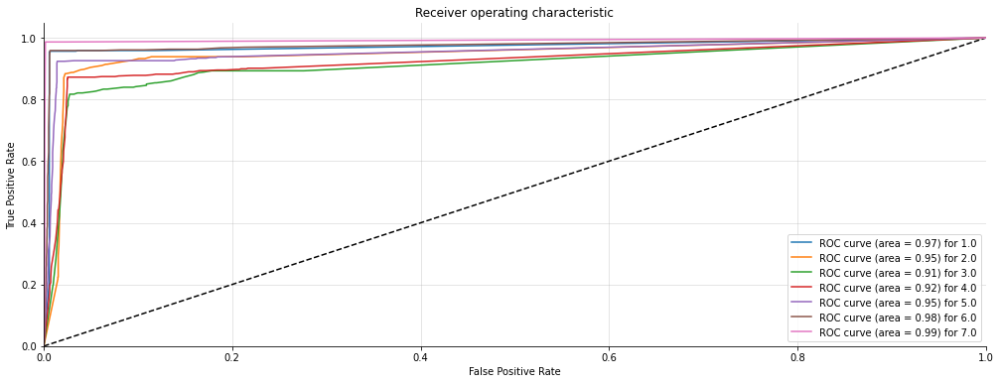

For column: not interesting<==>interesting
              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96       461
         2.0       0.86      0.87      0.86       495
         3.0       0.81      0.79      0.80       490
         4.0       0.83      0.83      0.83       519
         5.0       0.89      0.91      0.90       481
         6.0       0.96      0.96      0.96       465
         7.0       0.99      0.99      0.99       449

    accuracy                           0.90      3360
   macro avg       0.90      0.90      0.90      3360
weighted avg       0.90      0.90      0.90      3360

Confusion Matrix: 
 [[442  18   1   0   0   0   0]
 [  6 430  51   2   2   4   0]
 [  7  27 386  69   0   1   0]
 [  3  17  20 432  47   0   0]
 [  1   7  11  15 436  11   0]
 [  1   3   3   2   6 445   5]
 [  0   0   2   0   0   1 446]]
Accuracy Score : 0.8979166666666667
Precision Score : 0.897677251944814
Recall Score : 0.8979166666666667
F1 Score : 0.897

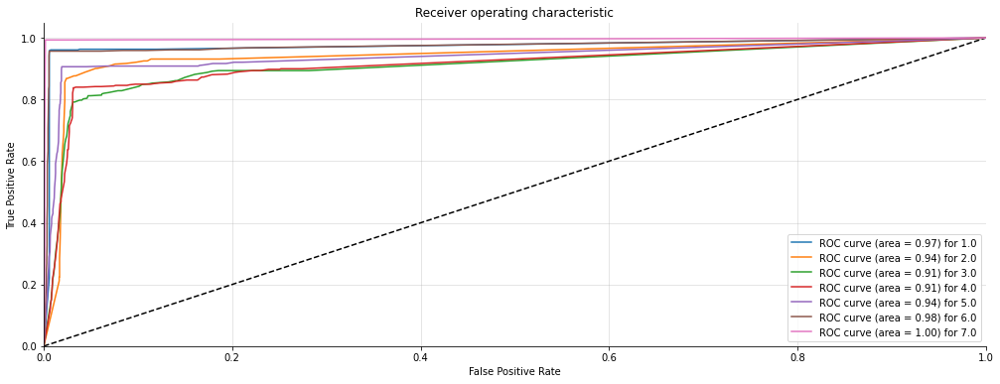

For column: conventional<==>inventive
              precision    recall  f1-score   support

         1.0       0.99      0.99      0.99       460
         2.0       0.96      0.95      0.96       502
         3.0       0.94      0.95      0.95       474
         4.0       0.96      0.95      0.95       527
         5.0       0.97      0.98      0.97       486
         6.0       0.98      0.99      0.99       459
         7.0       1.00      1.00      1.00       452

    accuracy                           0.97      3360
   macro avg       0.97      0.97      0.97      3360
weighted avg       0.97      0.97      0.97      3360

Confusion Matrix: 
 [[454   6   0   0   0   0   0]
 [  5 479  15   2   1   0   0]
 [  0  12 449  13   0   0   0]
 [  0   1  12 500  10   4   0]
 [  0   0   0   8 476   2   0]
 [  0   0   0   0   4 455   0]
 [  0   0   0   0   0   1 451]]
Accuracy Score : 0.9714285714285714
Precision Score : 0.9714203087811575
Recall Score : 0.9714285714285714
F1 Score : 0.9714139

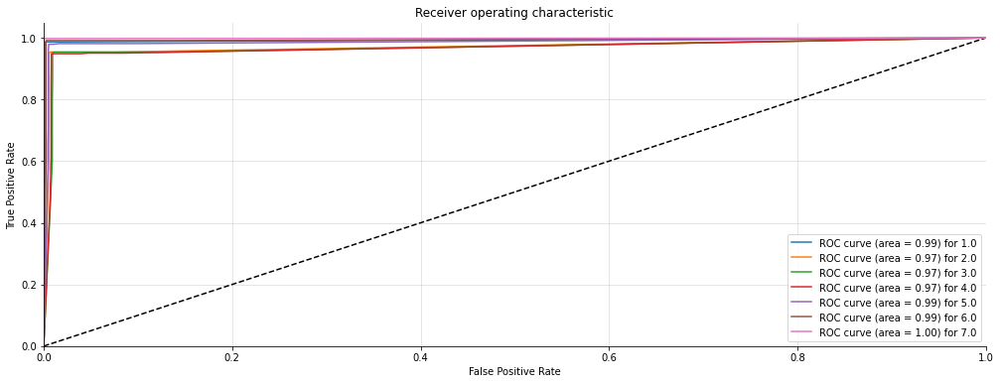

For column: usual<==>leading edge
              precision    recall  f1-score   support

         1.0       1.00      1.00      1.00       459
         2.0       1.00      1.00      1.00       496
         3.0       1.00      1.00      1.00       478
         4.0       1.00      1.00      1.00       523
         5.0       1.00      1.00      1.00       491
         6.0       1.00      1.00      1.00       462
         7.0       1.00      1.00      1.00       451

    accuracy                           1.00      3360
   macro avg       1.00      1.00      1.00      3360
weighted avg       1.00      1.00      1.00      3360

Confusion Matrix: 
 [[459   0   0   0   0   0   0]
 [  0 496   0   0   0   0   0]
 [  0   0 478   0   0   0   0]
 [  0   0   0 523   0   0   0]
 [  0   0   0   0 491   0   0]
 [  0   0   0   0   0 462   0]
 [  0   0   0   0   0   0 451]]
Accuracy Score : 1.0
Precision Score : 1.0
Recall Score : 1.0
F1 Score : 1.0
(3360, 7) (3360, 7)


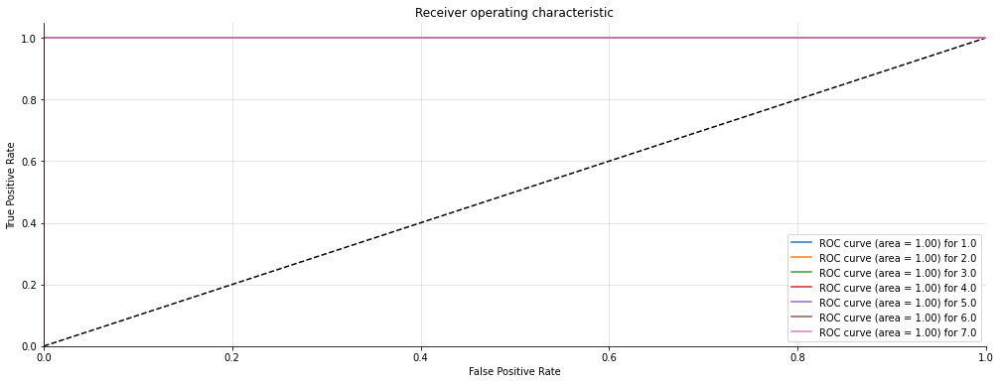

In [147]:
acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]
fpo=dict()
tpo=dict()
ffpo=[]
ttpo=[]
from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import plot_confusion_matrix, accuracy_score
def DTC(X_train, X_test, y_train, y_test, n_classes, figsize=(8, 6)):
    model = DecisionTreeClassifier(max_depth=None, min_samples_split=2,
     random_state=0)   
    model.fit(X_train, y_train)

    # predictions over test set
    predictions = [round(float(x)) for x in model.predict(X_test)]
    print((classification_report(y_test, predictions)))


    # calculating Accuracy Score, Precision Score, Recall Score and F1 Score
    print('Confusion Matrix: \n' ,confusion_matrix(y_test, predictions))
    acc.append(accuracy_score(y_test, predictions))
    print(f'Accuracy Score : {accuracy_score(y_test, predictions)}')
    pre.append(precision_score(y_test,predictions,average='weighted'))
    print('Precision Score : ' + str(precision_score(y_test,predictions,average='weighted')))
    recal.append(recall_score(y_test,predictions,average='weighted'))
    print('Recall Score : ' + str(recall_score(y_test,predictions,average='weighted')))
    f1.append(f1_score(y_test,predictions,average='weighted'))
    print('F1 Score : ' + str(f1_score(y_test,predictions,average='weighted')))
    aucscore.append(score_auc(y_test,predictions))
    rms.append(np.sqrt(mean_squared_error(y_test,predictions)))
    fpo,tpo=plot_multiclass_roc(model, X_test, y_test, n_classes)
    ffpo.append(fpo)
    ttpo.append(tpo)


for i in range(8):
  print('For column:', df.columns[1:][i])
  n_classes = len(np.unique(df[df.columns[1:][i]]))
  DTC(X_train, X_test, y_train[:,i], y_test[:,i], n_classes, figsize=(8, 6))

In [148]:
fsum0=[]
fsum1=[]
fsum2=[]
fsum3=[]
fsum4=[]
fsum5=[]
fsum6=[]
tsum0=[]
tsum1=[]
tsum2=[]
tsum3=[]
tsum4=[]
tsum5=[]
tsum6=[]

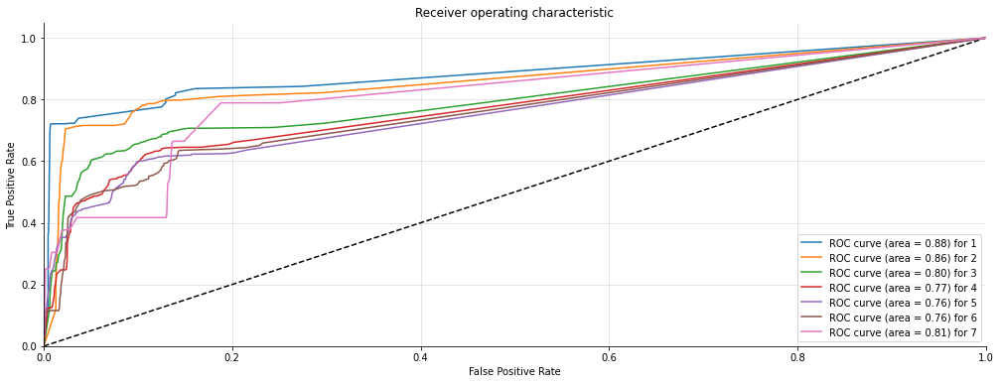

In [153]:
fsum0=list(np.array(dadd(dadd(dadd(ffpo[0][0],ffpo[1][0]),dadd(ffpo[2][0],ffpo[3][0])),dadd(dadd(ffpo[4][0],ffpo[5][0]),dadd(ffpo[6][0],ffpo[7][0]))))/8)
fsum1=list(np.array(dadd(dadd(dadd(ffpo[0][1],ffpo[1][1]),dadd(ffpo[2][1],ffpo[3][1])),dadd(dadd(ffpo[4][1],ffpo[5][1]),dadd(ffpo[6][1],ffpo[7][1]))))/8)
fsum2=list(np.array(dadd(dadd(dadd(ffpo[0][2],ffpo[1][2]),dadd(ffpo[2][2],ffpo[3][2])),dadd(dadd(ffpo[4][2],ffpo[5][2]),dadd(ffpo[6][2],ffpo[7][2]))))/8)
fsum3=list(np.array(dadd(dadd(dadd(ffpo[0][3],ffpo[1][3]),dadd(ffpo[2][3],ffpo[3][3])),dadd(dadd(ffpo[4][3],ffpo[5][3]),dadd(ffpo[6][3],ffpo[7][3]))))/8)
fsum4=list(np.array(dadd(dadd(dadd(ffpo[0][4],ffpo[1][4]),dadd(ffpo[2][4],ffpo[3][4])),dadd(dadd(ffpo[4][4],ffpo[5][4]),dadd(ffpo[6][4],ffpo[7][4]))))/8)
fsum5=list(np.array(dadd(dadd(dadd(ffpo[0][4],ffpo[1][5]),dadd(ffpo[2][5],ffpo[3][5])),dadd(dadd(ffpo[4][5],ffpo[5][5]),dadd(ffpo[6][5],ffpo[7][5]))))/8)
fsum6=list(np.array(dadd(dadd(dadd(ffpo[0][6],ffpo[1][6]),dadd(ffpo[2][6],ffpo[3][6])),dadd(dadd(ffpo[4][6],ffpo[5][6]),dadd(ffpo[6][6],ffpo[7][6]))))/8)

fpr=dict()

# a list containing 1 is added as the maximum value in fpr and tpr is around 0.26. when 1 is added to both fpr and tpr the curve gets completed.

fsum0.sort()
fpr[0]=fsum0+[1]
fsum1.sort()
fpr[1]=fsum1+[1]
fsum2.sort()
fpr[2]=fsum2+[1]
fsum3.sort()
fpr[3]=fsum3+[1]
fsum4.sort()
fpr[4]=fsum4+[1]
fsum5.sort()
fpr[5]=fsum5+[1]
fsum6.sort()
fpr[6]=fsum6+[1]


tsum0=list(np.array(dadd(dadd(dadd(ttpo[0][0],ttpo[1][0]),dadd(ttpo[2][0],ttpo[3][0])),dadd(dadd(ttpo[4][0],ttpo[5][0]),dadd(ttpo[6][0],ttpo[7][0]))))/8)
tsum1=list(np.array(dadd(dadd(dadd(ttpo[0][1],ttpo[1][1]),dadd(ttpo[2][1],ttpo[3][1])),dadd(dadd(ttpo[4][1],ttpo[5][1]),dadd(ttpo[6][1],ttpo[7][1]))))/8)
tsum2=list(np.array(dadd(dadd(dadd(ttpo[0][2],ttpo[1][2]),dadd(ttpo[2][2],ttpo[3][2])),dadd(dadd(ttpo[4][2],ttpo[5][2]),dadd(ttpo[6][2],ttpo[7][2]))))/8)
tsum3=list(np.array(dadd(dadd(dadd(ttpo[0][3],ttpo[1][3]),dadd(ttpo[2][3],ttpo[3][3])),dadd(dadd(ttpo[4][3],ttpo[5][3]),dadd(ttpo[6][3],ttpo[7][3]))))/8)
tsum4=list(np.array(dadd(dadd(dadd(ttpo[0][4],ttpo[1][4]),dadd(ttpo[2][4],ttpo[3][4])),dadd(dadd(ttpo[4][4],ttpo[5][4]),dadd(ttpo[6][4],ttpo[7][4]))))/8)
tsum5=list(np.array(dadd(dadd(dadd(ttpo[0][4],ttpo[1][5]),dadd(ttpo[2][5],ttpo[3][5])),dadd(dadd(ttpo[4][5],ttpo[5][5]),dadd(ttpo[6][5],ttpo[7][5]))))/8)
tsum6=list(np.array(dadd(dadd(dadd(ttpo[0][6],ttpo[1][6]),dadd(ttpo[2][6],ttpo[3][6])),dadd(dadd(ttpo[4][6],ttpo[5][6]),dadd(ttpo[6][6],ttpo[7][6]))))/8)

tpr=dict()

tsum0.sort()
tpr[0]=tsum0+[1]
tsum1.sort()
tpr[1]=tsum1+[1]
tsum2.sort()
tpr[2]=tsum2+[1]
tsum3.sort()
tpr[3]=tsum3+[1]
tsum4.sort()
tpr[4]=tsum4+[1]
tsum5.sort()
tpr[5]=tsum5+[1]
tsum6.sort()
tpr[6]=tsum6+[1]

plot_multiclass_roc_avg(fpr,tpr,7)

In [155]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE :{}".format(np.mean(rms)))
print("average AUC score {}".format(np.mean(aucscore)))
metric_df['DecisionTreeclasssifier'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.8609747023809524
average Precision :0.8605292235984783
average Recall :0.8609747023809524
average F1 -score :0.8605288322107546
average RMSE :0.5989547449466837
average AUC score 0.918702755542947


# 4.7.2 Random forest classifier

For column: obstructive<==>supportive
              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96       462
         2.0       0.82      0.89      0.85       482
         3.0       0.74      0.70      0.72       510
         4.0       0.68      0.66      0.67       517
         5.0       0.65      0.66      0.66       467
         6.0       0.73      0.72      0.73       470
         7.0       0.82      0.81      0.82       452

    accuracy                           0.77      3360
   macro avg       0.77      0.77      0.77      3360
weighted avg       0.77      0.77      0.77      3360

Confusion Matrix: 
 [[442  20   0   0   0   0   0]
 [  0 428  51   0   1   2   0]
 [  0  23 359 120   3   5   0]
 [  0   1  31 341 143   1   0]
 [  4   4  15  24 308 112   0]
 [  3  19  12   8   6 339  83]
 [ 10  27  19  12  10   6 368]]
Accuracy Score : 0.7693452380952381
Precision Score : 0.7684509417687443
Recall Score : 0.7693452380952381
F1 Score : 0.7686251

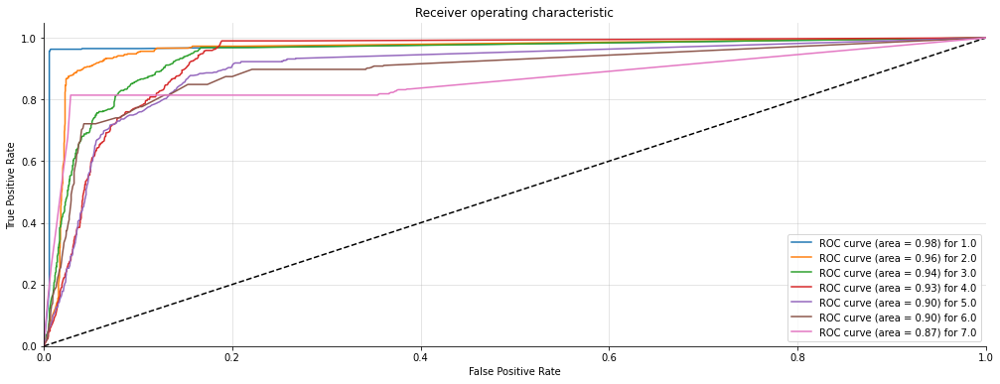

For column: complicated<==>easy
              precision    recall  f1-score   support

         1.0       0.96      0.95      0.96       463
         2.0       0.82      0.89      0.85       485
         3.0       0.74      0.72      0.73       501
         4.0       0.71      0.68      0.69       515
         5.0       0.71      0.75      0.73       460
         6.0       0.83      0.79      0.81       484
         7.0       0.90      0.90      0.90       452

    accuracy                           0.81      3360
   macro avg       0.81      0.81      0.81      3360
weighted avg       0.81      0.81      0.81      3360

Confusion Matrix: 
 [[442  20   0   0   0   1   0]
 [  0 430  51   0   1   3   0]
 [  0  22 360 114   5   0   0]
 [  0   2  38 350 123   2   0]
 [  3  13  17  14 343  70   0]
 [  5  18  15  13   6 384  43]
 [  9  18   6   4   5   2 408]]
Accuracy Score : 0.8086309523809524
Precision Score : 0.8086180206584467
Recall Score : 0.8086309523809524
F1 Score : 0.8082605258407

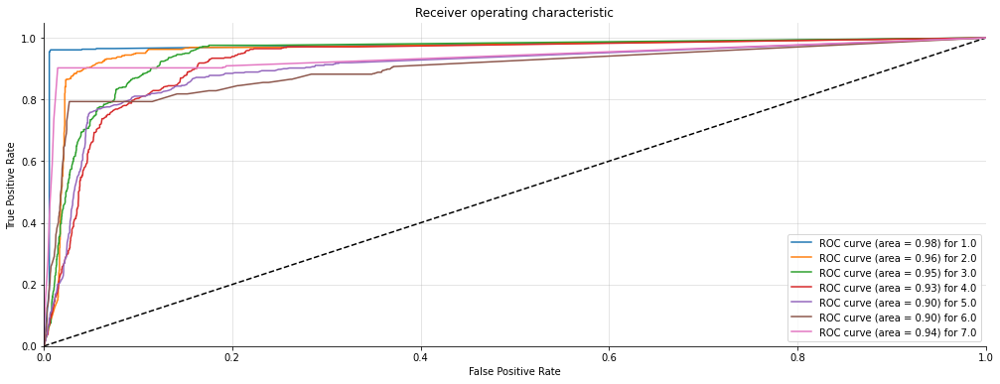

For column: inefficient<==>efficient
              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96       462
         2.0       0.82      0.89      0.86       482
         3.0       0.74      0.71      0.72       506
         4.0       0.69      0.66      0.67       526
         5.0       0.66      0.68      0.67       458
         6.0       0.72      0.71      0.71       475
         7.0       0.83      0.83      0.83       451

    accuracy                           0.77      3360
   macro avg       0.77      0.78      0.77      3360
weighted avg       0.77      0.77      0.77      3360

Confusion Matrix: 
 [[442  19   0   0   0   1   0]
 [  0 430  51   0   1   0   0]
 [  0  22 358 119   1   6   0]
 [  0   2  35 345 144   0   0]
 [  2   4   8  14 313 117   0]
 [  6  17  22  12   6 335  77]
 [  9  29  13  11   9   6 374]]
Accuracy Score : 0.7729166666666667
Precision Score : 0.7720241472465027
Recall Score : 0.7729166666666667
F1 Score : 0.77212383

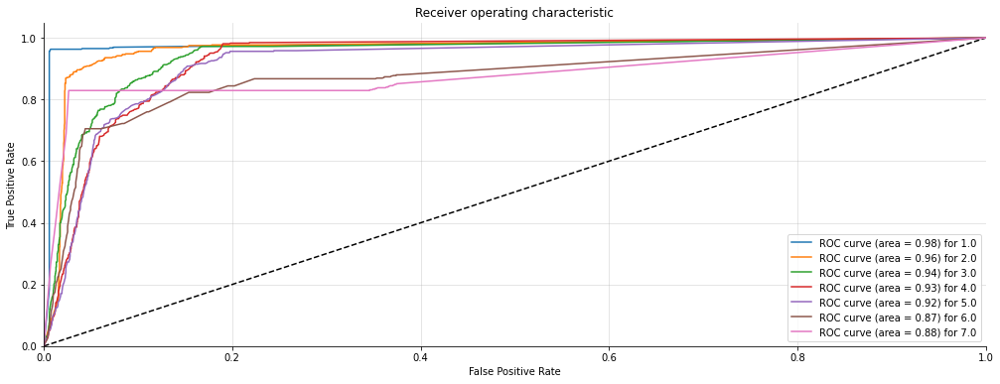

For column:  confusing<==>clear
              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96       461
         2.0       0.82      0.88      0.85       488
         3.0       0.73      0.71      0.72       506
         4.0       0.68      0.66      0.67       516
         5.0       0.66      0.68      0.67       456
         6.0       0.73      0.72      0.73       471
         7.0       0.80      0.79      0.80       462

    accuracy                           0.77      3360
   macro avg       0.77      0.77      0.77      3360
weighted avg       0.77      0.77      0.77      3360

Confusion Matrix: 
 [[442  19   0   0   0   0   0]
 [  0 430  52   1   2   3   0]
 [  0  23 357 122   0   1   3]
 [  0   0  30 341 143   2   0]
 [  2   2  10  17 312 113   0]
 [  2  15  17   9   3 339  86]
 [ 13  34  21  15  10   4 365]]
Accuracy Score : 0.7696428571428572
Precision Score : 0.7691212757822499
Recall Score : 0.7696428571428572
F1 Score : 0.7691428839166

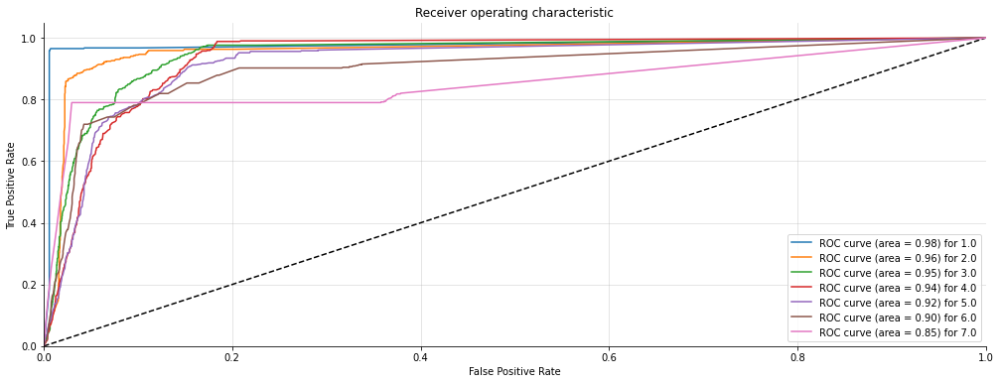

For column: boring<==>exciting
              precision    recall  f1-score   support

         1.0       0.96      0.95      0.96       463
         2.0       0.87      0.88      0.88       491
         3.0       0.83      0.81      0.82       487
         4.0       0.86      0.87      0.87       518
         5.0       0.91      0.92      0.92       487
         6.0       0.96      0.96      0.96       462
         7.0       0.99      0.99      0.99       452

    accuracy                           0.91      3360
   macro avg       0.91      0.91      0.91      3360
weighted avg       0.91      0.91      0.91      3360

Confusion Matrix: 
 [[442  18   1   0   1   1   0]
 [  5 434  46   2   1   3   0]
 [  7  22 396  58   4   0   0]
 [  3  15  15 452  32   1   0]
 [  1   5  11   9 450  11   0]
 [  1   3   4   2   4 443   5]
 [  0   0   2   0   1   3 446]]
Accuracy Score : 0.9116071428571428
Precision Score : 0.9115498934960082
Recall Score : 0.9116071428571428
F1 Score : 0.91154448500767

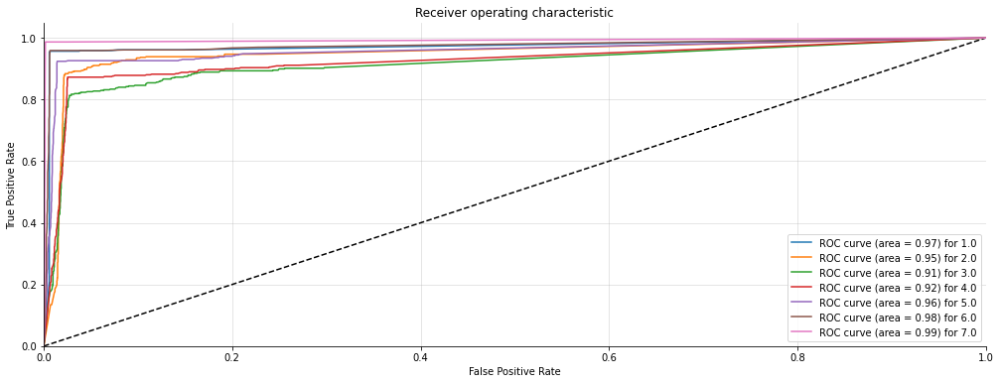

For column: not interesting<==>interesting
              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96       461
         2.0       0.87      0.87      0.87       495
         3.0       0.82      0.79      0.80       490
         4.0       0.83      0.84      0.83       519
         5.0       0.88      0.91      0.90       481
         6.0       0.96      0.96      0.96       465
         7.0       0.99      0.99      0.99       449

    accuracy                           0.90      3360
   macro avg       0.90      0.90      0.90      3360
weighted avg       0.90      0.90      0.90      3360

Confusion Matrix: 
 [[442  18   1   0   0   0   0]
 [  5 431  51   2   2   4   0]
 [  7  22 387  70   2   2   0]
 [  3  17  17 435  47   0   0]
 [  1   7  11  15 436  11   0]
 [  1   2   4   2   6 445   5]
 [  0   0   2   0   0   1 446]]
Accuracy Score : 0.8994047619047619
Precision Score : 0.8991909792089293
Recall Score : 0.8994047619047619
F1 Score : 0.89

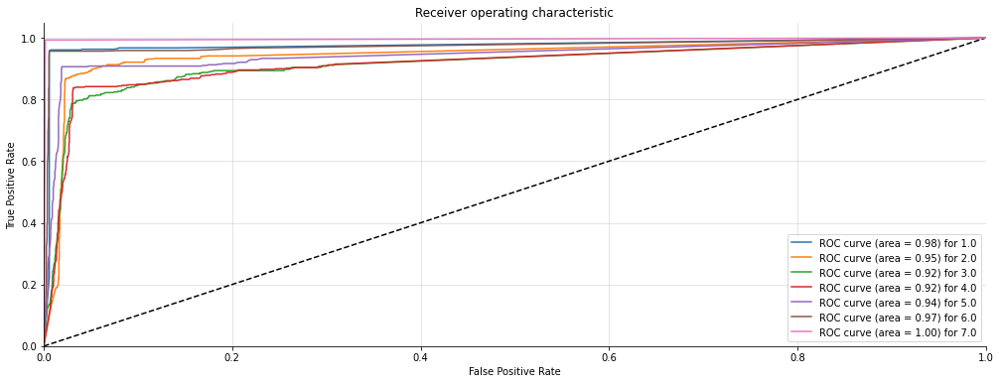

For column: conventional<==>inventive
              precision    recall  f1-score   support

         1.0       0.99      0.99      0.99       460
         2.0       0.96      0.95      0.96       502
         3.0       0.94      0.95      0.95       474
         4.0       0.96      0.95      0.95       527
         5.0       0.97      0.98      0.97       486
         6.0       0.98      0.99      0.99       459
         7.0       1.00      1.00      1.00       452

    accuracy                           0.97      3360
   macro avg       0.97      0.97      0.97      3360
weighted avg       0.97      0.97      0.97      3360

Confusion Matrix: 
 [[454   6   0   0   0   0   0]
 [  5 479  15   2   1   0   0]
 [  0  12 449  13   0   0   0]
 [  0   1  12 500  10   4   0]
 [  0   0   0   8 476   2   0]
 [  0   0   0   0   4 455   0]
 [  0   0   0   0   0   1 451]]
Accuracy Score : 0.9714285714285714
Precision Score : 0.9714203087811575
Recall Score : 0.9714285714285714
F1 Score : 0.9714139

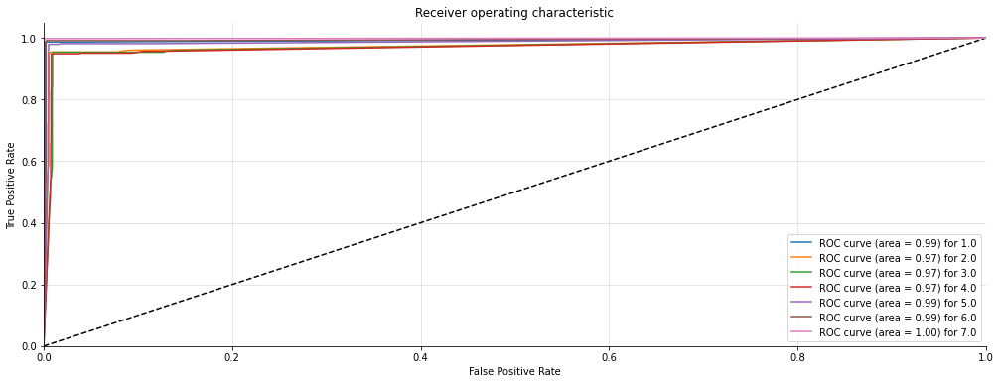

For column: usual<==>leading edge
              precision    recall  f1-score   support

         1.0       1.00      1.00      1.00       459
         2.0       1.00      1.00      1.00       496
         3.0       1.00      1.00      1.00       478
         4.0       1.00      1.00      1.00       523
         5.0       1.00      1.00      1.00       491
         6.0       1.00      1.00      1.00       462
         7.0       1.00      1.00      1.00       451

    accuracy                           1.00      3360
   macro avg       1.00      1.00      1.00      3360
weighted avg       1.00      1.00      1.00      3360

Confusion Matrix: 
 [[459   0   0   0   0   0   0]
 [  0 496   0   0   0   0   0]
 [  0   0 478   0   0   0   0]
 [  0   0   0 523   0   0   0]
 [  0   0   0   0 491   0   0]
 [  0   0   0   0   0 462   0]
 [  0   0   0   0   0   0 451]]
Accuracy Score : 1.0
Precision Score : 1.0
Recall Score : 1.0
F1 Score : 1.0
(3360, 7) (3360, 7)


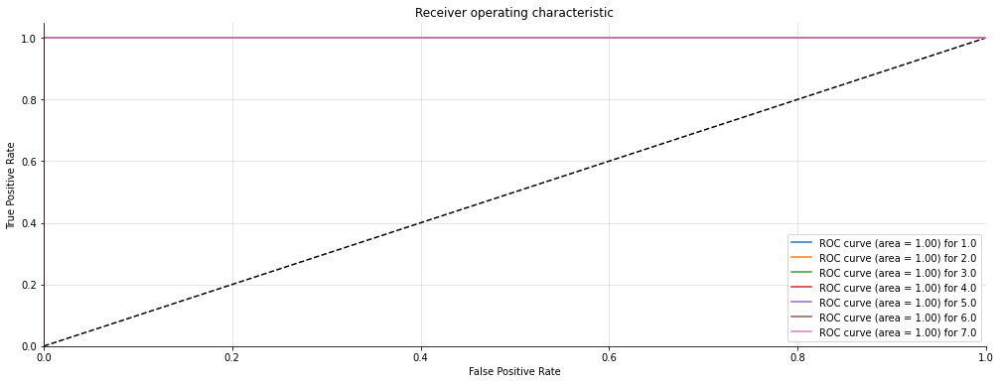

In [156]:
from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import plot_confusion_matrix, accuracy_score
acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]
fpo=dict()
tpo=dict()
ffpo=[]
ttpo=[]
def RFC(X_train, X_test, y_train, y_test, n_classes, figsize=(8, 6)):
    model = RandomForestClassifier(n_estimators=100, max_depth=None,
     min_samples_split=2, random_state=0)   
    model.fit(X_train, y_train)

    # predictions over test set
    predictions = [round(float(x)) for x in model.predict(X_test)]
    print((classification_report(y_test, predictions)))


    # calculating Accuracy Score, Precision Score, Recall Score and F1 Score
    print('Confusion Matrix: \n' ,confusion_matrix(y_test, predictions))
    acc.append(accuracy_score(y_test, predictions))
    print(f'Accuracy Score : {accuracy_score(y_test, predictions)}')
    pre.append(precision_score(y_test,predictions,average='weighted'))
    print('Precision Score : ' + str(precision_score(y_test,predictions,average='weighted')))
    recal.append(recall_score(y_test,predictions,average='weighted'))
    print('Recall Score : ' + str(recall_score(y_test,predictions,average='weighted')))
    f1.append(f1_score(y_test,predictions,average='weighted'))
    print('F1 Score : ' + str(f1_score(y_test,predictions,average='weighted')))
    rms.append(np.sqrt(mean_squared_error(y_test,predictions)))
    aucscore.append(score_auc(y_test,predictions))
    fpo,tpo=plot_multiclass_roc(model, X_test, y_test, n_classes)
    ffpo.append(fpo)
    ttpo.append(tpo)

for i in range(8):
  print('For column:', df.columns[1:][i])
  n_classes = len(np.unique(df[df.columns[1:][i]]))
  RFC(X_train, X_test, y_train[:,i], y_test[:,i], n_classes, figsize=(8, 6))

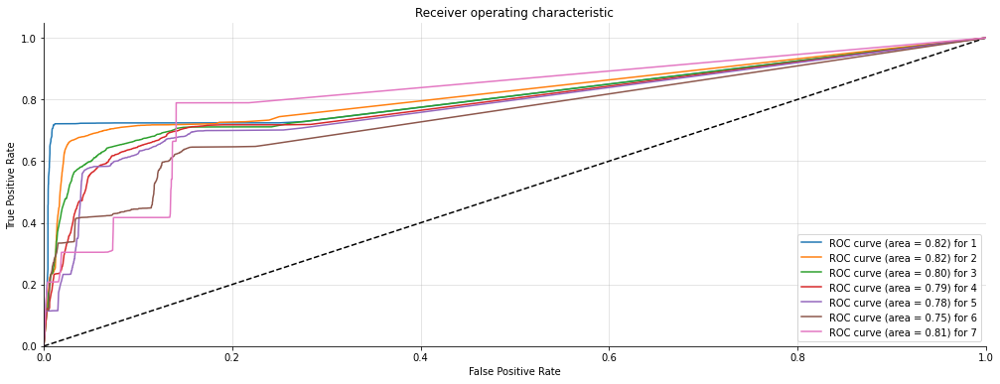

In [157]:
fsum0=list(np.array(dadd(dadd(dadd(ffpo[0][0],ffpo[1][0]),dadd(ffpo[2][0],ffpo[3][0])),dadd(dadd(ffpo[4][0],ffpo[5][0]),dadd(ffpo[6][0],ffpo[7][0]))))/8)
fsum1=list(np.array(dadd(dadd(dadd(ffpo[0][1],ffpo[1][1]),dadd(ffpo[2][1],ffpo[3][1])),dadd(dadd(ffpo[4][1],ffpo[5][1]),dadd(ffpo[6][1],ffpo[7][1]))))/8)
fsum2=list(np.array(dadd(dadd(dadd(ffpo[0][2],ffpo[1][2]),dadd(ffpo[2][2],ffpo[3][2])),dadd(dadd(ffpo[4][2],ffpo[5][2]),dadd(ffpo[6][2],ffpo[7][2]))))/8)
fsum3=list(np.array(dadd(dadd(dadd(ffpo[0][3],ffpo[1][3]),dadd(ffpo[2][3],ffpo[3][3])),dadd(dadd(ffpo[4][3],ffpo[5][3]),dadd(ffpo[6][3],ffpo[7][3]))))/8)
fsum4=list(np.array(dadd(dadd(dadd(ffpo[0][4],ffpo[1][4]),dadd(ffpo[2][4],ffpo[3][4])),dadd(dadd(ffpo[4][4],ffpo[5][4]),dadd(ffpo[6][4],ffpo[7][4]))))/8)
fsum5=list(np.array(dadd(dadd(dadd(ffpo[0][4],ffpo[1][5]),dadd(ffpo[2][5],ffpo[3][5])),dadd(dadd(ffpo[4][5],ffpo[5][5]),dadd(ffpo[6][5],ffpo[7][5]))))/8)
fsum6=list(np.array(dadd(dadd(dadd(ffpo[0][6],ffpo[1][6]),dadd(ffpo[2][6],ffpo[3][6])),dadd(dadd(ffpo[4][6],ffpo[5][6]),dadd(ffpo[6][6],ffpo[7][6]))))/8)

fpr=dict()
# a list containing 1 is added as the maximum value in fpr and tpr is around 0.26. when 1 is added to both fpr and tpr the curve gets completed.

fsum0.sort()
fpr[0]=fsum0+[1]
fsum1.sort()
fpr[1]=fsum1+[1]
fsum2.sort()
fpr[2]=fsum2+[1]
fsum3.sort()
fpr[3]=fsum3+[1]
fsum4.sort()
fpr[4]=fsum4+[1]
fsum5.sort()
fpr[5]=fsum5+[1]
fsum6.sort()
fpr[6]=fsum6+[1]


tsum0=list(np.array(dadd(dadd(dadd(ttpo[0][0],ttpo[1][0]),dadd(ttpo[2][0],ttpo[3][0])),dadd(dadd(ttpo[4][0],ttpo[5][0]),dadd(ttpo[6][0],ttpo[7][0]))))/8)
tsum1=list(np.array(dadd(dadd(dadd(ttpo[0][1],ttpo[1][1]),dadd(ttpo[2][1],ttpo[3][1])),dadd(dadd(ttpo[4][1],ttpo[5][1]),dadd(ttpo[6][1],ttpo[7][1]))))/8)
tsum2=list(np.array(dadd(dadd(dadd(ttpo[0][2],ttpo[1][2]),dadd(ttpo[2][2],ttpo[3][2])),dadd(dadd(ttpo[4][2],ttpo[5][2]),dadd(ttpo[6][2],ttpo[7][2]))))/8)
tsum3=list(np.array(dadd(dadd(dadd(ttpo[0][3],ttpo[1][3]),dadd(ttpo[2][3],ttpo[3][3])),dadd(dadd(ttpo[4][3],ttpo[5][3]),dadd(ttpo[6][3],ttpo[7][3]))))/8)
tsum4=list(np.array(dadd(dadd(dadd(ttpo[0][4],ttpo[1][4]),dadd(ttpo[2][4],ttpo[3][4])),dadd(dadd(ttpo[4][4],ttpo[5][4]),dadd(ttpo[6][4],ttpo[7][4]))))/8)
tsum5=list(np.array(dadd(dadd(dadd(ttpo[0][4],ttpo[1][5]),dadd(ttpo[2][5],ttpo[3][5])),dadd(dadd(ttpo[4][5],ttpo[5][5]),dadd(ttpo[6][5],ttpo[7][5]))))/8)
tsum6=list(np.array(dadd(dadd(dadd(ttpo[0][6],ttpo[1][6]),dadd(ttpo[2][6],ttpo[3][6])),dadd(dadd(ttpo[4][6],ttpo[5][6]),dadd(ttpo[6][6],ttpo[7][6]))))/8)

tpr=dict()

tsum0.sort()
tpr[0]=tsum0+[1]
tsum1.sort()
tpr[1]=tsum1+[1]
tsum2.sort()
tpr[2]=tsum2+[1]
tsum3.sort()
tpr[3]=tsum3+[1]
tsum4.sort()
tpr[4]=tsum4+[1]
tsum5.sort()
tpr[5]=tsum5+[1]
tsum6.sort()
tpr[6]=tsum6+[1]

plot_multiclass_roc_avg(fpr,tpr,7)

In [158]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE {}".format(np.mean(rms)))
print("average AUC score {}".format(np.mean(aucscore)))
metric_df['RandomForestClassifier'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.8628720238095238
average Precision :0.8625469458677548
average Recall :0.8628720238095238
average F1 -score :0.8625434203307922
average RMSE 0.5997490475217283
average AUC score 0.9198162033460213


# 4.7.3 Extra Trees Classifier

For column: obstructive<==>supportive
              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96       462
         2.0       0.80      0.89      0.84       482
         3.0       0.73      0.69      0.71       510
         4.0       0.67      0.66      0.66       517
         5.0       0.66      0.66      0.66       467
         6.0       0.73      0.72      0.73       470
         7.0       0.82      0.81      0.82       452

    accuracy                           0.77      3360
   macro avg       0.77      0.77      0.77      3360
weighted avg       0.77      0.77      0.77      3360

Confusion Matrix: 
 [[442  20   0   0   0   0   0]
 [  1 428  51   0   1   1   0]
 [  0  33 353 119   2   3   0]
 [  0   1  35 339 141   1   0]
 [  4   4  15  25 307 112   0]
 [  3  19  12   8   6 339  83]
 [ 10  28  18  12  10   6 368]]
Accuracy Score : 0.7666666666666667
Precision Score : 0.7654919450685581
Recall Score : 0.7666666666666667
F1 Score : 0.7656717

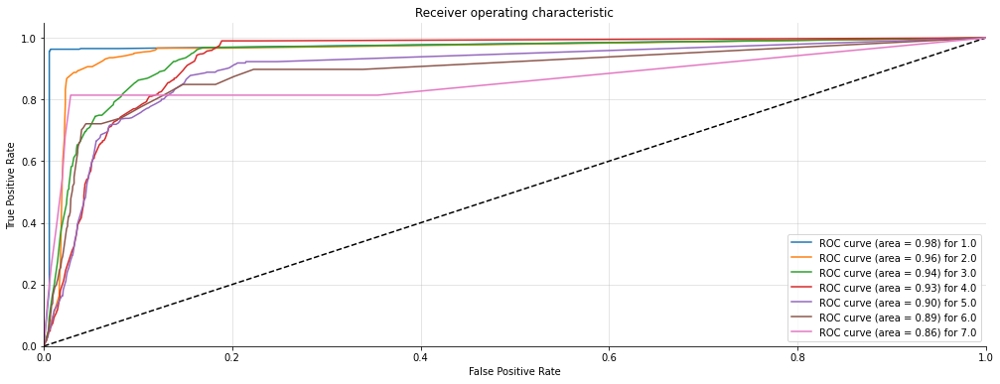

(3360, 7) (3360, 7)


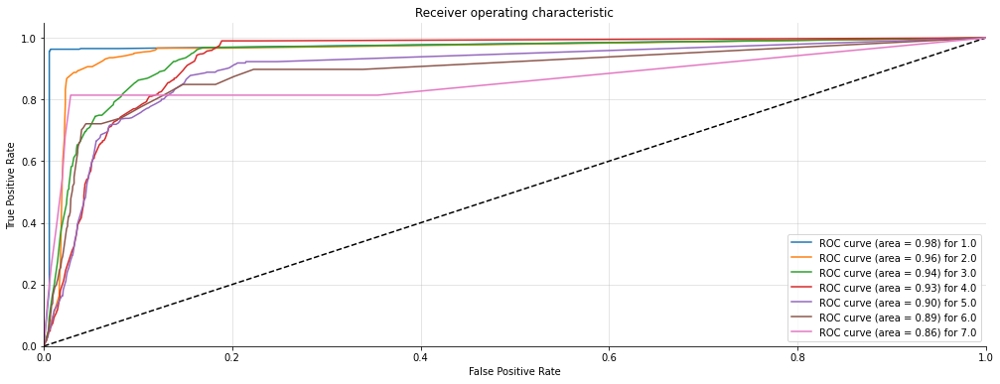

For column: complicated<==>easy
              precision    recall  f1-score   support

         1.0       0.96      0.95      0.96       463
         2.0       0.80      0.88      0.84       485
         3.0       0.73      0.71      0.72       501
         4.0       0.70      0.67      0.68       515
         5.0       0.71      0.75      0.73       460
         6.0       0.83      0.79      0.81       484
         7.0       0.90      0.90      0.90       452

    accuracy                           0.80      3360
   macro avg       0.81      0.81      0.81      3360
weighted avg       0.80      0.80      0.80      3360

Confusion Matrix: 
 [[442  20   0   0   0   1   0]
 [  1 429  51   0   1   3   0]
 [  0  32 354 113   2   0   0]
 [  0   2  45 343 123   2   0]
 [  3  13  17  14 343  70   0]
 [  5  19  14  13   6 384  43]
 [  9  18   6   4   5   2 408]]
Accuracy Score : 0.8044642857142857
Precision Score : 0.804179909788098
Recall Score : 0.8044642857142857
F1 Score : 0.80383748036040

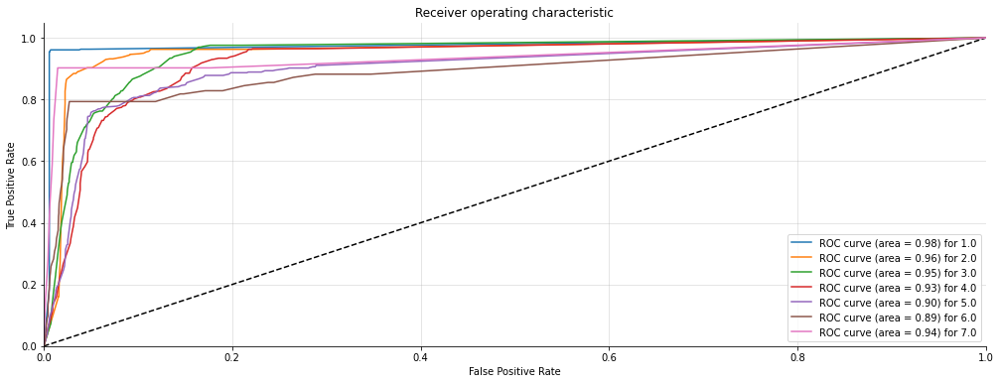

(3360, 7) (3360, 7)


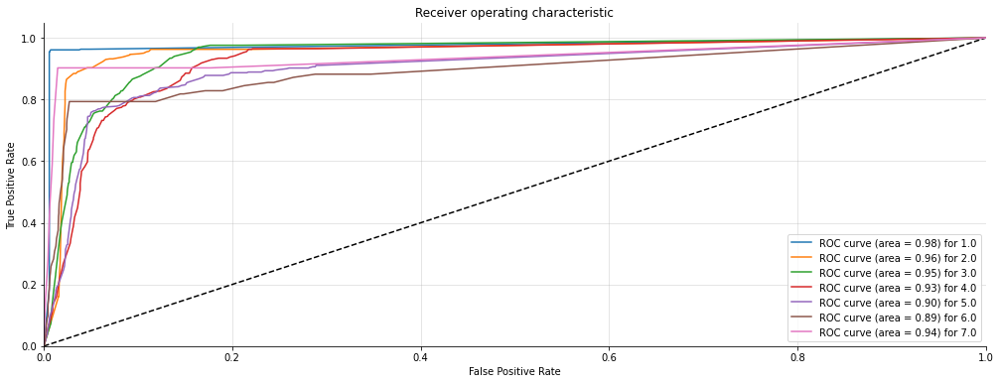

For column: inefficient<==>efficient
              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96       462
         2.0       0.80      0.89      0.85       482
         3.0       0.73      0.70      0.71       506
         4.0       0.69      0.65      0.67       526
         5.0       0.66      0.68      0.67       458
         6.0       0.73      0.71      0.72       475
         7.0       0.83      0.83      0.83       451

    accuracy                           0.77      3360
   macro avg       0.77      0.77      0.77      3360
weighted avg       0.77      0.77      0.77      3360

Confusion Matrix: 
 [[442  19   0   0   0   1   0]
 [  1 429  51   0   1   0   0]
 [  0  32 352 118   1   3   0]
 [  0   2  39 344 141   0   0]
 [  2   4   8  17 310 117   0]
 [  6  17  22  12   6 335  77]
 [  9  30  12  11   9   6 374]]
Accuracy Score : 0.7696428571428572
Precision Score : 0.7684885860370676
Recall Score : 0.7696428571428572
F1 Score : 0.76861802

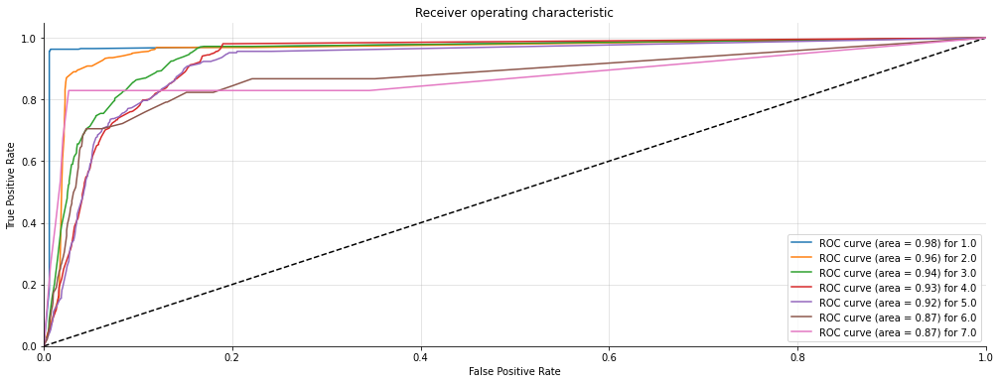

(3360, 7) (3360, 7)


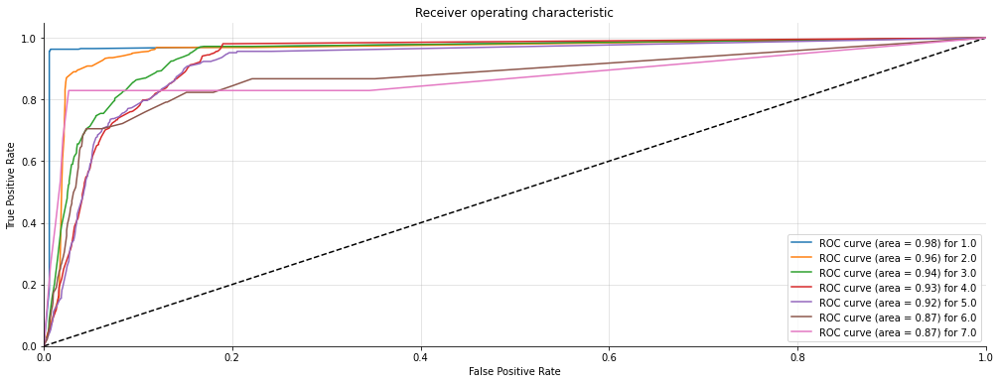

For column:  confusing<==>clear
              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96       461
         2.0       0.80      0.88      0.84       488
         3.0       0.73      0.69      0.71       506
         4.0       0.67      0.66      0.66       516
         5.0       0.67      0.68      0.67       456
         6.0       0.73      0.72      0.73       471
         7.0       0.81      0.79      0.80       462

    accuracy                           0.77      3360
   macro avg       0.77      0.77      0.77      3360
weighted avg       0.77      0.77      0.77      3360

Confusion Matrix: 
 [[442  19   0   0   0   0   0]
 [  1 429  52   1   2   3   0]
 [  0  33 351 121   0   1   0]
 [  0   0  34 338 142   2   0]
 [  2   2  10  17 312 113   0]
 [  2  16  16   9   3 339  86]
 [ 13  34  21  15  10   4 365]]
Accuracy Score : 0.7666666666666667
Precision Score : 0.7659743484519961
Recall Score : 0.7666666666666667
F1 Score : 0.7659643013203

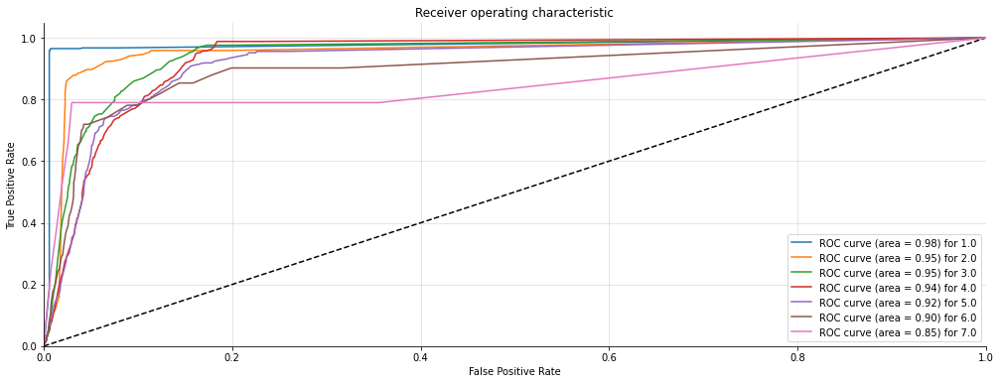

(3360, 7) (3360, 7)


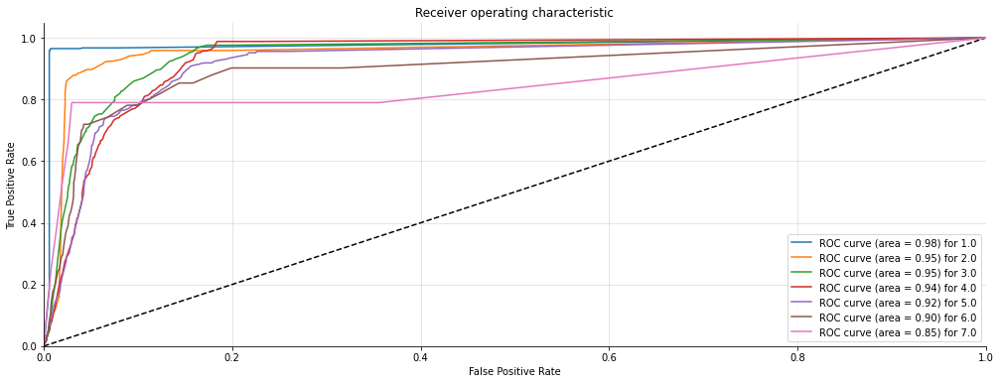

For column: boring<==>exciting
              precision    recall  f1-score   support

         1.0       0.96      0.95      0.96       463
         2.0       0.87      0.88      0.88       491
         3.0       0.83      0.82      0.82       487
         4.0       0.86      0.87      0.87       518
         5.0       0.92      0.92      0.92       487
         6.0       0.96      0.96      0.96       462
         7.0       0.99      0.99      0.99       452

    accuracy                           0.91      3360
   macro avg       0.91      0.91      0.91      3360
weighted avg       0.91      0.91      0.91      3360

Confusion Matrix: 
 [[442  18   1   0   1   1   0]
 [  5 434  46   2   1   3   0]
 [  7  23 397  58   2   0   0]
 [  3  16  17 449  32   1   0]
 [  1   5  11   9 450  11   0]
 [  1   3   4   2   4 443   5]
 [  0   0   2   0   1   3 446]]
Accuracy Score : 0.9110119047619047
Precision Score : 0.9110014387161348
Recall Score : 0.9110119047619047
F1 Score : 0.91098255464839

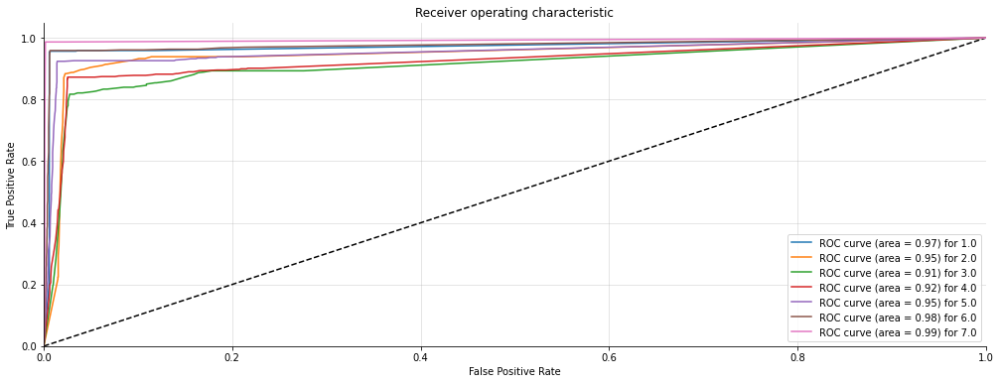

(3360, 7) (3360, 7)


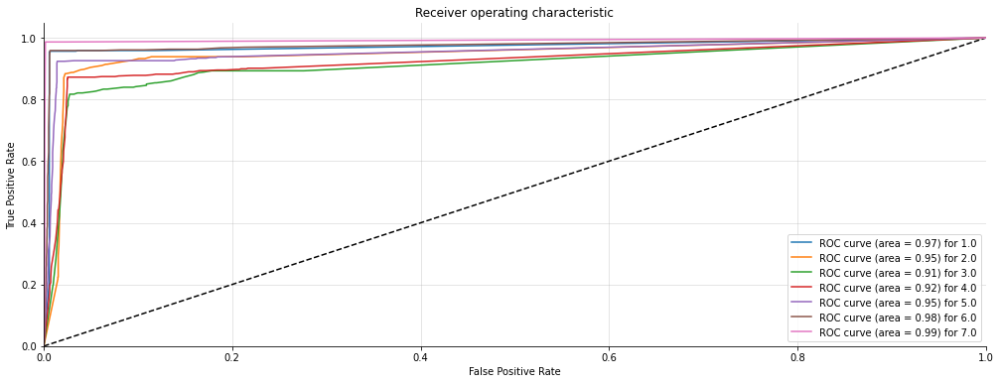

For column: not interesting<==>interesting
              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96       461
         2.0       0.86      0.87      0.86       495
         3.0       0.81      0.79      0.80       490
         4.0       0.83      0.83      0.83       519
         5.0       0.89      0.91      0.90       481
         6.0       0.96      0.96      0.96       465
         7.0       0.99      0.99      0.99       449

    accuracy                           0.90      3360
   macro avg       0.90      0.90      0.90      3360
weighted avg       0.90      0.90      0.90      3360

Confusion Matrix: 
 [[442  18   1   0   0   0   0]
 [  6 430  51   2   2   4   0]
 [  7  27 386  69   0   1   0]
 [  3  17  20 432  47   0   0]
 [  1   7  11  15 436  11   0]
 [  1   3   3   2   6 445   5]
 [  0   0   2   0   0   1 446]]
Accuracy Score : 0.8979166666666667
Precision Score : 0.897677251944814
Recall Score : 0.8979166666666667
F1 Score : 0.897

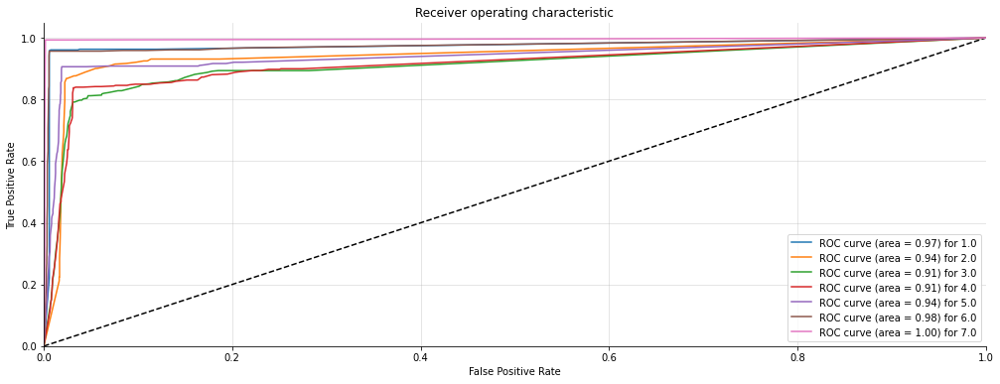

(3360, 7) (3360, 7)


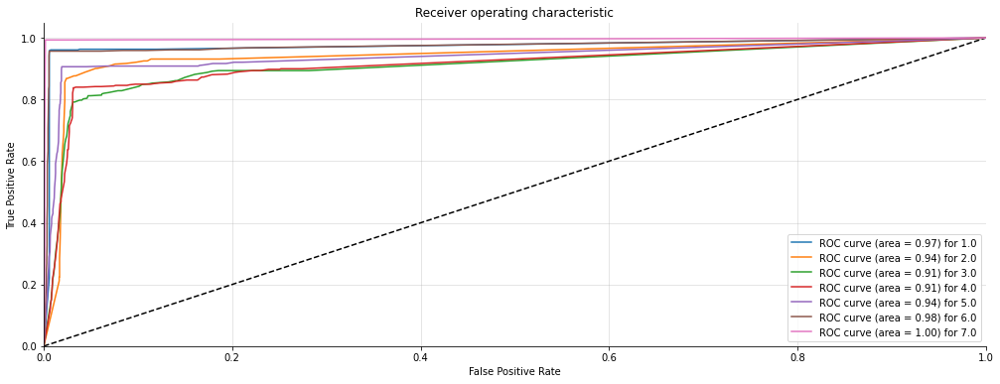

For column: conventional<==>inventive
              precision    recall  f1-score   support

         1.0       0.99      0.99      0.99       460
         2.0       0.96      0.95      0.96       502
         3.0       0.94      0.95      0.95       474
         4.0       0.96      0.95      0.95       527
         5.0       0.97      0.98      0.97       486
         6.0       0.98      0.99      0.99       459
         7.0       1.00      1.00      1.00       452

    accuracy                           0.97      3360
   macro avg       0.97      0.97      0.97      3360
weighted avg       0.97      0.97      0.97      3360

Confusion Matrix: 
 [[454   6   0   0   0   0   0]
 [  5 479  15   2   1   0   0]
 [  0  12 449  13   0   0   0]
 [  0   1  12 500  10   4   0]
 [  0   0   0   8 476   2   0]
 [  0   0   0   0   4 455   0]
 [  0   0   0   0   0   1 451]]
Accuracy Score : 0.9714285714285714
Precision Score : 0.9714203087811575
Recall Score : 0.9714285714285714
F1 Score : 0.9714139

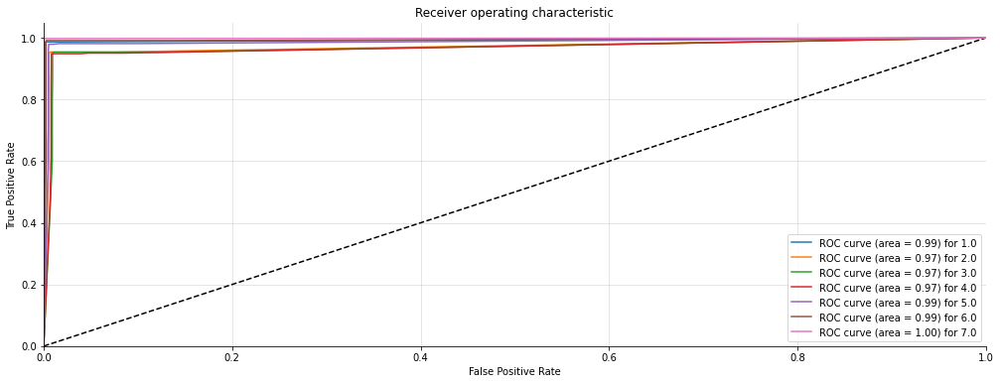

(3360, 7) (3360, 7)


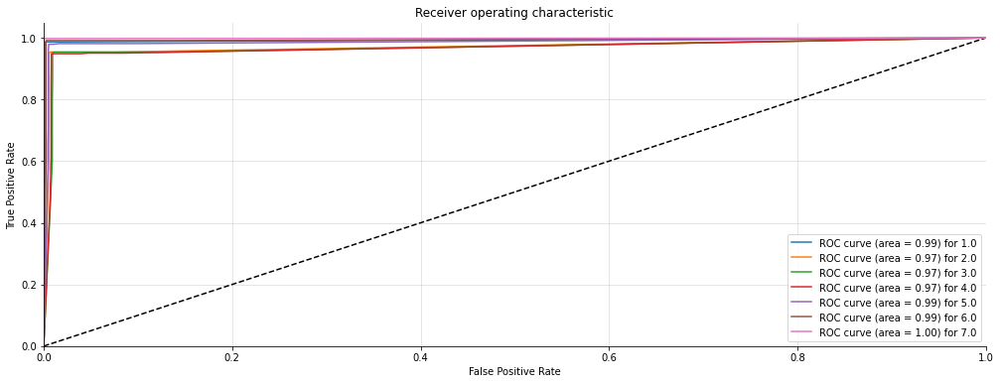

For column: usual<==>leading edge
              precision    recall  f1-score   support

         1.0       1.00      1.00      1.00       459
         2.0       1.00      1.00      1.00       496
         3.0       1.00      1.00      1.00       478
         4.0       1.00      1.00      1.00       523
         5.0       1.00      1.00      1.00       491
         6.0       1.00      1.00      1.00       462
         7.0       1.00      1.00      1.00       451

    accuracy                           1.00      3360
   macro avg       1.00      1.00      1.00      3360
weighted avg       1.00      1.00      1.00      3360

Confusion Matrix: 
 [[459   0   0   0   0   0   0]
 [  0 496   0   0   0   0   0]
 [  0   0 478   0   0   0   0]
 [  0   0   0 523   0   0   0]
 [  0   0   0   0 491   0   0]
 [  0   0   0   0   0 462   0]
 [  0   0   0   0   0   0 451]]
Accuracy Score : 1.0
Precision Score : 1.0
Recall Score : 1.0
F1 Score : 1.0
(3360, 7) (3360, 7)


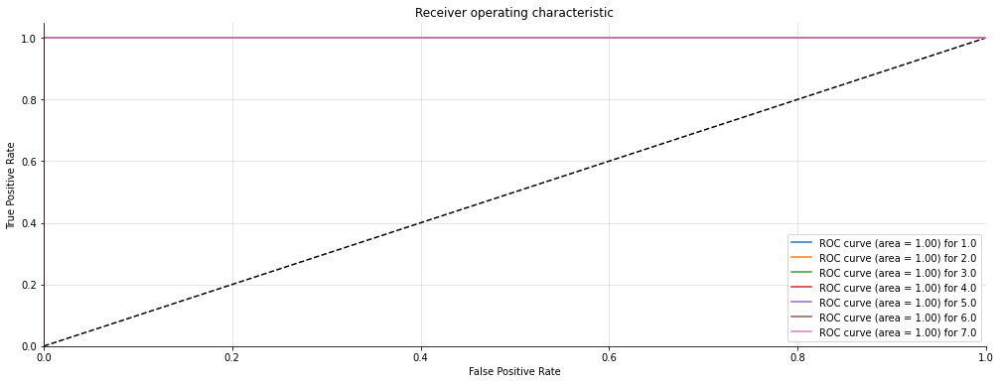

(3360, 7) (3360, 7)


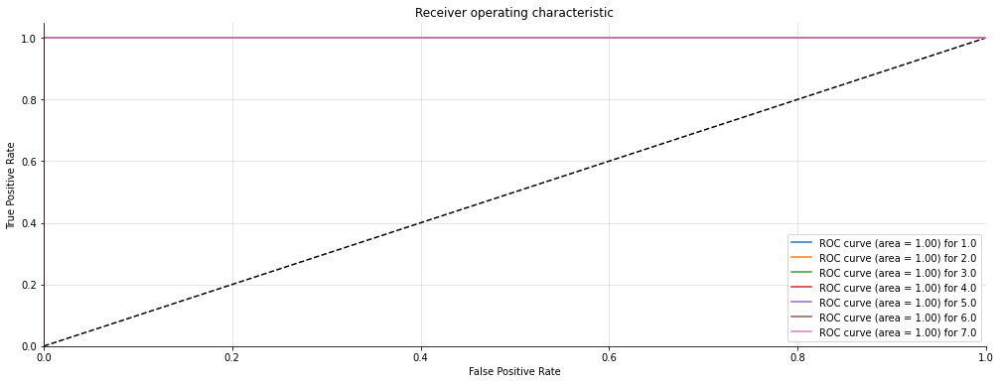

In [159]:
from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import plot_confusion_matrix, accuracy_score
acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]
fpo=dict()
tpo=dict()
ffpo=[]
ttpo=[]
def ETC(X_train, X_test, y_train, y_test, n_classes, figsize=(8, 6)):
    model = ExtraTreesClassifier(n_estimators=100, max_depth=None,
     min_samples_split=2, random_state=0)   
    model.fit(X_train, y_train)

    # predictions over test set
    predictions = [round(float(x)) for x in model.predict(X_test)]
    print((classification_report(y_test, predictions)))


    # calculating Accuracy Score, Precision Score, Recall Score and F1 Score
    print('Confusion Matrix: \n' ,confusion_matrix(y_test, predictions))
    acc.append(accuracy_score(y_test, predictions))
    print(f'Accuracy Score : {accuracy_score(y_test, predictions)}')
    pre.append(precision_score(y_test,predictions,average='weighted'))
    print('Precision Score : ' + str(precision_score(y_test,predictions,average='weighted')))
    recal.append(recall_score(y_test,predictions,average='weighted'))
    print('Recall Score : ' + str(recall_score(y_test,predictions,average='weighted')))
    f1.append(f1_score(y_test,predictions,average='weighted'))
    print('F1 Score : ' + str(f1_score(y_test,predictions,average='weighted')))
    rms.append(np.sqrt(mean_squared_error(y_test,predictions)))
    aucscore.append(score_auc(y_test,predictions))
    fpo,tpo=plot_multiclass_roc(model, X_test, y_test, n_classes)
    ffpo.append(fpo)
    ttpo.append(tpo)
    plot_multiclass_roc(model, X_test, y_test, n_classes)

for i in range(8):
  print('For column:', df.columns[1:][i])
  n_classes = len(np.unique(df[df.columns[1:][i]]))
  ETC(X_train, X_test, y_train[:,i], y_test[:,i], n_classes, figsize=(8, 6))

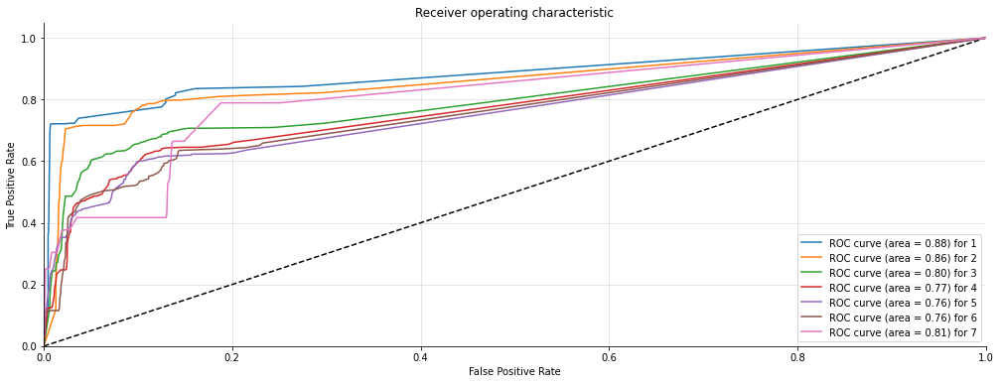

In [160]:
fsum0=list(np.array(dadd(dadd(dadd(ffpo[0][0],ffpo[1][0]),dadd(ffpo[2][0],ffpo[3][0])),dadd(dadd(ffpo[4][0],ffpo[5][0]),dadd(ffpo[6][0],ffpo[7][0]))))/8)
fsum1=list(np.array(dadd(dadd(dadd(ffpo[0][1],ffpo[1][1]),dadd(ffpo[2][1],ffpo[3][1])),dadd(dadd(ffpo[4][1],ffpo[5][1]),dadd(ffpo[6][1],ffpo[7][1]))))/8)
fsum2=list(np.array(dadd(dadd(dadd(ffpo[0][2],ffpo[1][2]),dadd(ffpo[2][2],ffpo[3][2])),dadd(dadd(ffpo[4][2],ffpo[5][2]),dadd(ffpo[6][2],ffpo[7][2]))))/8)
fsum3=list(np.array(dadd(dadd(dadd(ffpo[0][3],ffpo[1][3]),dadd(ffpo[2][3],ffpo[3][3])),dadd(dadd(ffpo[4][3],ffpo[5][3]),dadd(ffpo[6][3],ffpo[7][3]))))/8)
fsum4=list(np.array(dadd(dadd(dadd(ffpo[0][4],ffpo[1][4]),dadd(ffpo[2][4],ffpo[3][4])),dadd(dadd(ffpo[4][4],ffpo[5][4]),dadd(ffpo[6][4],ffpo[7][4]))))/8)
fsum5=list(np.array(dadd(dadd(dadd(ffpo[0][4],ffpo[1][5]),dadd(ffpo[2][5],ffpo[3][5])),dadd(dadd(ffpo[4][5],ffpo[5][5]),dadd(ffpo[6][5],ffpo[7][5]))))/8)
fsum6=list(np.array(dadd(dadd(dadd(ffpo[0][6],ffpo[1][6]),dadd(ffpo[2][6],ffpo[3][6])),dadd(dadd(ffpo[4][6],ffpo[5][6]),dadd(ffpo[6][6],ffpo[7][6]))))/8)

fpr=dict()
# a list containing 1 is added as the maximum value in fpr and tpr is around 0.26. when 1 is added to both fpr and tpr the curve gets completed.

fsum0.sort()
fpr[0]=fsum0+[1]
fsum1.sort()
fpr[1]=fsum1+[1]
fsum2.sort()
fpr[2]=fsum2+[1]
fsum3.sort()
fpr[3]=fsum3+[1]
fsum4.sort()
fpr[4]=fsum4+[1]
fsum5.sort()
fpr[5]=fsum5+[1]
fsum6.sort()
fpr[6]=fsum6+[1]


tsum0=list(np.array(dadd(dadd(dadd(ttpo[0][0],ttpo[1][0]),dadd(ttpo[2][0],ttpo[3][0])),dadd(dadd(ttpo[4][0],ttpo[5][0]),dadd(ttpo[6][0],ttpo[7][0]))))/8)
tsum1=list(np.array(dadd(dadd(dadd(ttpo[0][1],ttpo[1][1]),dadd(ttpo[2][1],ttpo[3][1])),dadd(dadd(ttpo[4][1],ttpo[5][1]),dadd(ttpo[6][1],ttpo[7][1]))))/8)
tsum2=list(np.array(dadd(dadd(dadd(ttpo[0][2],ttpo[1][2]),dadd(ttpo[2][2],ttpo[3][2])),dadd(dadd(ttpo[4][2],ttpo[5][2]),dadd(ttpo[6][2],ttpo[7][2]))))/8)
tsum3=list(np.array(dadd(dadd(dadd(ttpo[0][3],ttpo[1][3]),dadd(ttpo[2][3],ttpo[3][3])),dadd(dadd(ttpo[4][3],ttpo[5][3]),dadd(ttpo[6][3],ttpo[7][3]))))/8)
tsum4=list(np.array(dadd(dadd(dadd(ttpo[0][4],ttpo[1][4]),dadd(ttpo[2][4],ttpo[3][4])),dadd(dadd(ttpo[4][4],ttpo[5][4]),dadd(ttpo[6][4],ttpo[7][4]))))/8)
tsum5=list(np.array(dadd(dadd(dadd(ttpo[0][4],ttpo[1][5]),dadd(ttpo[2][5],ttpo[3][5])),dadd(dadd(ttpo[4][5],ttpo[5][5]),dadd(ttpo[6][5],ttpo[7][5]))))/8)
tsum6=list(np.array(dadd(dadd(dadd(ttpo[0][6],ttpo[1][6]),dadd(ttpo[2][6],ttpo[3][6])),dadd(dadd(ttpo[4][6],ttpo[5][6]),dadd(ttpo[6][6],ttpo[7][6]))))/8)

tpr=dict()

tsum0.sort()
tpr[0]=tsum0+[1]
tsum1.sort()
tpr[1]=tsum1+[1]
tsum2.sort()
tpr[2]=tsum2+[1]
tsum3.sort()
tpr[3]=tsum3+[1]
tsum4.sort()
tpr[4]=tsum4+[1]
tsum5.sort()
tpr[5]=tsum5+[1]
tsum6.sort()
tpr[6]=tsum6+[1]

plot_multiclass_roc_avg(fpr,tpr,7)

In [161]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE {}".format(np.mean(rms)))
print("average AUC score {}".format(np.mean(aucscore)))
metric_df['ExtraTreesClassifier'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.8609747023809524
average Precision :0.8605292235984783
average Recall :0.8609747023809524
average F1 -score :0.8605288322107546
average RMSE 0.5989547449466837
average AUC score 0.918702755542947


# 4.7.4 Adaboost 

For column: obstructive<==>supportive
              precision    recall  f1-score   support

         1.0       0.58      0.58      0.58       462
         2.0       0.37      0.38      0.37       482
         3.0       0.28      0.33      0.30       510
         4.0       0.37      0.34      0.36       517
         5.0       0.25      0.31      0.27       467
         6.0       0.43      0.36      0.39       470
         7.0       0.67      0.53      0.59       452

    accuracy                           0.40      3360
   macro avg       0.42      0.40      0.41      3360
weighted avg       0.42      0.40      0.41      3360

Confusion Matrix: 
 [[269  65  67  19  21  12   9]
 [ 62 182  83  51  64  29  11]
 [ 39  85 166  93  76  42   9]
 [ 27  71  87 178  99  42  13]
 [ 32  30  61 105 143  90   6]
 [ 22  43  36  23 105 169  72]
 [ 16  14  92  10  69  12 239]]
Accuracy Score : 0.4005952380952381
Precision Score : 0.4159253234502627
Recall Score : 0.4005952380952381
F1 Score : 0.4060340

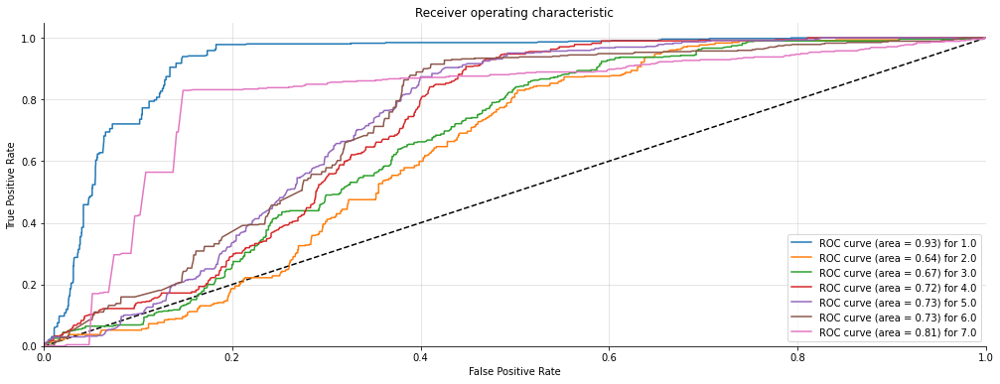

(3360, 7) (3360, 7)


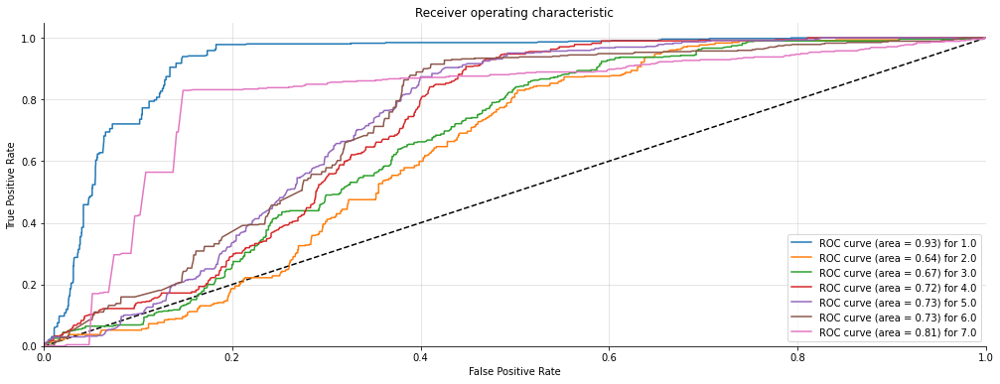

For column: complicated<==>easy
              precision    recall  f1-score   support

         1.0       0.58      0.66      0.62       463
         2.0       0.35      0.39      0.37       485
         3.0       0.25      0.29      0.27       501
         4.0       0.28      0.30      0.29       515
         5.0       0.35      0.27      0.31       460
         6.0       0.49      0.45      0.47       484
         7.0       0.79      0.59      0.67       452

    accuracy                           0.42      3360
   macro avg       0.44      0.42      0.43      3360
weighted avg       0.43      0.42      0.42      3360

Confusion Matrix: 
 [[307  51  40  16  26  13  10]
 [ 73 191  91  50  37  30  13]
 [ 44 116 145  97  48  46   5]
 [ 42  77 109 154  79  47   7]
 [ 30  51  58 104 126  87   4]
 [ 28  49  59  62  36 220  30]
 [  9  14  81  71   4   8 265]]
Accuracy Score : 0.41904761904761906
Precision Score : 0.43473474715304494
Recall Score : 0.41904761904761906
F1 Score : 0.4231017617

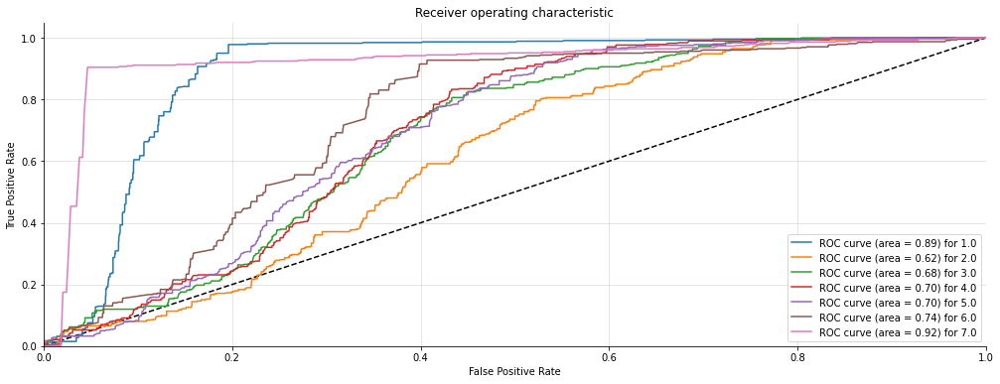

(3360, 7) (3360, 7)


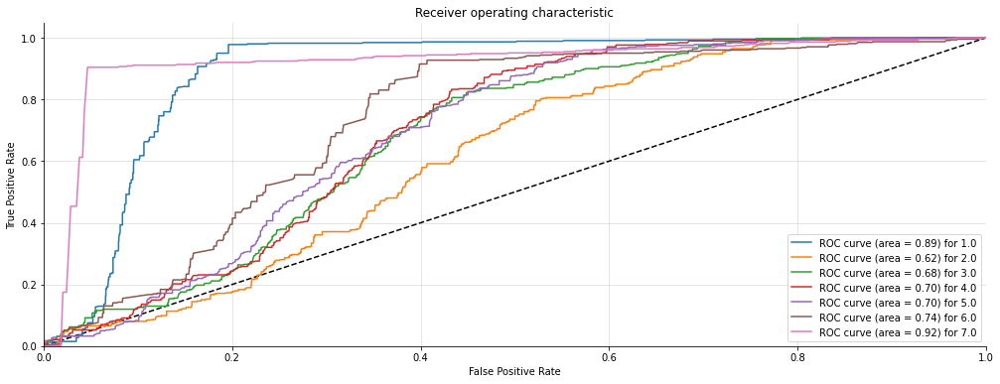

For column: inefficient<==>efficient
              precision    recall  f1-score   support

         1.0       0.59      0.61      0.60       462
         2.0       0.36      0.37      0.36       482
         3.0       0.34      0.27      0.31       506
         4.0       0.36      0.36      0.36       526
         5.0       0.25      0.28      0.26       458
         6.0       0.38      0.41      0.39       475
         7.0       0.58      0.54      0.56       451

    accuracy                           0.40      3360
   macro avg       0.41      0.41      0.41      3360
weighted avg       0.41      0.40      0.40      3360

Confusion Matrix: 
 [[282  81  24  12  24  23  16]
 [ 62 177  84  59  44  41  15]
 [ 36  90 139 102  61  36  42]
 [ 28  71  67 191  93  48  28]
 [ 37  26  48 112 129  87  19]
 [ 19  36  31  37 100 195  57]
 [ 17  17  10  13  65  85 244]]
Accuracy Score : 0.4038690476190476
Precision Score : 0.4057861776166783
Recall Score : 0.4038690476190476
F1 Score : 0.40387279

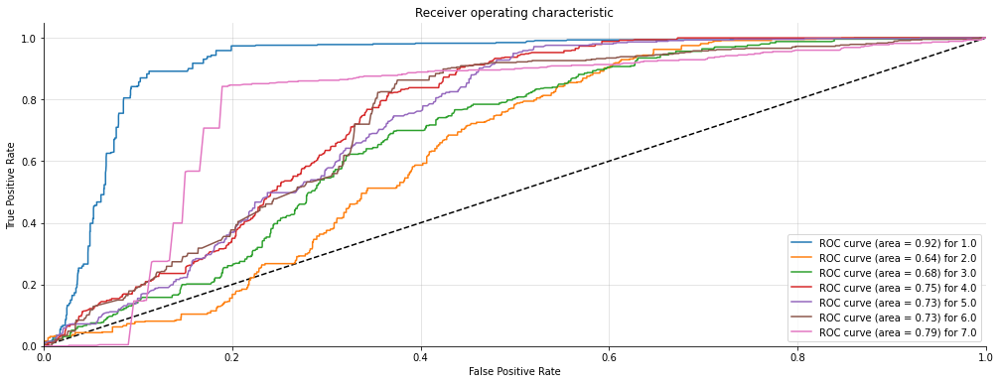

(3360, 7) (3360, 7)


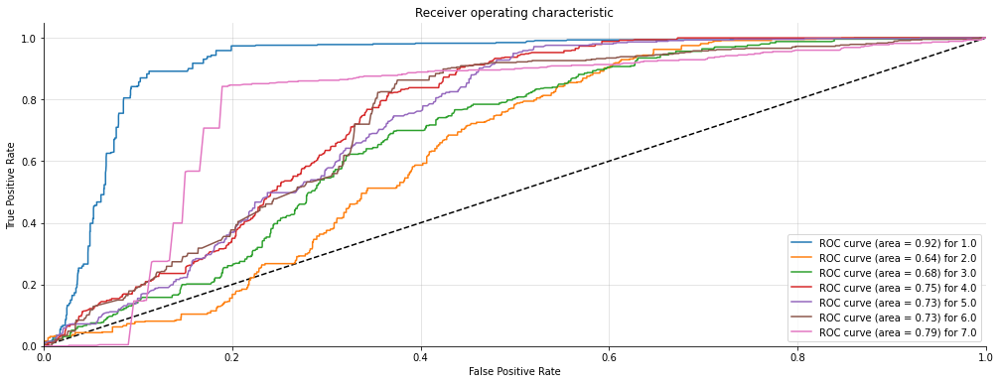

For column:  confusing<==>clear
              precision    recall  f1-score   support

         1.0       0.62      0.61      0.62       461
         2.0       0.31      0.45      0.37       488
         3.0       0.39      0.34      0.36       506
         4.0       0.35      0.33      0.34       516
         5.0       0.27      0.30      0.28       456
         6.0       0.49      0.40      0.44       471
         7.0       0.64      0.52      0.57       462

    accuracy                           0.42      3360
   macro avg       0.44      0.42      0.43      3360
weighted avg       0.43      0.42      0.42      3360

Confusion Matrix: 
 [[283  81  30  23  14  21   9]
 [ 60 219  73  56  53  19   8]
 [ 17 111 171  91  58  36  22]
 [ 22  95  77 171 108  27  16]
 [ 31  33  50  96 137  92  17]
 [ 26  60  25  33  74 189  64]
 [ 18 102  12  18  70   4 238]]
Accuracy Score : 0.41904761904761906
Precision Score : 0.43490006065926545
Recall Score : 0.41904761904761906
F1 Score : 0.4232769404

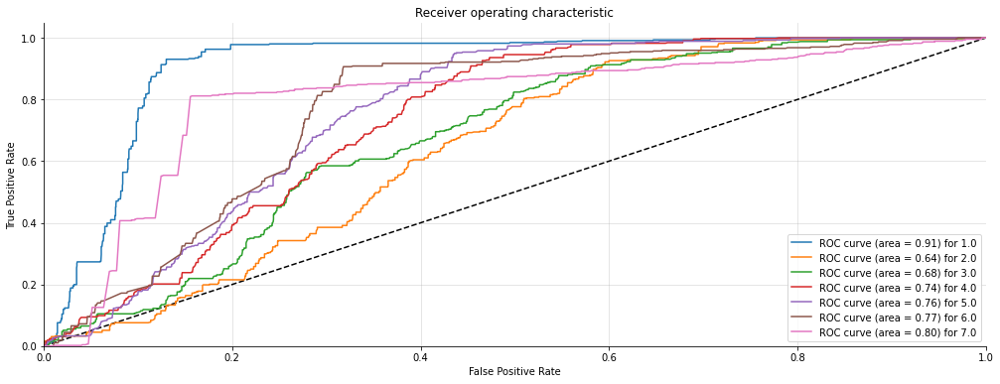

(3360, 7) (3360, 7)


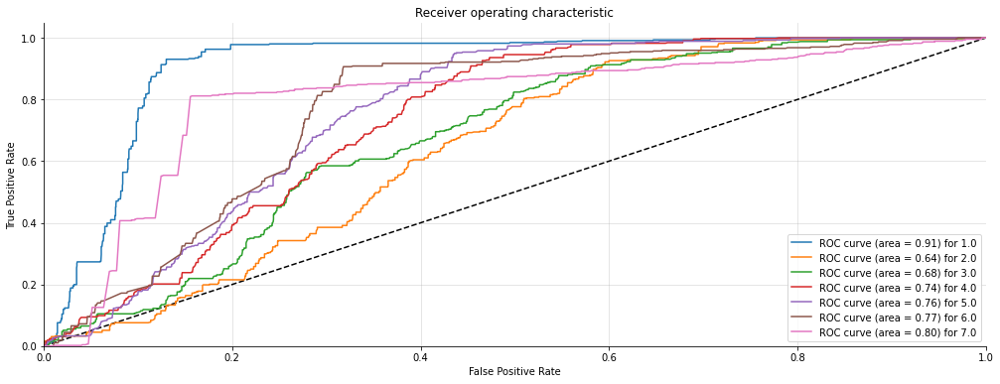

For column: boring<==>exciting
              precision    recall  f1-score   support

         1.0       0.27      0.27      0.27       463
         2.0       0.19      0.20      0.19       491
         3.0       0.24      0.19      0.21       487
         4.0       0.26      0.18      0.21       518
         5.0       0.21      0.35      0.26       487
         6.0       0.27      0.23      0.25       462
         7.0       0.93      0.80      0.86       452

    accuracy                           0.31      3360
   macro avg       0.34      0.32      0.32      3360
weighted avg       0.33      0.31      0.32      3360

Confusion Matrix: 
 [[123  71  31  61 132  45   0]
 [ 87  98  40  47 158  57   4]
 [ 68  70  94  47 133  68   7]
 [ 61 109  50  95 127  66  10]
 [ 51  92  43  79 170  51   1]
 [ 72  81  53  37 108 107   4]
 [  2   0  85   2   0   1 362]]
Accuracy Score : 0.31220238095238095
Precision Score : 0.3307334481367067
Recall Score : 0.31220238095238095
F1 Score : 0.316546326180

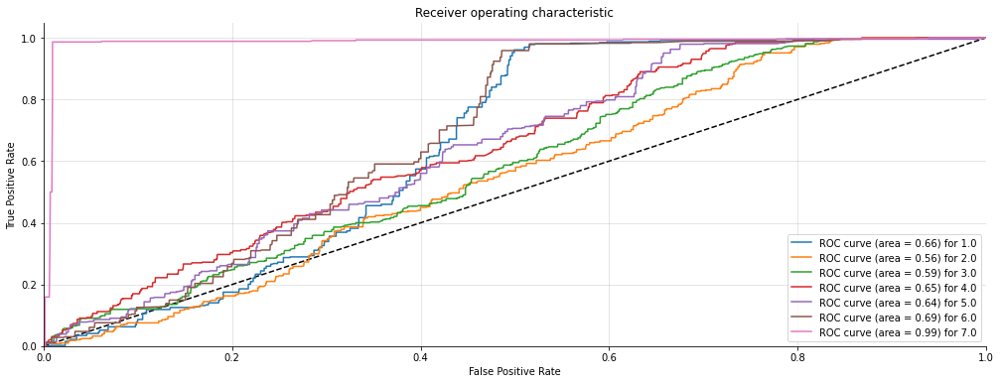

(3360, 7) (3360, 7)


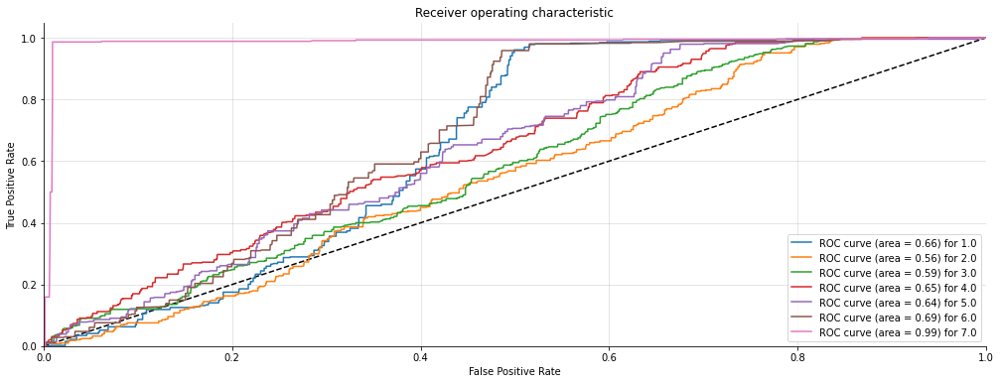

For column: not interesting<==>interesting
              precision    recall  f1-score   support

         1.0       0.25      0.34      0.29       461
         2.0       0.19      0.18      0.18       495
         3.0       0.26      0.22      0.24       490
         4.0       0.30      0.20      0.24       519
         5.0       0.23      0.34      0.28       481
         6.0       0.35      0.31      0.33       465
         7.0       0.97      0.81      0.88       449

    accuracy                           0.34      3360
   macro avg       0.36      0.34      0.35      3360
weighted avg       0.36      0.34      0.34      3360

Confusion Matrix: 
 [[156  66  38  38  91  72   0]
 [ 93  89  59  70 139  42   3]
 [110  77 109  33 110  48   3]
 [ 85  69  65 105 136  56   3]
 [ 84  38  70  75 165  49   0]
 [ 94  52  75  33  62 145   4]
 [  0  84   2   0   1   0 362]]
Accuracy Score : 0.3366071428571429
Precision Score : 0.35711479139004176
Recall Score : 0.3366071428571429
F1 Score : 0.3

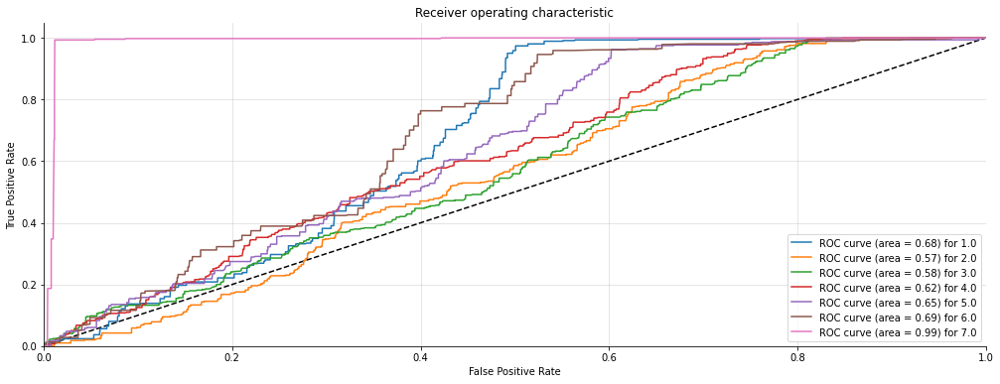

(3360, 7) (3360, 7)


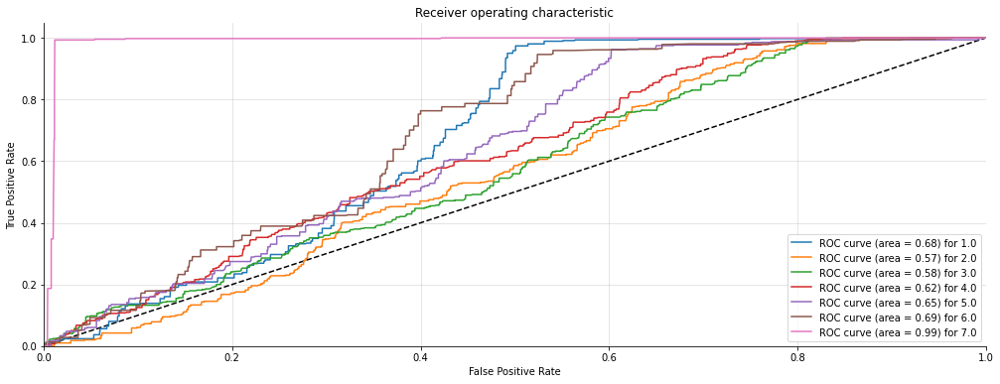

For column: conventional<==>inventive
              precision    recall  f1-score   support

         1.0       0.18      0.36      0.24       460
         2.0       0.21      0.16      0.18       502
         3.0       0.18      0.16      0.17       474
         4.0       0.26      0.17      0.21       527
         5.0       0.13      0.20      0.16       486
         6.0       0.23      0.14      0.17       459
         7.0       0.91      0.66      0.77       452

    accuracy                           0.26      3360
   macro avg       0.30      0.26      0.27      3360
weighted avg       0.30      0.26      0.27      3360

Confusion Matrix: 
 [[165  75  82  25 101   8   4]
 [140  79  45  58 150  24   6]
 [132  56  76  54 113  40   3]
 [136  72  54  89 153  20   3]
 [125  58  90  69  97  47   0]
 [114  36  68  45 119  64  13]
 [ 81   0   0   0   1  72 298]]
Accuracy Score : 0.25833333333333336
Precision Score : 0.2970788612312305
Recall Score : 0.25833333333333336
F1 Score : 0.26634

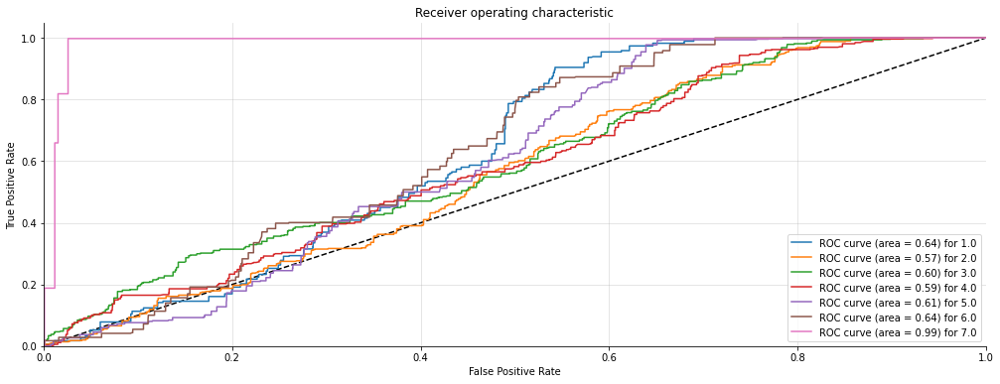

(3360, 7) (3360, 7)


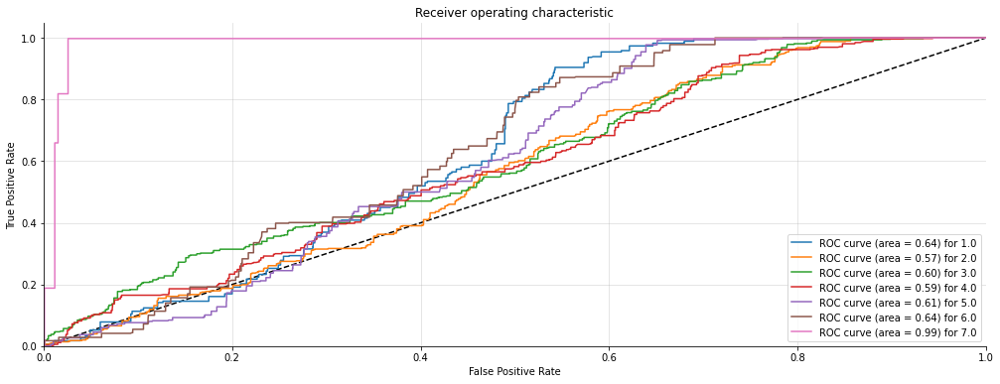

For column: usual<==>leading edge
              precision    recall  f1-score   support

         1.0       0.21      0.28      0.24       459
         2.0       0.17      0.17      0.17       496
         3.0       0.18      0.15      0.16       478
         4.0       0.13      0.11      0.12       523
         5.0       0.14      0.29      0.19       491
         6.0       0.36      0.12      0.18       462
         7.0       0.95      0.48      0.64       451

    accuracy                           0.23      3360
   macro avg       0.31      0.23      0.24      3360
weighted avg       0.30      0.23      0.24      3360

Confusion Matrix: 
 [[129  92  58  12 160   4   4]
 [ 79  85  73  28 203  28   0]
 [ 79  65  73  55 185  20   1]
 [107  90  74  57 189   3   3]
 [ 95  98  66  46 142  41   3]
 [115  68  73  19 133  54   0]
 [  0   0   0 233   0   0 218]]
Accuracy Score : 0.2255952380952381
Precision Score : 0.2967758680628818
Recall Score : 0.2255952380952381
F1 Score : 0.23778617399

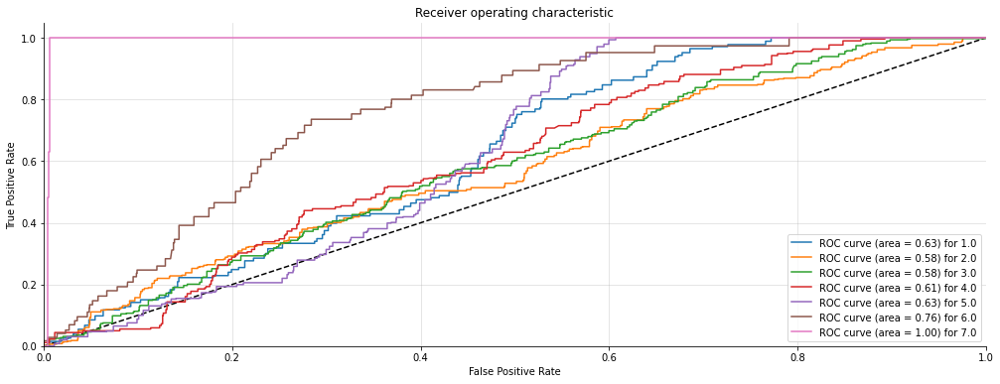

(3360, 7) (3360, 7)


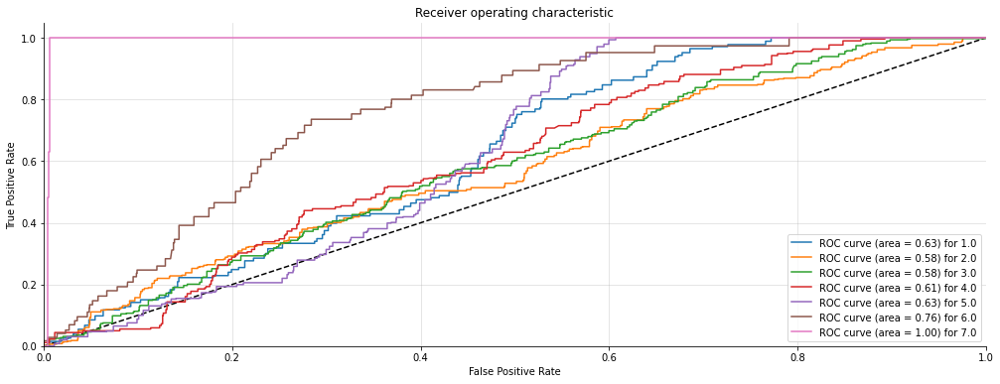

In [175]:
from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import plot_confusion_matrix, accuracy_score
acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]
fpo=dict()
tpo=dict()
ffpo=[]
ttpo=[]
def ADB(X_train, X_test, y_train, y_test, n_classes, figsize=(8, 6)):
    model = AdaBoostClassifier(n_estimators=500)   
    model.fit(X_train, y_train)

    # predictions over test set
    predictions = [round(float(x)) for x in model.predict(X_test)]
    print((classification_report(y_test, predictions)))


    # calculating Accuracy Score, Precision Score, Recall Score and F1 Score
    print('Confusion Matrix: \n' ,confusion_matrix(y_test, predictions))
    acc.append(accuracy_score(y_test, predictions))
    print(f'Accuracy Score : {accuracy_score(y_test, predictions)}')
    pre.append(precision_score(y_test,predictions,average='weighted'))
    print('Precision Score : ' + str(precision_score(y_test,predictions,average='weighted')))
    recal.append(recall_score(y_test,predictions,average='weighted'))
    print('Recall Score : ' + str(recall_score(y_test,predictions,average='weighted')))
    f1.append(f1_score(y_test,predictions,average='weighted'))
    print('F1 Score : ' + str(f1_score(y_test,predictions,average='weighted')))
    rms.append(np.sqrt(mean_squared_error(y_test,predictions)))
    aucscore.append(score_auc(y_test,predictions))
    fpo,tpo=plot_multiclass_roc(model, X_test, y_test, n_classes)
    ffpo.append(fpo)
    ttpo.append(tpo)
    plot_multiclass_roc(model, X_test, y_test, n_classes)

for i in range(8):
  print('For column:', df.columns[1:][i])
  n_classes = len(np.unique(df[df.columns[1:][i]]))
  ADB(X_train, X_test, y_train[:,i], y_test[:,i], n_classes, figsize=(8, 6))

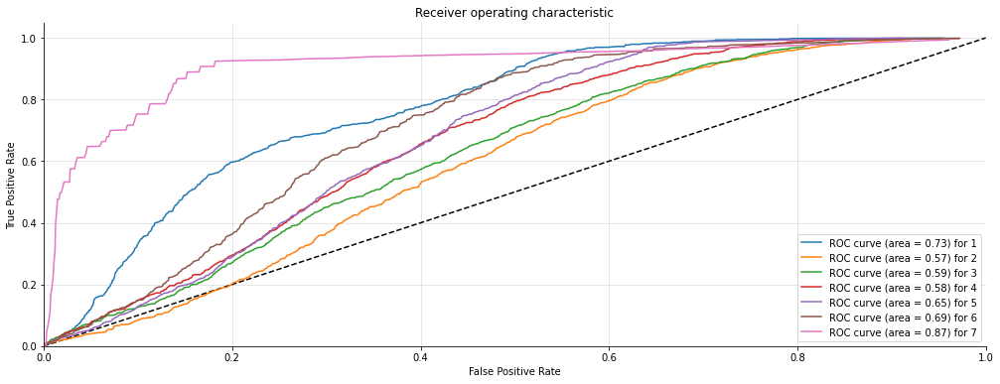

In [176]:
fsum0=list(np.array(dadd(dadd(dadd(ffpo[0][0],ffpo[1][0]),dadd(ffpo[2][0],ffpo[3][0])),dadd(dadd(ffpo[4][0],ffpo[5][0]),dadd(ffpo[6][0],ffpo[7][0]))))/8)
fsum1=list(np.array(dadd(dadd(dadd(ffpo[0][1],ffpo[1][1]),dadd(ffpo[2][1],ffpo[3][1])),dadd(dadd(ffpo[4][1],ffpo[5][1]),dadd(ffpo[6][1],ffpo[7][1]))))/8)
fsum2=list(np.array(dadd(dadd(dadd(ffpo[0][2],ffpo[1][2]),dadd(ffpo[2][2],ffpo[3][2])),dadd(dadd(ffpo[4][2],ffpo[5][2]),dadd(ffpo[6][2],ffpo[7][2]))))/8)
fsum3=list(np.array(dadd(dadd(dadd(ffpo[0][3],ffpo[1][3]),dadd(ffpo[2][3],ffpo[3][3])),dadd(dadd(ffpo[4][3],ffpo[5][3]),dadd(ffpo[6][3],ffpo[7][3]))))/8)
fsum4=list(np.array(dadd(dadd(dadd(ffpo[0][4],ffpo[1][4]),dadd(ffpo[2][4],ffpo[3][4])),dadd(dadd(ffpo[4][4],ffpo[5][4]),dadd(ffpo[6][4],ffpo[7][4]))))/8)
fsum5=list(np.array(dadd(dadd(dadd(ffpo[0][4],ffpo[1][5]),dadd(ffpo[2][5],ffpo[3][5])),dadd(dadd(ffpo[4][5],ffpo[5][5]),dadd(ffpo[6][5],ffpo[7][5]))))/8)
fsum6=list(np.array(dadd(dadd(dadd(ffpo[0][6],ffpo[1][6]),dadd(ffpo[2][6],ffpo[3][6])),dadd(dadd(ffpo[4][6],ffpo[5][6]),dadd(ffpo[6][6],ffpo[7][6]))))/8)

fpr=dict()

fpr[0]=fsum0
fpr[1]=fsum1
fpr[2]=fsum2
fpr[3]=fsum3
fpr[4]=fsum4
fpr[5]=fsum5
fpr[6]=fsum6


tsum0=list(np.array(dadd(dadd(dadd(ttpo[0][0],ttpo[1][0]),dadd(ttpo[2][0],ttpo[3][0])),dadd(dadd(ttpo[4][0],ttpo[5][0]),dadd(ttpo[6][0],ttpo[7][0]))))/8)
tsum1=list(np.array(dadd(dadd(dadd(ttpo[0][1],ttpo[1][1]),dadd(ttpo[2][1],ttpo[3][1])),dadd(dadd(ttpo[4][1],ttpo[5][1]),dadd(ttpo[6][1],ttpo[7][1]))))/8)
tsum2=list(np.array(dadd(dadd(dadd(ttpo[0][2],ttpo[1][2]),dadd(ttpo[2][2],ttpo[3][2])),dadd(dadd(ttpo[4][2],ttpo[5][2]),dadd(ttpo[6][2],ttpo[7][2]))))/8)
tsum3=list(np.array(dadd(dadd(dadd(ttpo[0][3],ttpo[1][3]),dadd(ttpo[2][3],ttpo[3][3])),dadd(dadd(ttpo[4][3],ttpo[5][3]),dadd(ttpo[6][3],ttpo[7][3]))))/8)
tsum4=list(np.array(dadd(dadd(dadd(ttpo[0][4],ttpo[1][4]),dadd(ttpo[2][4],ttpo[3][4])),dadd(dadd(ttpo[4][4],ttpo[5][4]),dadd(ttpo[6][4],ttpo[7][4]))))/8)
tsum5=list(np.array(dadd(dadd(dadd(ttpo[0][4],ttpo[1][5]),dadd(ttpo[2][5],ttpo[3][5])),dadd(dadd(ttpo[4][5],ttpo[5][5]),dadd(ttpo[6][5],ttpo[7][5]))))/8)
tsum6=list(np.array(dadd(dadd(dadd(ttpo[0][6],ttpo[1][6]),dadd(ttpo[2][6],ttpo[3][6])),dadd(dadd(ttpo[4][6],ttpo[5][6]),dadd(ttpo[6][6],ttpo[7][6]))))/8)

tpr=dict()

tpr[0]=tsum0
tpr[1]=tsum1
tpr[2]=tsum2
tpr[3]=tsum3
tpr[4]=tsum4
tpr[5]=tsum5
tpr[6]=tsum6

plot_multiclass_roc_avg(fpr,tpr,7)

In [177]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE {}".format(np.mean(rms)))
print("average AUC score {}".format(np.mean(aucscore)))
metric_df['AdaBoost'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.34691220238095244
average Precision :0.37163115971251404
average Recall :0.34691220238095244
average F1 -score :0.35234175490206887
average RMSE 2.0766328898077244
average AUC score 0.6184720954024525


# 4.7.5 Gradient boosting 

For column: obstructive<==>supportive
              precision    recall  f1-score   support

         1.0       0.57      0.78      0.66       462
         2.0       0.45      0.49      0.47       482
         3.0       0.41      0.26      0.32       510
         4.0       0.38      0.30      0.33       517
         5.0       0.41      0.44      0.43       467
         6.0       0.54      0.59      0.57       470
         7.0       0.78      0.82      0.80       452

    accuracy                           0.52      3360
   macro avg       0.51      0.53      0.51      3360
weighted avg       0.50      0.52      0.50      3360

Confusion Matrix: 
 [[362  45  19  19  11   6   0]
 [ 57 235  51  57  42  38   2]
 [ 57 102 131  91  68  49  12]
 [ 59  67  76 153 130  28   4]
 [ 56  27  16  54 207 106   1]
 [ 24  27  14  11  32 279  83]
 [ 19  18  12  14  13   7 369]]
Accuracy Score : 0.5166666666666667
Precision Score : 0.5032137082396128
Recall Score : 0.5166666666666667
F1 Score : 0.5037086

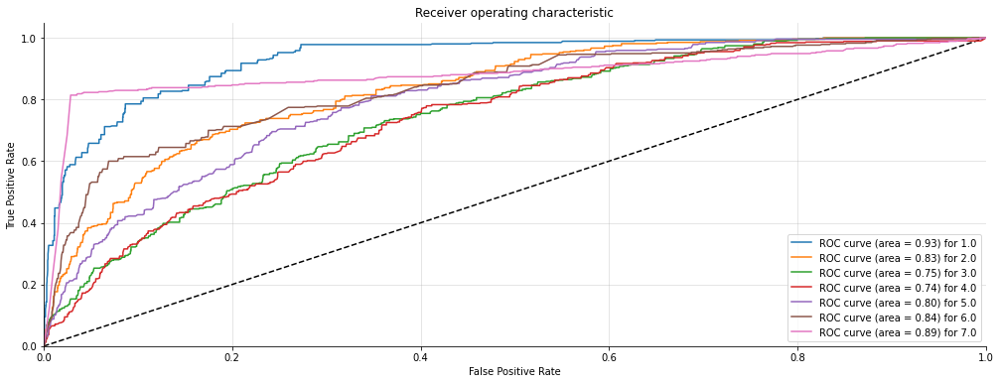

(3360, 7) (3360, 7)


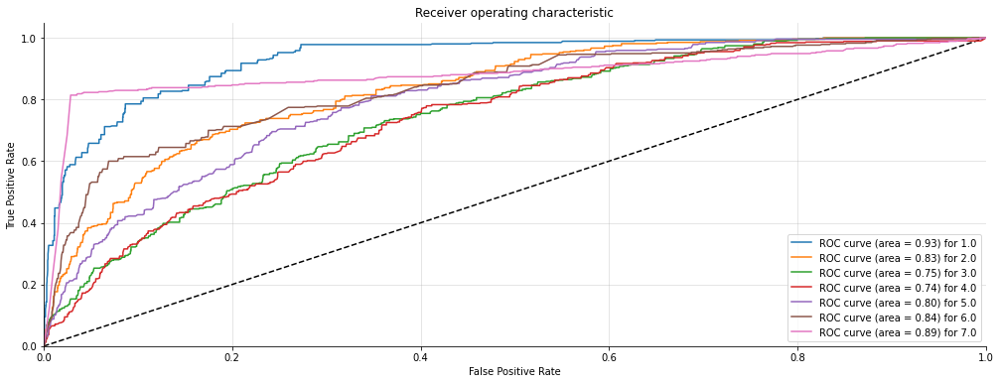

For column: complicated<==>easy
              precision    recall  f1-score   support

         1.0       0.57      0.81      0.67       463
         2.0       0.47      0.45      0.46       485
         3.0       0.45      0.33      0.38       501
         4.0       0.39      0.30      0.34       515
         5.0       0.47      0.49      0.48       460
         6.0       0.62      0.71      0.66       484
         7.0       0.89      0.90      0.90       452

    accuracy                           0.56      3360
   macro avg       0.55      0.57      0.55      3360
weighted avg       0.55      0.56      0.55      3360

Confusion Matrix: 
 [[375  27   9  22  10  20   0]
 [ 70 216  64  50  43  38   4]
 [ 53  99 163  89  53  42   2]
 [ 65  64  80 154 119  33   0]
 [ 53  22  21  61 224  79   0]
 [ 26  14  18  15  24 344  43]
 [ 11  14   5   5   6   3 408]]
Accuracy Score : 0.5607142857142857
Precision Score : 0.547393326263447
Recall Score : 0.5607142857142857
F1 Score : 0.54824683163369

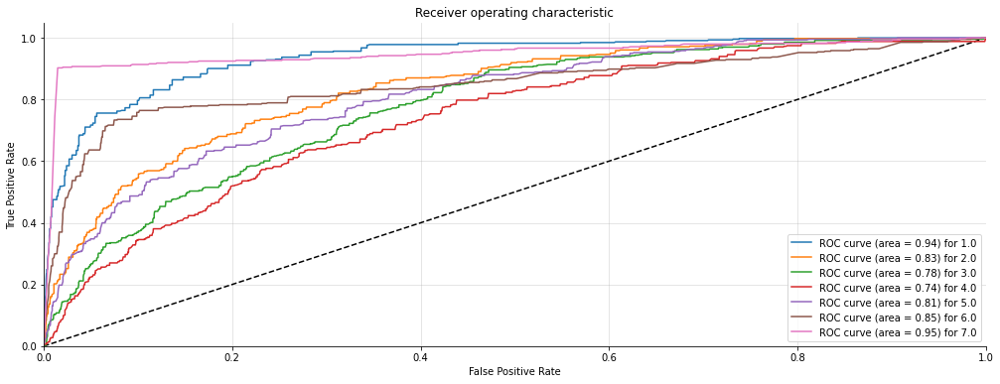

(3360, 7) (3360, 7)


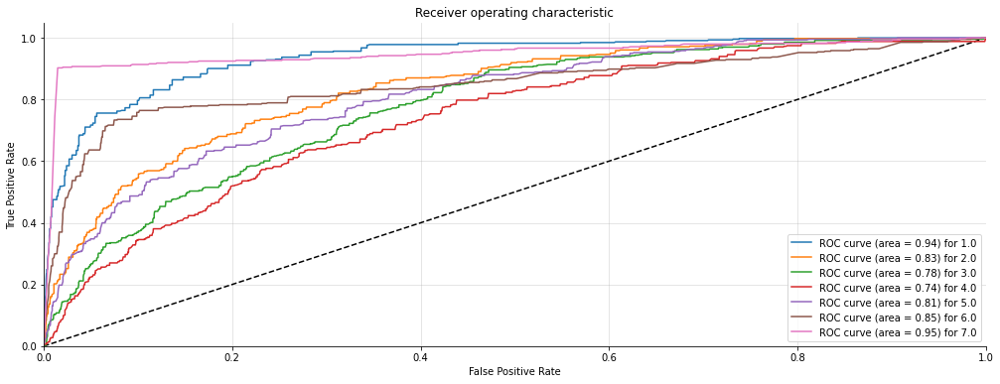

For column: inefficient<==>efficient
              precision    recall  f1-score   support

         1.0       0.59      0.78      0.67       462
         2.0       0.43      0.43      0.43       482
         3.0       0.47      0.35      0.41       506
         4.0       0.40      0.36      0.38       526
         5.0       0.46      0.41      0.43       458
         6.0       0.55      0.62      0.58       475
         7.0       0.81      0.83      0.82       451

    accuracy                           0.53      3360
   macro avg       0.53      0.54      0.53      3360
weighted avg       0.53      0.53      0.53      3360

Confusion Matrix: 
 [[362  38  15  15  11  21   0]
 [ 75 209  70  50  45  32   1]
 [ 55  94 179 102  27  41   8]
 [ 61  76  60 190 106  30   3]
 [ 38  29  25  72 187 107   0]
 [ 10  23  14  30  28 293  77]
 [ 17  17  14  14   6   8 375]]
Accuracy Score : 0.5342261904761905
Precision Score : 0.5251290274830271
Recall Score : 0.5342261904761905
F1 Score : 0.52574595

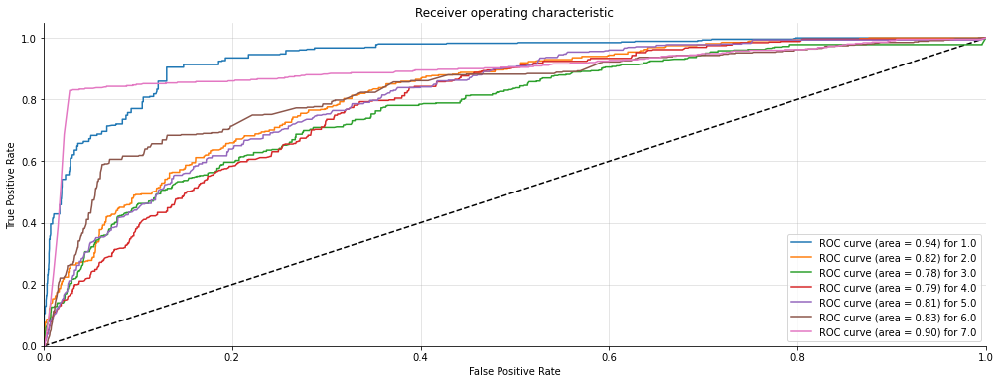

(3360, 7) (3360, 7)


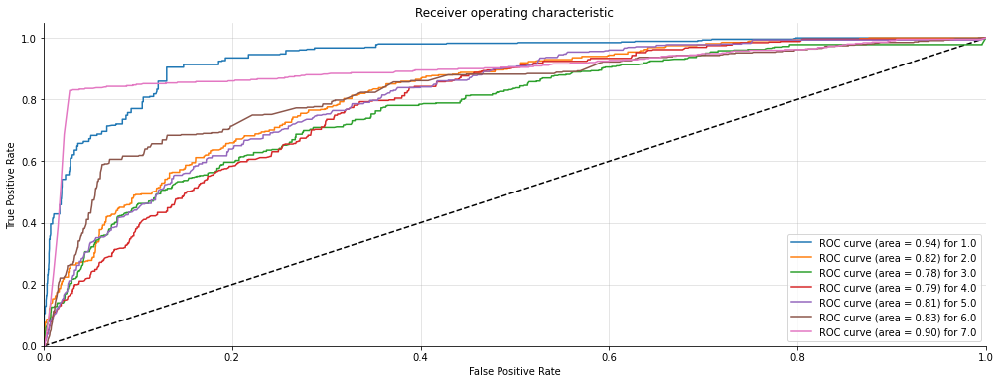

For column:  confusing<==>clear
              precision    recall  f1-score   support

         1.0       0.55      0.75      0.63       461
         2.0       0.44      0.47      0.45       488
         3.0       0.42      0.25      0.31       506
         4.0       0.41      0.29      0.34       516
         5.0       0.42      0.46      0.44       456
         6.0       0.50      0.63      0.56       471
         7.0       0.80      0.79      0.80       462

    accuracy                           0.51      3360
   macro avg       0.51      0.52      0.50      3360
weighted avg       0.50      0.51      0.50      3360

Confusion Matrix: 
 [[346  55  19  14  10  17   0]
 [ 74 230  44  54  34  51   1]
 [ 62 114 124  78  62  62   4]
 [ 62  62  70 148 135  39   0]
 [ 39  22  21  42 211 121   0]
 [ 27  12   9  10  31 296  86]
 [ 19  28  10  14  19   7 365]]
Accuracy Score : 0.5119047619047619
Precision Score : 0.5024280076362442
Recall Score : 0.5119047619047619
F1 Score : 0.4987064078720

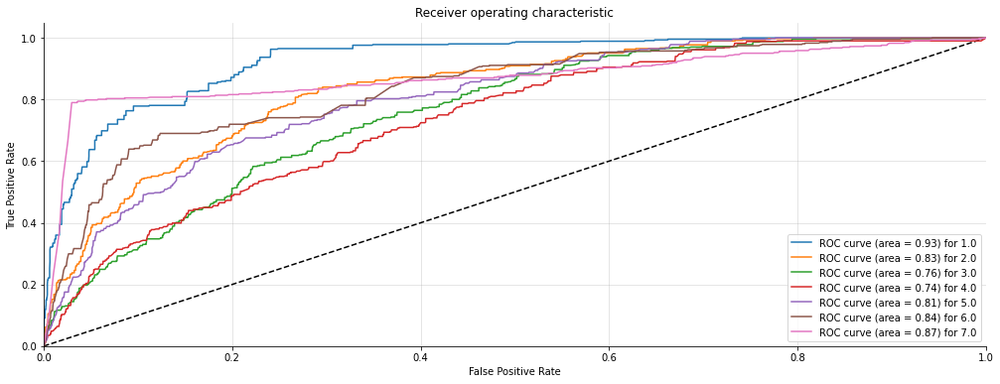

(3360, 7) (3360, 7)


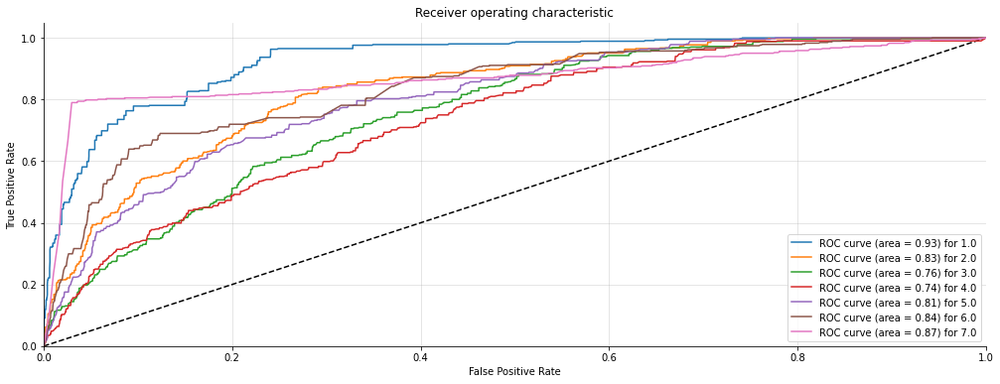

For column: boring<==>exciting
              precision    recall  f1-score   support

         1.0       0.56      0.75      0.64       463
         2.0       0.37      0.32      0.34       491
         3.0       0.51      0.50      0.50       487
         4.0       0.53      0.34      0.42       518
         5.0       0.62      0.55      0.58       487
         6.0       0.68      0.92      0.78       462
         7.0       0.99      0.99      0.99       452

    accuracy                           0.61      3360
   macro avg       0.61      0.62      0.61      3360
weighted avg       0.60      0.61      0.60      3360

Confusion Matrix: 
 [[346  54  12  13  18  20   0]
 [ 83 155 102  56  43  52   0]
 [ 52  65 243  50  39  38   0]
 [ 69  84  79 178  64  44   0]
 [ 56  41  42  36 269  43   0]
 [ 12  14   2   3   3 423   5]
 [  0   1   1   0   1   3 446]]
Accuracy Score : 0.6130952380952381
Precision Score : 0.6023657016841574
Recall Score : 0.6130952380952381
F1 Score : 0.59979150099182

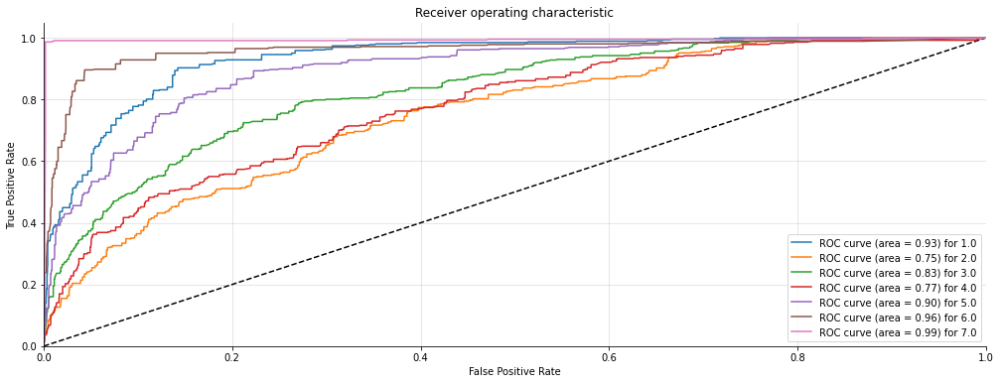

(3360, 7) (3360, 7)


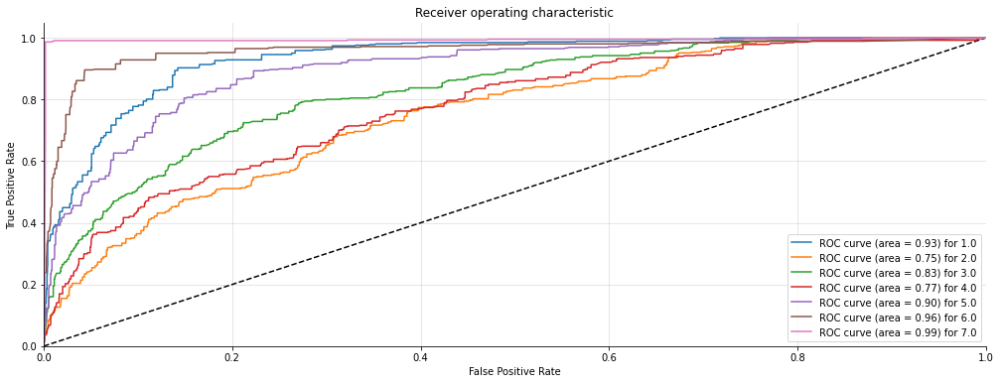

For column: not interesting<==>interesting
              precision    recall  f1-score   support

         1.0       0.52      0.70      0.60       461
         2.0       0.37      0.33      0.35       495
         3.0       0.45      0.31      0.37       490
         4.0       0.47      0.31      0.38       519
         5.0       0.50      0.53      0.51       481
         6.0       0.64      0.88      0.74       465
         7.0       0.99      0.99      0.99       449

    accuracy                           0.57      3360
   macro avg       0.56      0.58      0.56      3360
weighted avg       0.55      0.57      0.55      3360

Confusion Matrix: 
 [[323  49   7  19  27  36   0]
 [ 93 165  64  65  64  44   0]
 [ 57 110 153  44  71  55   0]
 [ 63  97  79 162  73  45   0]
 [ 75  27  30  43 254  52   0]
 [ 10   1  10  10  22 407   5]
 [  0   1   0   0   1   1 446]]
Accuracy Score : 0.5684523809523809
Precision Score : 0.5545626146683493
Recall Score : 0.5684523809523809
F1 Score : 0.55

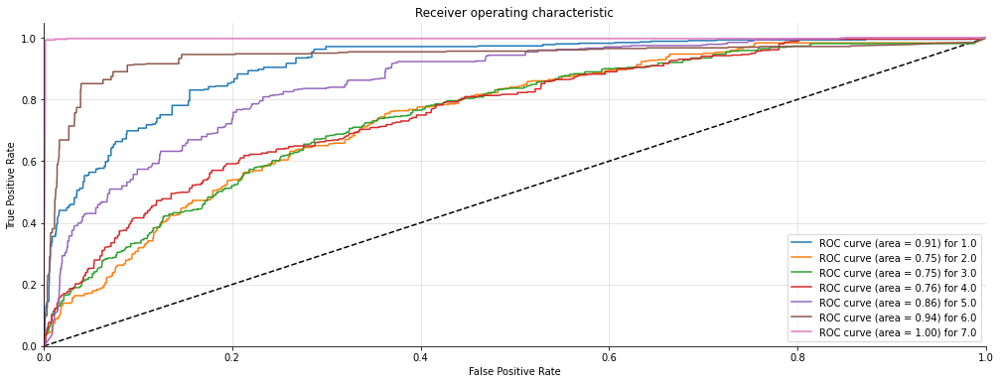

(3360, 7) (3360, 7)


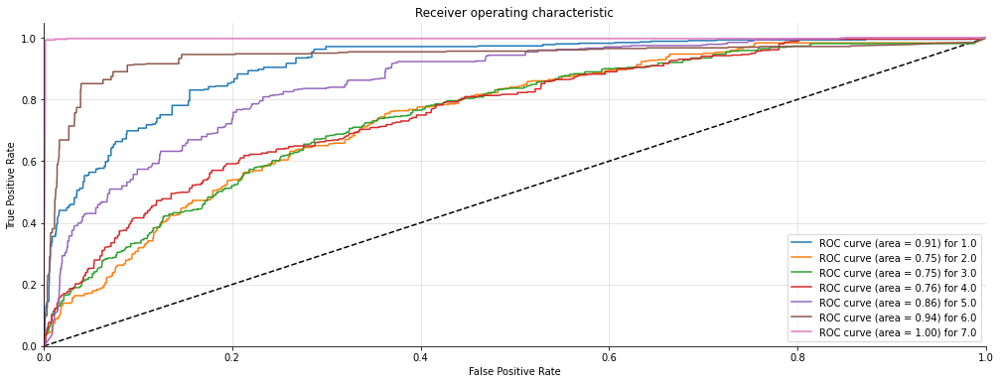

For column: conventional<==>inventive
              precision    recall  f1-score   support

         1.0       0.58      0.79      0.67       460
         2.0       0.52      0.38      0.44       502
         3.0       0.50      0.48      0.49       474
         4.0       0.56      0.42      0.48       527
         5.0       0.66      0.65      0.66       486
         6.0       0.68      0.87      0.76       459
         7.0       1.00      1.00      1.00       452

    accuracy                           0.65      3360
   macro avg       0.64      0.66      0.64      3360
weighted avg       0.64      0.65      0.63      3360

Confusion Matrix: 
 [[362  27  13  17  16  25   0]
 [ 80 191  90  53  45  43   0]
 [ 49  63 227  64  42  29   0]
 [ 57  55  77 221  55  62   0]
 [ 57  21  35  25 315  33   0]
 [ 18  12  10  16   2 401   0]
 [  0   0   0   1   0   0 451]]
Accuracy Score : 0.6452380952380953
Precision Score : 0.6378653206702248
Recall Score : 0.6452380952380953
F1 Score : 0.6345817

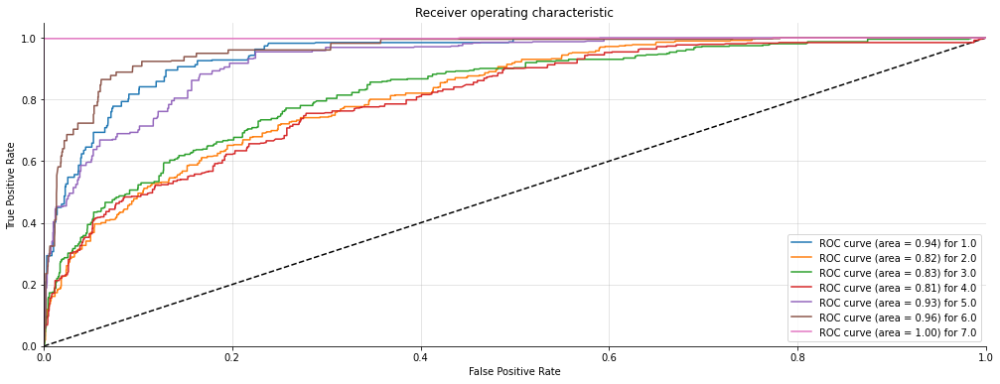

(3360, 7) (3360, 7)


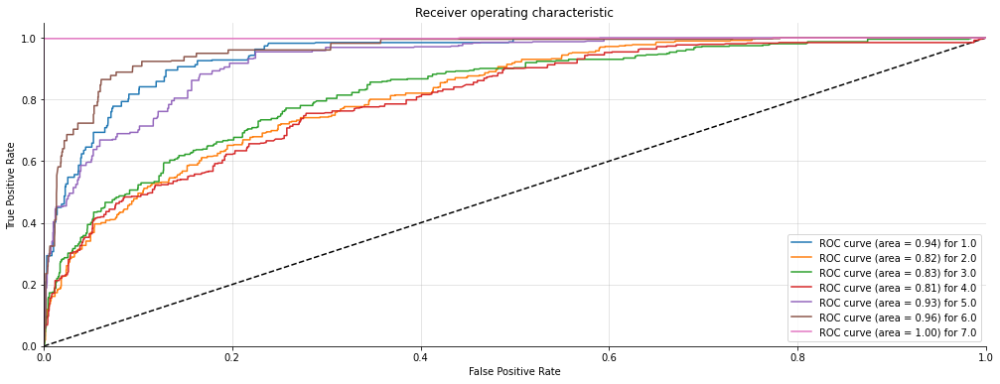

For column: usual<==>leading edge
              precision    recall  f1-score   support

         1.0       0.55      0.76      0.64       459
         2.0       0.34      0.24      0.29       496
         3.0       0.38      0.37      0.37       478
         4.0       0.43      0.31      0.36       523
         5.0       0.46      0.43      0.44       491
         6.0       0.64      0.87      0.74       462
         7.0       1.00      1.00      1.00       451

    accuracy                           0.56      3360
   macro avg       0.54      0.57      0.55      3360
weighted avg       0.54      0.56      0.54      3360

Confusion Matrix: 
 [[348  32  14  27   9  29   0]
 [ 94 121  73  72  88  48   0]
 [ 50  80 175  49  64  60   0]
 [ 74  57  99 163  83  47   0]
 [ 54  50  79  51 209  48   0]
 [ 11  12  17  18   0 404   0]
 [  0   0   0   0   0   0 451]]
Accuracy Score : 0.5568452380952381
Precision Score : 0.5363172029995765
Recall Score : 0.5568452380952381
F1 Score : 0.53891905159

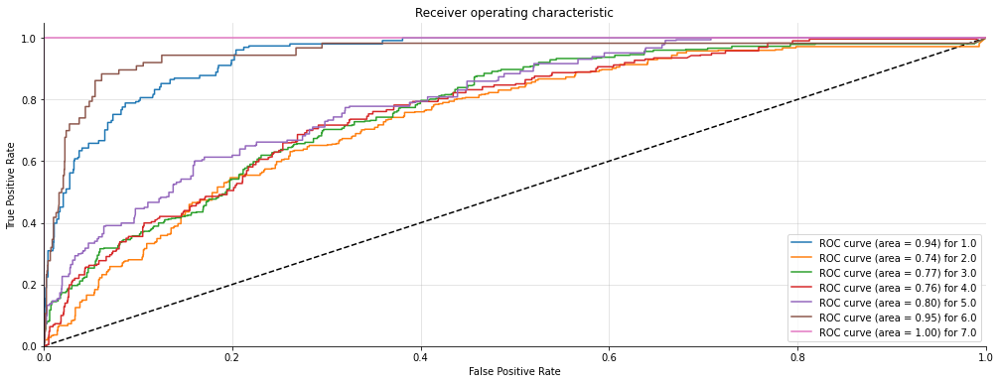

(3360, 7) (3360, 7)


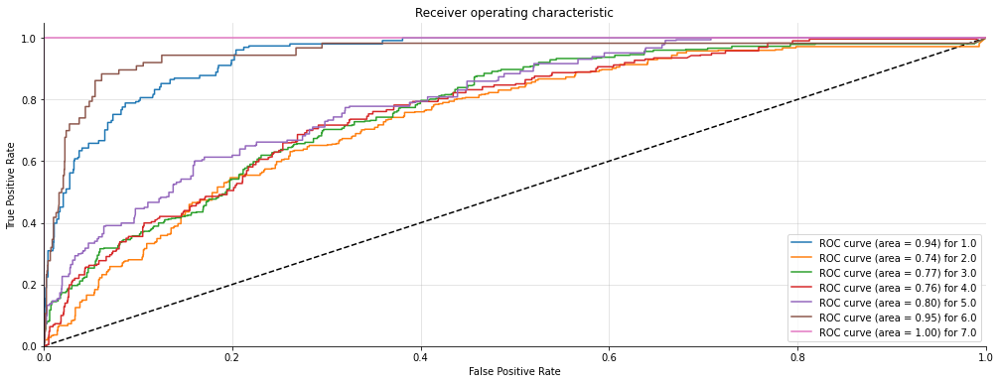

In [178]:
from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import plot_confusion_matrix, accuracy_score
acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]
fpo=dict()
tpo=dict()
ffpo=[]
ttpo=[]
def GBC(X_train, X_test, y_train, y_test, n_classes, figsize=(8, 6)):
    model = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0,
     max_depth=1, random_state=0)   
    model.fit(X_train, y_train)

    # predictions over test set
    predictions = [round(float(x)) for x in model.predict(X_test)]
    print((classification_report(y_test, predictions)))


    # calculating Accuracy Score, Precision Score, Recall Score and F1 Score
    print('Confusion Matrix: \n' ,confusion_matrix(y_test, predictions))
    acc.append(accuracy_score(y_test, predictions))
    print(f'Accuracy Score : {accuracy_score(y_test, predictions)}')
    pre.append(precision_score(y_test,predictions,average='weighted'))
    print('Precision Score : ' + str(precision_score(y_test,predictions,average='weighted')))
    recal.append(recall_score(y_test,predictions,average='weighted'))
    print('Recall Score : ' + str(recall_score(y_test,predictions,average='weighted')))
    f1.append(f1_score(y_test,predictions,average='weighted'))
    print('F1 Score : ' + str(f1_score(y_test,predictions,average='weighted')))
    rms.append(np.sqrt(mean_squared_error(y_test,predictions)))
    aucscore.append(score_auc(y_test,predictions))
    fpo,tpo=plot_multiclass_roc(model, X_test, y_test, n_classes)
    ffpo.append(fpo)
    ttpo.append(tpo)
    plot_multiclass_roc(model, X_test, y_test, n_classes)

for i in range(8):
  print('For column:', df.columns[1:][i])
  n_classes = len(np.unique(df[df.columns[1:][i]]))
  GBC(X_train, X_test, y_train[:,i], y_test[:,i], n_classes, figsize=(8, 6))

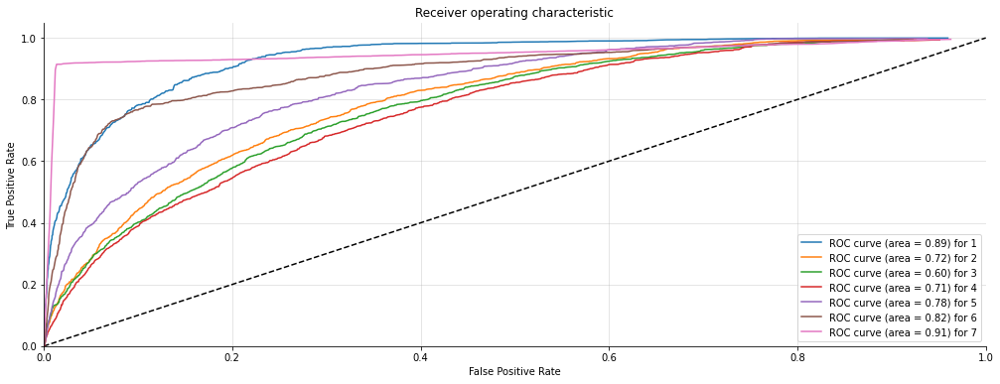

In [179]:
fsum0=list(np.array(dadd(dadd(dadd(ffpo[0][0],ffpo[1][0]),dadd(ffpo[2][0],ffpo[3][0])),dadd(dadd(ffpo[4][0],ffpo[5][0]),dadd(ffpo[6][0],ffpo[7][0]))))/8)
fsum1=list(np.array(dadd(dadd(dadd(ffpo[0][1],ffpo[1][1]),dadd(ffpo[2][1],ffpo[3][1])),dadd(dadd(ffpo[4][1],ffpo[5][1]),dadd(ffpo[6][1],ffpo[7][1]))))/8)
fsum2=list(np.array(dadd(dadd(dadd(ffpo[0][2],ffpo[1][2]),dadd(ffpo[2][2],ffpo[3][2])),dadd(dadd(ffpo[4][2],ffpo[5][2]),dadd(ffpo[6][2],ffpo[7][2]))))/8)
fsum3=list(np.array(dadd(dadd(dadd(ffpo[0][3],ffpo[1][3]),dadd(ffpo[2][3],ffpo[3][3])),dadd(dadd(ffpo[4][3],ffpo[5][3]),dadd(ffpo[6][3],ffpo[7][3]))))/8)
fsum4=list(np.array(dadd(dadd(dadd(ffpo[0][4],ffpo[1][4]),dadd(ffpo[2][4],ffpo[3][4])),dadd(dadd(ffpo[4][4],ffpo[5][4]),dadd(ffpo[6][4],ffpo[7][4]))))/8)
fsum5=list(np.array(dadd(dadd(dadd(ffpo[0][4],ffpo[1][5]),dadd(ffpo[2][5],ffpo[3][5])),dadd(dadd(ffpo[4][5],ffpo[5][5]),dadd(ffpo[6][5],ffpo[7][5]))))/8)
fsum6=list(np.array(dadd(dadd(dadd(ffpo[0][6],ffpo[1][6]),dadd(ffpo[2][6],ffpo[3][6])),dadd(dadd(ffpo[4][6],ffpo[5][6]),dadd(ffpo[6][6],ffpo[7][6]))))/8)

fpr=dict()

fpr[0]=fsum0
fpr[1]=fsum1
fpr[2]=fsum2
fpr[3]=fsum3
fpr[4]=fsum4
fpr[5]=fsum5
fpr[6]=fsum6


tsum0=list(np.array(dadd(dadd(dadd(ttpo[0][0],ttpo[1][0]),dadd(ttpo[2][0],ttpo[3][0])),dadd(dadd(ttpo[4][0],ttpo[5][0]),dadd(ttpo[6][0],ttpo[7][0]))))/8)
tsum1=list(np.array(dadd(dadd(dadd(ttpo[0][1],ttpo[1][1]),dadd(ttpo[2][1],ttpo[3][1])),dadd(dadd(ttpo[4][1],ttpo[5][1]),dadd(ttpo[6][1],ttpo[7][1]))))/8)
tsum2=list(np.array(dadd(dadd(dadd(ttpo[0][2],ttpo[1][2]),dadd(ttpo[2][2],ttpo[3][2])),dadd(dadd(ttpo[4][2],ttpo[5][2]),dadd(ttpo[6][2],ttpo[7][2]))))/8)
tsum3=list(np.array(dadd(dadd(dadd(ttpo[0][3],ttpo[1][3]),dadd(ttpo[2][3],ttpo[3][3])),dadd(dadd(ttpo[4][3],ttpo[5][3]),dadd(ttpo[6][3],ttpo[7][3]))))/8)
tsum4=list(np.array(dadd(dadd(dadd(ttpo[0][4],ttpo[1][4]),dadd(ttpo[2][4],ttpo[3][4])),dadd(dadd(ttpo[4][4],ttpo[5][4]),dadd(ttpo[6][4],ttpo[7][4]))))/8)
tsum5=list(np.array(dadd(dadd(dadd(ttpo[0][4],ttpo[1][5]),dadd(ttpo[2][5],ttpo[3][5])),dadd(dadd(ttpo[4][5],ttpo[5][5]),dadd(ttpo[6][5],ttpo[7][5]))))/8)
tsum6=list(np.array(dadd(dadd(dadd(ttpo[0][6],ttpo[1][6]),dadd(ttpo[2][6],ttpo[3][6])),dadd(dadd(ttpo[4][6],ttpo[5][6]),dadd(ttpo[6][6],ttpo[7][6]))))/8)

tpr=dict()

tpr[0]=tsum0
tpr[1]=tsum1
tpr[2]=tsum2
tpr[3]=tsum3
tpr[4]=tsum4
tpr[5]=tsum5
tpr[6]=tsum6

plot_multiclass_roc_avg(fpr,tpr,7)

In [180]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE {}".format(np.mean(rms)))
print("average AUC score {}".format(np.mean(aucscore)))
metric_df['GradientBoost'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.5633928571428573
average Precision :0.5511593637055798
average Recall :0.5633928571428573
average F1 -score :0.5502896323126116
average RMSE 1.5229950251826132
average AUC score 0.7451237114322514


# 4.7.6 Bagging classfier

In [164]:
from sklearn.ensemble import BaggingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold

For column: obstructive<==>supportive
              precision    recall  f1-score   support

         1.0       0.95      0.96      0.95       462
         2.0       0.78      0.85      0.81       482
         3.0       0.71      0.67      0.69       510
         4.0       0.67      0.62      0.64       517
         5.0       0.64      0.65      0.64       467
         6.0       0.72      0.72      0.72       470
         7.0       0.82      0.81      0.82       452

    accuracy                           0.75      3360
   macro avg       0.75      0.76      0.75      3360
weighted avg       0.75      0.75      0.75      3360

Confusion Matrix: 
 [[442  19   0   0   1   0   0]
 [  5 412  54   5   5   1   0]
 [  1  47 340 110   6   6   0]
 [  0   2  43 322 144   6   0]
 [  4   5  14  28 304 112   0]
 [  3  19  11   8   7 339  83]
 [ 11  27  20  10  10   6 368]]
Accuracy Score : 0.7520833333333333
Precision Score : 0.7506094283059153
Recall Score : 0.7520833333333333
F1 Score : 0.7508624

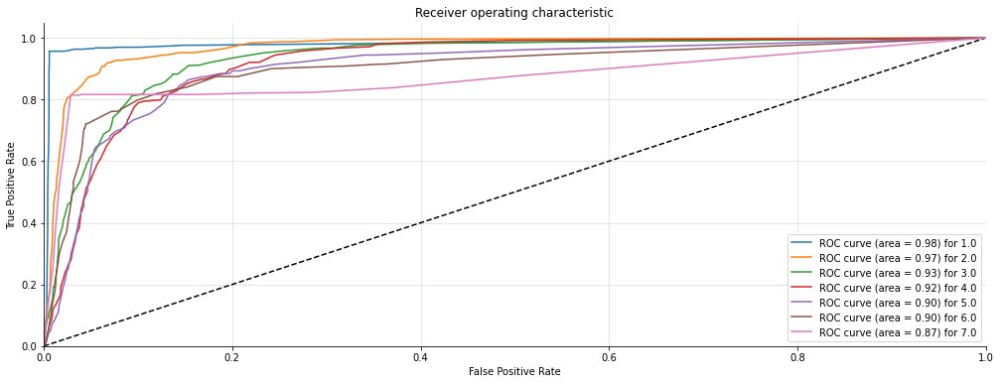

(3360, 7) (3360, 7)


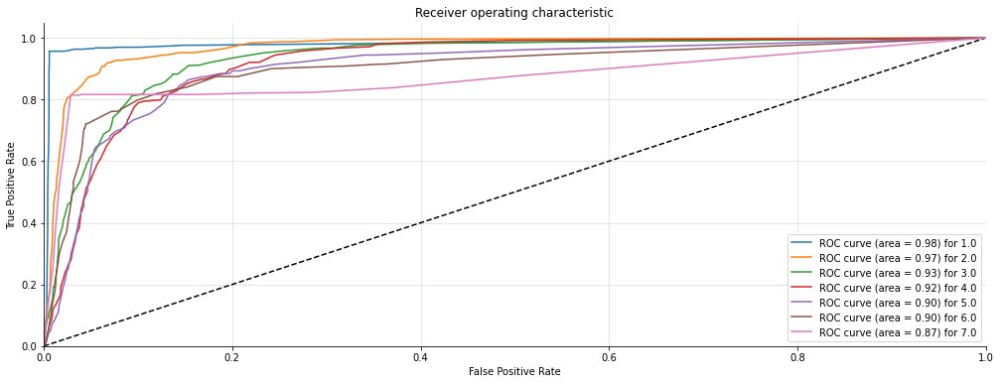

For column: complicated<==>easy
              precision    recall  f1-score   support

         1.0       0.94      0.95      0.95       463
         2.0       0.81      0.85      0.83       485
         3.0       0.71      0.68      0.70       501
         4.0       0.69      0.66      0.68       515
         5.0       0.70      0.75      0.72       460
         6.0       0.83      0.79      0.81       484
         7.0       0.90      0.90      0.90       452

    accuracy                           0.79      3360
   macro avg       0.80      0.80      0.80      3360
weighted avg       0.79      0.79      0.79      3360

Confusion Matrix: 
 [[442  18   0   2   0   1   0]
 [ 10 411  55   3   3   3   0]
 [  1  35 342 113  10   0   0]
 [  0   2  48 340 123   2   0]
 [  3  10  17  16 344  70   0]
 [  6  17  14  14   6 384  43]
 [ 10  17   7   3   5   2 408]]
Accuracy Score : 0.7949404761904761
Precision Score : 0.7944228842144865
Recall Score : 0.7949404761904761
F1 Score : 0.7943318009621

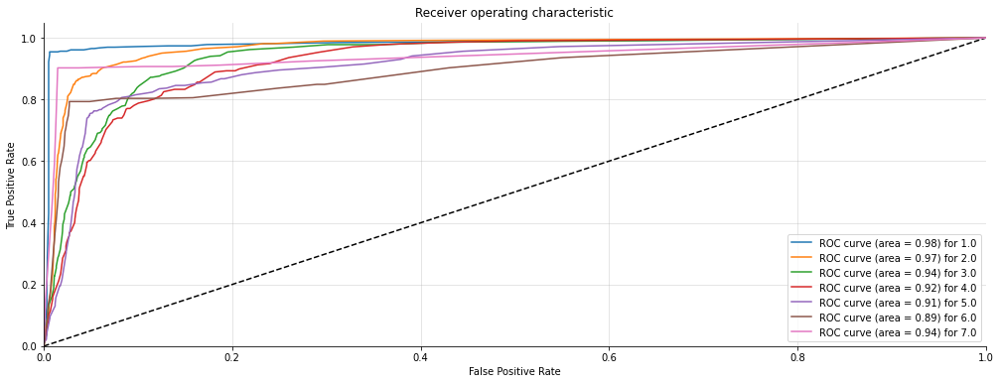

(3360, 7) (3360, 7)


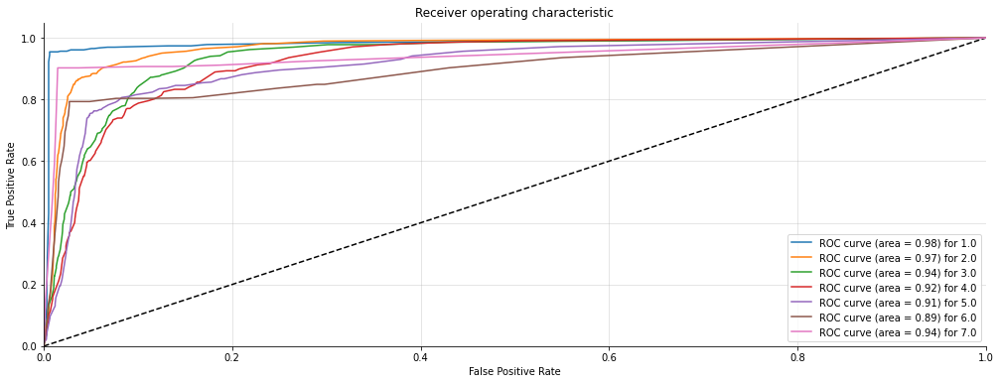

For column: inefficient<==>efficient
              precision    recall  f1-score   support

         1.0       0.94      0.96      0.95       462
         2.0       0.79      0.87      0.83       482
         3.0       0.70      0.68      0.69       506
         4.0       0.68      0.60      0.64       526
         5.0       0.63      0.69      0.66       458
         6.0       0.72      0.69      0.70       475
         7.0       0.83      0.83      0.83       451

    accuracy                           0.76      3360
   macro avg       0.76      0.76      0.76      3360
weighted avg       0.75      0.76      0.75      3360

Confusion Matrix: 
 [[442  18   0   0   0   2   0]
 [  6 421  50   0   3   2   0]
 [  4  40 342 112   3   5   0]
 [  0   2  53 318 151   2   0]
 [  3   3   8  17 315 112   0]
 [  6  17  21  12  15 327  77]
 [  9  29  13  10  10   6 374]]
Accuracy Score : 0.7556547619047619
Precision Score : 0.7542399069771083
Recall Score : 0.7556547619047619
F1 Score : 0.75410955

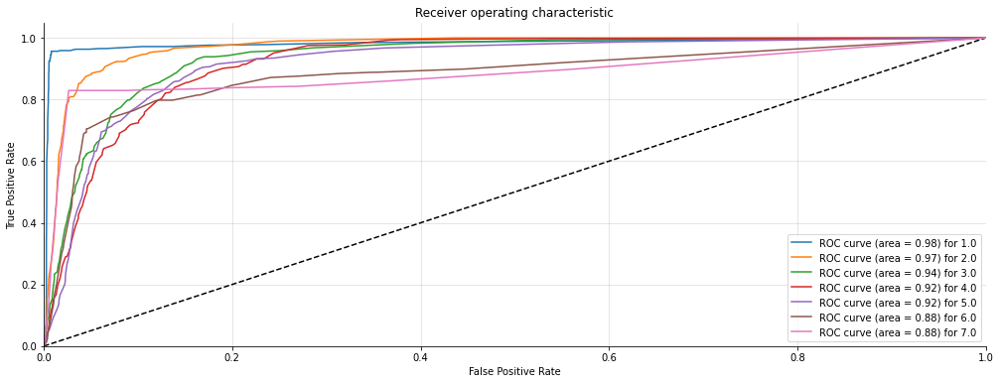

(3360, 7) (3360, 7)


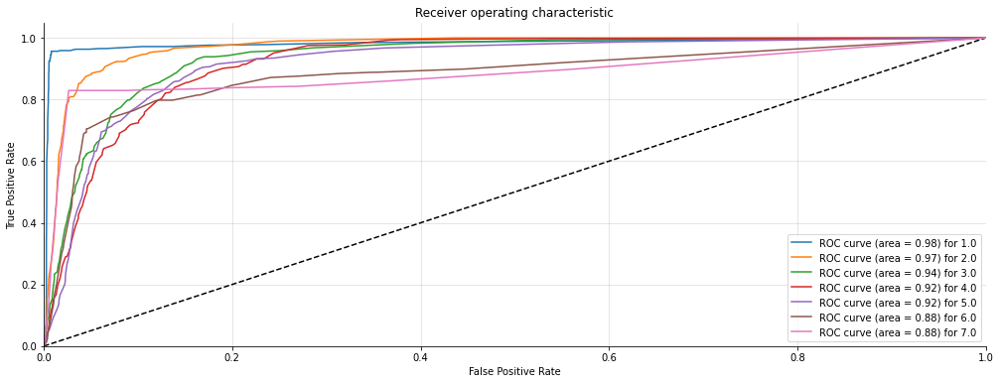

For column:  confusing<==>clear
              precision    recall  f1-score   support

         1.0       0.95      0.96      0.95       461
         2.0       0.80      0.85      0.82       488
         3.0       0.72      0.69      0.70       506
         4.0       0.64      0.66      0.65       516
         5.0       0.64      0.62      0.63       456
         6.0       0.73      0.72      0.72       471
         7.0       0.81      0.79      0.80       462

    accuracy                           0.75      3360
   macro avg       0.75      0.75      0.75      3360
weighted avg       0.75      0.75      0.75      3360

Confusion Matrix: 
 [[442  17   0   1   1   0   0]
 [  4 413  55   6   7   3   0]
 [  4  34 348 112   4   4   0]
 [  0   0  37 341 133   5   0]
 [  2   2  10  49 284 109   0]
 [  2  14  15  12   5 337  86]
 [ 13  37  20  13  10   4 365]]
Accuracy Score : 0.7529761904761905
Precision Score : 0.7523427273300916
Recall Score : 0.7529761904761905
F1 Score : 0.7524370667764

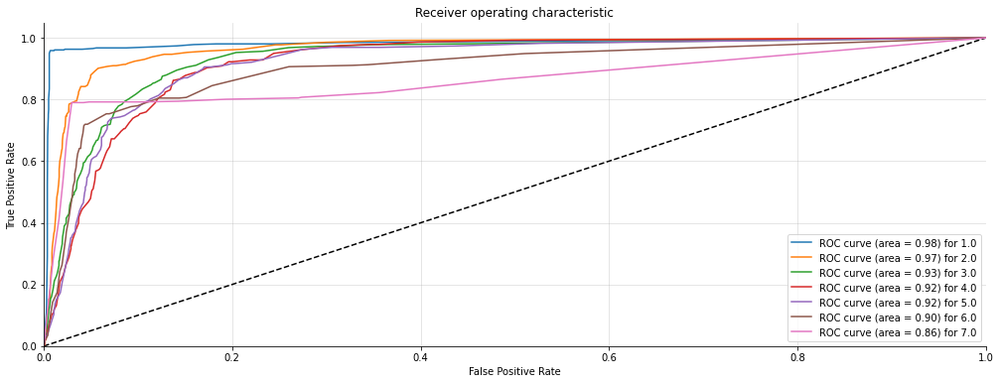

(3360, 7) (3360, 7)


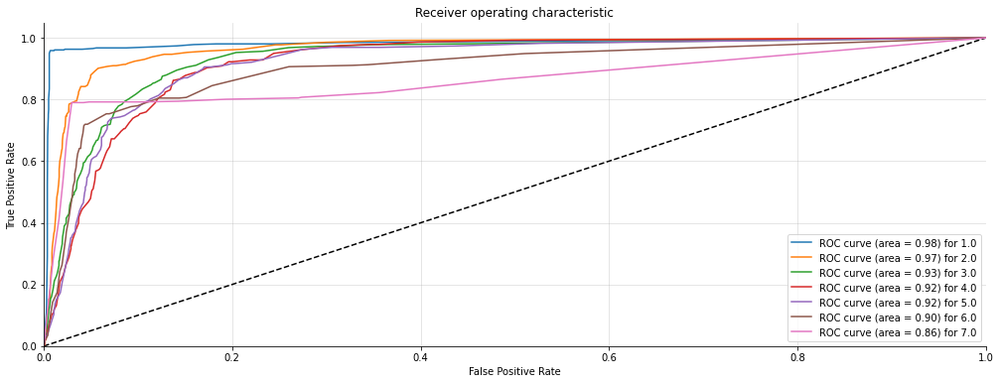

For column: boring<==>exciting
              precision    recall  f1-score   support

         1.0       0.94      0.95      0.95       463
         2.0       0.84      0.85      0.85       491
         3.0       0.81      0.76      0.79       487
         4.0       0.84      0.84      0.84       518
         5.0       0.90      0.92      0.91       487
         6.0       0.95      0.96      0.95       462
         7.0       0.99      0.99      0.99       452

    accuracy                           0.90      3360
   macro avg       0.90      0.90      0.90      3360
weighted avg       0.89      0.90      0.89      3360

Confusion Matrix: 
 [[442  18   1   0   1   1   0]
 [ 13 419  45   7   4   3   0]
 [  9  33 372  66   6   1   0]
 [  3  16  27 436  32   4   0]
 [  1   7   7  11 450  11   0]
 [  1   3   4   2   4 443   5]
 [  0   0   2   0   1   3 446]]
Accuracy Score : 0.8952380952380953
Precision Score : 0.894518391018448
Recall Score : 0.8952380952380953
F1 Score : 0.894741044160917

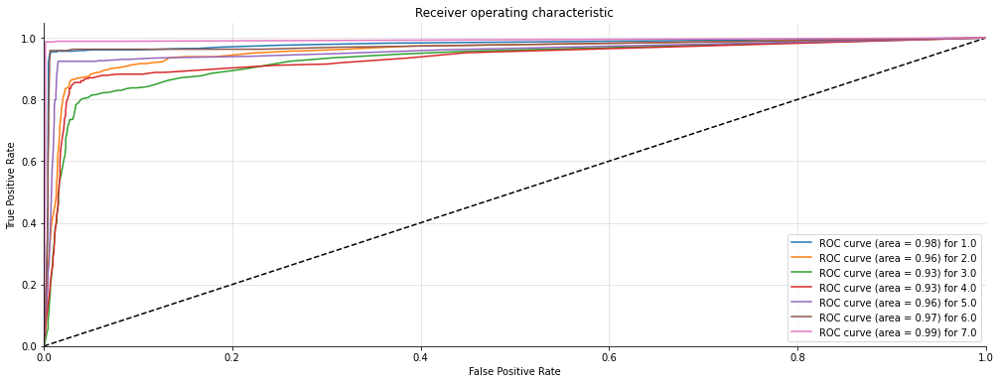

(3360, 7) (3360, 7)


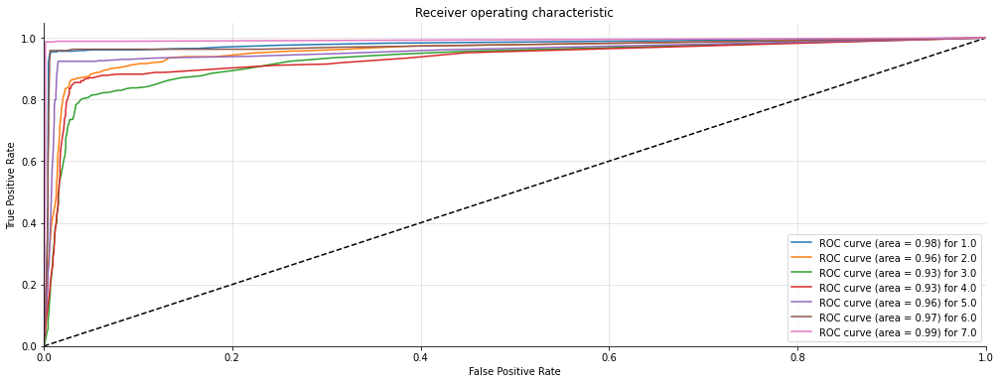

For column: not interesting<==>interesting
              precision    recall  f1-score   support

         1.0       0.95      0.96      0.95       461
         2.0       0.83      0.85      0.84       495
         3.0       0.78      0.75      0.76       490
         4.0       0.82      0.79      0.81       519
         5.0       0.88      0.91      0.89       481
         6.0       0.95      0.96      0.95       465
         7.0       0.99      0.99      0.99       449

    accuracy                           0.88      3360
   macro avg       0.88      0.89      0.89      3360
weighted avg       0.88      0.88      0.88      3360

Confusion Matrix: 
 [[442  17   1   0   0   1   0]
 [ 11 420  50   3   5   6   0]
 [  8  40 368  67   4   3   0]
 [  3  18  40 409  47   2   0]
 [  1   8   9  16 436  11   0]
 [  1   2   4   2   6 445   5]
 [  0   0   2   0   0   1 446]]
Accuracy Score : 0.8827380952380952
Precision Score : 0.8817888623170618
Recall Score : 0.8827380952380952
F1 Score : 0.88

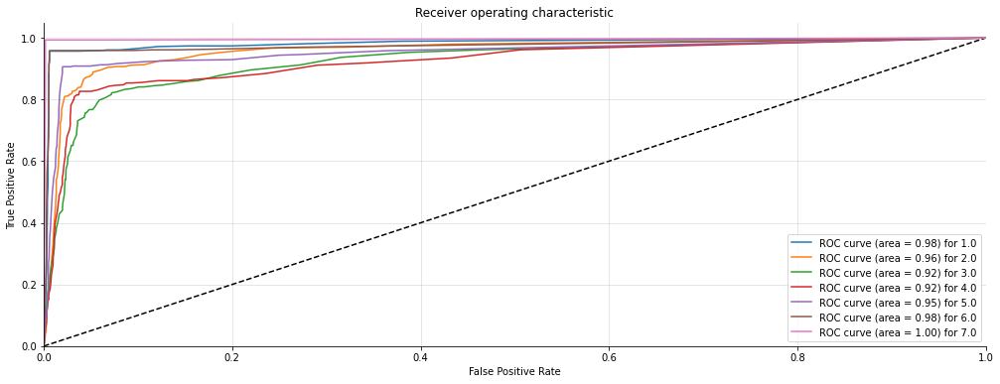

(3360, 7) (3360, 7)


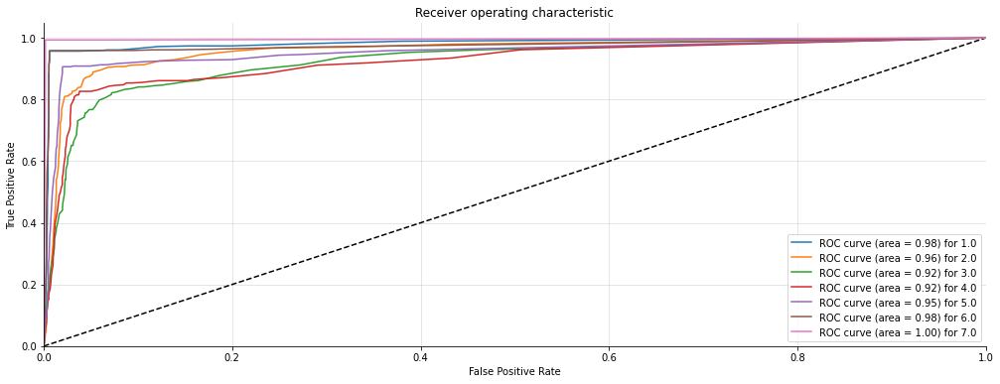

For column: conventional<==>inventive
              precision    recall  f1-score   support

         1.0       0.97      0.99      0.98       460
         2.0       0.96      0.90      0.93       502
         3.0       0.92      0.93      0.93       474
         4.0       0.94      0.92      0.93       527
         5.0       0.94      0.98      0.96       486
         6.0       0.98      0.99      0.99       459
         7.0       1.00      1.00      1.00       452

    accuracy                           0.96      3360
   macro avg       0.96      0.96      0.96      3360
weighted avg       0.96      0.96      0.96      3360

Confusion Matrix: 
 [[454   6   0   0   0   0   0]
 [ 11 454  22   9   6   0   0]
 [  5  11 442  15   1   0   0]
 [  0   1  16 487  19   4   0]
 [  0   0   0   8 476   2   0]
 [  0   0   0   0   4 455   0]
 [  0   0   0   0   0   1 451]]
Accuracy Score : 0.9580357142857143
Precision Score : 0.9581575377290789
Recall Score : 0.9580357142857143
F1 Score : 0.9578771

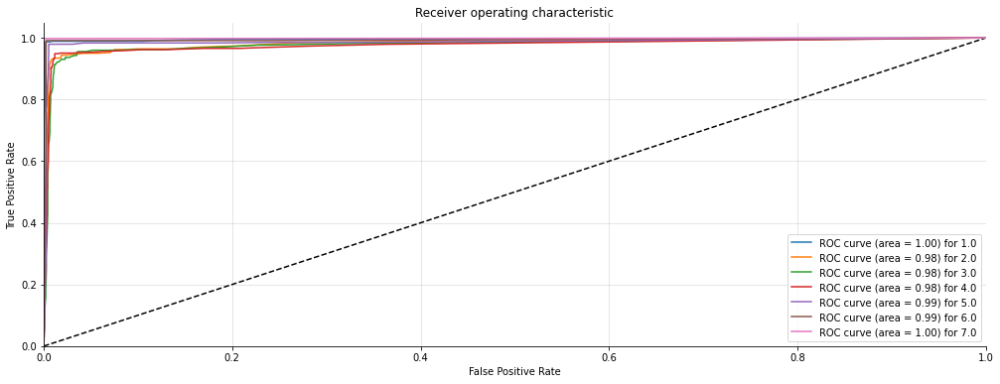

(3360, 7) (3360, 7)


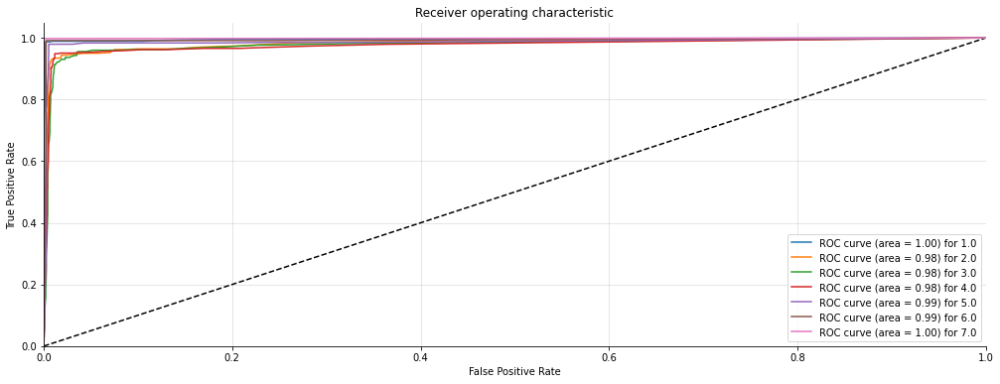

For column: usual<==>leading edge
              precision    recall  f1-score   support

         1.0       0.99      1.00      0.99       459
         2.0       0.99      0.98      0.98       496
         3.0       0.99      0.97      0.98       478
         4.0       0.98      0.99      0.99       523
         5.0       0.99      1.00      1.00       491
         6.0       1.00      1.00      1.00       462
         7.0       1.00      1.00      1.00       451

    accuracy                           0.99      3360
   macro avg       0.99      0.99      0.99      3360
weighted avg       0.99      0.99      0.99      3360

Confusion Matrix: 
 [[459   0   0   0   0   0   0]
 [  5 485   2   1   3   0   0]
 [  1   4 466   7   0   0   0]
 [  0   0   5 518   0   0   0]
 [  0   0   0   0 491   0   0]
 [  0   0   0   0   0 462   0]
 [  0   0   0   0   0   0 451]]
Accuracy Score : 0.9916666666666667
Precision Score : 0.9916696457944567
Recall Score : 0.9916666666666667
F1 Score : 0.99164862835

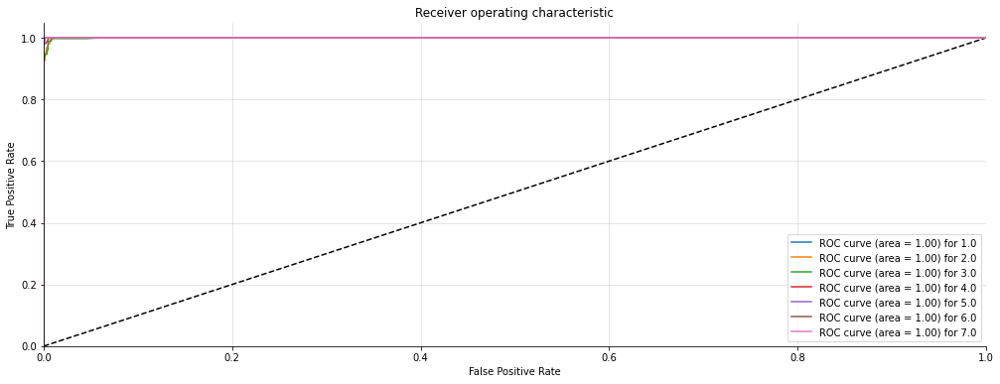

(3360, 7) (3360, 7)


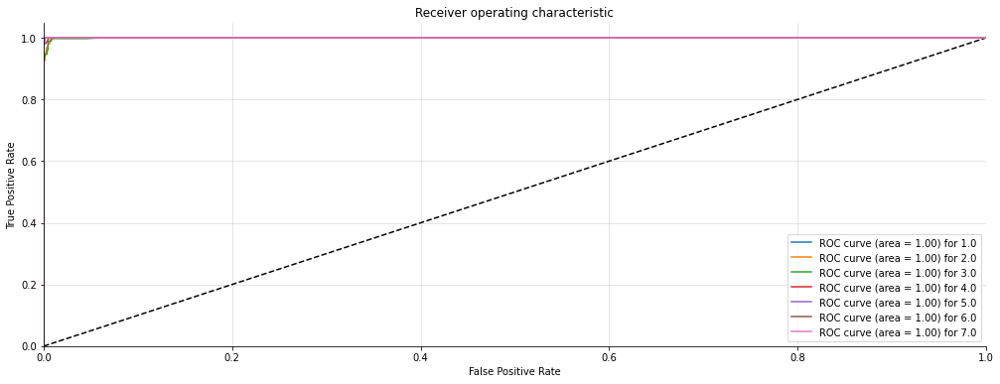

In [165]:
from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import plot_confusion_matrix, accuracy_score
acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]
fpo=dict()
tpo=dict()
ffpo=[]
ttpo=[]
def BAG(X_train, X_test, y_train, y_test, n_classes, figsize=(8, 6)):
    model = BaggingClassifier(KNeighborsClassifier(), max_samples=0.5, max_features=0.5)   
    model.fit(X_train, y_train)

    # predictions over test set
    predictions = [round(float(x)) for x in model.predict(X_test)]
    print((classification_report(y_test, predictions)))


    # calculating Accuracy Score, Precision Score, Recall Score and F1 Score
    print('Confusion Matrix: \n' ,confusion_matrix(y_test, predictions))
    acc.append(accuracy_score(y_test, predictions))
    print(f'Accuracy Score : {accuracy_score(y_test, predictions)}')
    pre.append(precision_score(y_test,predictions,average='weighted'))
    print('Precision Score : ' + str(precision_score(y_test,predictions,average='weighted')))
    recal.append(recall_score(y_test,predictions,average='weighted'))
    print('Recall Score : ' + str(recall_score(y_test,predictions,average='weighted')))
    f1.append(f1_score(y_test,predictions,average='weighted'))
    print('F1 Score : ' + str(f1_score(y_test,predictions,average='weighted')))
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    n_scores = cross_val_score(model, X_train, y_train, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
    # report performance
    print('Accuracy: %.3f (%.3f)' % (np.mean(n_scores), np.std(n_scores)))
    rms.append(np.sqrt(mean_squared_error(y_test,predictions)))
    aucscore.append(score_auc(y_test,predictions))
    fpo,tpo=plot_multiclass_roc(model, X_test, y_test, n_classes)
    ffpo.append(fpo)
    ttpo.append(tpo)
    plot_multiclass_roc(model, X_test, y_test, n_classes)

for i in range(8):
  print('For column:', df.columns[1:][i])
  n_classes = len(np.unique(df[df.columns[1:][i]]))
  BAG(X_train, X_test, y_train[:,i], y_test[:,i], n_classes, figsize=(8, 6))

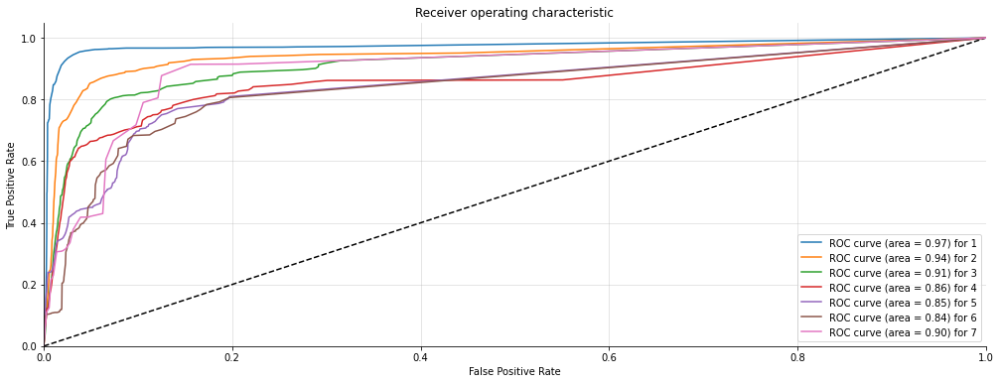

In [166]:
fsum0=list(np.array(dadd(dadd(dadd(ffpo[0][0],ffpo[1][0]),dadd(ffpo[2][0],ffpo[3][0])),dadd(dadd(ffpo[4][0],ffpo[5][0]),dadd(ffpo[6][0],ffpo[7][0]))))/8)
fsum1=list(np.array(dadd(dadd(dadd(ffpo[0][1],ffpo[1][1]),dadd(ffpo[2][1],ffpo[3][1])),dadd(dadd(ffpo[4][1],ffpo[5][1]),dadd(ffpo[6][1],ffpo[7][1]))))/8)
fsum2=list(np.array(dadd(dadd(dadd(ffpo[0][2],ffpo[1][2]),dadd(ffpo[2][2],ffpo[3][2])),dadd(dadd(ffpo[4][2],ffpo[5][2]),dadd(ffpo[6][2],ffpo[7][2]))))/8)
fsum3=list(np.array(dadd(dadd(dadd(ffpo[0][3],ffpo[1][3]),dadd(ffpo[2][3],ffpo[3][3])),dadd(dadd(ffpo[4][3],ffpo[5][3]),dadd(ffpo[6][3],ffpo[7][3]))))/8)
fsum4=list(np.array(dadd(dadd(dadd(ffpo[0][4],ffpo[1][4]),dadd(ffpo[2][4],ffpo[3][4])),dadd(dadd(ffpo[4][4],ffpo[5][4]),dadd(ffpo[6][4],ffpo[7][4]))))/8)
fsum5=list(np.array(dadd(dadd(dadd(ffpo[0][4],ffpo[1][5]),dadd(ffpo[2][5],ffpo[3][5])),dadd(dadd(ffpo[4][5],ffpo[5][5]),dadd(ffpo[6][5],ffpo[7][5]))))/8)
fsum6=list(np.array(dadd(dadd(dadd(ffpo[0][6],ffpo[1][6]),dadd(ffpo[2][6],ffpo[3][6])),dadd(dadd(ffpo[4][6],ffpo[5][6]),dadd(ffpo[6][6],ffpo[7][6]))))/8)

fpr=dict()
# a list containing 1 is added as the maximum value in fpr and tpr is around 0.26. when 1 is added to both fpr and tpr the curve gets completed.
 
fsum0.sort()
fpr[0]=fsum0+[1]
fsum1.sort()
fpr[1]=fsum1+[1]
fsum2.sort()
fpr[2]=fsum2+[1]
fsum3.sort()
fpr[3]=fsum3+[1]
fsum4.sort()
fpr[4]=fsum4+[1]
fsum5.sort()
fpr[5]=fsum5+[1]
fsum6.sort()
fpr[6]=fsum6+[1]


tsum0=list(np.array(dadd(dadd(dadd(ttpo[0][0],ttpo[1][0]),dadd(ttpo[2][0],ttpo[3][0])),dadd(dadd(ttpo[4][0],ttpo[5][0]),dadd(ttpo[6][0],ttpo[7][0]))))/8)
tsum1=list(np.array(dadd(dadd(dadd(ttpo[0][1],ttpo[1][1]),dadd(ttpo[2][1],ttpo[3][1])),dadd(dadd(ttpo[4][1],ttpo[5][1]),dadd(ttpo[6][1],ttpo[7][1]))))/8)
tsum2=list(np.array(dadd(dadd(dadd(ttpo[0][2],ttpo[1][2]),dadd(ttpo[2][2],ttpo[3][2])),dadd(dadd(ttpo[4][2],ttpo[5][2]),dadd(ttpo[6][2],ttpo[7][2]))))/8)
tsum3=list(np.array(dadd(dadd(dadd(ttpo[0][3],ttpo[1][3]),dadd(ttpo[2][3],ttpo[3][3])),dadd(dadd(ttpo[4][3],ttpo[5][3]),dadd(ttpo[6][3],ttpo[7][3]))))/8)
tsum4=list(np.array(dadd(dadd(dadd(ttpo[0][4],ttpo[1][4]),dadd(ttpo[2][4],ttpo[3][4])),dadd(dadd(ttpo[4][4],ttpo[5][4]),dadd(ttpo[6][4],ttpo[7][4]))))/8)
tsum5=list(np.array(dadd(dadd(dadd(ttpo[0][4],ttpo[1][5]),dadd(ttpo[2][5],ttpo[3][5])),dadd(dadd(ttpo[4][5],ttpo[5][5]),dadd(ttpo[6][5],ttpo[7][5]))))/8)
tsum6=list(np.array(dadd(dadd(dadd(ttpo[0][6],ttpo[1][6]),dadd(ttpo[2][6],ttpo[3][6])),dadd(dadd(ttpo[4][6],ttpo[5][6]),dadd(ttpo[6][6],ttpo[7][6]))))/8)

tpr=dict()

tsum0.sort()
tpr[0]=tsum0+[1]
tsum1.sort()
tpr[1]=tsum1+[1]
tsum2.sort()
tpr[2]=tsum2+[1]
tsum3.sort()
tpr[3]=tsum3+[1]
tsum4.sort()
tpr[4]=tsum4+[1]
tsum5.sort()
tpr[5]=tsum5+[1]
tsum6.sort()
tpr[6]=tsum6+[1]

plot_multiclass_roc_avg(fpr,tpr,7)

In [167]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE {}".format(np.mean(rms)))
print("average AUC score {}".format(np.mean(aucscore)))
metric_df['BaggingClassifier'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.8479166666666667
average Precision :0.8472186729608309
average Recall :0.8479166666666667
average F1 -score :0.847265557173306
average RMSE 0.6487413540259976
average AUC score 0.911074915489864


In [168]:
metric_df

,metric,Neural network classifier,XGB,SVM,OrdinalModel,LogisticModel,DecisionTreeclasssifier,RandomForestClassifier,ExtraTreesClassifier,BaggingClassifier
0,Accuracy,0.755357,0.860491,0.665774,0.860417,0.309375,0.860975,0.862872,0.860975,0.847917
1,Precision,0.767166,0.860062,0.687970,0.860033,0.278118,0.860529,0.862547,0.860529,0.847219
2,Recall,0.755357,0.860491,0.665774,0.860417,0.309375,0.860975,0.862872,0.860975,0.847917
3,F1 Score,0.758423,0.860101,0.661697,0.860029,0.278428,0.860529,0.862543,0.860529,0.847266
4,RMSE,0.788508,0.606180,1.465734,0.605807,2.475465,0.598955,0.599749,0.598955,0.648741
5,AUC score,0.856910,0.918426,0.805346,0.918382,0.597530,0.918703,0.919816,0.918703,0.911075


# CNN 1

In [106]:
# filters=250
# lstm_units=200
# kernel_size=4

In [107]:
# import nltk
# import spacy

In [108]:
# from sklearn.model_selection import train_test_split

# X_train, X_test, y_train, y_test = train_test_split(X, labels_processed, test_size=0.2, random_state=42)

# # Sanity check again and again
# print("Training examples:", X_train.shape)
# print("Training labels:", y_train.shape)
# print("Test examples:", X_test.shape)
# print("Test labels:", y_test.shape)

Training examples: (13440, 20)
Training labels: (13440, 8)
Test examples: (3360, 20)
Test labels: (3360, 8)


In [109]:
# word_index = tokenizer.word_index
# nlp = spacy.load("en_core_web_lg")

In [110]:
# text_embedding = np.zeros((len(word_index) + 1, 300))
# for word, i in word_index.items():
#    text_embedding[i] = nlp(word).vector

In [111]:
# from tensorflow.keras.models import Sequential,Model
# from tensorflow.keras.layers import Dense, LSTM, Embedding,Dropout,SpatialDropout1D,Conv1D,MaxPooling1D,GRU,BatchNormalization
# from tensorflow.keras.layers import Input,Bidirectional,GlobalAveragePooling1D,GlobalMaxPooling1D,concatenate,LeakyReLU
# from tensorflow.keras import regularizers
# from tensorflow.keras import backend as K
# model = Sequential()
# model.add(
# Embedding(input_dim=text_embedding.shape[0],
# output_dim=text_embedding.shape[1],
# weights=[text_embedding],
# input_length=20,
# trainable=False))
# # model.add(SpatialDropout1D(0.2))
# model.add(Conv1D(filters, kernel_size=kernel_size,kernel_regularizer=regularizers.l2(0.001), padding='same'))
# model.add(LeakyReLU(alpha=0.2))
# model.add(MaxPooling1D(pool_size=2))
# # model.add(Bidirectional(LSTM(lstm_units,dropout=0.5, recurrent_dropout=0.5,return_sequences=True)))
# # model.add(SpatialDropout1D(0.2))
# # model.add(Conv1D(filters, kernel_size=kernel_size,kernel_regularizer=regularizers.l2(0.01), padding='same'))
# # model.add(LeakyReLU(alpha=0.2))
# # model.add(MaxPooling1D(pool_size=2))
# # model.add(Bidirectional(LSTM(lstm_units,dropout=0.5, recurrent_dropout=0.5,return_sequences=True)))
# # model.add(SpatialDropout1D(0.2))
# model.add(Conv1D(filters, kernel_size=kernel_size,kernel_regularizer=regularizers.l2(0.001), padding='same'))
# model.add(LeakyReLU(alpha=0.2))
# model.add(MaxPooling1D(pool_size=2))
# model.add(Bidirectional(LSTM(lstm_units,dropout=0.5, recurrent_dropout=0.5)))
# model.add(Dense(8,activation='softmax'))
# model.compile(optimizer='adam',loss=tf.keras.losses.MeanSquaredError(), metrics=['mae'])

In [112]:
# model = Sequential()
 
# model.add(
# Embedding(input_dim=text_embedding.shape[0],
# output_dim=text_embedding.shape[1],
# weights=[text_embedding],
# input_length=20,
# trainable=False))
# model.add(Conv1D(filters,
# kernel_size,
# padding='valid',
# activation='relu',
# strides=1))
# # we use max pooling:
# model.add(GlobalMaxPooling1D())
# # We add a hidden layer:
# model.add(Dense(lstm_units))
# #dropout layer woth 20% dropout rate
# model.add(Dropout(0.2))
# model.add(Activation('relu'))
# #output layer
# model.add(Dense(8))
# model.add(Activation('softmax'))
# model.compile(optimizer='adam',loss=tf.keras.losses.MeanSquaredError(), metrics=['mae'])
              

In [113]:
# model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_3 (Embedding)      (None, 20, 300)           645300    
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 17, 250)           300250    
_________________________________________________________________
global_max_pooling1d (Global (None, 250)               0         
_________________________________________________________________
dense_21 (Dense)             (None, 200)               50200     
_________________________________________________________________
dropout_11 (Dropout)         (None, 200)               0         
_________________________________________________________________
module_wrapper (ModuleWrappe (None, 200)               0         
_________________________________________________________________
dense_22 (Dense)             (None, 8)                

In [114]:
# history = model.fit(X_train, y_train, epochs=100, batch_size = 512, validation_split=0.2, 
#                     callbacks = [es], # Call checkpoint variable if neccessary
#                     verbose=1)

Epoch 1/100
21/21 [==============================] - 2s 84ms/step - loss: 19.1323 - mae: 3.8816 - val_loss: 18.9656 - val_mae: 3.8820
Epoch 2/100
21/21 [==============================] - 2s 84ms/step - loss: 19.1271 - mae: 3.8816 - val_loss: 18.9648 - val_mae: 3.8820
Epoch 3/100
21/21 [==============================] - 2s 83ms/step - loss: 19.1234 - mae: 3.8816 - val_loss: 18.9662 - val_mae: 3.8820
Epoch 4/100
21/21 [==============================] - 2s 101ms/step - loss: 19.1207 - mae: 3.8816 - val_loss: 18.9669 - val_mae: 3.8820
Epoch 5/100
21/21 [==============================] - 2s 98ms/step - loss: 19.1188 - mae: 3.8816 - val_loss: 18.9661 - val_mae: 3.8820
Epoch 6/100
21/21 [==============================] - 2s 94ms/step - loss: 19.1179 - mae: 3.8816 - val_loss: 18.9686 - val_mae: 3.8820
Epoch 7/100
21/21 [==============================] - 2s 83ms/step - loss: 19.1172 - mae: 3.8816 - val_loss: 18.9735 - val_mae: 3.8820
Epoch 8/100
21/21 [==============================] - 2s 93ms/

In [115]:
# scores = model.evaluate(
#     X_test, y_test, batch_size=1, verbose=1, sample_weight=None, steps=None,
#     callbacks=None, max_queue_size=10, workers=4, use_multiprocessing=False,
#     return_dict=False
# )
# print("------------------ EVALUATION FINISHED! ------------------".center(115))
# for i in range(len(scores)):
#     print("%s: %.2f%%" % (model.metrics_names[i], scores[i]*100))

3360/3360 [==============================] - 4s 1ms/step - loss: 18.6888 - mae: 3.8481
                             ------------------ EVALUATION FINISHED! ------------------                            
loss: 1868.88%
mae: 384.81%


In [116]:
# from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score, classification_report
# from sklearn.metrics import plot_confusion_matrix, accuracy_score
# from sklearn.metrics import mean_squared_error
# acc=[]
# pre=[]
# recal=[]
# f1=[]
# rms=[]
# aucscore=[]

In [117]:
# from sklearn.metrics import classification_report, f1_score
# y_pred = model.predict(X_test)
# for i in range(8):
#     print("Column", df.columns[1:][i])
#     estimates = [round(float(x)) for x in y_pred[:,i]]
#     estimates = transform_results(estimates)
#     print(np.unique(estimates))
#     acc.append(accuracy_score(y_test[:,i], estimates))
#     pre.append(precision_score(y_test[:,i], estimates,average='weighted'))
#     recal.append(recall_score(y_test[:,i], estimates,average='weighted'))
#     f1.append(f1_score(y_test[:,i], estimates,average='weighted'))
#     rms.append(np.sqrt(mean_squared_error(y_test[:,i], estimates)))
#     aucscore.append(score_auc(y_test[:,i], estimates))
#     print(classification_report(y_test[:,i], estimates), "\n------")

Column obstructive<==>supportive
[0]
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00       0.0
         1.0       0.00      0.00      0.00     462.0
         2.0       0.00      0.00      0.00     482.0
         3.0       0.00      0.00      0.00     510.0
         4.0       0.00      0.00      0.00     517.0
         5.0       0.00      0.00      0.00     467.0
         6.0       0.00      0.00      0.00     470.0
         7.0       0.00      0.00      0.00     452.0

    accuracy                           0.00    3360.0
   macro avg       0.00      0.00      0.00    3360.0
weighted avg       0.00      0.00      0.00    3360.0
 
------
Column complicated<==>easy
[0]
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00       0.0
         1.0       0.00      0.00      0.00     463.0
         2.0       0.00      0.00      0.00     485.0
         3.0       0.00      0.00      0.00     501.0
  

In [118]:
# print("average Accuracy :{}".format(np.mean(acc)))
# print("average Precision :{}".format(np.mean(pre)))
# print("average Recall :{}".format(np.mean(recal)))
# print("average F1 -score :{}".format(np.mean(f1)))
# print("average RMSE -score :{}".format(np.mean(rms)))
# print("average AUC -score :{}".format(np.mean(aucscore)))
# metric_df['CNN classifier'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.0
average Precision :0.0
average Recall :0.0
average F1 -score :0.0
average RMSE -score :4.434206863533574
average AUC -score :0.49999408406429147


In [119]:
metric_df

,metric,Neural network classifier,XGB,SVM,OrdinalModel,Bidirectional LSTM,RBFN,LogisticModel,Neural Network classifier 2,Bidirectional LSTM 2,DecisionTreeclasssifier,RandomForestClassifier,ExtraTreesClassifier,AdaBoost,GradientBoost,BaggingClassifier,CNN classifier
0,Accuracy,0.753051,0.863058,0.661979,0.862054,0.797842,0.188765,0.310305,0.800298,0.791257,0.861049,0.861868,0.860900,0.347098,0.563393,0.849591,0.000000
1,Precision,0.767403,0.863102,0.690407,0.862013,0.804331,0.664074,0.285199,0.808152,0.801958,0.860851,0.861873,0.860706,0.371752,0.551159,0.849161,0.000000
2,Recall,0.753051,0.863058,0.661979,0.862054,0.797842,0.188765,0.310305,0.800298,0.791257,0.861049,0.861868,0.860900,0.347098,0.563393,0.849591,0.000000
3,F1 Score,0.755043,0.862912,0.658335,0.861883,0.798158,0.105427,0.280362,0.800609,0.792897,0.860704,0.861739,0.860556,0.352468,0.550290,0.849153,0.000000
4,RMSE,0.781938,0.601694,1.450794,0.601928,0.686905,1.908164,2.431523,0.691063,0.681794,0.602019,0.609731,0.602399,2.076554,1.522995,0.646949,4.434207
5,AUC score,0.855624,0.919934,0.803131,0.919341,0.881656,0.520147,0.597932,0.883074,0.877817,0.918756,0.919235,0.918669,0.618581,0.745124,0.912053,0.499994


# CNN -1

In [83]:
from keras import Sequential
from keras.layers import Embedding,Dropout,Conv1D,MaxPooling1D,LSTM,Dense,Bidirectional


In [141]:
# df1=df[['Requirements','obstructive<==>supportive']]

In [220]:
# one_hot = pd.get_dummies(df1["obstructive<==>supportive"])
# df1.drop(['obstructive<==>supportive'],axis=1,inplace=True)
# df1 = pd.concat([df1,one_hot],axis=1)
# df1.head()

KeyError: 'obstructive<==>supportive'

In [219]:
#  df1.drop(['Requirements'],axis=1).values

array([[0, 0, 1, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 1],
       [0, 0, 0, ..., 0, 0, 1],
       ...,
       [0, 0, 0, ..., 0, 0, 1],
       [0, 0, 0, ..., 0, 1, 0],
       [0, 0, 0, ..., 0, 0, 1]], dtype=uint8)

In [147]:
# X_train, X_test, y_train, y_test = train_test_split(df1["Requirements"].values, df1.drop(['Requirements'],axis=1).values, test_size=0.2, random_state=42)

In [148]:
# vocabulary_size = 2000
# tokenizer = Tokenizer(num_words= vocabulary_size)
# tokenizer.fit_on_texts(X_train)
# sequences = tokenizer.texts_to_sequences(X_train)
# X_train = pad_sequences(sequences, maxlen=20)

In [149]:
# sequences = tokenizer.texts_to_sequences(X_test)
# X_test = pad_sequences(sequences, maxlen=20)

In [279]:
model = Sequential()
model.add(Embedding(20000, 100, input_length=20))
model.add(Dropout(0.2))
model.add(Conv1D(128, 5, activation='relu'))
model.add(MaxPooling1D(pool_size=2))
model.add(LSTM(100))
model.add(Dense(7, activation='softmax'))
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
model.fit(X_train,  pd.get_dummies(y_train[:,0]),
                    batch_size=512,
                    epochs=10,
                    verbose=1,
                    validation_split=0.2)

Epoch 1/10
21/21 [==============================] - 4s 121ms/step - loss: 1.8684 - accuracy: 0.2479 - val_loss: 1.7183 - val_accuracy: 0.2693
Epoch 2/10
21/21 [==============================] - 2s 96ms/step - loss: 1.6000 - accuracy: 0.3829 - val_loss: 1.4571 - val_accuracy: 0.4963
Epoch 3/10
21/21 [==============================] - 2s 97ms/step - loss: 1.1581 - accuracy: 0.5902 - val_loss: 0.9961 - val_accuracy: 0.6321
Epoch 4/10
21/21 [==============================] - 2s 95ms/step - loss: 0.8709 - accuracy: 0.6906 - val_loss: 0.8595 - val_accuracy: 0.7091
Epoch 5/10
21/21 [==============================] - 2s 94ms/step - loss: 0.7506 - accuracy: 0.7413 - val_loss: 0.7992 - val_accuracy: 0.7385
Epoch 6/10
21/21 [==============================] - 2s 96ms/step - loss: 0.7025 - accuracy: 0.7600 - val_loss: 0.7610 - val_accuracy: 0.7530
Epoch 7/10
21/21 [==============================] - 2s 110ms/step - loss: 0.6730 - accuracy: 0.7663 - val_loss: 0.7346 - val_accuracy: 0.7541
Epoch 8/10


In [280]:
scores = model.evaluate(
    X_test, pd.get_dummies(y_test[:,0]), batch_size=1, verbose=1, sample_weight=None, steps=None,
    callbacks=None, max_queue_size=10, workers=4, use_multiprocessing=False,
    return_dict=False
)
print("------------------ EVALUATION FINISHED! ------------------".center(115))
for i in range(len(scores)):
    print("%s: %.2f%%" % (model.metrics_names[i], scores[i]*100))

3360/3360 [==============================] - 5s 1ms/step - loss: 0.7194 - accuracy: 0.7673
                             ------------------ EVALUATION FINISHED! ------------------                            
loss: 71.94%
accuracy: 76.73%


In [281]:

acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]
estimates = np.argmax(model.predict(X_test),axis=1)
acc.append(accuracy_score(y_test[:,0], estimates))
pre.append(precision_score(y_test[:,0], estimates,average='weighted'))
recal.append(recall_score(y_test[:,0], estimates,average='weighted'))
f1.append(f1_score(y_test[:,0], estimates,average='weighted'))
rms.append(np.sqrt(mean_squared_error(y_test[:,0], estimates)))
aucscore.append(score_auc(y_test[:,0], estimates))


In [282]:
model = Sequential()
model.add(Embedding(20000, 100, input_length=20))
model.add(Dropout(0.2))
model.add(Conv1D(128, 5, activation='relu'))
model.add(MaxPooling1D(pool_size=2))
model.add(LSTM(100))
model.add(Dense(7, activation='softmax'))
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
model.fit(X_train,  pd.get_dummies(y_train[:,1]),
                    batch_size=512,
                    epochs=10,
                    verbose=1,
                    validation_split=0.2)

Epoch 1/10
21/21 [==============================] - 4s 119ms/step - loss: 1.8594 - accuracy: 0.2334 - val_loss: 1.6795 - val_accuracy: 0.2772
Epoch 2/10
21/21 [==============================] - 2s 117ms/step - loss: 1.6023 - accuracy: 0.3374 - val_loss: 1.5532 - val_accuracy: 0.4092
Epoch 3/10
21/21 [==============================] - 2s 106ms/step - loss: 1.2586 - accuracy: 0.5565 - val_loss: 1.0423 - val_accuracy: 0.6336
Epoch 4/10
21/21 [==============================] - 2s 111ms/step - loss: 0.8414 - accuracy: 0.7130 - val_loss: 0.8478 - val_accuracy: 0.7228
Epoch 5/10
21/21 [==============================] - 2s 111ms/step - loss: 0.6945 - accuracy: 0.7745 - val_loss: 0.7473 - val_accuracy: 0.7749
Epoch 6/10
21/21 [==============================] - 2s 117ms/step - loss: 0.6365 - accuracy: 0.8010 - val_loss: 0.7140 - val_accuracy: 0.7809
Epoch 7/10
21/21 [==============================] - 2s 104ms/step - loss: 0.6103 - accuracy: 0.8061 - val_loss: 0.6870 - val_accuracy: 0.7946
Epoch 

In [283]:
estimates = np.argmax(model.predict(X_test),axis=1)
acc.append(accuracy_score(y_test[:,1], estimates))
pre.append(precision_score(y_test[:,1], estimates,average='weighted'))
recal.append(recall_score(y_test[:,1], estimates,average='weighted'))
f1.append(f1_score(y_test[:,1], estimates,average='weighted'))
rms.append(np.sqrt(mean_squared_error(y_test[:,1], estimates)))
aucscore.append(score_auc(y_test[:,1], estimates))

In [284]:
model = Sequential()
model.add(Embedding(20000, 100, input_length=20))
model.add(Dropout(0.2))
model.add(Conv1D(128, 5, activation='relu'))
model.add(MaxPooling1D(pool_size=2))
model.add(LSTM(100))
model.add(Dense(7, activation='softmax'))
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
model.fit(X_train,  pd.get_dummies(y_train[:,2]),
                    batch_size=512,
                    epochs=10,
                    verbose=1,
                    validation_split=0.2)

Epoch 1/10
21/21 [==============================] - 4s 121ms/step - loss: 1.8800 - accuracy: 0.2216 - val_loss: 1.7340 - val_accuracy: 0.2563
Epoch 2/10
21/21 [==============================] - 2s 95ms/step - loss: 1.5991 - accuracy: 0.3864 - val_loss: 1.4525 - val_accuracy: 0.4758
Epoch 3/10
21/21 [==============================] - 2s 104ms/step - loss: 1.1791 - accuracy: 0.5825 - val_loss: 1.0541 - val_accuracy: 0.6250
Epoch 4/10
21/21 [==============================] - 2s 96ms/step - loss: 0.8856 - accuracy: 0.6862 - val_loss: 0.8702 - val_accuracy: 0.7121
Epoch 5/10
21/21 [==============================] - 2s 97ms/step - loss: 0.7557 - accuracy: 0.7390 - val_loss: 0.7989 - val_accuracy: 0.7359
Epoch 6/10
21/21 [==============================] - 2s 101ms/step - loss: 0.6957 - accuracy: 0.7628 - val_loss: 0.7653 - val_accuracy: 0.7493
Epoch 7/10
21/21 [==============================] - 2s 104ms/step - loss: 0.6693 - accuracy: 0.7696 - val_loss: 0.7406 - val_accuracy: 0.7608
Epoch 8/1

In [285]:
estimates = np.argmax(model.predict(X_test),axis=1)
acc.append(accuracy_score(y_test[:,2], estimates))
pre.append(precision_score(y_test[:,2], estimates,average='weighted'))
recal.append(recall_score(y_test[:,2], estimates,average='weighted'))
f1.append(f1_score(y_test[:,2], estimates,average='weighted'))
rms.append(np.sqrt(mean_squared_error(y_test[:,2], estimates)))
aucscore.append(score_auc(y_test[:,2], estimates))

In [286]:
model = Sequential()
model.add(Embedding(20000, 100, input_length=20))
model.add(Dropout(0.2))
model.add(Conv1D(128, 5, activation='relu'))
model.add(MaxPooling1D(pool_size=2))
model.add(LSTM(100))
model.add(Dense(7, activation='softmax'))
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
model.fit(X_train,  pd.get_dummies(y_train[:,3]),
                    batch_size=512,
                    epochs=10,
                    verbose=1,
                    validation_split=0.2)

Epoch 1/10
21/21 [==============================] - 4s 116ms/step - loss: 1.8714 - accuracy: 0.2260 - val_loss: 1.7187 - val_accuracy: 0.2812
Epoch 2/10
21/21 [==============================] - 2s 96ms/step - loss: 1.5778 - accuracy: 0.4015 - val_loss: 1.3824 - val_accuracy: 0.5126
Epoch 3/10
21/21 [==============================] - 2s 99ms/step - loss: 1.1087 - accuracy: 0.5835 - val_loss: 0.9800 - val_accuracy: 0.6562
Epoch 4/10
21/21 [==============================] - 2s 103ms/step - loss: 0.8493 - accuracy: 0.6978 - val_loss: 0.8578 - val_accuracy: 0.7169
Epoch 5/10
21/21 [==============================] - 2s 96ms/step - loss: 0.7458 - accuracy: 0.7457 - val_loss: 0.7914 - val_accuracy: 0.7474
Epoch 6/10
21/21 [==============================] - 2s 106ms/step - loss: 0.7002 - accuracy: 0.7589 - val_loss: 0.7722 - val_accuracy: 0.7429
Epoch 7/10
21/21 [==============================] - 2s 100ms/step - loss: 0.6709 - accuracy: 0.7692 - val_loss: 0.7323 - val_accuracy: 0.7645
Epoch 8/1

In [287]:
estimates = np.argmax(model.predict(X_test),axis=1)
acc.append(accuracy_score(y_test[:,3], estimates))
pre.append(precision_score(y_test[:,3], estimates,average='weighted'))
recal.append(recall_score(y_test[:,3], estimates,average='weighted'))
f1.append(f1_score(y_test[:,3], estimates,average='weighted'))
rms.append(np.sqrt(mean_squared_error(y_test[:,3], estimates)))
aucscore.append(score_auc(y_test[:,3], estimates))

In [288]:
model = Sequential()
model.add(Embedding(20000, 100, input_length=20))
model.add(Dropout(0.2))
model.add(Conv1D(128, 5, activation='relu'))
model.add(MaxPooling1D(pool_size=2))
model.add(LSTM(100))
model.add(Dense(7, activation='softmax'))
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
model.fit(X_train,  pd.get_dummies(y_train[:,4]),
                    batch_size=512,
                    epochs=10,
                    verbose=1,
                    validation_split=0.2)

Epoch 1/10
21/21 [==============================] - 5s 145ms/step - loss: 1.8589 - accuracy: 0.2723 - val_loss: 1.6279 - val_accuracy: 0.3229
Epoch 2/10
21/21 [==============================] - 2s 120ms/step - loss: 1.4667 - accuracy: 0.4151 - val_loss: 1.2799 - val_accuracy: 0.4970
Epoch 3/10
21/21 [==============================] - 2s 98ms/step - loss: 0.9310 - accuracy: 0.6722 - val_loss: 0.7091 - val_accuracy: 0.7623
Epoch 4/10
21/21 [==============================] - 2s 99ms/step - loss: 0.5992 - accuracy: 0.8151 - val_loss: 0.5610 - val_accuracy: 0.8374
Epoch 5/10
21/21 [==============================] - 2s 110ms/step - loss: 0.4826 - accuracy: 0.8656 - val_loss: 0.4770 - val_accuracy: 0.8795
Epoch 6/10
21/21 [==============================] - 2s 100ms/step - loss: 0.4239 - accuracy: 0.8927 - val_loss: 0.4462 - val_accuracy: 0.8906
Epoch 7/10
21/21 [==============================] - 2s 100ms/step - loss: 0.3972 - accuracy: 0.9030 - val_loss: 0.4296 - val_accuracy: 0.8981
Epoch 8/

In [289]:
estimates = np.argmax(model.predict(X_test),axis=1)
acc.append(accuracy_score(y_test[:,4], estimates))
pre.append(precision_score(y_test[:,4], estimates,average='weighted'))
recal.append(recall_score(y_test[:,4], estimates,average='weighted'))
f1.append(f1_score(y_test[:,4], estimates,average='weighted'))
rms.append(np.sqrt(mean_squared_error(y_test[:,4], estimates)))
aucscore.append(score_auc(y_test[:,4], estimates))

In [290]:
model = Sequential()
model.add(Embedding(20000, 100, input_length=20))
model.add(Dropout(0.2))
model.add(Conv1D(128, 5, activation='relu'))
model.add(MaxPooling1D(pool_size=2))
model.add(LSTM(100))
model.add(Dense(7, activation='softmax'))
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
model.fit(X_train,  pd.get_dummies(y_train[:,5]),
                    batch_size=512,
                    epochs=10,
                    verbose=1,
                    validation_split=0.2)

Epoch 1/10
21/21 [==============================] - 4s 130ms/step - loss: 1.8516 - accuracy: 0.2429 - val_loss: 1.6197 - val_accuracy: 0.2693
Epoch 2/10
21/21 [==============================] - 2s 101ms/step - loss: 1.4577 - accuracy: 0.4312 - val_loss: 1.2592 - val_accuracy: 0.5004
Epoch 3/10
21/21 [==============================] - 2s 103ms/step - loss: 0.9691 - accuracy: 0.6302 - val_loss: 0.7718 - val_accuracy: 0.7269
Epoch 4/10
21/21 [==============================] - 2s 102ms/step - loss: 0.6492 - accuracy: 0.7849 - val_loss: 0.5850 - val_accuracy: 0.8367
Epoch 5/10
21/21 [==============================] - 2s 105ms/step - loss: 0.5105 - accuracy: 0.8523 - val_loss: 0.5071 - val_accuracy: 0.8720
Epoch 6/10
21/21 [==============================] - 2s 113ms/step - loss: 0.4386 - accuracy: 0.8865 - val_loss: 0.4702 - val_accuracy: 0.8839
Epoch 7/10
21/21 [==============================] - 3s 122ms/step - loss: 0.4117 - accuracy: 0.8947 - val_loss: 0.4664 - val_accuracy: 0.8873
Epoch 

In [291]:
estimates = np.argmax(model.predict(X_test),axis=1)
acc.append(accuracy_score(y_test[:,5], estimates))
pre.append(precision_score(y_test[:,5], estimates,average='weighted'))
recal.append(recall_score(y_test[:,5], estimates,average='weighted'))
f1.append(f1_score(y_test[:,5], estimates,average='weighted'))
rms.append(np.sqrt(mean_squared_error(y_test[:,5], estimates)))
aucscore.append(score_auc(y_test[:,5], estimates))

In [292]:
model = Sequential()
model.add(Embedding(20000, 100, input_length=20))
model.add(Dropout(0.2))
model.add(Conv1D(128, 5, activation='relu'))
model.add(MaxPooling1D(pool_size=2))
model.add(LSTM(100))
model.add(Dense(7, activation='softmax'))
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
model.fit(X_train,  pd.get_dummies(y_train[:,6]),
                    batch_size=512,
                    epochs=10,
                    verbose=1,
                    validation_split=0.2)

Epoch 1/10
21/21 [==============================] - 4s 123ms/step - loss: 1.8564 - accuracy: 0.2932 - val_loss: 1.6129 - val_accuracy: 0.3783
Epoch 2/10
21/21 [==============================] - 2s 106ms/step - loss: 1.3413 - accuracy: 0.5060 - val_loss: 0.9840 - val_accuracy: 0.6399
Epoch 3/10
21/21 [==============================] - 2s 104ms/step - loss: 0.7023 - accuracy: 0.7408 - val_loss: 0.5002 - val_accuracy: 0.8374
Epoch 4/10
21/21 [==============================] - 2s 96ms/step - loss: 0.3743 - accuracy: 0.8820 - val_loss: 0.3256 - val_accuracy: 0.9096
Epoch 5/10
21/21 [==============================] - 2s 102ms/step - loss: 0.2494 - accuracy: 0.9318 - val_loss: 0.2620 - val_accuracy: 0.9323
Epoch 6/10
21/21 [==============================] - 2s 111ms/step - loss: 0.1962 - accuracy: 0.9510 - val_loss: 0.2195 - val_accuracy: 0.9542
Epoch 7/10
21/21 [==============================] - 2s 108ms/step - loss: 0.1752 - accuracy: 0.9585 - val_loss: 0.2158 - val_accuracy: 0.9550
Epoch 8

In [293]:
estimates = np.argmax(model.predict(X_test),axis=1)
acc.append(accuracy_score(y_test[:,6], estimates))
pre.append(precision_score(y_test[:,6], estimates,average='weighted'))
recal.append(recall_score(y_test[:,6], estimates,average='weighted'))
f1.append(f1_score(y_test[:,6], estimates,average='weighted'))
rms.append(np.sqrt(mean_squared_error(y_test[:,6], estimates)))
aucscore.append(score_auc(y_test[:,6], estimates))

In [294]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE {}".format(np.mean(rms)))
print("average AUC score {}".format(np.mean(aucscore)))
metric_df['CNN'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.1034013605442177
average Precision :0.10599388434124297
average Recall :0.1034013605442177
average F1 -score :0.10449402627145814
average RMSE 1.248177419254755
average AUC score 0.4878364852630243


#  Metric Display

In [ ]:
metric_df

In [144]:
# col=df.columns

In [278]:
# from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score, classification_report,mean_squared_error
# from sklearn.metrics import plot_confusion_matrix, accuracy_score
# from sklearn.preprocessing import LabelBinarizer
# from sklearn.metrics import roc_curve, auc, roc_auc_score

# acc=[]
# pre=[]
# recal=[]
# f1=[]
# rms=[]
# aucscore=[]
# fpo=dict()
# tpo=dict()
# ffpo=[]
# ttpo=[]
# def CNN(X_train, X_test, y_train, y_test,y, n_classes, figsize=(8, 6)):
#     model = Sequential()
#     model.add(Embedding(20000, 100, input_length=20))
#     model.add(Dropout(0.2))
#     model.add(Conv1D(128, 5, activation='relu'))
#     model.add(MaxPooling1D(pool_size=2))
#     model.add(LSTM(100))
#     model.add(Dense(7, activation='softmax'))
    
#     model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

#     model.fit(X_train, y_train,
#                     batch_size=512,
#                     epochs=5,
#                     verbose=1,
#                     validation_split=0.1)
# #     print(y_test.shape)
# #     y_test=np.argmax(y_test,axis=1)
    
# #     # predictions over test set
#     predictions = np.argmax(model.predict(X_test),axis=1)
#     print((classification_report(y, predictions)))


#     # calculating Accuracy Score, Precision Score, Recall Score and F1 Score
#     print('Confusion Matrix: \n' ,confusion_matrix(y, predictions))
# #     acc.append(accuracy_score(y, predictions))
# #     print(f'Accuracy Score : {accuracy_score(y, predictions)}')
# #     pre.append(precision_score(y,predictions,average='weighted'))
# #     print('Precision Score : ' + str(precision_score(y,predictions,average='weighted')))
# #     recal.append(recall_score(y,predictions,average='weighted'))
# #     print('Recall Score : ' + str(recall_score(y,predictions,average='weighted')))
# #     f1.append(f1_score(y,predictions,average='weighted'))
# #     print('F1 Score : ' + str(f1_score(y,predictions,average='weighted')))
# #     rms.append(np.sqrt(mean_squared_error(y,predictions)))
# #     aucscore.append(score_auc(y,predictions))
# #     fpo,tpo=plot_multiclass_roc(model, X_test, y, n_classes)
# #     ffpo.append(fpo)
# #     ttpo.append(tpo)


# i=0
# for x in col[1:]:    
# #     X_train, X_test, y_train, y_test = train_test_split(df1["Requirements"].values, pd.get_dummies(df[x]).values, test_size=0.2, random_state=42)
# #     tokenizer.fit_on_texts(X_train)
# #     sequences = tokenizer.texts_to_sequences(X_train)
# #     X_train = pad_sequences(sequences, maxlen=20)
# #     sequences = tokenizer.texts_to_sequences(X_test)
# #     X_test = pad_sequences(sequences, maxlen=20)
#     print('For column:', x)
#     n_classes = len(np.unique(df[x]))
#     CNN(X_train, X_test, pd.get_dummies(y_train[:,i]), pd.get_dummies(y_test[:,i]),y_test[:,i], n_classes, figsize=(8, 6))
#     i=i+1




# # for x in col[1:]:    
# #     X_train, X_test, y_train, y_test = train_test_split(df1["Requirements"].values, pd.get_dummies(df[x]).values, test_size=0.2, random_state=42)
# #     tokenizer.fit_on_texts(X_train)
# #     sequences = tokenizer.texts_to_sequences(X_train)
# #     X_train = pad_sequences(sequences, maxlen=20)
# #     sequences = tokenizer.texts_to_sequences(X_test)
# #     X_test = pad_sequences(sequences, maxlen=20)
# #     print('For column:', x)
# #     n_classes = len(np.unique(df[x]))
# #     CNN(X_train, X_test, y_train, y_test, n_classes, figsize=(8, 6))

In [ ]:
def fsum(o):
  a= []

  for x in df.columns[1:]:
      k = df[x].unique()
      k = sorted(k)
  
      if o in k:
        i = df.columns.get_loc(x)
        j = k.index(o)      
        a.append(ffpo[i-1][j])
  if len(a)>2:
    for x in range(len(a)) :
      k = dadd(a[x],a[x+1])
      k = dadd(k,a[x+2])
      if x+2 == len(a)-1:
        break
    k = list(np.array(k)/len(a))
  elif len(a) == 2:
    k = dadd(a[0],a[1])
    k = list(np.array(k)/len(a))
  else:
    k = a
  return k

